In [2]:
import pandas as pd 
import numpy as np 
from  math import *
from scipy.interpolate import interp1d

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
import warnings
warnings.filterwarnings("ignore")
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import cross_val_score
import scipy.stats as stat
import pylab
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, roc_auc_score, recall_score, precision_score, confusion_matrix, f1_score, precision_recall_curve, roc_curve, plot_roc_curve, plot_precision_recall_curve
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import PowerTransformer
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
from sklearn.metrics import classification_report,confusion_matrix,plot_confusion_matrix
from sklearn.model_selection import cross_val_score


In [4]:
df  = pd.read_csv("staggered_RAW_DATA.csv")

In [5]:
df  = df.convert_dtypes()

In [6]:
df

,filling,PPI,Porosity,P/L,h_wall,Nu_wall,DeltaT
0,1.0,5,0.8,457.891233,26.224101,8.190942,8.643194
1,1.0,10,0.8,1379.951933,30.962416,9.670926,7.320488
2,1.0,15,0.8,2739.221533,33.169437,10.360276,6.833399
3,1.0,20,0.8,4526.8568,34.415382,10.749439,6.586008
4,1.0,25,0.8,6738.152,35.198431,10.99402,6.439492
...,...,...,...,...,...,...,...
75,0.25,5,0.95,34.908639,17.638211,21.123863,12.850509
76,0.25,10,0.95,100.303273,20.67384,24.75939,10.963614
77,0.25,15,0.95,194.66478,22.303387,26.710967,10.162582
78,0.25,20,0.95,317.425527,23.306586,27.912418,9.725148


## PROGRAM FOR INTERPOLATION 

In [252]:
x = df['h_wall']

In [253]:
x


0     20.955562
1     26.142631
2     29.034629
3     30.885388
4     32.165965
        ...    
75    14.789964
76    17.660218
77    19.447801
78    20.695163
79    21.616499
Name: h_wall, Length: 80, dtype: Float64

In [254]:
y1  = df['P/L']

In [255]:
f = interp1d(x, y1)

In [256]:
def interploate(y ,x1 , y1 , x2 , y2):
    x = (x1*(y-y2) - x2*(y-y1))/(y1-y2)
    return x

In [257]:
y1 = 0.80
y2 = 0.85
y = 0.845


nu1 = []
nu2 =[]
h1=[]
h2=[]
P1 =[]
P2 =[]
for  i in  range(len(df['Porosity'])):
    if df['Porosity'][i]==y1:
        nu1.append(df['Nu_wall'][i])
        h1.append(df['h_wall'][i])
        P1.append(df['P/L'][i])
    if df['Porosity'][i]==y2:
        nu2.append(df['Nu_wall'][i])
        h2.append(df['h_wall'][i])
        P2.append(df['P/L'][i])
arr = [] 
for i in  range(len(nu1)):
    arr.append(interploate(y ,float(nu1[i]) ,y1 ,float(nu2[i]), y2))
arr



[10.281820829299999,
 12.8249504333,
 14.226808028999999,
 15.116707276899996,
 15.728706487999998,
 9.7070674709,
 12.3245863582,
 13.833127636699999,
 14.8201103264,
 15.5132299042,
 8.181987605,
 10.0137848398,
 11.106065522299998,
 11.8415112306,
 12.369509673799998,
 6.6818351799,
 7.922918501,
 8.695771355599998,
 9.237874408699998,
 9.6397308253]

## DATA PREPROCESSING

In [258]:
df.head()

,filling,PPI,Porosity,P/L,h_wall,Nu_wall,DeltaT
0,1.0,5,0.8,123.196607,20.955562,6.545345,10.816222
1,1.0,10,0.8,328.563047,26.142631,8.165495,8.67013
2,1.0,15,0.8,608.814787,29.034629,9.068793,7.80654
3,1.0,20,0.8,961.523733,30.885388,9.646867,7.338745
4,1.0,25,0.8,1385.303867,32.165965,10.046847,7.046579


In [259]:
df.describe()

,filling,PPI,Porosity,P/L,h_wall,Nu_wall,DeltaT
count,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000
mean,0.625000,15.000000,0.875000,275.604029,25.049549,17.684996,9.639715
std,0.281272,7.115681,0.056254,273.210239,6.140894,10.564759,2.524360
min,0.250000,5.000000,0.800000,13.523349,13.918894,4.347484,6.148549
25%,0.437500,10.000000,0.837500,80.741098,20.097634,9.358972,7.486743
50%,0.625000,15.000000,0.875000,186.743760,24.807700,15.099619,9.138325
75%,0.812500,20.000000,0.912500,364.109502,30.274846,24.406253,11.278009
max,1.000000,25.000000,0.950000,1385.303867,36.863983,44.149019,16.284340


In [260]:
df.shape

(80, 7)

In [261]:
df.info


<bound method DataFrame.info of     filling  PPI  Porosity          P/L     h_wall    Nu_wall     DeltaT
0       1.0    5       0.8   123.196607  20.955562   6.545345  10.816222
1       1.0   10       0.8   328.563047  26.142631   8.165495    8.67013
2       1.0   15       0.8   608.814787  29.034629   9.068793    7.80654
3       1.0   20       0.8   961.523733  30.885388   9.646867   7.338745
4       1.0   25       0.8  1385.303867  32.165965  10.046847   7.046579
..      ...  ...       ...          ...        ...        ...        ...
75     0.25    5      0.95    13.523349  14.789964  17.712746  15.325257
76     0.25   10      0.95    35.163144  17.660218  21.150218  12.834496
77     0.25   15      0.95    64.426884  19.447801  23.291062  11.654788
78     0.25   20      0.95   101.108913  20.695163  24.784926  10.952318
79     0.25   25      0.95    145.09478  21.616499  25.888337  10.485509

[80 rows x 7 columns]>

In [262]:
df.isnull().sum()

filling     0
PPI         0
Porosity    0
P/L         0
h_wall      0
Nu_wall     0
DeltaT      0
dtype: int64

In [263]:
testing = pd.read_csv("features.csv")

In [264]:
testing

,filling,PPI,Porosity
0,1.00,5,0.80
1,1.00,10,0.80
2,1.00,15,0.80
3,1.00,20,0.80
4,1.00,25,0.80
...,...,...,...
595,0.25,5,0.95
596,0.25,10,0.95
597,0.25,15,0.95
598,0.25,20,0.95


In [265]:
testing  = np.array(testing)

## BOX PLOT TO CHECK IF THERE IS ANY OUTLIERS

In [266]:
feature = []
for  i in  df.columns : 
    if df.dtypes[i]!='object':
        feature.append(i)

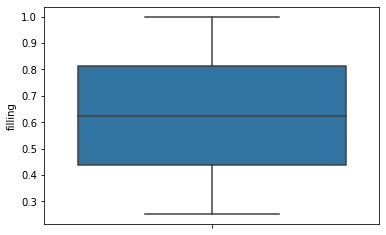

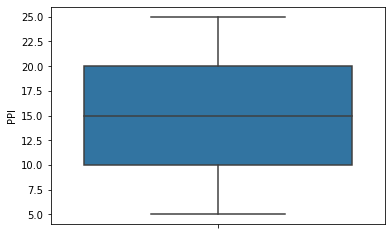

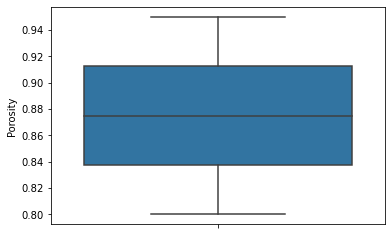

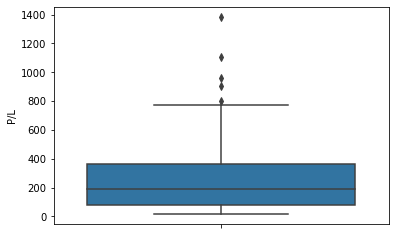

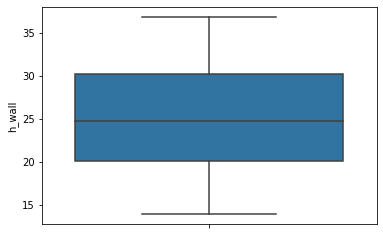

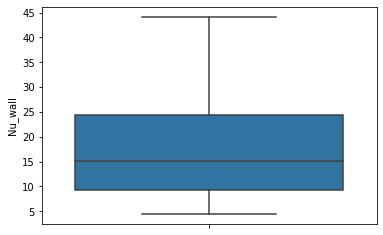

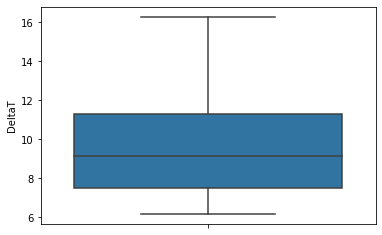

In [267]:
for i in  feature:
    plt.figsize=(10,5)
    sns.boxplot(y=df[i])
    plt.show()

<AxesSubplot:title={'center':'Correlation of features'}>

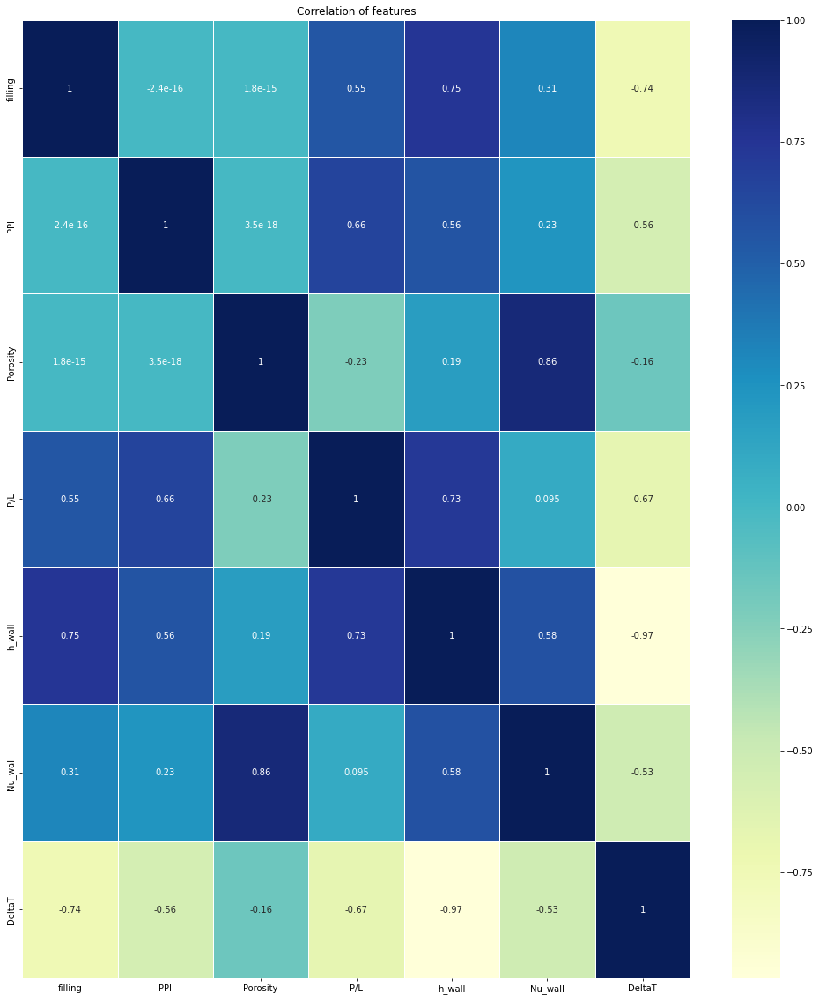

In [268]:
plt.figure(figsize=(17, 20))
plt.title('Correlation of features')
sns.heatmap(df.corr(), annot=True, linewidths=0.5, cmap="YlGnBu")

In [18]:
def curve_plot(df , feature):
    print(feature+ ':')
    plt.figure(figsize=(10,6))
   # plt.subplot(1,2,1)
   # df[feature].hist()
    #plt.plot(1,2,2)
    stat.probplot(df[feature],dist='norm',plot=pylab)
    plt.show()

In [11]:
df.dtypes

filling     float64
PPI         float64
Porosity    float64
P/L         float64
h_wall      float64
Nu_wall     float64
DeltaT      float64
dtype: object

In [12]:
df['PPI'] = df['PPI'].astype(float)
df['Porosity'] = df['Porosity'].astype(float)
df['Nu_wall'] = df['Nu_wall'].astype(float)
df['h_wall'] = df['h_wall'].astype(float)
df['DeltaT'] = df['DeltaT'].astype(float)
df['P/L'] = df['P/L'].astype(float)
df['filling'] = df['filling'].astype(float)

In [22]:
df['DeltaT'] = np.log(df['DeltaT'])

filling:


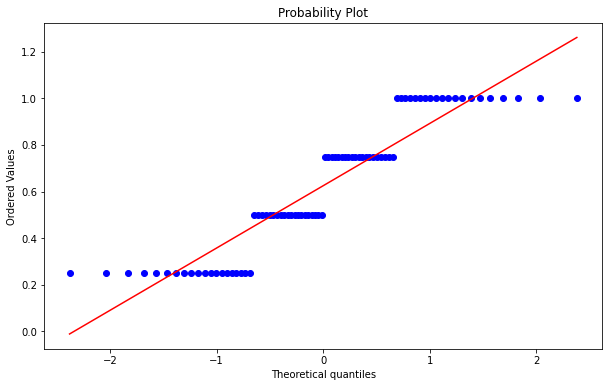

PPI:


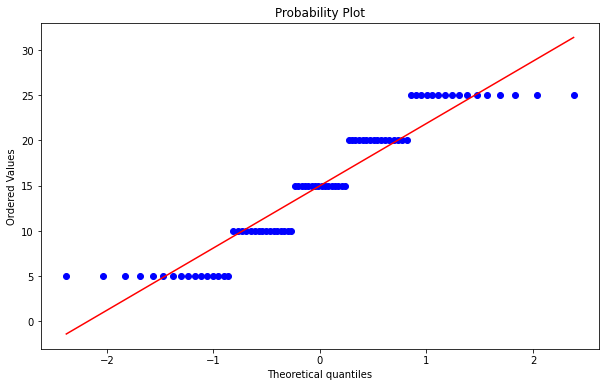

Porosity:


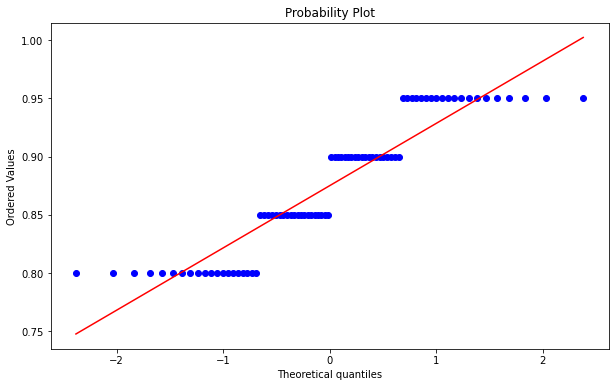

P/L:


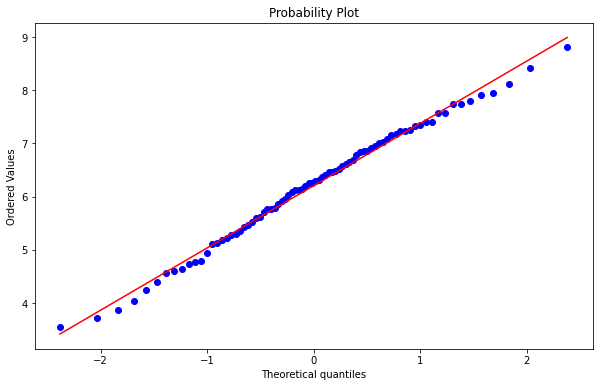

h_wall:


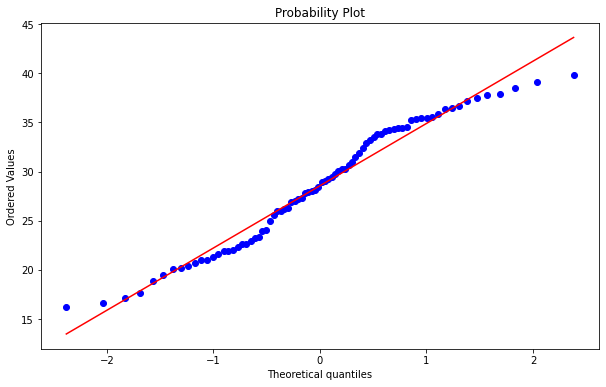

Nu_wall:


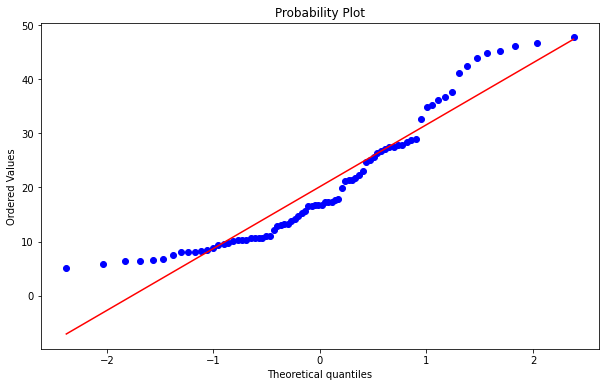

DeltaT:


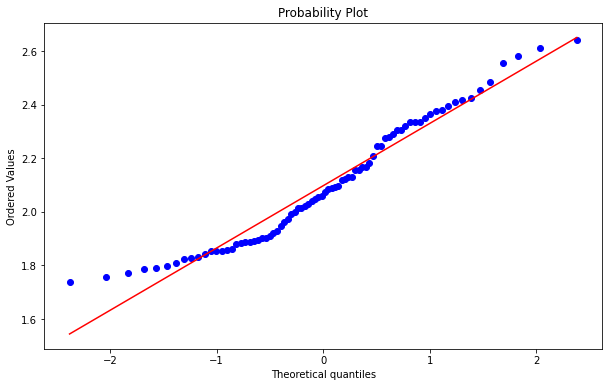

In [23]:
for i in  df.columns:
    curve_plot(df ,i)

In [27]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [270]:
y = df['DeltaT']
X = df.drop(labels = ['DeltaT' , 'h_wall','P/L' ,'Nu_wall'] , axis = 1)

In [271]:
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [272]:
num_bins = 5
bin_edges = np.linspace(np.min(X), np.max(X), num_bins + 1)
bin_indices = np.digitize(X, bin_edges)

In [273]:
y

0     10.816222
1      8.670130
2      7.806540
3      7.338745
4      7.046579
        ...    
75    15.325257
76    12.834496
77    11.654788
78    10.952318
79    10.485509
Name: DeltaT, Length: 80, dtype: float64

## Scaling and Modelling

In [274]:
#test_size = int(0.2*(len(y)))
#train_size = int(0.8*(len(y)))

#X_train = X[:-test_size] 
#X_test = X[train_size:]
#y_train = y[:-test_size]
#y_test = y[train_size:]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2 ,  random_state = 42)
X_test_new , y_test_new , X_valid , y_valid =  train_test_split(X_test, y_test, test_size = 0.5 ,  random_state = 1)

In [37]:

import os

# Tensorflow and Keras are two packages for creating neural network models.
import tensorflow as tf
from tensorflow import keras

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Activation, Dense, BatchNormalization, Dropout
from tensorflow.keras import optimizers


from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score

In [21]:
X_te = X_test

In [22]:
def build_model(alpha , neurons):
    model=keras.Sequential([layers.Dense(5, activation='relu'),layers.Dense(neurons, activation='relu'),layers.Dense(1)])
    optimizer=tf.keras.optimizers.RMSprop(alpha)
    model.compile(loss='mse', optimizer=optimizer, metrics=['mae','mse'])
    return model

In [23]:
X = np.array(X_train)
Y= np.array(y_train)

In [24]:
alps = [0.1,0.01, 0.001 , 0.0001 , 0.00001]
neurons = np.array(list(range(1, 101)))



In [25]:
neurons

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100])

In [26]:
R = [ ]

In [27]:
c = [{1,2,3}]

In [35]:
for i  in  range(len(alps)):
    for  j in  range(len(neurons)) : 
        model=build_model(alps[i] , neurons[j])
        history = model.fit(X,Y, epochs=1000)
        X1 = np.array(X_test)
        y12 = np.array(y_test)
        tdp = model.predict(X1)
        loss,mae,mse=model.evaluate(X1,y12,verbose=0)
        r2 = r2_score(y12, tdp)
        R.append([r2,alps[i], neurons[j]]);
        
        

Epoch 1/1000
2/2 [==============================] - 0s 6ms/step - loss: 48.6427 - mae: 6.6355 - mse: 48.6427
Epoch 2/1000
2/2 [==============================] - 0s 2ms/step - loss: 6.7036 - mae: 2.0227 - mse: 6.7036
Epoch 3/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6223 - mae: 1.3726 - mse: 2.6223
Epoch 4/1000
2/2 [==============================] - 0s 3ms/step - loss: 2.1411 - mae: 1.1635 - mse: 2.1411
Epoch 5/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7816 - mae: 0.6564 - mse: 0.7816
Epoch 6/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6789 - mae: 0.6463 - mse: 0.6789
Epoch 7/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7264 - mae: 0.7028 - mse: 0.7264
Epoch 8/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9403 - mae: 1.2476 - mse: 1.9403
Epoch 9/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.2540 - mae: 1.6812 - mse: 3.2540
Epoch 10/1000
2/2 [================

2/2 [==============================] - 0s 2ms/step - loss: 0.0537 - mae: 0.1957 - mse: 0.0537
Epoch 152/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0547 - mae: 0.2083 - mse: 0.0547
Epoch 153/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0526 - mae: 0.1856 - mse: 0.0526
Epoch 154/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0682 - mae: 0.2186 - mse: 0.0682
Epoch 155/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5885 - mae: 0.6537 - mse: 0.5885
Epoch 156/1000
2/2 [==============================] - 0s 1ms/step - loss: 2.4162 - mae: 1.4816 - mse: 2.4162
Epoch 157/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.7684 - mae: 0.7343 - mse: 0.7684
Epoch 158/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1995 - mae: 0.3789 - mse: 0.1995
Epoch 159/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2070 - mae: 0.3951 - mse: 0.2070
Epoch 160/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1601 - mae: 0.3386 - mse: 0.1601
Epoch 302/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2699 - mae: 0.4653 - mse: 0.2699
Epoch 303/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5386 - mae: 0.6212 - mse: 0.5386
Epoch 304/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2130 - mae: 0.4012 - mse: 0.2130
Epoch 305/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2521 - mae: 0.4368 - mse: 0.2521
Epoch 306/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2169 - mae: 0.4308 - mse: 0.2169
Epoch 307/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3947 - mae: 0.5548 - mse: 0.3947
Epoch 308/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2862 - mae: 0.4703 - mse: 0.2862
Epoch 309/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1956 - mae: 0.3766 - mse: 0.1956
Epoch 310/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2620 - mae: 0.4300 - mse: 0.2620
Epoch 452/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2248 - mae: 0.4096 - mse: 0.2248
Epoch 453/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2155 - mae: 0.3887 - mse: 0.2155
Epoch 454/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2483 - mae: 0.4246 - mse: 0.2483
Epoch 455/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3586 - mae: 0.5299 - mse: 0.3586
Epoch 456/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2174 - mae: 0.3971 - mse: 0.2174
Epoch 457/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1794 - mae: 0.3682 - mse: 0.1794
Epoch 458/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1762 - mae: 0.3704 - mse: 0.1762
Epoch 459/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1749 - mae: 0.3656 - mse: 0.1749
Epoch 460/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2640 - mae: 0.4309 - mse: 0.2640
Epoch 602/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2617 - mae: 0.4364 - mse: 0.2617
Epoch 603/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2351 - mae: 0.4049 - mse: 0.2351
Epoch 604/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1974 - mae: 0.3689 - mse: 0.1974
Epoch 605/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1028 - mae: 0.2834 - mse: 0.1028
Epoch 606/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0660 - mae: 0.1994 - mse: 0.0660
Epoch 607/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0540 - mae: 0.1832 - mse: 0.0540
Epoch 608/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1972 - mae: 0.3613 - mse: 0.1972
Epoch 609/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4590 - mae: 0.5654 - mse: 0.4590
Epoch 610/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0506 - mae: 0.1837 - mse: 0.0506
Epoch 752/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2309 - mae: 0.3982 - mse: 0.2309
Epoch 753/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7315 - mae: 0.7193 - mse: 0.7315
Epoch 754/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1154 - mae: 0.2462 - mse: 0.1154
Epoch 755/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0445 - mae: 0.1667 - mse: 0.0445
Epoch 756/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0319 - mae: 0.1424 - mse: 0.0319
Epoch 757/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0253 - mae: 0.1172 - mse: 0.0253
Epoch 758/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0349 - mae: 0.1535 - mse: 0.0349
Epoch 759/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0998 - mae: 0.2607 - mse: 0.0998
Epoch 760/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1013 - mae: 0.2627 - mse: 0.1013
Epoch 902/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1338 - mae: 0.3013 - mse: 0.1338
Epoch 903/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2937 - mae: 0.4321 - mse: 0.2937
Epoch 904/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0285 - mae: 0.1127 - mse: 0.0285
Epoch 905/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0246 - mae: 0.1079 - mse: 0.0246
Epoch 906/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0298 - mae: 0.1328 - mse: 0.0298
Epoch 907/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0701 - mae: 0.2191 - mse: 0.0701
Epoch 908/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4295 - mae: 0.5118 - mse: 0.4295
Epoch 909/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3956 - mae: 0.4830 - mse: 0.3956
Epoch 910/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.2944 - mae: 1.0865 - mse: 1.2944
Epoch 52/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7362 - mae: 0.7864 - mse: 0.7362
Epoch 53/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3947 - mae: 0.5677 - mse: 0.3947
Epoch 54/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3347 - mae: 0.5219 - mse: 0.3347
Epoch 55/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4228 - mae: 0.5918 - mse: 0.4228
Epoch 56/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6630 - mae: 0.7551 - mse: 0.6630
Epoch 57/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8807 - mae: 0.8683 - mse: 0.8807
Epoch 58/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9669 - mae: 0.8297 - mse: 0.9669
Epoch 59/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8657 - mae: 0.8842 - mse: 0.8657
Epoch 60/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 0.1356 - mae: 0.2958 - mse: 0.1356
Epoch 202/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0751 - mae: 0.2233 - mse: 0.0751
Epoch 203/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0781 - mae: 0.2200 - mse: 0.0781
Epoch 204/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0761 - mae: 0.2199 - mse: 0.0761
Epoch 205/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1798 - mae: 0.3555 - mse: 0.1798
Epoch 206/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7628 - mae: 0.7963 - mse: 0.7628
Epoch 207/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9338 - mae: 0.8535 - mse: 0.9338
Epoch 208/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2888 - mae: 0.4565 - mse: 0.2888
Epoch 209/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1525 - mae: 0.3194 - mse: 0.1525
Epoch 210/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2506 - mae: 0.4481 - mse: 0.2506
Epoch 352/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5344 - mae: 0.6478 - mse: 0.5344
Epoch 353/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4065 - mae: 0.5457 - mse: 0.4065
Epoch 354/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2394 - mae: 0.4009 - mse: 0.2394
Epoch 355/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0893 - mae: 0.2408 - mse: 0.0893
Epoch 356/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0671 - mae: 0.2129 - mse: 0.0671
Epoch 357/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0668 - mae: 0.2184 - mse: 0.0668
Epoch 358/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0807 - mae: 0.2261 - mse: 0.0807
Epoch 359/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1157 - mae: 0.2771 - mse: 0.1157
Epoch 360/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1556 - mae: 0.3356 - mse: 0.1556
Epoch 502/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2714 - mae: 0.4502 - mse: 0.2714
Epoch 503/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7323 - mae: 0.7671 - mse: 0.7323
Epoch 504/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3892 - mae: 0.5390 - mse: 0.3892
Epoch 505/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2437 - mae: 0.4149 - mse: 0.2437
Epoch 506/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2231 - mae: 0.4027 - mse: 0.2231
Epoch 507/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1662 - mae: 0.3415 - mse: 0.1662
Epoch 508/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1582 - mae: 0.3349 - mse: 0.1582
Epoch 509/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1497 - mae: 0.3280 - mse: 0.1497
Epoch 510/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2927 - mae: 0.4589 - mse: 0.2927
Epoch 652/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1308 - mae: 0.2795 - mse: 0.1308
Epoch 653/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1035 - mae: 0.2544 - mse: 0.1035
Epoch 654/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0937 - mae: 0.2411 - mse: 0.0937
Epoch 655/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1286 - mae: 0.2904 - mse: 0.1286
Epoch 656/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3066 - mae: 0.4599 - mse: 0.3066
Epoch 657/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5172 - mae: 0.6162 - mse: 0.5172
Epoch 658/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2199 - mae: 0.3586 - mse: 0.2199
Epoch 659/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0819 - mae: 0.2493 - mse: 0.0819
Epoch 660/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6239 - mae: 0.6925 - mse: 0.6239
Epoch 802/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2176 - mae: 0.3595 - mse: 0.2176
Epoch 803/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0930 - mae: 0.2569 - mse: 0.0930
Epoch 804/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0857 - mae: 0.2573 - mse: 0.0857
Epoch 805/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0916 - mae: 0.2494 - mse: 0.0916
Epoch 806/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0870 - mae: 0.2478 - mse: 0.0870
Epoch 807/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1684 - mae: 0.3487 - mse: 0.1684
Epoch 808/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4121 - mae: 0.5305 - mse: 0.4121
Epoch 809/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4418 - mae: 0.5320 - mse: 0.4418
Epoch 810/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1066 - mae: 0.2714 - mse: 0.1066
Epoch 952/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1028 - mae: 0.2496 - mse: 0.1028
Epoch 953/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1187 - mae: 0.2950 - mse: 0.1187
Epoch 954/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2129 - mae: 0.3712 - mse: 0.2129
Epoch 955/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2283 - mae: 0.3595 - mse: 0.2283
Epoch 956/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1766 - mae: 0.3333 - mse: 0.1766
Epoch 957/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4707 - mae: 0.5676 - mse: 0.4707
Epoch 958/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2124 - mae: 0.3701 - mse: 0.2124
Epoch 959/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0934 - mae: 0.2526 - mse: 0.0934
Epoch 960/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5832 - mae: 0.6028 - mse: 0.5832
Epoch 27/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2354 - mae: 0.4298 - mse: 0.2354
Epoch 28/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2693 - mae: 0.4432 - mse: 0.2693
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2930 - mae: 0.4352 - mse: 0.2930
Epoch 30/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3285 - mae: 0.4990 - mse: 0.3285
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5619 - mae: 0.6350 - mse: 0.5619
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.5090 - mae: 1.3996 - mse: 2.5090
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.4437 - mae: 1.4689 - mse: 2.4437
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5284 - mae: 0.5622 - mse: 0.5284
Epoch 35/1000
2/2 [=======================

Epoch 102/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2666 - mae: 0.4062 - mse: 0.2666
Epoch 103/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4703 - mae: 0.6062 - mse: 0.4703
Epoch 104/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7837 - mae: 0.8053 - mse: 0.7837
Epoch 105/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9642 - mae: 0.8781 - mse: 0.9642
Epoch 106/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6301 - mae: 0.7131 - mse: 0.6301
Epoch 107/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5597 - mae: 0.6562 - mse: 0.5597
Epoch 108/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5743 - mae: 0.6397 - mse: 0.5743
Epoch 109/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6459 - mae: 0.7131 - mse: 0.6459
Epoch 110/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6410 - mae: 0.7117 - mse: 0.6410
Epoch 111/1000
2/2 

2/2 [==============================] - 0s 2ms/step - loss: 0.1131 - mae: 0.2827 - mse: 0.1131
Epoch 253/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1715 - mae: 0.3474 - mse: 0.1715
Epoch 254/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3661 - mae: 0.5051 - mse: 0.3661
Epoch 255/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6588 - mae: 0.6902 - mse: 0.6588
Epoch 256/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4735 - mae: 0.5795 - mse: 0.4735
Epoch 257/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4631 - mae: 0.5643 - mse: 0.4631
Epoch 258/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2343 - mae: 0.3785 - mse: 0.2343
Epoch 259/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1352 - mae: 0.2998 - mse: 0.1352
Epoch 260/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1239 - mae: 0.3154 - mse: 0.1239
Epoch 261/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7407 - mae: 0.7676 - mse: 0.7407
Epoch 403/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1855 - mae: 0.3641 - mse: 0.1855
Epoch 404/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1626 - mae: 0.3268 - mse: 0.1626
Epoch 405/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0895 - mae: 0.2432 - mse: 0.0895
Epoch 406/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0830 - mae: 0.2483 - mse: 0.0830
Epoch 407/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0962 - mae: 0.2553 - mse: 0.0962
Epoch 408/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1906 - mae: 0.3552 - mse: 0.1906
Epoch 409/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6283 - mae: 0.6856 - mse: 0.6283
Epoch 410/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3509 - mae: 0.4855 - mse: 0.3509
Epoch 411/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2498 - mae: 0.4224 - mse: 0.2498
Epoch 553/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5898 - mae: 0.6584 - mse: 0.5898
Epoch 554/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5823 - mae: 0.6179 - mse: 0.5823
Epoch 555/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2258 - mae: 0.3746 - mse: 0.2258
Epoch 556/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1205 - mae: 0.2860 - mse: 0.1205
Epoch 557/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1587 - mae: 0.3306 - mse: 0.1587
Epoch 558/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1677 - mae: 0.3243 - mse: 0.1677
Epoch 559/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1242 - mae: 0.2803 - mse: 0.1242
Epoch 560/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1341 - mae: 0.2998 - mse: 0.1341
Epoch 561/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1410 - mae: 0.2979 - mse: 0.1410
Epoch 703/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1602 - mae: 0.3037 - mse: 0.1602
Epoch 704/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3206 - mae: 0.4547 - mse: 0.3206
Epoch 705/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4416 - mae: 0.5670 - mse: 0.4416
Epoch 706/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3952 - mae: 0.5337 - mse: 0.3952
Epoch 707/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1771 - mae: 0.3221 - mse: 0.1771
Epoch 708/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0981 - mae: 0.2600 - mse: 0.0981
Epoch 709/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1113 - mae: 0.2704 - mse: 0.1113
Epoch 710/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1796 - mae: 0.3442 - mse: 0.1796
Epoch 711/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1239 - mae: 0.2896 - mse: 0.1239
Epoch 853/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1239 - mae: 0.3033 - mse: 0.1239
Epoch 854/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2053 - mae: 0.3555 - mse: 0.2053
Epoch 855/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3668 - mae: 0.5027 - mse: 0.3668
Epoch 856/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1837 - mae: 0.3271 - mse: 0.1837
Epoch 857/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0862 - mae: 0.2454 - mse: 0.0862
Epoch 858/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0904 - mae: 0.2474 - mse: 0.0904
Epoch 859/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1382 - mae: 0.3053 - mse: 0.1382
Epoch 860/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2966 - mae: 0.4273 - mse: 0.2966
Epoch 861/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 58.6716 - mae: 7.4963 - mse: 58.6716
Epoch 2/1000
2/2 [==============================] - 0s 2ms/step - loss: 26.5589 - mae: 4.6205 - mse: 26.5589
Epoch 3/1000
2/2 [==============================] - 0s 2ms/step - loss: 13.3132 - mae: 3.1937 - mse: 13.3132
Epoch 4/1000
2/2 [==============================] - 0s 2ms/step - loss: 5.9989 - mae: 2.1218 - mse: 5.9989
Epoch 5/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.5097 - mae: 1.3148 - mse: 2.5097
Epoch 6/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.8754 - mae: 1.1946 - mse: 1.8754
Epoch 7/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5658 - mae: 1.1082 - mse: 1.5658
Epoch 8/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5510 - mae: 1.0943 - mse: 1.5510
Epoch 9/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1742 - mae: 0.9504 - mse: 1.1742
Epoch 10/1000
2/2 [=========================

2/2 [==============================] - 0s 2ms/step - loss: 0.5829 - mae: 0.6914 - mse: 0.5829
Epoch 78/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4075 - mae: 0.5897 - mse: 0.4075
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3169 - mae: 0.5129 - mse: 0.3169
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2695 - mae: 0.4747 - mse: 0.2695
Epoch 81/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4901 - mae: 0.6522 - mse: 0.4901
Epoch 82/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5489 - mae: 0.6981 - mse: 0.5489
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4086 - mae: 0.5916 - mse: 0.4086
Epoch 84/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4099 - mae: 0.5610 - mse: 0.4099
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4162 - mae: 0.5995 - mse: 0.4162
Epoch 86/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4762 - mae: 0.6138 - mse: 0.4762
Epoch 228/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2273 - mae: 0.3852 - mse: 0.2273
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1080 - mae: 0.2759 - mse: 0.1080
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1068 - mae: 0.2668 - mse: 0.1068
Epoch 231/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1997 - mae: 0.3639 - mse: 0.1997
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8374 - mae: 0.8491 - mse: 0.8374
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9010 - mae: 0.8157 - mse: 0.9010
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2480 - mae: 0.4071 - mse: 0.2480
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1950 - mae: 0.3532 - mse: 0.1950
Epoch 236/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0826 - mae: 0.2393 - mse: 0.0826
Epoch 378/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0876 - mae: 0.2594 - mse: 0.0876
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0889 - mae: 0.2529 - mse: 0.0889
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1323 - mae: 0.3058 - mse: 0.1323
Epoch 381/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3995 - mae: 0.5335 - mse: 0.3995
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5847 - mae: 0.6354 - mse: 0.5847
Epoch 383/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2642 - mae: 0.4138 - mse: 0.2642
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1545 - mae: 0.3089 - mse: 0.1545
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1434 - mae: 0.3084 - mse: 0.1434
Epoch 386/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0999 - mae: 0.2567 - mse: 0.0999
Epoch 528/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1744 - mae: 0.3582 - mse: 0.1744
Epoch 529/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3803 - mae: 0.5116 - mse: 0.3803
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3079 - mae: 0.4726 - mse: 0.3079
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1953 - mae: 0.3660 - mse: 0.1953
Epoch 532/1000
2/2 [==============================] - 0s 4ms/step - loss: 0.1630 - mae: 0.3422 - mse: 0.1630
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2012 - mae: 0.3759 - mse: 0.2012
Epoch 534/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3073 - mae: 0.4674 - mse: 0.3073
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2338 - mae: 0.4075 - mse: 0.2338
Epoch 536/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4020 - mae: 0.5033 - mse: 0.4020
Epoch 678/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2540 - mae: 0.4332 - mse: 0.2540
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2711 - mae: 0.4306 - mse: 0.2711
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1314 - mae: 0.2856 - mse: 0.1314
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1215 - mae: 0.2981 - mse: 0.1215
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2176 - mae: 0.3947 - mse: 0.2176
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3115 - mae: 0.4633 - mse: 0.3115
Epoch 684/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2509 - mae: 0.4174 - mse: 0.2509
Epoch 685/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2661 - mae: 0.4334 - mse: 0.2661
Epoch 686/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1100 - mae: 0.2655 - mse: 0.1100
Epoch 828/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0946 - mae: 0.2482 - mse: 0.0946
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0815 - mae: 0.2304 - mse: 0.0815
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0973 - mae: 0.2586 - mse: 0.0973
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1919 - mae: 0.3367 - mse: 0.1919
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4018 - mae: 0.5064 - mse: 0.4018
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3057 - mae: 0.4537 - mse: 0.3057
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1407 - mae: 0.3013 - mse: 0.1407
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1230 - mae: 0.2906 - mse: 0.1230
Epoch 836/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0877 - mae: 0.2442 - mse: 0.0877
Epoch 978/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0845 - mae: 0.2440 - mse: 0.0845
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1089 - mae: 0.2748 - mse: 0.1089
Epoch 980/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3529 - mae: 0.4751 - mse: 0.3529
Epoch 981/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3659 - mae: 0.4347 - mse: 0.3659
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0871 - mae: 0.2541 - mse: 0.0871
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0883 - mae: 0.2441 - mse: 0.0883
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1215 - mae: 0.2827 - mse: 0.1215
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2160 - mae: 0.3789 - mse: 0.2160
Epoch 986/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.8058 - mae: 0.8161 - mse: 0.8058
Epoch 128/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6049 - mae: 0.7017 - mse: 0.6049
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4825 - mae: 0.6268 - mse: 0.4825
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4440 - mae: 0.5982 - mse: 0.4440
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3965 - mae: 0.5428 - mse: 0.3965
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3539 - mae: 0.5392 - mse: 0.3539
Epoch 133/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4016 - mae: 0.5516 - mse: 0.4016
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3459 - mae: 0.5238 - mse: 0.3459
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5575 - mae: 0.6753 - mse: 0.5575
Epoch 136/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.7943 - mae: 0.8011 - mse: 0.7943
Epoch 278/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4210 - mae: 0.5596 - mse: 0.4210
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4289 - mae: 0.5566 - mse: 0.4289
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3777 - mae: 0.5222 - mse: 0.3777
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2647 - mae: 0.4343 - mse: 0.2647
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1876 - mae: 0.3715 - mse: 0.1876
Epoch 283/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3301 - mae: 0.4975 - mse: 0.3301
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4234 - mae: 0.5658 - mse: 0.4234
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5320 - mae: 0.6679 - mse: 0.5320
Epoch 286/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0833 - mae: 0.1983 - mse: 0.0833
Epoch 428/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0808 - mae: 0.1952 - mse: 0.0808
Epoch 429/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0859 - mae: 0.2160 - mse: 0.0859
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0903 - mae: 0.2186 - mse: 0.0903
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1464 - mae: 0.3370 - mse: 0.1464
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2565 - mae: 0.4526 - mse: 0.2565
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9074 - mae: 0.8473 - mse: 0.9074
Epoch 434/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2437 - mae: 0.4116 - mse: 0.2437
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1027 - mae: 0.2504 - mse: 0.1027
Epoch 436/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1845 - mae: 0.3587 - mse: 0.1845
Epoch 578/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2090 - mae: 0.4008 - mse: 0.2090
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3198 - mae: 0.4917 - mse: 0.3198
Epoch 580/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2446 - mae: 0.4143 - mse: 0.2446
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1724 - mae: 0.3611 - mse: 0.1724
Epoch 582/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2258 - mae: 0.4017 - mse: 0.2258
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2039 - mae: 0.4070 - mse: 0.2039
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1995 - mae: 0.3822 - mse: 0.1995
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2209 - mae: 0.4134 - mse: 0.2209
Epoch 586/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1425 - mae: 0.3199 - mse: 0.1425
Epoch 728/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2214 - mae: 0.4198 - mse: 0.2214
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3694 - mae: 0.5216 - mse: 0.3694
Epoch 730/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2187 - mae: 0.4140 - mse: 0.2187
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1432 - mae: 0.3083 - mse: 0.1432
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1552 - mae: 0.3325 - mse: 0.1552
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2100 - mae: 0.4002 - mse: 0.2100
Epoch 734/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1919 - mae: 0.3801 - mse: 0.1919
Epoch 735/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3276 - mae: 0.4904 - mse: 0.3276
Epoch 736/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1094 - mae: 0.2743 - mse: 0.1094
Epoch 878/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2402 - mae: 0.4189 - mse: 0.2402
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4762 - mae: 0.5564 - mse: 0.4762
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1715 - mae: 0.3421 - mse: 0.1715
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0877 - mae: 0.2214 - mse: 0.0877
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0904 - mae: 0.2151 - mse: 0.0904
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1095 - mae: 0.2803 - mse: 0.1095
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2007 - mae: 0.3826 - mse: 0.2007
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3291 - mae: 0.4884 - mse: 0.3291
Epoch 886/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3668 - mae: 0.4990 - mse: 0.3668
Epoch 15/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4147 - mae: 0.5068 - mse: 0.4147
Epoch 16/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.4027 - mae: 0.9838 - mse: 1.4027
Epoch 17/1000
2/2 [==============================] - 0s 2ms/step - loss: 6.1015 - mae: 2.3078 - mse: 6.1015
Epoch 18/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4426 - mae: 0.5679 - mse: 0.4426
Epoch 19/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2814 - mae: 0.4521 - mse: 0.2814
Epoch 20/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2212 - mae: 0.4008 - mse: 0.2212
Epoch 21/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2750 - mae: 0.4482 - mse: 0.2750
Epoch 22/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9892 - mae: 0.8400 - mse: 0.9892
Epoch 23/1000
2/2 [=======================

Epoch 90/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7893 - mae: 0.7449 - mse: 0.7893
Epoch 91/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4697 - mae: 0.5937 - mse: 0.4697
Epoch 92/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3149 - mae: 0.4599 - mse: 0.3149
Epoch 93/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3802 - mae: 0.5188 - mse: 0.3802
Epoch 94/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7294 - mae: 0.7924 - mse: 0.7294
Epoch 95/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8616 - mae: 0.8382 - mse: 0.8616
Epoch 96/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4113 - mae: 0.5394 - mse: 0.4113
Epoch 97/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2448 - mae: 0.3759 - mse: 0.2448
Epoch 98/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5893 - mae: 0.6460 - mse: 0.5893
Epoch 99/1000
2/2 [=========

2/2 [==============================] - 0s 2ms/step - loss: 0.3987 - mae: 0.5042 - mse: 0.3987
Epoch 241/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1983 - mae: 0.3899 - mse: 0.1983
Epoch 242/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2175 - mae: 0.4038 - mse: 0.2175
Epoch 243/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2593 - mae: 0.4367 - mse: 0.2593
Epoch 244/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3252 - mae: 0.5102 - mse: 0.3252
Epoch 245/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6456 - mae: 0.7021 - mse: 0.6456
Epoch 246/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7278 - mae: 0.7249 - mse: 0.7278
Epoch 247/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2065 - mae: 0.3763 - mse: 0.2065
Epoch 248/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0811 - mae: 0.2339 - mse: 0.0811
Epoch 249/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2228 - mae: 0.4088 - mse: 0.2228
Epoch 391/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2551 - mae: 0.4315 - mse: 0.2551
Epoch 392/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2633 - mae: 0.4420 - mse: 0.2633
Epoch 393/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2677 - mae: 0.4397 - mse: 0.2677
Epoch 394/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3043 - mae: 0.4747 - mse: 0.3043
Epoch 395/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2093 - mae: 0.3960 - mse: 0.2093
Epoch 396/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1788 - mae: 0.3724 - mse: 0.1788
Epoch 397/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2115 - mae: 0.3951 - mse: 0.2115
Epoch 398/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2567 - mae: 0.4272 - mse: 0.2567
Epoch 399/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7134 - mae: 0.7257 - mse: 0.7134
Epoch 541/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0482 - mae: 0.1579 - mse: 0.0482
Epoch 542/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0316 - mae: 0.1324 - mse: 0.0316
Epoch 543/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0320 - mae: 0.1458 - mse: 0.0320
Epoch 544/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1420 - mae: 0.3073 - mse: 0.1420
Epoch 545/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1948 - mae: 0.3505 - mse: 0.1948
Epoch 546/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6657 - mae: 0.6703 - mse: 0.6657
Epoch 547/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1652 - mae: 0.3599 - mse: 0.1652
Epoch 548/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0745 - mae: 0.2334 - mse: 0.0745
Epoch 549/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1033 - mae: 0.2684 - mse: 0.1033
Epoch 691/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2277 - mae: 0.4217 - mse: 0.2277
Epoch 692/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2647 - mae: 0.4386 - mse: 0.2647
Epoch 693/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2523 - mae: 0.4170 - mse: 0.2523
Epoch 694/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0702 - mae: 0.1922 - mse: 0.0702
Epoch 695/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0335 - mae: 0.1425 - mse: 0.0335
Epoch 696/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0776 - mae: 0.2262 - mse: 0.0776
Epoch 697/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2816 - mae: 0.4378 - mse: 0.2816
Epoch 698/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4820 - mae: 0.5945 - mse: 0.4820
Epoch 699/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0650 - mae: 0.1890 - mse: 0.0650
Epoch 841/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0464 - mae: 0.1727 - mse: 0.0464
Epoch 842/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0884 - mae: 0.2544 - mse: 0.0884
Epoch 843/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2943 - mae: 0.4562 - mse: 0.2943
Epoch 844/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5405 - mae: 0.6040 - mse: 0.5405
Epoch 845/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0873 - mae: 0.2349 - mse: 0.0873
Epoch 846/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0779 - mae: 0.2282 - mse: 0.0779
Epoch 847/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0735 - mae: 0.2294 - mse: 0.0735
Epoch 848/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1479 - mae: 0.3246 - mse: 0.1479
Epoch 849/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1573 - mae: 0.2928 - mse: 0.1573
Epoch 991/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1665 - mae: 0.3337 - mse: 0.1665
Epoch 992/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1791 - mae: 0.3353 - mse: 0.1791
Epoch 993/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1887 - mae: 0.3505 - mse: 0.1887
Epoch 994/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1614 - mae: 0.3194 - mse: 0.1614
Epoch 995/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1387 - mae: 0.2933 - mse: 0.1387
Epoch 996/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1904 - mae: 0.3392 - mse: 0.1904
Epoch 997/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1530 - mae: 0.3243 - mse: 0.1530
Epoch 998/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1145 - mae: 0.2875 - mse: 0.1145
Epoch 999/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7513 - mae: 0.7409 - mse: 0.7513
Epoch 128/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7784 - mae: 0.7682 - mse: 0.7784
Epoch 129/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3044 - mae: 0.4817 - mse: 0.3044
Epoch 130/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2195 - mae: 0.3657 - mse: 0.2195
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2268 - mae: 0.4121 - mse: 0.2268
Epoch 132/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3353 - mae: 0.4909 - mse: 0.3353
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6589 - mae: 0.7211 - mse: 0.6589
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8149 - mae: 0.7887 - mse: 0.8149
Epoch 135/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6672 - mae: 0.7211 - mse: 0.6672
Epoch 136/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.9548 - mae: 0.8844 - mse: 0.9548
Epoch 278/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7712 - mae: 0.7681 - mse: 0.7712
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1661 - mae: 0.3531 - mse: 0.1661
Epoch 280/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1372 - mae: 0.3042 - mse: 0.1372
Epoch 281/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1597 - mae: 0.3497 - mse: 0.1597
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1428 - mae: 0.3090 - mse: 0.1428
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3028 - mae: 0.4842 - mse: 0.3028
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7955 - mae: 0.7781 - mse: 0.7955
Epoch 285/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3005 - mae: 0.4830 - mse: 0.3005
Epoch 286/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3849 - mae: 0.5348 - mse: 0.3849
Epoch 428/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3637 - mae: 0.5136 - mse: 0.3637
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1397 - mae: 0.3147 - mse: 0.1397
Epoch 430/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1034 - mae: 0.2657 - mse: 0.1034
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0937 - mae: 0.2320 - mse: 0.0937
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1540 - mae: 0.3303 - mse: 0.1540
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7756 - mae: 0.7449 - mse: 0.7756
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5877 - mae: 0.6915 - mse: 0.5877
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1175 - mae: 0.2932 - mse: 0.1175
Epoch 436/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1408 - mae: 0.3189 - mse: 0.1408
Epoch 578/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1586 - mae: 0.3454 - mse: 0.1586
Epoch 579/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1345 - mae: 0.3034 - mse: 0.1345
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2247 - mae: 0.4277 - mse: 0.2247
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2955 - mae: 0.4449 - mse: 0.2955
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2464 - mae: 0.4222 - mse: 0.2464
Epoch 583/1000
2/2 [==============================] - 0s 4ms/step - loss: 0.3060 - mae: 0.4943 - mse: 0.3060
Epoch 584/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1232 - mae: 0.2904 - mse: 0.1232
Epoch 585/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1075 - mae: 0.2724 - mse: 0.1075
Epoch 586/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3308 - mae: 0.4977 - mse: 0.3308
Epoch 728/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2356 - mae: 0.4185 - mse: 0.2356
Epoch 729/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1171 - mae: 0.2838 - mse: 0.1171
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0968 - mae: 0.2263 - mse: 0.0968
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1496 - mae: 0.3389 - mse: 0.1496
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1624 - mae: 0.3592 - mse: 0.1624
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3298 - mae: 0.5073 - mse: 0.3298
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1228 - mae: 0.3015 - mse: 0.1228
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1006 - mae: 0.2595 - mse: 0.1006
Epoch 736/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2290 - mae: 0.4054 - mse: 0.2290
Epoch 878/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1231 - mae: 0.3000 - mse: 0.1231
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0917 - mae: 0.2348 - mse: 0.0917
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0905 - mae: 0.2365 - mse: 0.0905
Epoch 881/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1179 - mae: 0.2866 - mse: 0.1179
Epoch 882/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2670 - mae: 0.4375 - mse: 0.2670
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3478 - mae: 0.4956 - mse: 0.3478
Epoch 884/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1947 - mae: 0.3814 - mse: 0.1947
Epoch 885/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1725 - mae: 0.3552 - mse: 0.1725
Epoch 886/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.3568 - mae: 1.0998 - mse: 1.3568
Epoch 28/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1888 - mae: 1.0300 - mse: 1.1888
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8512 - mae: 0.8538 - mse: 0.8512
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9253 - mae: 0.9205 - mse: 0.9253
Epoch 31/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.1791 - mae: 1.0386 - mse: 1.1791
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3638 - mae: 1.1045 - mse: 1.3638
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3324 - mae: 1.0659 - mse: 1.3324
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0918 - mae: 0.9776 - mse: 1.0918
Epoch 35/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.0804 - mae: 0.9272 - mse: 1.0804
Epoch 36/1000
2/2 [=======================

Epoch 103/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7710 - mae: 0.7739 - mse: 0.7710
Epoch 104/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4072 - mae: 0.5569 - mse: 0.4072
Epoch 105/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2658 - mae: 0.4538 - mse: 0.2658
Epoch 106/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3765 - mae: 0.5316 - mse: 0.3765
Epoch 107/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6423 - mae: 0.7082 - mse: 0.6423
Epoch 108/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9337 - mae: 0.8430 - mse: 0.9337
Epoch 109/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1436 - mae: 0.9709 - mse: 1.1436
Epoch 110/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5188 - mae: 0.5776 - mse: 0.5188
Epoch 111/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1852 - mae: 0.3461 - mse: 0.1852
Epoch 112/1000
2/2 

2/2 [==============================] - 0s 2ms/step - loss: 0.2573 - mae: 0.4402 - mse: 0.2573
Epoch 254/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3043 - mae: 0.4550 - mse: 0.3043
Epoch 255/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2408 - mae: 0.4212 - mse: 0.2408
Epoch 256/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5878 - mae: 0.6681 - mse: 0.5878
Epoch 257/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8774 - mae: 0.8147 - mse: 0.8774
Epoch 258/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4493 - mae: 0.5543 - mse: 0.4493
Epoch 259/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1620 - mae: 0.3351 - mse: 0.1620
Epoch 260/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0740 - mae: 0.2127 - mse: 0.0740
Epoch 261/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0665 - mae: 0.2143 - mse: 0.0665
Epoch 262/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1613 - mae: 0.3505 - mse: 0.1613
Epoch 404/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3764 - mae: 0.5172 - mse: 0.3764
Epoch 405/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5742 - mae: 0.6479 - mse: 0.5742
Epoch 406/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3864 - mae: 0.5315 - mse: 0.3864
Epoch 407/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0924 - mae: 0.2584 - mse: 0.0924
Epoch 408/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0607 - mae: 0.2068 - mse: 0.0607
Epoch 409/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0643 - mae: 0.2219 - mse: 0.0643
Epoch 410/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2387 - mae: 0.4171 - mse: 0.2387
Epoch 411/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3572 - mae: 0.5127 - mse: 0.3572
Epoch 412/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2642 - mae: 0.4513 - mse: 0.2642
Epoch 554/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2798 - mae: 0.4465 - mse: 0.2798
Epoch 555/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2518 - mae: 0.4326 - mse: 0.2518
Epoch 556/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2553 - mae: 0.4045 - mse: 0.2553
Epoch 557/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1619 - mae: 0.3420 - mse: 0.1619
Epoch 558/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1381 - mae: 0.3127 - mse: 0.1381
Epoch 559/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1997 - mae: 0.3768 - mse: 0.1997
Epoch 560/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3434 - mae: 0.5079 - mse: 0.3434
Epoch 561/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1243 - mae: 0.3022 - mse: 0.1243
Epoch 562/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1975 - mae: 0.3439 - mse: 0.1975
Epoch 704/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1677 - mae: 0.3293 - mse: 0.1677
Epoch 705/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1454 - mae: 0.3267 - mse: 0.1454
Epoch 706/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1633 - mae: 0.3277 - mse: 0.1633
Epoch 707/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2151 - mae: 0.3856 - mse: 0.2151
Epoch 708/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1989 - mae: 0.3626 - mse: 0.1989
Epoch 709/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2295 - mae: 0.4111 - mse: 0.2295
Epoch 710/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2727 - mae: 0.4385 - mse: 0.2727
Epoch 711/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1238 - mae: 0.3081 - mse: 0.1238
Epoch 712/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0528 - mae: 0.1872 - mse: 0.0528
Epoch 854/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0439 - mae: 0.1797 - mse: 0.0439
Epoch 855/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0320 - mae: 0.1378 - mse: 0.0320
Epoch 856/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0197 - mae: 0.0945 - mse: 0.0197
Epoch 857/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0213 - mae: 0.0999 - mse: 0.0213
Epoch 858/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0894 - mae: 0.2446 - mse: 0.0894
Epoch 859/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7364 - mae: 0.6802 - mse: 0.7364
Epoch 860/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0546 - mae: 0.1747 - mse: 0.0546
Epoch 861/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0284 - mae: 0.1307 - mse: 0.0284
Epoch 862/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 20.9660 - mae: 4.2594 - mse: 20.9660
Epoch 3/1000
2/2 [==============================] - 0s 3ms/step - loss: 11.1747 - mae: 2.9848 - mse: 11.1747
Epoch 4/1000
2/2 [==============================] - 0s 3ms/step - loss: 2.3948 - mae: 1.2613 - mse: 2.3948
Epoch 5/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.3395 - mae: 0.8827 - mse: 1.3395
Epoch 6/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2254 - mae: 0.8898 - mse: 1.2254
Epoch 7/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.3963 - mae: 1.0108 - mse: 1.3963
Epoch 8/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1101 - mae: 0.8902 - mse: 1.1101
Epoch 9/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.8150 - mae: 0.7777 - mse: 0.8150
Epoch 10/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.0273 - mae: 0.8752 - mse: 1.0273
Epoch 11/1000
2/2 [==========================

2/2 [==============================] - 0s 3ms/step - loss: 0.4599 - mae: 0.5743 - mse: 0.4599
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2611 - mae: 0.4486 - mse: 0.2611
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3180 - mae: 0.4726 - mse: 0.3180
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4934 - mae: 0.6219 - mse: 0.4934
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3252 - mae: 0.4972 - mse: 0.3252
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2958 - mae: 0.4458 - mse: 0.2958
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6003 - mae: 0.6660 - mse: 0.6003
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5084 - mae: 0.5964 - mse: 0.5084
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3319 - mae: 0.4744 - mse: 0.3319
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 2.1156 - mae: 1.3194 - mse: 2.1156
Epoch 229/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1705 - mae: 0.3336 - mse: 0.1705
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0386 - mae: 0.1637 - mse: 0.0386
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0459 - mae: 0.1888 - mse: 0.0459
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1199 - mae: 0.3055 - mse: 0.1199
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3814 - mae: 0.5524 - mse: 0.3814
Epoch 234/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.2087 - mae: 0.9996 - mse: 1.2087
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1273 - mae: 0.2873 - mse: 0.1273
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0413 - mae: 0.1737 - mse: 0.0413
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2480 - mae: 0.4589 - mse: 0.2480
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1481 - mae: 0.3305 - mse: 0.1481
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0890 - mae: 0.2720 - mse: 0.0890
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2731 - mae: 0.4843 - mse: 0.2731
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3057 - mae: 0.4895 - mse: 0.3057
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3233 - mae: 0.5331 - mse: 0.3233
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1790 - mae: 0.4003 - mse: 0.1790
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1972 - mae: 0.4059 - mse: 0.1972
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1545 - mae: 0.3639 - mse: 0.1545
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2288 - mae: 0.4342 - mse: 0.2288
Epoch 529/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4175 - mae: 0.5873 - mse: 0.4175
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3437 - mae: 0.5174 - mse: 0.3437
Epoch 531/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0785 - mae: 0.2388 - mse: 0.0785
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0399 - mae: 0.1648 - mse: 0.0399
Epoch 533/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0382 - mae: 0.1710 - mse: 0.0382
Epoch 534/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0746 - mae: 0.2479 - mse: 0.0746
Epoch 535/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3069 - mae: 0.5057 - mse: 0.3069
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3678 - mae: 0.5540 - mse: 0.3678
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0976 - mae: 0.2685 - mse: 0.0976
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1626 - mae: 0.3603 - mse: 0.1626
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1573 - mae: 0.3731 - mse: 0.1573
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1050 - mae: 0.2780 - mse: 0.1050
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1892 - mae: 0.3889 - mse: 0.1892
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2014 - mae: 0.3973 - mse: 0.2014
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1384 - mae: 0.3246 - mse: 0.1384
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1461 - mae: 0.3181 - mse: 0.1461
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1028 - mae: 0.2858 - mse: 0.1028
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1836 - mae: 0.3536 - mse: 0.1836
Epoch 829/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0732 - mae: 0.2383 - mse: 0.0732
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0536 - mae: 0.1908 - mse: 0.0536
Epoch 831/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0448 - mae: 0.1750 - mse: 0.0448
Epoch 832/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0710 - mae: 0.2410 - mse: 0.0710
Epoch 833/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1193 - mae: 0.3026 - mse: 0.1193
Epoch 834/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1299 - mae: 0.3025 - mse: 0.1299
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1276 - mae: 0.3017 - mse: 0.1276
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1465 - mae: 0.3198 - mse: 0.1465
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0267 - mae: 0.1334 - mse: 0.0267
Epoch 979/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1365 - mae: 0.3090 - mse: 0.1365
Epoch 980/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1802 - mae: 0.3704 - mse: 0.1802
Epoch 981/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0841 - mae: 0.2329 - mse: 0.0841
Epoch 982/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1274 - mae: 0.2913 - mse: 0.1274
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2512 - mae: 0.4248 - mse: 0.2512
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1481 - mae: 0.3276 - mse: 0.1481
Epoch 985/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0323 - mae: 0.1514 - mse: 0.0323
Epoch 986/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0375 - mae: 0.1514 - mse: 0.0375
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2068 - mae: 0.4136 - mse: 0.2068
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3844 - mae: 0.5724 - mse: 0.3844
Epoch 130/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.8296 - mae: 0.8494 - mse: 0.8296
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6729 - mae: 0.7114 - mse: 0.6729
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4708 - mae: 0.6389 - mse: 0.4708
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7979 - mae: 0.8229 - mse: 0.7979
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7117 - mae: 0.7752 - mse: 0.7117
Epoch 135/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3622 - mae: 0.5326 - mse: 0.3622
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3934 - mae: 0.5663 - mse: 0.3934
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3867 - mae: 0.5818 - mse: 0.3867
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4815 - mae: 0.6332 - mse: 0.4815
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3234 - mae: 0.5200 - mse: 0.3234
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3211 - mae: 0.5230 - mse: 0.3211
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3271 - mae: 0.5418 - mse: 0.3271
Epoch 283/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3063 - mae: 0.4539 - mse: 0.3063
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1429 - mae: 0.3497 - mse: 0.1429
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1628 - mae: 0.3677 - mse: 0.1628
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3502 - mae: 0.5263 - mse: 0.3502
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1163 - mae: 0.3045 - mse: 0.1163
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4407 - mae: 0.6141 - mse: 0.4407
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4362 - mae: 0.5774 - mse: 0.4362
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2624 - mse: 0.0914
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0701 - mae: 0.2444 - mse: 0.0701
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1217 - mae: 0.3058 - mse: 0.1217
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1007 - mae: 0.2858 - mse: 0.1007
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2130 - mae: 0.4350 - mse: 0.2130
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3470 - mae: 0.5372 - mse: 0.3470
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1161 - mae: 0.3092 - mse: 0.1161
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1514 - mae: 0.3510 - mse: 0.1514
Epoch 580/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1879 - mae: 0.3808 - mse: 0.1879
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2022 - mae: 0.4164 - mse: 0.2022
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1817 - mae: 0.3890 - mse: 0.1817
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1933 - mae: 0.3910 - mse: 0.1933
Epoch 584/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1120 - mae: 0.2952 - mse: 0.1120
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0613 - mae: 0.2022 - mse: 0.0613
Epoch 586/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0743 - mae: 0.2413 - mse: 0.0743
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0498 - mae: 0.1845 - mse: 0.0498
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0499 - mae: 0.1882 - mse: 0.0499
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1677 - mae: 0.3511 - mse: 0.1677
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1887 - mae: 0.3646 - mse: 0.1887
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1610 - mae: 0.3333 - mse: 0.1610
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0776 - mae: 0.2334 - mse: 0.0776
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0289 - mae: 0.1452 - mse: 0.0289
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0250 - mae: 0.1398 - mse: 0.0250
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0273 - mae: 0.1369 - mse: 0.0273
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0362 - mae: 0.1595 - mse: 0.0362
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1540 - mae: 0.3149 - mse: 0.1540
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1142 - mae: 0.2874 - mse: 0.1142
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0785 - mae: 0.2481 - mse: 0.0785
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1817 - mae: 0.3603 - mse: 0.1817
Epoch 883/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2897 - mae: 0.4423 - mse: 0.2897
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0305 - mae: 0.1313 - mse: 0.0305
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0206 - mae: 0.0982 - mse: 0.0206
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0191 - mae: 0.0917 - mse: 0.0191
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.8550 - mae: 0.8265 - mse: 0.8550
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3322 - mae: 1.0783 - mse: 1.3322
Epoch 30/1000
2/2 [==============================] - 0s 1ms/step - loss: 2.4328 - mae: 1.4874 - mse: 2.4328
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6772 - mae: 1.4954 - mse: 2.6772
Epoch 32/1000
2/2 [==============================] - 0s 3ms/step - loss: 2.1050 - mae: 1.2999 - mse: 2.1050
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8699 - mae: 0.8091 - mse: 0.8699
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2614 - mae: 1.0301 - mse: 1.2614
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6884 - mae: 1.5627 - mse: 2.6884
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0817 - mae: 1.6748 - mse: 3.0817
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4615 - mae: 0.5969 - mse: 0.4615
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1520 - mae: 0.3305 - mse: 0.1520
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1494 - mae: 0.3130 - mse: 0.1494
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6405 - mae: 0.7105 - mse: 0.6405
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3278 - mae: 1.0412 - mse: 1.3278
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7265 - mae: 0.7449 - mse: 0.7265
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6375 - mae: 0.6946 - mse: 0.6375
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1545 - mae: 0.3300 - mse: 0.1545
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1165 - mae: 0.2765 - mse: 0.1165
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3108 - mae: 0.4923 - mse: 0.3108
Epoch 329/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3373 - mae: 0.4866 - mse: 0.3373
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5929 - mae: 0.6766 - mse: 0.5929
Epoch 331/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6407 - mae: 0.6880 - mse: 0.6407
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4275 - mae: 0.5530 - mse: 0.4275
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6075 - mae: 0.7009 - mse: 0.6075
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3733 - mae: 0.5148 - mse: 0.3733
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3054 - mae: 0.4785 - mse: 0.3054
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2845 - mae: 0.4541 - mse: 0.2845
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3733 - mae: 0.5459 - mse: 0.3733
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3555 - mae: 0.5382 - mse: 0.3555
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1047 - mae: 0.2729 - mse: 0.1047
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0826 - mae: 0.2016 - mse: 0.0826
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0794 - mae: 0.1857 - mse: 0.0794
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0809 - mae: 0.1934 - mse: 0.0809
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1227 - mae: 0.2783 - mse: 0.1227
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4733 - mae: 0.5698 - mse: 0.4733
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3839 - mae: 0.5313 - mse: 0.3839
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.1541 - mae: 0.3318 - mse: 0.1541
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2159 - mae: 0.4068 - mse: 0.2159
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2246 - mae: 0.3968 - mse: 0.2246
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2857 - mae: 0.4477 - mse: 0.2857
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1637 - mae: 0.3560 - mse: 0.1637
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2364 - mae: 0.4215 - mse: 0.2364
Epoch 634/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2307 - mae: 0.4350 - mse: 0.2307
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2476 - mae: 0.4363 - mse: 0.2476
Epoch 636/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1963 - mae: 0.3931 - mse: 0.1963
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1311 - mae: 0.2937 - mse: 0.1311
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1271 - mae: 0.2995 - mse: 0.1271
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1873 - mae: 0.3648 - mse: 0.1873
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1821 - mae: 0.3737 - mse: 0.1821
Epoch 782/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2065 - mae: 0.3892 - mse: 0.2065
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2158 - mae: 0.4098 - mse: 0.2158
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1795 - mae: 0.3614 - mse: 0.1795
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1448 - mae: 0.3208 - mse: 0.1448
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1338 - mae: 0.3098 - mse: 0.1338
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1291 - mae: 0.3072 - mse: 0.1291
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1318 - mae: 0.2958 - mse: 0.1318
Epoch 930/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1124 - mae: 0.2768 - mse: 0.1124
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2564 - mae: 0.4384 - mse: 0.2564
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3280 - mae: 0.4666 - mse: 0.3280
Epoch 933/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1803 - mae: 0.3655 - mse: 0.1803
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1488 - mae: 0.3318 - mse: 0.1488
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1324 - mae: 0.3124 - mse: 0.1324
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0917 - mae: 0.2371 - mse: 0.0917
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3481 - mae: 0.5160 - mse: 0.3481
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5686 - mae: 0.6863 - mse: 0.5686
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9821 - mae: 0.8820 - mse: 0.9821
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8166 - mae: 0.8345 - mse: 0.8166
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6130 - mae: 0.6745 - mse: 0.6130
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5636 - mae: 0.6791 - mse: 0.5636
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6201 - mae: 0.7070 - mse: 0.6201
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4807 - mae: 0.6246 - mse: 0.4807
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5869 - mae: 0.6784 - mse: 0.5869
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4417 - mae: 0.5857 - mse: 0.4417
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3064 - mae: 0.4631 - mse: 0.3064
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2879 - mae: 0.4745 - mse: 0.2879
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3311 - mae: 0.4946 - mse: 0.3311
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2447 - mae: 0.4257 - mse: 0.2447
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2799 - mae: 0.4577 - mse: 0.2799
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3254 - mae: 0.5202 - mse: 0.3254
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3253 - mae: 0.5056 - mse: 0.3253
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2747 - mae: 0.4568 - mse: 0.2747
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2590 - mae: 0.4511 - mse: 0.2590
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2254 - mae: 0.3972 - mse: 0.2254
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2464 - mae: 0.4295 - mse: 0.2464
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2503 - mae: 0.4439 - mse: 0.2503
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2699 - mae: 0.4546 - mse: 0.2699
Epoch 383/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1637 - mae: 0.3538 - mse: 0.1637
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1257 - mae: 0.3088 - mse: 0.1257
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1788 - mae: 0.3853 - mse: 0.1788
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2927 - mae: 0.4710 - mse: 0.2927
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7827 - mae: 0.7433 - mse: 0.7827
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1133 - mae: 0.2657 - mse: 0.1133
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0827 - mae: 0.1943 - mse: 0.0827
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0819 - mae: 0.2007 - mse: 0.0819
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1008 - mae: 0.2473 - mse: 0.1008
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1554 - mae: 0.3441 - mse: 0.1554
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2869 - mae: 0.4790 - mse: 0.2869
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4144 - mae: 0.5583 - mse: 0.4144
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2575 - mae: 0.4378 - mse: 0.2575
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1453 - mae: 0.3342 - mse: 0.1453
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0866 - mae: 0.2251 - mse: 0.0866
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0971 - mae: 0.2469 - mse: 0.0971
Epoch 681/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1942 - mae: 0.3860 - mse: 0.1942
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3347 - mae: 0.5053 - mse: 0.3347
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2150 - mae: 0.3894 - mse: 0.2150
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1125 - mae: 0.2636 - mse: 0.1125
Epoch 685/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1890 - mae: 0.3808 - mse: 0.1890
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2390 - mae: 0.4246 - mse: 0.2390
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1460 - mae: 0.3287 - mse: 0.1460
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1043 - mae: 0.2667 - mse: 0.1043
Epoch 830/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1092 - mae: 0.2723 - mse: 0.1092
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1338 - mae: 0.3080 - mse: 0.1338
Epoch 832/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2663 - mae: 0.4563 - mse: 0.2663
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2930 - mae: 0.4553 - mse: 0.2930
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1772 - mae: 0.3626 - mse: 0.1772
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1708 - mae: 0.3564 - mse: 0.1708
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1478 - mae: 0.3284 - mse: 0.1478
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0789 - mae: 0.1841 - mse: 0.0789
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0797 - mae: 0.1853 - mse: 0.0797
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0798 - mae: 0.1876 - mse: 0.0798
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0831 - mae: 0.1919 - mse: 0.0831
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0901 - mae: 0.2243 - mse: 0.0901
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1876 - mae: 0.3485 - mse: 0.1876
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7456 - mae: 0.7230 - mse: 0.7456
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1472 - mae: 0.3123 - mse: 0.1472
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0874 - mae: 0.2182 - mse: 0.0874
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.0245 - mae: 0.8720 - mse: 1.0245
Epoch 129/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.5612 - mae: 0.6684 - mse: 0.5612
Epoch 130/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.4582 - mae: 0.5987 - mse: 0.4582
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4935 - mae: 0.6161 - mse: 0.4935
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5252 - mae: 0.6296 - mse: 0.5252
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7704 - mae: 0.8095 - mse: 0.7704
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8771 - mae: 0.8220 - mse: 0.8771
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5605 - mae: 0.6590 - mse: 0.5605
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6607 - mae: 0.7065 - mse: 0.6607
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.1527 - mae: 0.9697 - mse: 1.1527
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6549 - mae: 0.6928 - mse: 0.6549
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1832 - mae: 0.3683 - mse: 0.1832
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1177 - mae: 0.2879 - mse: 0.1177
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1178 - mae: 0.2975 - mse: 0.1178
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2105 - mae: 0.3806 - mse: 0.2105
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4355 - mae: 0.5855 - mse: 0.4355
Epoch 285/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6449 - mae: 0.6854 - mse: 0.6449
Epoch 286/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4957 - mae: 0.6350 - mse: 0.4957
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5245 - mae: 0.6312 - mse: 0.5245
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4702 - mae: 0.6008 - mse: 0.4702
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1086 - mae: 0.2697 - mse: 0.1086
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0866 - mae: 0.2205 - mse: 0.0866
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0921 - mae: 0.2234 - mse: 0.0921
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1079 - mae: 0.2761 - mse: 0.1079
Epoch 434/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2368 - mae: 0.4360 - mse: 0.2368
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4290 - mae: 0.5796 - mse: 0.4290
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4179 - mae: 0.5470 - mse: 0.4179
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2696 - mae: 0.4482 - mse: 0.2696
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1506 - mae: 0.3345 - mse: 0.1506
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1207 - mae: 0.2890 - mse: 0.1207
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1508 - mae: 0.3320 - mse: 0.1508
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1228 - mae: 0.2973 - mse: 0.1228
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2242 - mae: 0.4239 - mse: 0.2242
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3330 - mae: 0.5049 - mse: 0.3330
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2385 - mae: 0.4207 - mse: 0.2385
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2486 - mae: 0.4398 - mse: 0.2486
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1724 - mae: 0.3490 - mse: 0.1724
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1050 - mae: 0.2503 - mse: 0.1050
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1695 - mae: 0.3558 - mse: 0.1695
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2948 - mae: 0.4692 - mse: 0.2948
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1998 - mae: 0.3903 - mse: 0.1998
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1212 - mae: 0.2903 - mse: 0.1212
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1597 - mae: 0.3398 - mse: 0.1597
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1889 - mae: 0.3827 - mse: 0.1889
Epoch 736/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2892 - mae: 0.4611 - mse: 0.2892
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1580 - mae: 0.3282 - mse: 0.1580
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1475 - mae: 0.3393 - mse: 0.1475
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1641 - mae: 0.3448 - mse: 0.1641
Epoch 881/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2156 - mae: 0.4134 - mse: 0.2156
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1444 - mae: 0.3221 - mse: 0.1444
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1796 - mae: 0.3600 - mse: 0.1796
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2764 - mae: 0.4540 - mse: 0.2764
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1508 - mae: 0.3121 - mse: 0.1508
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1382 - mae: 0.3231 - mse: 0.1382
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.4520 - mae: 1.1331 - mse: 1.4520
Epoch 29/1000
2/2 [==============================] - 0s 1ms/step - loss: 2.3435 - mae: 1.3531 - mse: 2.3435
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.4970 - mae: 1.4813 - mse: 2.4970
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.1898 - mae: 1.4103 - mse: 2.1898
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9251 - mae: 1.3139 - mse: 1.9251
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8626 - mae: 1.1936 - mse: 1.8626
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0639 - mae: 0.9318 - mse: 1.0639
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.2260 - mae: 1.3885 - mse: 2.2260
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6512 - mae: 1.4378 - mse: 2.6512
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.3799 - mae: 0.5314 - mse: 0.3799
Epoch 179/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4898 - mae: 0.6092 - mse: 0.4898
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8104 - mae: 0.7665 - mse: 0.8104
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2311 - mae: 1.0497 - mse: 1.2311
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9240 - mae: 0.8044 - mse: 0.9240
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3342 - mae: 0.5013 - mse: 0.3342
Epoch 184/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3089 - mae: 0.5053 - mse: 0.3089
Epoch 185/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4260 - mae: 0.5890 - mse: 0.4260
Epoch 186/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4866 - mae: 0.5933 - mse: 0.4866
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1193 - mae: 0.3030 - mse: 0.1193
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2590 - mae: 0.4606 - mse: 0.2590
Epoch 330/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3117 - mae: 0.4922 - mse: 0.3117
Epoch 331/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6718 - mae: 0.7269 - mse: 0.6718
Epoch 332/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7948 - mae: 0.8207 - mse: 0.7948
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1709 - mae: 0.3383 - mse: 0.1709
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0856 - mae: 0.2516 - mse: 0.0856
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2573 - mae: 0.4564 - mse: 0.2573
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7343 - mae: 0.7934 - mse: 0.7343
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0612 - mae: 0.2101 - mse: 0.0612
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0511 - mae: 0.1980 - mse: 0.0511
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0920 - mae: 0.2559 - mse: 0.0920
Epoch 481/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2949 - mae: 0.4935 - mse: 0.2949
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4123 - mae: 0.5629 - mse: 0.4123
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2203 - mae: 0.4028 - mse: 0.2203
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2001 - mae: 0.3824 - mse: 0.2001
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2487 - mae: 0.4369 - mse: 0.2487
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2027 - mae: 0.3768 - mse: 0.2027
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0972 - mae: 0.2548 - mse: 0.0972
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0662 - mae: 0.1990 - mse: 0.0662
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0325 - mae: 0.1443 - mse: 0.0325
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0680 - mae: 0.2226 - mse: 0.0680
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3819 - mae: 0.4989 - mse: 0.3819
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1301 - mae: 0.2725 - mse: 0.1301
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0371 - mae: 0.1521 - mse: 0.0371
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0355 - mae: 0.1482 - mse: 0.0355
Epoch 636/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0537 - mae: 0.1840 - mse: 0.0537
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0964 - mae: 0.2534 - mse: 0.0964
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0311 - mae: 0.1437 - mse: 0.0311
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0283 - mae: 0.1303 - mse: 0.0283
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0813 - mae: 0.2392 - mse: 0.0813
Epoch 782/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2326 - mae: 0.4197 - mse: 0.2326
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0944 - mae: 0.2485 - mse: 0.0944
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0283 - mae: 0.1311 - mse: 0.0283
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0311 - mae: 0.1440 - mse: 0.0311
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0620 - mae: 0.2061 - mse: 0.0620
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1167 - mae: 0.2987 - mse: 0.1167
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1361 - mae: 0.3172 - mse: 0.1361
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1168 - mae: 0.2802 - mse: 0.1168
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0542 - mae: 0.1775 - mse: 0.0542
Epoch 932/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0451 - mae: 0.1689 - mse: 0.0451
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0467 - mae: 0.1729 - mse: 0.0467
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0609 - mae: 0.2111 - mse: 0.0609
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2715 - mae: 0.4390 - mse: 0.2715
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1648 - mae: 0.3352 - mse: 0.1648
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.5286 - mae: 0.6237 - mse: 0.5286
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8054 - mae: 0.8089 - mse: 0.8054
Epoch 80/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.8241 - mae: 0.8055 - mse: 0.8241
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8755 - mae: 0.8336 - mse: 0.8755
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8272 - mae: 0.7980 - mse: 0.8272
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1626 - mae: 0.9623 - mse: 1.1626
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8736 - mae: 0.8182 - mse: 0.8736
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4643 - mae: 0.5727 - mse: 0.4643
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3287 - mae: 0.4449 - mse: 0.3287
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.5230 - mae: 0.6453 - mse: 0.5230
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7288 - mae: 0.7245 - mse: 0.7288
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3003 - mae: 0.4589 - mse: 0.3003
Epoch 231/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3710 - mae: 0.5477 - mse: 0.3710
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4953 - mae: 0.6330 - mse: 0.4953
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4483 - mae: 0.5991 - mse: 0.4483
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4331 - mae: 0.5760 - mse: 0.4331
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2577 - mae: 0.4421 - mse: 0.2577
Epoch 236/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1234 - mae: 0.2896 - mse: 0.1234
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3006 - mae: 0.4929 - mse: 0.3006
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2924 - mae: 0.4854 - mse: 0.2924
Epoch 380/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3998 - mae: 0.5690 - mse: 0.3998
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3092 - mae: 0.4841 - mse: 0.3092
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1317 - mae: 0.3008 - mse: 0.1317
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1148 - mae: 0.2770 - mse: 0.1148
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2033 - mae: 0.4053 - mse: 0.2033
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3610 - mae: 0.5301 - mse: 0.3610
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3850 - mae: 0.5706 - mse: 0.3850
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2085 - mae: 0.3980 - mse: 0.2085
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1781 - mae: 0.3435 - mse: 0.1781
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1364 - mae: 0.3215 - mse: 0.1364
Epoch 531/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1975 - mae: 0.3892 - mse: 0.1975
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3883 - mae: 0.5577 - mse: 0.3883
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2804 - mae: 0.4521 - mse: 0.2804
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1887 - mae: 0.3872 - mse: 0.1887
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1432 - mae: 0.3141 - mse: 0.1432
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1815 - mae: 0.3678 - mse: 0.1815
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2412 - mae: 0.4193 - mse: 0.2412
Epoch 679/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3702 - mae: 0.5396 - mse: 0.3702
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1916 - mae: 0.3871 - mse: 0.1916
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1069 - mae: 0.2717 - mse: 0.1069
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0949 - mae: 0.2408 - mse: 0.0949
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1555 - mae: 0.3405 - mse: 0.1555
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2852 - mae: 0.4735 - mse: 0.2852
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4596 - mae: 0.5828 - mse: 0.4596
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0895 - mae: 0.2278 - mse: 0.0895
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.4530 - mae: 0.5714 - mse: 0.4530
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1375 - mae: 0.3060 - mse: 0.1375
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0862 - mae: 0.2088 - mse: 0.0862
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0856 - mae: 0.2237 - mse: 0.0856
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0899 - mae: 0.2294 - mse: 0.0899
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1189 - mae: 0.2948 - mse: 0.1189
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2192 - mae: 0.4112 - mse: 0.2192
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4111 - mae: 0.5575 - mse: 0.4111
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2007 - mae: 0.3687 - mse: 0.2007
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1052 - mae: 0.2722 - mse: 0.1052
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3132 - mae: 0.4667 - mse: 0.3132
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1293 - mae: 0.2964 - mse: 0.1293
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2104 - mae: 0.3995 - mse: 0.2104
Epoch 982/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2947 - mae: 0.4651 - mse: 0.2947
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1808 - mae: 0.3670 - mse: 0.1808
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1676 - mae: 0.3590 - mse: 0.1676
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1511 - mae: 0.3333 - mse: 0.1511
Epoch 986/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1799 - mae: 0.3646 - mse: 0.1799
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.0830 - mae: 0.9216 - mse: 1.0830
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1321 - mae: 0.9307 - mse: 1.1321
Epoch 130/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5175 - mae: 0.6034 - mse: 0.5175
Epoch 131/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2544 - mae: 0.4358 - mse: 0.2544
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4002 - mae: 0.5641 - mse: 0.4002
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6654 - mae: 0.7116 - mse: 0.6654
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6399 - mae: 0.6801 - mse: 0.6399
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7934 - mae: 0.7748 - mse: 0.7934
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5446 - mae: 0.6359 - mse: 0.5446
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4140 - mae: 0.5660 - mse: 0.4140
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3735 - mae: 0.5193 - mse: 0.3735
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2968 - mae: 0.4828 - mse: 0.2968
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3867 - mae: 0.5607 - mse: 0.3867
Epoch 282/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3582 - mae: 0.5131 - mse: 0.3582
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3605 - mae: 0.5229 - mse: 0.3605
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5234 - mae: 0.6368 - mse: 0.5234
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6026 - mae: 0.6918 - mse: 0.6026
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4122 - mae: 0.5849 - mse: 0.4122
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2922 - mae: 0.4494 - mse: 0.2922
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1636 - mae: 0.3401 - mse: 0.1636
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2659 - mae: 0.4549 - mse: 0.2659
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8261 - mae: 0.8040 - mse: 0.8261
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3812 - mae: 0.5353 - mse: 0.3812
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2272 - mae: 0.4306 - mse: 0.2272
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1436 - mae: 0.3487 - mse: 0.1436
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1450 - mae: 0.3225 - mse: 0.1450
Epoch 436/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3179 - mae: 0.4855 - mse: 0.3179
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1567 - mae: 0.3346 - mse: 0.1567
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2567 - mae: 0.4252 - mse: 0.2567
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3221 - mae: 0.4883 - mse: 0.3221
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2354 - mae: 0.4282 - mse: 0.2354
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1822 - mae: 0.3732 - mse: 0.1822
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1663 - mae: 0.3639 - mse: 0.1663
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1385 - mae: 0.3144 - mse: 0.1385
Epoch 585/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1646 - mae: 0.3538 - mse: 0.1646
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1689 - mae: 0.3555 - mse: 0.1689
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2825 - mae: 0.4567 - mse: 0.2825
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1216 - mae: 0.2957 - mse: 0.1216
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1218 - mae: 0.2904 - mse: 0.1218
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1655 - mae: 0.3571 - mse: 0.1655
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2651 - mae: 0.4501 - mse: 0.2651
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2758 - mae: 0.4387 - mse: 0.2758
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2212 - mae: 0.4159 - mse: 0.2212
Epoch 735/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2087 - mae: 0.3940 - mse: 0.2087
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1361 - mae: 0.3039 - mse: 0.1361
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1137 - mae: 0.2804 - mse: 0.1137
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1890 - mae: 0.3644 - mse: 0.1890
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1787 - mae: 0.3734 - mse: 0.1787
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2867 - mae: 0.4437 - mse: 0.2867
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1760 - mae: 0.3609 - mse: 0.1760
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1161 - mae: 0.2823 - mse: 0.1161
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1014 - mae: 0.2490 - mse: 0.1014
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1628 - mae: 0.3553 - mse: 0.1628
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3019 - mae: 0.4649 - mse: 0.3019
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7113 - mae: 0.7501 - mse: 0.7113
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5491 - mae: 0.6623 - mse: 0.5491
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4999 - mae: 0.6382 - mse: 0.4999
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0793 - mae: 1.2916 - mse: 2.0793
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0079 - mae: 1.3199 - mse: 2.0079
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.7840 - mae: 1.5203 - mse: 2.7840
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4582 - mae: 0.5761 - mse: 0.4582
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4979 - mae: 0.6408 - mse: 0.4979
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2795 - mae: 1.0262 - mse: 1.2795
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4902 - mae: 0.5989 - mse: 0.4902
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7340 - mae: 0.7809 - mse: 0.7340
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1387 - mae: 0.9862 - mse: 1.1387
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1140 - mae: 0.9049 - mse: 1.1140
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6011 - mae: 0.6551 - mse: 0.6011
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2304 - mae: 0.3954 - mse: 0.2304
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2665 - mae: 0.4482 - mse: 0.2665
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7804 - mae: 0.7975 - mse: 0.7804
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5200 - mae: 1.0995 - mse: 1.5200
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2132 - mae: 0.4084 - mse: 0.2132
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2410 - mae: 0.4361 - mse: 0.2410
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3201 - mae: 0.4875 - mse: 0.3201
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5716 - mae: 0.6945 - mse: 0.5716
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4548 - mae: 0.5856 - mse: 0.4548
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3043 - mae: 0.4959 - mse: 0.3043
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1971 - mae: 0.3980 - mse: 0.1971
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1744 - mae: 0.3545 - mse: 0.1744
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1552 - mae: 0.3433 - mse: 0.1552
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1268 - mae: 0.2932 - mse: 0.1268
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1411 - mae: 0.3229 - mse: 0.1411
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5443 - mae: 0.6569 - mse: 0.5443
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4127 - mae: 0.5675 - mse: 0.4127
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1841 - mae: 0.3649 - mse: 0.1841
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1221 - mae: 0.2933 - mse: 0.1221
Epoch 484/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1256 - mae: 0.3078 - mse: 0.1256
Epoch 485/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1135 - mae: 0.2801 - mse: 0.1135
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1252 - mae: 0.3079 - mse: 0.1252
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0906 - mae: 0.2346 - mse: 0.0906
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1266 - mae: 0.3097 - mse: 0.1266
Epoch 630/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3716 - mae: 0.5389 - mse: 0.3716
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4517 - mae: 0.5331 - mse: 0.4517
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1288 - mae: 0.2931 - mse: 0.1288
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0923 - mae: 0.2292 - mse: 0.0923
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0971 - mae: 0.2271 - mse: 0.0971
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2278 - mae: 0.4182 - mse: 0.2278
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4218 - mae: 0.5650 - mse: 0.4218
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1588 - mae: 0.3350 - mse: 0.1588
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1318 - mae: 0.3135 - mse: 0.1318
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2381 - mae: 0.4191 - mse: 0.2381
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3602 - mae: 0.4976 - mse: 0.3602
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1458 - mae: 0.3146 - mse: 0.1458
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1093 - mae: 0.2628 - mse: 0.1093
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1154 - mae: 0.2930 - mse: 0.1154
Epoch 785/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1521 - mae: 0.3321 - mse: 0.1521
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2288 - mae: 0.4223 - mse: 0.2288
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1520 - mae: 0.3039 - mse: 0.1520
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0830 - mae: 0.1989 - mse: 0.0830
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0841 - mae: 0.2087 - mse: 0.0841
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1069 - mae: 0.2703 - mse: 0.1069
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3077 - mae: 0.4501 - mse: 0.3077
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3413 - mae: 0.4780 - mse: 0.3413
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1374 - mae: 0.3064 - mse: 0.1374
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1169 - mae: 0.2813 - mse: 0.1169
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1413 - mae: 0.3256 - mse: 0.1413
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.9538 - mae: 0.8198 - mse: 0.9538
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8742 - mae: 0.8606 - mse: 0.8742
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9901 - mae: 1.2356 - mse: 1.9901
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6558 - mae: 0.6793 - mse: 0.6558
Epoch 82/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2481 - mae: 0.4354 - mse: 0.2481
Epoch 83/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5578 - mae: 0.6487 - mse: 0.5578
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8925 - mae: 0.8397 - mse: 0.8925
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8703 - mae: 0.8453 - mse: 0.8703
Epoch 86/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.7512 - mae: 1.1249 - mse: 1.7512
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.2372 - mae: 0.4204 - mse: 0.2372
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4512 - mae: 0.5895 - mse: 0.4512
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9211 - mae: 0.8193 - mse: 0.9211
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4793 - mae: 0.6392 - mse: 0.4793
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3031 - mae: 0.5031 - mse: 0.3031
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1861 - mae: 0.3678 - mse: 0.1861
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2223 - mae: 0.4053 - mse: 0.2223
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1582 - mae: 0.3415 - mse: 0.1582
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5672 - mae: 0.6825 - mse: 0.5672
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1280 - mae: 0.3022 - mse: 0.1280
Epoch 379/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1084 - mae: 0.2705 - mse: 0.1084
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2313 - mae: 0.4204 - mse: 0.2313
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5268 - mae: 0.6261 - mse: 0.5268
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5274 - mae: 0.5870 - mse: 0.5274
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1664 - mae: 0.3381 - mse: 0.1664
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2199 - mae: 0.4111 - mse: 0.2199
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5391 - mae: 0.6630 - mse: 0.5391
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5463 - mae: 0.6436 - mse: 0.5463
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1370 - mae: 0.3121 - mse: 0.1370
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1136 - mae: 0.2857 - mse: 0.1136
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1082 - mae: 0.2553 - mse: 0.1082
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1846 - mae: 0.3738 - mse: 0.1846
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4010 - mae: 0.5280 - mse: 0.4010
Epoch 533/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2279 - mae: 0.4156 - mse: 0.2279
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1680 - mae: 0.3612 - mse: 0.1680
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0885 - mae: 0.2097 - mse: 0.0885
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0941 - mae: 0.2336 - mse: 0.0941
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2124 - mae: 0.4036 - mse: 0.2124
Epoch 679/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2847 - mae: 0.4590 - mse: 0.2847
Epoch 680/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2527 - mae: 0.4310 - mse: 0.2527
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1149 - mae: 0.2704 - mse: 0.1149
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0876 - mae: 0.2141 - mse: 0.0876
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0970 - mae: 0.2414 - mse: 0.0970
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1950 - mae: 0.3775 - mse: 0.1950
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2748 - mae: 0.4670 - mse: 0.2748
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2880 - mae: 0.4406 - mse: 0.2880
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1247 - mae: 0.2952 - mse: 0.1247
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0962 - mae: 0.2499 - mse: 0.0962
Epoch 830/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1046 - mae: 0.2574 - mse: 0.1046
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2305 - mse: 0.0914
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1227 - mae: 0.2924 - mse: 0.1227
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3977 - mae: 0.5548 - mse: 0.3977
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3899 - mae: 0.5185 - mse: 0.3899
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1159 - mae: 0.2792 - mse: 0.1159
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0930 - mae: 0.2367 - mse: 0.0930
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1856 - mae: 0.3634 - mse: 0.1856
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2126 - mae: 0.3751 - mse: 0.2126
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1929 - mae: 0.3831 - mse: 0.1929
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2042 - mae: 0.3878 - mse: 0.2042
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1498 - mae: 0.3205 - mse: 0.1498
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1644 - mae: 0.3381 - mse: 0.1644
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1062 - mae: 0.2636 - mse: 0.1062
Epoch 985/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1069 - mae: 0.2626 - mse: 0.1069
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1710 - mae: 0.3596 - mse: 0.1710
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.9503 - mae: 0.8320 - mse: 0.9503
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0927 - mae: 0.9054 - mse: 1.0927
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0574 - mae: 0.8979 - mse: 1.0574
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0245 - mae: 0.9024 - mse: 1.0245
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4211 - mae: 0.5880 - mse: 0.4211
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5320 - mae: 0.6466 - mse: 0.5320
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5291 - mae: 0.6143 - mse: 0.5291
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6942 - mae: 0.7598 - mse: 0.6942
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7502 - mae: 0.7544 - mse: 0.7502
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2181 - mae: 0.4216 - mse: 0.2181
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7675 - mae: 0.7825 - mse: 0.7675
Epoch 280/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3970 - mae: 0.5390 - mse: 0.3970
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2719 - mae: 0.4247 - mse: 0.2719
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1211 - mae: 0.2999 - mse: 0.1211
Epoch 283/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1098 - mae: 0.2694 - mse: 0.1098
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1853 - mae: 0.3789 - mse: 0.1853
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4318 - mae: 0.5808 - mse: 0.4318
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1209 - mae: 0.9138 - mse: 1.1209
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3843 - mae: 0.5109 - mse: 0.3843
Epoch 429/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1775 - mae: 0.3544 - mse: 0.1775
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1922 - mae: 0.3792 - mse: 0.1922
Epoch 431/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3024 - mae: 0.4678 - mse: 0.3024
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4473 - mae: 0.5770 - mse: 0.4473
Epoch 433/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.4287 - mae: 0.5625 - mse: 0.4287
Epoch 434/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2997 - mae: 0.4771 - mse: 0.2997
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2417 - mae: 0.4504 - mse: 0.2417
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2159 - mae: 0.4124 - mse: 0.2159
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2158 - mae: 0.3978 - mse: 0.2158
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1182 - mae: 0.2856 - mse: 0.1182
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1212 - mae: 0.3018 - mse: 0.1212
Epoch 581/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1975 - mae: 0.3988 - mse: 0.1975
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3392 - mae: 0.5073 - mse: 0.3392
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3604 - mae: 0.5152 - mse: 0.3604
Epoch 584/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2047 - mae: 0.3981 - mse: 0.2047
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1314 - mae: 0.3014 - mse: 0.1314
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1444 - mae: 0.3270 - mse: 0.1444
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3012 - mae: 0.4669 - mse: 0.3012
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2592 - mae: 0.4493 - mse: 0.2592
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1385 - mae: 0.3024 - mse: 0.1385
Epoch 731/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0802 - mae: 0.1899 - mse: 0.0802
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0827 - mae: 0.2049 - mse: 0.0827
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1076 - mae: 0.2796 - mse: 0.1076
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3540 - mae: 0.5197 - mse: 0.3540
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3824 - mae: 0.5155 - mse: 0.3824
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1870 - mae: 0.3857 - mse: 0.1870
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1835 - mae: 0.3680 - mse: 0.1835
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1216 - mae: 0.2978 - mse: 0.1216
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1669 - mae: 0.3513 - mse: 0.1669
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2402 - mae: 0.4218 - mse: 0.2402
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1590 - mae: 0.3450 - mse: 0.1590
Epoch 883/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1602 - mae: 0.3489 - mse: 0.1602
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0998 - mae: 0.2541 - mse: 0.0998
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0996 - mae: 0.2581 - mse: 0.0996
Epoch 886/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0927 - mae: 0.2389 - mse: 0.0927
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 1.5142 - mae: 1.1633 - mse: 1.5142
Epoch 29/1000
2/2 [==============================] - 0s 3ms/step - loss: 2.5884 - mae: 1.5188 - mse: 2.5884
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6512 - mae: 1.1706 - mse: 1.6512
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6982 - mae: 0.7344 - mse: 0.6982
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3056 - mae: 1.0615 - mse: 1.3056
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.1305 - mae: 1.3725 - mse: 2.1305
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0946 - mae: 1.3543 - mse: 2.0946
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1174 - mae: 0.9511 - mse: 1.1174
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4434 - mae: 0.5853 - mse: 0.4434
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.8486 - mae: 0.8707 - mse: 0.8486
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5836 - mae: 0.6318 - mse: 0.5836
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2184 - mae: 0.4102 - mse: 0.2184
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4391 - mae: 0.5681 - mse: 0.4391
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7558 - mae: 0.8176 - mse: 0.7558
Epoch 183/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9099 - mae: 0.8725 - mse: 0.9099
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6350 - mae: 0.7249 - mse: 0.6350
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3000 - mae: 0.4631 - mse: 0.3000
Epoch 186/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2030 - mae: 0.3883 - mse: 0.2030
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5509 - mae: 0.6970 - mse: 0.5509
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3653 - mae: 0.5052 - mse: 0.3653
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1375 - mae: 0.3154 - mse: 0.1375
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0653 - mae: 0.2228 - mse: 0.0653
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0647 - mae: 0.2309 - mse: 0.0647
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1658 - mae: 0.3697 - mse: 0.1658
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2288 - mae: 0.4385 - mse: 0.2288
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2452 - mae: 0.4433 - mse: 0.2452
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1845 - mae: 0.3915 - mse: 0.1845
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4487 - mae: 0.6208 - mse: 0.4487
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2526 - mae: 0.4375 - mse: 0.2526
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0869 - mae: 0.2637 - mse: 0.0869
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0563 - mae: 0.2027 - mse: 0.0563
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0859 - mae: 0.2504 - mse: 0.0859
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0997 - mae: 0.2866 - mse: 0.0997
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1202 - mae: 0.3102 - mse: 0.1202
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2278 - mae: 0.4258 - mse: 0.2278
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3372 - mae: 0.5390 - mse: 0.3372
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1279 - mae: 0.3013 - mse: 0.1279
Epoch 629/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1402 - mae: 0.3436 - mse: 0.1402
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1069 - mae: 0.2854 - mse: 0.1069
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0595 - mae: 0.2054 - mse: 0.0595
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0882 - mae: 0.2618 - mse: 0.0882
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1474 - mae: 0.3283 - mse: 0.1474
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2336 - mae: 0.4323 - mse: 0.2336
Epoch 635/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1190 - mae: 0.2896 - mse: 0.1190
Epoch 636/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0517 - mae: 0.1981 - mse: 0.0517
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0926 - mae: 0.2567 - mse: 0.0926
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0627 - mae: 0.1928 - mse: 0.0627
Epoch 780/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0326 - mae: 0.1437 - mse: 0.0326
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0310 - mae: 0.1384 - mse: 0.0310
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0827 - mae: 0.2347 - mse: 0.0827
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2262 - mae: 0.4084 - mse: 0.2262
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2300 - mae: 0.3856 - mse: 0.2300
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0826 - mae: 0.2241 - mse: 0.0826
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0405 - mae: 0.1685 - mse: 0.0405
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0611 - mae: 0.2003 - mse: 0.0611
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0211 - mae: 0.1049 - mse: 0.0211
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0311 - mae: 0.1421 - mse: 0.0311
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1219 - mae: 0.2856 - mse: 0.1219
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2188 - mae: 0.3865 - mse: 0.2188
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1518 - mae: 0.3241 - mse: 0.1518
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1358 - mae: 0.3076 - mse: 0.1358
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0825 - mae: 0.2541 - mse: 0.0825
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0760 - mae: 0.2353 - mse: 0.0760
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5865 - mae: 0.6559 - mse: 0.5865
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5483 - mae: 0.6299 - mse: 0.5483
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7093 - mae: 0.7655 - mse: 0.7093
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1126 - mae: 0.9351 - mse: 1.1126
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4773 - mae: 1.0914 - mse: 1.4773
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1668 - mae: 0.9759 - mse: 1.1668
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0728 - mae: 0.8973 - mse: 1.0728
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5658 - mae: 0.6956 - mse: 0.5658
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6658 - mae: 0.7092 - mse: 0.6658
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.3901 - mae: 0.5377 - mse: 0.3901
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2057 - mae: 0.3578 - mse: 0.2057
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1175 - mae: 0.2869 - mse: 0.1175
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0884 - mae: 0.2223 - mse: 0.0884
Epoch 232/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0973 - mae: 0.2547 - mse: 0.0973
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1828 - mae: 0.3719 - mse: 0.1828
Epoch 234/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.4536 - mae: 1.0702 - mse: 1.4536
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6963 - mae: 1.0404 - mse: 1.6963
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3032 - mae: 0.4800 - mse: 0.3032
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1862 - mae: 0.3765 - mse: 0.1862
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1232 - mae: 0.2946 - mse: 0.1232
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1103 - mae: 0.2656 - mse: 0.1103
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0999 - mae: 0.2608 - mse: 0.0999
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1408 - mae: 0.3134 - mse: 0.1408
Epoch 383/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4373 - mae: 0.5763 - mse: 0.4373
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3959 - mae: 0.5435 - mse: 0.3959
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2731 - mae: 0.4528 - mse: 0.2731
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2839 - mae: 0.4585 - mse: 0.2839
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2501 - mae: 0.4210 - mse: 0.2501
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2353 - mae: 0.4312 - mse: 0.2353
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2084 - mae: 0.3905 - mse: 0.2084
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1990 - mae: 0.3832 - mse: 0.1990
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2249 - mae: 0.4008 - mse: 0.2249
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2232 - mae: 0.4066 - mse: 0.2232
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2760 - mae: 0.4615 - mse: 0.2760
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2245 - mae: 0.4157 - mse: 0.2245
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2207 - mae: 0.4109 - mse: 0.2207
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3353 - mae: 0.5010 - mse: 0.3353
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2191 - mae: 0.4147 - mse: 0.2191
Epoch 680/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1212 - mae: 0.2827 - mse: 0.1212
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0990 - mae: 0.2527 - mse: 0.0990
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1397 - mae: 0.3049 - mse: 0.1397
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2043 - mae: 0.3986 - mse: 0.2043
Epoch 684/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3068 - mae: 0.4709 - mse: 0.3068
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1918 - mae: 0.3740 - mse: 0.1918
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1350 - mae: 0.3223 - mse: 0.1350
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1399 - mae: 0.3112 - mse: 0.1399
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1025 - mae: 0.2591 - mse: 0.1025
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1538 - mae: 0.3300 - mse: 0.1538
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2889 - mae: 0.4768 - mse: 0.2889
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2633 - mae: 0.4432 - mse: 0.2633
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1937 - mae: 0.3835 - mse: 0.1937
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2158 - mae: 0.3995 - mse: 0.2158
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1871 - mae: 0.3739 - mse: 0.1871
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1006 - mae: 0.2544 - mse: 0.1006
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2438 - mae: 0.4198 - mse: 0.2438
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0929 - mae: 0.2318 - mse: 0.0929
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0830 - mae: 0.2001 - mse: 0.0830
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1348 - mae: 0.3061 - mse: 0.1348
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2972 - mae: 0.4494 - mse: 0.2972
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3371 - mae: 0.4867 - mse: 0.3371
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1197 - mae: 0.2924 - mse: 0.1197
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1095 - mae: 0.2745 - mse: 0.1095
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0993 - mae: 0.2563 - mse: 0.0993
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.9531 - mae: 0.8881 - mse: 0.9531
Epoch 129/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7569 - mae: 0.7926 - mse: 0.7569
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6562 - mae: 0.7367 - mse: 0.6562
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9623 - mae: 0.9077 - mse: 0.9623
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0356 - mae: 0.9220 - mse: 1.0356
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8229 - mae: 0.8237 - mse: 0.8229
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7689 - mae: 0.7976 - mse: 0.7689
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9486 - mae: 0.9100 - mse: 0.9486
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0551 - mae: 0.9268 - mse: 1.0551
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.6258 - mae: 0.6788 - mse: 0.6258
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3643 - mae: 0.4874 - mse: 0.3643
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2911 - mae: 0.4569 - mse: 0.2911
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7344 - mae: 0.7637 - mse: 0.7344
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0370 - mae: 0.9002 - mse: 1.0370
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4822 - mae: 0.5825 - mse: 0.4822
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2644 - mae: 0.4390 - mse: 0.2644
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2444 - mae: 0.4327 - mse: 0.2444
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3381 - mae: 0.5084 - mse: 0.3381
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4899 - mae: 0.6210 - mse: 0.4899
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5044 - mae: 0.6234 - mse: 0.5044
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3207 - mae: 0.4868 - mse: 0.3207
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1265 - mae: 0.2642 - mse: 0.1265
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0840 - mae: 0.2041 - mse: 0.0840
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1008 - mae: 0.2490 - mse: 0.1008
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1787 - mae: 0.3736 - mse: 0.1787
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2639 - mae: 1.0001 - mse: 1.2639
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1408 - mae: 0.3107 - mse: 0.1408
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1782 - mae: 0.3620 - mse: 0.1782
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1725 - mae: 0.3656 - mse: 0.1725
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2833 - mae: 0.4525 - mse: 0.2833
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2067 - mae: 0.3929 - mse: 0.2067
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1651 - mae: 0.3481 - mse: 0.1651
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1496 - mae: 0.3492 - mse: 0.1496
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1496 - mae: 0.3296 - mse: 0.1496
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1337 - mae: 0.3119 - mse: 0.1337
Epoch 586/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1490 - mae: 0.3326 - mse: 0.1490
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2661 - mae: 0.4481 - mse: 0.2661
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1499 - mae: 0.3310 - mse: 0.1499
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1394 - mae: 0.3146 - mse: 0.1394
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1428 - mae: 0.3225 - mse: 0.1428
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1229 - mae: 0.3013 - mse: 0.1229
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1196 - mae: 0.2862 - mse: 0.1196
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2761 - mae: 0.4597 - mse: 0.2761
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2665 - mae: 0.4193 - mse: 0.2665
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1130 - mae: 0.2806 - mse: 0.1130
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1032 - mae: 0.2543 - mse: 0.1032
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3327 - mae: 0.4804 - mse: 0.3327
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3540 - mae: 0.5012 - mse: 0.3540
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1155 - mae: 0.2879 - mse: 0.1155
Epoch 882/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0917 - mae: 0.2344 - mse: 0.0917
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0889 - mae: 0.2199 - mse: 0.0889
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1436 - mae: 0.3142 - mse: 0.1436
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1217 - mae: 0.2970 - mse: 0.1217
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2413 - mae: 0.4182 - mse: 0.2413
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.5275 - mae: 1.1205 - mse: 1.5275
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1855 - mae: 0.9582 - mse: 1.1855
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.2024 - mae: 1.3706 - mse: 2.2024
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0639 - mae: 1.6585 - mse: 3.0639
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8204 - mae: 0.7980 - mse: 0.8204
Epoch 33/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7324 - mae: 0.7510 - mse: 0.7324
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5274 - mae: 0.5706 - mse: 0.5274
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0344 - mae: 0.8810 - mse: 1.0344
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3890 - mae: 1.0832 - mse: 1.3890
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.7161 - mae: 0.7426 - mse: 0.7161
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8943 - mae: 0.8608 - mse: 0.8943
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7168 - mae: 0.7677 - mse: 0.7168
Epoch 181/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3619 - mae: 0.5296 - mse: 0.3619
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3142 - mae: 0.5014 - mse: 0.3142
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5023 - mae: 0.6311 - mse: 0.5023
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7087 - mae: 0.7749 - mse: 0.7087
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9191 - mae: 0.8195 - mse: 0.9191
Epoch 186/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2225 - mae: 0.3953 - mse: 0.2225
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.1122 - mae: 0.2637 - mse: 0.1122
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2428 - mae: 0.4251 - mse: 0.2428
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5776 - mae: 0.6740 - mse: 0.5776
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4556 - mae: 0.5809 - mse: 0.4556
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2472 - mae: 0.4274 - mse: 0.2472
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1238 - mae: 0.2989 - mse: 0.1238
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0931 - mae: 0.2422 - mse: 0.0931
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1236 - mae: 0.2967 - mse: 0.1236
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2650 - mae: 0.4511 - mse: 0.2650
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0966 - mae: 0.2233 - mse: 0.0966
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2219 - mae: 0.4079 - mse: 0.2219
Epoch 480/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5373 - mae: 0.6300 - mse: 0.5373
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3298 - mae: 0.4727 - mse: 0.3298
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1646 - mae: 0.3417 - mse: 0.1646
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2448 - mae: 0.4365 - mse: 0.2448
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4164 - mae: 0.5907 - mse: 0.4164
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1804 - mae: 0.3687 - mse: 0.1804
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1723 - mae: 0.3627 - mse: 0.1723
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0917 - mae: 0.2277 - mse: 0.0917
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0840 - mae: 0.2125 - mse: 0.0840
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0794 - mae: 0.1864 - mse: 0.0794
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0881 - mae: 0.2090 - mse: 0.0881
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1644 - mae: 0.3524 - mse: 0.1644
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5284 - mae: 0.6388 - mse: 0.5284
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3291 - mae: 0.4567 - mse: 0.3291
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1163 - mae: 0.2688 - mse: 0.1163
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0884 - mae: 0.2287 - mse: 0.0884
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2051 - mae: 0.3982 - mse: 0.2051
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1475 - mae: 0.3375 - mse: 0.1475
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1184 - mae: 0.2722 - mse: 0.1184
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0948 - mae: 0.2335 - mse: 0.0948
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0831 - mae: 0.2097 - mse: 0.0831
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0855 - mae: 0.2244 - mse: 0.0855
Epoch 784/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1689 - mae: 0.3327 - mse: 0.1689
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6969 - mae: 0.7016 - mse: 0.6969
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1755 - mae: 0.3474 - mse: 0.1755
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2009 - mae: 0.3816 - mse: 0.2009
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1714 - mae: 0.3525 - mse: 0.1714
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1133 - mae: 0.2846 - mse: 0.1133
Epoch 931/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1701 - mae: 0.3469 - mse: 0.1701
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0885 - mae: 0.2299 - mse: 0.0885
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0912 - mae: 0.2357 - mse: 0.0912
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1775 - mae: 0.3560 - mse: 0.1775
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4002 - mae: 0.5333 - mse: 0.4002
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1149 - mae: 0.2607 - mse: 0.1149
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.8113 - mae: 1.2015 - mse: 1.8113
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5405 - mae: 1.1275 - mse: 1.5405
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5990 - mae: 0.6378 - mse: 0.5990
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3231 - mae: 0.5002 - mse: 0.3231
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2918 - mae: 0.4927 - mse: 0.2918
Epoch 83/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6253 - mae: 0.6968 - mse: 0.6253
Epoch 84/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.2452 - mae: 0.9957 - mse: 1.2452
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4193 - mae: 1.0417 - mse: 1.4193
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9295 - mae: 0.8353 - mse: 0.9295
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4734 - mae: 0.5919 - mse: 0.4734
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2696 - mae: 0.4606 - mse: 0.2696
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2917 - mae: 0.4712 - mse: 0.2917
Epoch 231/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2969 - mae: 0.4864 - mse: 0.2969
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4784 - mae: 0.5871 - mse: 0.4784
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5382 - mae: 0.6484 - mse: 0.5382
Epoch 234/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6888 - mae: 0.7348 - mse: 0.6888
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4065 - mae: 0.5405 - mse: 0.4065
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2828 - mae: 0.4791 - mse: 0.2828
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.5916 - mae: 0.6888 - mse: 0.5916
Epoch 379/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5537 - mae: 0.6644 - mse: 0.5537
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3568 - mae: 0.5191 - mse: 0.3568
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2489 - mae: 0.4475 - mse: 0.2489
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3389 - mae: 0.5183 - mse: 0.3389
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3222 - mae: 0.4932 - mse: 0.3222
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3897 - mae: 0.5554 - mse: 0.3897
Epoch 385/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4030 - mae: 0.5513 - mse: 0.4030
Epoch 386/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3429 - mae: 0.5090 - mse: 0.3429
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2088 - mae: 0.3942 - mse: 0.2088
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2337 - mae: 0.4250 - mse: 0.2337
Epoch 530/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0979 - mae: 0.2477 - mse: 0.0979
Epoch 531/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0823 - mae: 0.1875 - mse: 0.0823
Epoch 532/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1044 - mae: 0.2637 - mse: 0.1044
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2936 - mae: 0.4592 - mse: 0.2936
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4704 - mae: 0.5896 - mse: 0.4704
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2976 - mae: 0.4889 - mse: 0.2976
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2112 - mae: 0.4026 - mse: 0.2112
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0813 - mae: 0.1888 - mse: 0.0813
Epoch 679/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1061 - mae: 0.2693 - mse: 0.1061
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2545 - mae: 0.4177 - mse: 0.2545
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5827 - mae: 0.6567 - mse: 0.5827
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2099 - mae: 0.3960 - mse: 0.2099
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1019 - mae: 0.2586 - mse: 0.1019
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0955 - mae: 0.2486 - mse: 0.0955
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0996 - mae: 0.2610 - mse: 0.0996
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0909 - mae: 0.2349 - mse: 0.0909
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0859 - mae: 0.2153 - mse: 0.0859
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0904 - mae: 0.2180 - mse: 0.0904
Epoch 830/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1162 - mae: 0.2768 - mse: 0.1162
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3383 - mae: 0.4879 - mse: 0.3383
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1006 - mae: 0.2508 - mse: 0.1006
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1421 - mae: 0.3167 - mse: 0.1421
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2174 - mae: 0.4051 - mse: 0.2174
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0969 - mae: 0.2440 - mse: 0.0969
Epoch 836/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1315 - mae: 0.3060 - mse: 0.1315
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1102 - mae: 0.2721 - mse: 0.1102
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2657 - mae: 0.4463 - mse: 0.2657
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1933 - mae: 0.3493 - mse: 0.1933
Epoch 981/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1371 - mae: 0.3180 - mse: 0.1371
Epoch 982/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1553 - mae: 0.3407 - mse: 0.1553
Epoch 983/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2200 - mae: 0.3956 - mse: 0.2200
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1705 - mae: 0.3538 - mse: 0.1705
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1720 - mae: 0.3619 - mse: 0.1720
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1685 - mae: 0.3576 - mse: 0.1685
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5175 - mae: 0.6420 - mse: 0.5175
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5310 - mae: 0.6370 - mse: 0.5310
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3384 - mae: 0.4950 - mse: 0.3384
Epoch 131/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7087 - mae: 0.7551 - mse: 0.7087
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7693 - mae: 0.7488 - mse: 0.7693
Epoch 133/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.5378 - mae: 0.6571 - mse: 0.5378
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3103 - mae: 0.4391 - mse: 0.3103
Epoch 135/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4640 - mae: 0.6009 - mse: 0.4640
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3698 - mae: 0.5064 - mse: 0.3698
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1216 - mae: 0.2884 - mse: 0.1216
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0553 - mae: 0.1916 - mse: 0.0553
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0892 - mae: 0.2555 - mse: 0.0892
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3635 - mae: 0.5233 - mse: 0.3635
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6282 - mae: 0.7006 - mse: 0.6282
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2052 - mae: 0.3915 - mse: 0.2052
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2053 - mae: 0.3726 - mse: 0.2053
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1425 - mae: 0.3229 - mse: 0.1425
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1901 - mae: 0.3662 - mse: 0.1901
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3593 - mae: 0.5043 - mse: 0.3593
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0984 - mae: 0.2637 - mse: 0.0984
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1339 - mae: 0.3099 - mse: 0.1339
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1495 - mae: 0.3336 - mse: 0.1495
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2623 - mae: 0.4404 - mse: 0.2623
Epoch 433/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3202 - mae: 0.4806 - mse: 0.3202
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3954 - mae: 0.5553 - mse: 0.3954
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3546 - mae: 0.5026 - mse: 0.3546
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1725 - mae: 0.3618 - mse: 0.1725
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4253 - mae: 0.5513 - mse: 0.4253
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0917 - mae: 0.2607 - mse: 0.0917
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0829 - mae: 0.2502 - mse: 0.0829
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0667 - mae: 0.2173 - mse: 0.0667
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0587 - mae: 0.1943 - mse: 0.0587
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1810 - mae: 0.3632 - mse: 0.1810
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5511 - mae: 0.6443 - mse: 0.5511
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3185 - mae: 0.4318 - mse: 0.3185
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0535 - mae: 0.1851 - mse: 0.0535
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0811 - mae: 0.2383 - mse: 0.0811
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1679 - mae: 0.3269 - mse: 0.1679
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2428 - mae: 0.4157 - mse: 0.2428
Epoch 731/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2356 - mae: 0.4008 - mse: 0.2356
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1870 - mae: 0.3670 - mse: 0.1870
Epoch 733/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2155 - mae: 0.3834 - mse: 0.2155
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1471 - mae: 0.3212 - mse: 0.1471
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1924 - mae: 0.3697 - mse: 0.1924
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0783 - mae: 0.2315 - mse: 0.0783
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0211 - mae: 0.0976 - mse: 0.0211
Epoch 879/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0199 - mae: 0.0932 - mse: 0.0199
Epoch 880/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0194 - mae: 0.0930 - mse: 0.0194
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0197 - mae: 0.0909 - mse: 0.0197
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0475 - mae: 0.1734 - mse: 0.0475
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4167 - mae: 0.5311 - mse: 0.4167
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7684 - mae: 0.5968 - mse: 0.7684
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0465 - mae: 0.1730 - mse: 0.0465
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0370 - mae: 0.1567 - mse: 0.0370
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.0795 - mae: 0.9630 - mse: 1.0795
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5617 - mae: 1.1422 - mse: 1.5617
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5785 - mae: 1.1179 - mse: 1.5785
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2289 - mae: 0.9977 - mse: 1.2289
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5507 - mae: 1.1589 - mse: 1.5507
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4415 - mae: 1.0337 - mse: 1.4415
Epoch 34/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7223 - mae: 0.7409 - mse: 0.7223
Epoch 35/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9766 - mae: 0.8887 - mse: 0.9766
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2543 - mae: 1.0094 - mse: 1.2543
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.5355 - mae: 0.6912 - mse: 0.5355
Epoch 179/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6447 - mae: 0.7281 - mse: 0.6447
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5707 - mae: 0.6678 - mse: 0.5707
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6613 - mae: 0.7664 - mse: 0.6613
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5065 - mae: 0.6280 - mse: 0.5065
Epoch 183/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2011 - mae: 0.3726 - mse: 0.2011
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3144 - mae: 0.5075 - mse: 0.3144
Epoch 185/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6957 - mae: 0.7531 - mse: 0.6957
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9658 - mae: 0.8830 - mse: 0.9658
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.3672 - mae: 0.5600 - mse: 0.3672
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3847 - mae: 0.5583 - mse: 0.3847
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3734 - mae: 0.5687 - mse: 0.3734
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4331 - mae: 0.6077 - mse: 0.4331
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3851 - mae: 0.5563 - mse: 0.3851
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3254 - mae: 0.5168 - mse: 0.3254
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2880 - mae: 0.4858 - mse: 0.2880
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2893 - mae: 0.4911 - mse: 0.2893
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2793 - mae: 0.4735 - mse: 0.2793
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3998 - mae: 0.4895 - mse: 0.3998
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0378 - mae: 0.1504 - mse: 0.0378
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0171 - mae: 0.1065 - mse: 0.0171
Epoch 481/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0188 - mae: 0.1209 - mse: 0.0188
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0493 - mae: 0.1907 - mse: 0.0493
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2646 - mae: 0.4726 - mse: 0.2646
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4378 - mae: 0.5989 - mse: 0.4378
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2111 - mae: 0.3783 - mse: 0.2111
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1605 - mae: 0.3571 - mse: 0.1605
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1046 - mae: 0.2897 - mse: 0.1046
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1950 - mae: 0.3871 - mse: 0.1950
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1184 - mae: 0.2904 - mse: 0.1184
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0706 - mae: 0.2138 - mse: 0.0706
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0646 - mae: 0.2067 - mse: 0.0646
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1074 - mae: 0.2689 - mse: 0.1074
Epoch 634/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1499 - mae: 0.3338 - mse: 0.1499
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1146 - mae: 0.3019 - mse: 0.1146
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1486 - mae: 0.3352 - mse: 0.1486
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0793 - mae: 0.2251 - mse: 0.0793
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1112 - mae: 0.2588 - mse: 0.1112
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0855 - mae: 0.2461 - mse: 0.0855
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0868 - mae: 0.2578 - mse: 0.0868
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1473 - mae: 0.3234 - mse: 0.1473
Epoch 783/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1449 - mae: 0.3143 - mse: 0.1449
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1079 - mae: 0.2762 - mse: 0.1079
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0994 - mae: 0.2742 - mse: 0.0994
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0783 - mae: 0.2401 - mse: 0.0783
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.0716 - mae: 0.2187 - mse: 0.0716
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0885 - mae: 0.2581 - mse: 0.0885
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1430 - mae: 0.3267 - mse: 0.1430
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2235 - mae: 0.4035 - mse: 0.2235
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0957 - mae: 0.2567 - mse: 0.0957
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0360 - mae: 0.1548 - mse: 0.0360
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0536 - mae: 0.1919 - mse: 0.0536
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0647 - mae: 0.2242 - mse: 0.0647
Epoch 936/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1319 - mae: 0.3065 - mse: 0.1319
Epoch 937/1000
2/2 [==============

Epoch 78/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1789 - mae: 0.3363 - mse: 0.1789
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4285 - mae: 0.5454 - mse: 0.4285
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4398 - mae: 1.0711 - mse: 1.4398
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8009 - mae: 0.7794 - mse: 0.8009
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2480 - mae: 1.0133 - mse: 1.2480
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8310 - mae: 1.2415 - mse: 1.8310
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2078 - mae: 0.3710 - mse: 0.2078
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1082 - mae: 0.2816 - mse: 0.1082
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1042 - mae: 0.2646 - mse: 0.1042
Epoch 87/1000
2/2 [=========

2/2 [==============================] - 0s 2ms/step - loss: 0.4063 - mae: 0.5526 - mse: 0.4063
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2932 - mae: 0.4571 - mse: 0.2932
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4365 - mae: 0.5893 - mse: 0.4365
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5854 - mae: 0.6869 - mse: 0.5854
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6019 - mae: 0.6821 - mse: 0.6019
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5003 - mae: 0.6142 - mse: 0.5003
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2672 - mae: 0.4267 - mse: 0.2672
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1843 - mae: 0.3665 - mse: 0.1843
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2460 - mae: 0.4392 - mse: 0.2460
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1747 - mae: 0.3417 - mse: 0.1747
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2390 - mae: 0.4300 - mse: 0.2390
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2734 - mae: 0.4655 - mse: 0.2734
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3657 - mae: 0.5335 - mse: 0.3657
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3691 - mae: 0.5263 - mse: 0.3691
Epoch 383/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2691 - mae: 0.4567 - mse: 0.2691
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2597 - mae: 0.4392 - mse: 0.2597
Epoch 385/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3845 - mae: 0.5364 - mse: 0.3845
Epoch 386/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3405 - mae: 0.5254 - mse: 0.3405
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2516 - mae: 0.3985 - mse: 0.2516
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1408 - mae: 0.3113 - mse: 0.1408
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3634 - mae: 0.5197 - mse: 0.3634
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6171 - mae: 0.6810 - mse: 0.6171
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3534 - mae: 0.4990 - mse: 0.3534
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2301 - mae: 0.4200 - mse: 0.2301
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2678 - mae: 0.4639 - mse: 0.2678
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2200 - mae: 0.3834 - mse: 0.2200
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1136 - mae: 0.2681 - mse: 0.1136
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4286 - mae: 0.5450 - mse: 0.4286
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4885 - mae: 0.6000 - mse: 0.4885
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2772 - mae: 0.4418 - mse: 0.2772
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1919 - mae: 0.3750 - mse: 0.1919
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2167 - mae: 0.4096 - mse: 0.2167
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2519 - mae: 0.4472 - mse: 0.2519
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3332 - mae: 0.5124 - mse: 0.3332
Epoch 685/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3013 - mae: 0.4748 - mse: 0.3013
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2410 - mae: 0.4243 - mse: 0.2410
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1783 - mae: 0.3671 - mse: 0.1783
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7589 - mae: 0.7018 - mse: 0.7589
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1807 - mae: 0.3456 - mse: 0.1807
Epoch 831/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0940 - mae: 0.2392 - mse: 0.0940
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0876 - mae: 0.2312 - mse: 0.0876
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0798 - mae: 0.1848 - mse: 0.0798
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0850 - mae: 0.2168 - mse: 0.0850
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1099 - mae: 0.2589 - mse: 0.1099
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2823 - mae: 0.4546 - mse: 0.2823
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1154 - mae: 0.2841 - mse: 0.1154
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1404 - mae: 0.3247 - mse: 0.1404
Epoch 980/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1128 - mae: 0.2742 - mse: 0.1128
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2321 - mae: 0.4143 - mse: 0.2321
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1775 - mae: 0.3553 - mse: 0.1775
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1634 - mae: 0.3510 - mse: 0.1634
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1544 - mae: 0.3348 - mse: 0.1544
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1981 - mae: 0.3932 - mse: 0.1981
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1205 - mae: 0.2742 - mse: 0.1205
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.5214 - mae: 1.0887 - mse: 1.5214
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6691 - mae: 0.6976 - mse: 0.6691
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6646 - mae: 0.7541 - mse: 0.6646
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9234 - mae: 0.8679 - mse: 0.9234
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1109 - mae: 0.9470 - mse: 1.1109
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8660 - mae: 0.7929 - mse: 0.8660
Epoch 134/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.8072 - mae: 0.7961 - mse: 0.8072
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2098 - mae: 1.0060 - mse: 1.2098
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5810 - mae: 0.6074 - mse: 0.5810
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2515 - mae: 0.4480 - mse: 0.2515
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1709 - mae: 0.3600 - mse: 0.1709
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2037 - mae: 0.3889 - mse: 0.2037
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2619 - mae: 0.4533 - mse: 0.2619
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5117 - mae: 0.6181 - mse: 0.5117
Epoch 283/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.4200 - mae: 0.5576 - mse: 0.4200
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2625 - mae: 0.4380 - mse: 0.2625
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4049 - mae: 0.5689 - mse: 0.4049
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2875 - mae: 0.4751 - mse: 0.2875
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1793 - mae: 0.3730 - mse: 0.1793
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3210 - mae: 0.4843 - mse: 0.3210
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5728 - mae: 0.6561 - mse: 0.5728
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4253 - mae: 0.5510 - mse: 0.4253
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2585 - mae: 0.4480 - mse: 0.2585
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3059 - mae: 0.4992 - mse: 0.3059
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2619 - mae: 0.4425 - mse: 0.2619
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1278 - mae: 0.2835 - mse: 0.1278
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0973 - mae: 0.2482 - mse: 0.0973
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2973 - mae: 0.4921 - mse: 0.2973
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1932 - mae: 0.3864 - mse: 0.1932
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1574 - mae: 0.3407 - mse: 0.1574
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1444 - mae: 0.3268 - mse: 0.1444
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2173 - mae: 0.4136 - mse: 0.2173
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2921 - mae: 0.4417 - mse: 0.2921
Epoch 584/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1238 - mae: 0.2902 - mse: 0.1238
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1253 - mae: 0.2909 - mse: 0.1253
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2628 - mae: 0.4404 - mse: 0.2628
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2583 - mae: 0.4263 - mse: 0.2583
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1655 - mae: 0.3487 - mse: 0.1655
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1231 - mae: 0.2806 - mse: 0.1231
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1153 - mae: 0.2832 - mse: 0.1153
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1050 - mae: 0.2600 - mse: 0.1050
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1893 - mae: 0.3717 - mse: 0.1893
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2369 - mae: 0.4242 - mse: 0.2369
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2317 - mae: 0.4054 - mse: 0.2317
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1871 - mae: 0.3809 - mse: 0.1871
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1009 - mae: 0.2480 - mse: 0.1009
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0955 - mae: 0.2460 - mse: 0.0955
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1122 - mae: 0.2742 - mse: 0.1122
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2787 - mae: 0.4548 - mse: 0.2787
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2947 - mae: 0.4443 - mse: 0.2947
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1752 - mae: 0.3528 - mse: 0.1752
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1088 - mae: 0.2670 - mse: 0.1088
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0852 - mae: 0.2111 - mse: 0.0852
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1230 - mae: 0.2952 - mse: 0.1230
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 2.0717 - mae: 1.3388 - mse: 2.0717
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8972 - mae: 1.3091 - mse: 1.8972
Epoch 30/1000
2/2 [==============================] - 0s 1ms/step - loss: 1.6728 - mae: 1.2242 - mse: 1.6728
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.1176 - mae: 1.3949 - mse: 2.1176
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8324 - mae: 1.2518 - mse: 1.8324
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4144 - mae: 1.1104 - mse: 1.4144
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3113 - mae: 1.0410 - mse: 1.3113
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2653 - mae: 1.0136 - mse: 1.2653
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4707 - mae: 1.1211 - mse: 1.4707
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.8171 - mae: 0.7708 - mse: 0.8171
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5612 - mae: 0.6793 - mse: 0.5612
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4842 - mae: 0.5933 - mse: 0.4842
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3867 - mae: 0.5717 - mse: 0.3867
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5660 - mae: 0.6539 - mse: 0.5660
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5151 - mae: 0.5972 - mse: 0.5151
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6572 - mae: 0.7132 - mse: 0.6572
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8183 - mae: 0.7774 - mse: 0.8183
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0118 - mae: 0.9079 - mse: 1.0118
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7300 - mae: 0.7873 - mse: 0.7300
Epoch 329/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.4209 - mae: 0.5688 - mse: 0.4209
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1986 - mae: 0.3920 - mse: 0.1986
Epoch 331/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1949 - mae: 0.3863 - mse: 0.1949
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1495 - mae: 0.3442 - mse: 0.1495
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2093 - mae: 0.4002 - mse: 0.2093
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6257 - mae: 0.7273 - mse: 0.6257
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5746 - mae: 0.6079 - mse: 0.5746
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3139 - mae: 0.4900 - mse: 0.3139
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1506 - mae: 0.3293 - mse: 0.1506
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1137 - mae: 0.2745 - mse: 0.1137
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1942 - mae: 0.3673 - mse: 0.1942
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3108 - mae: 0.4775 - mse: 0.3108
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1022 - mae: 0.2667 - mse: 0.1022
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0888 - mae: 0.2188 - mse: 0.0888
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0917 - mae: 0.2121 - mse: 0.0917
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1984 - mae: 0.3825 - mse: 0.1984
Epoch 486/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.5531 - mae: 0.6412 - mse: 0.5531
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0967 - mae: 0.2475 - mse: 0.0967
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1054 - mae: 0.2707 - mse: 0.1054
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2070 - mae: 0.3932 - mse: 0.2070
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4592 - mae: 0.5881 - mse: 0.4592
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3214 - mae: 0.5053 - mse: 0.3214
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2171 - mae: 0.4013 - mse: 0.2171
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2014 - mae: 0.3834 - mse: 0.2014
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1326 - mae: 0.3092 - mse: 0.1326
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1014 - mae: 0.2561 - mse: 0.1014
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0982 - mae: 0.2490 - mse: 0.0982
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1137 - mae: 0.2795 - mse: 0.1137
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2272 - mae: 0.4127 - mse: 0.2272
Epoch 781/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0995 - mae: 0.2643 - mse: 0.0995
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0995 - mae: 0.2572 - mse: 0.0995
Epoch 783/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2337 - mae: 0.4036 - mse: 0.2337
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2754 - mae: 0.4571 - mse: 0.2754
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3262 - mae: 0.4989 - mse: 0.3262
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1442 - mae: 0.3162 - mse: 0.1442
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0799 - mae: 0.1853 - mse: 0.0799
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0903 - mae: 0.2306 - mse: 0.0903
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1457 - mae: 0.3239 - mse: 0.1457
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4796 - mae: 0.5657 - mse: 0.4796
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0934 - mae: 0.2255 - mse: 0.0934
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0979 - mae: 0.2471 - mse: 0.0979
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0939 - mae: 0.2414 - mse: 0.0939
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1316 - mae: 0.3089 - mse: 0.1316
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1851 - mae: 0.3697 - mse: 0.1851
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.3355 - mae: 1.0457 - mse: 1.3355
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8622 - mae: 0.8509 - mse: 0.8622
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0773 - mae: 0.9289 - mse: 1.0773
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9322 - mae: 0.8691 - mse: 0.9322
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9121 - mae: 0.8720 - mse: 0.9121
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2305 - mae: 1.0123 - mse: 1.2305
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3193 - mae: 1.0325 - mse: 1.3193
Epoch 85/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.8272 - mae: 0.8041 - mse: 0.8272
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9859 - mae: 0.9133 - mse: 0.9859
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.3012 - mae: 0.4785 - mse: 0.3012
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2469 - mae: 0.4342 - mse: 0.2469
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2819 - mae: 0.4904 - mse: 0.2819
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4224 - mae: 0.6043 - mse: 0.4224
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6574 - mae: 0.7539 - mse: 0.6574
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5558 - mae: 0.6778 - mse: 0.5558
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2668 - mae: 0.4541 - mse: 0.2668
Epoch 235/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1252 - mae: 0.3190 - mse: 0.1252
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0826 - mae: 0.2566 - mse: 0.0826
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1276 - mae: 0.3225 - mse: 0.1276
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3788 - mae: 0.5607 - mse: 0.3788
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3221 - mae: 0.5201 - mse: 0.3221
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1832 - mae: 0.3874 - mse: 0.1832
Epoch 382/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1141 - mae: 0.3036 - mse: 0.1141
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0950 - mae: 0.2696 - mse: 0.0950
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0829 - mae: 0.2565 - mse: 0.0829
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2073 - mae: 0.4125 - mse: 0.2073
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3386 - mae: 0.5308 - mse: 0.3386
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0385 - mae: 0.1712 - mse: 0.0385
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2328 - mae: 0.4330 - mse: 0.2328
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2765 - mae: 0.4682 - mse: 0.2765
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1376 - mae: 0.3269 - mse: 0.1376
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2003 - mae: 0.4118 - mse: 0.2003
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2157 - mae: 0.4094 - mse: 0.2157
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0527 - mae: 0.1973 - mse: 0.0527
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0130 - mae: 0.0913 - mse: 0.0130
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0124 - mae: 0.0908 - mse: 0.0124
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1428 - mae: 0.3191 - mse: 0.1428
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0529 - mae: 0.1938 - mse: 0.0529
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0214 - mae: 0.1150 - mse: 0.0214
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0510 - mae: 0.1888 - mse: 0.0510
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1430 - mae: 0.3332 - mse: 0.1430
Epoch 683/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2265 - mae: 0.4054 - mse: 0.2265
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1146 - mae: 0.2754 - mse: 0.1146
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0821 - mae: 0.2469 - mse: 0.0821
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1311 - mae: 0.3040 - mse: 0.1311
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1152 - mae: 0.2755 - mse: 0.1152
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1008 - mae: 0.2802 - mse: 0.1008
Epoch 830/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1389 - mae: 0.3247 - mse: 0.1389
Epoch 831/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1646 - mae: 0.3280 - mse: 0.1646
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0817 - mae: 0.2388 - mse: 0.0817
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0759 - mae: 0.2372 - mse: 0.0759
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1106 - mae: 0.2861 - mse: 0.1106
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0823 - mae: 0.2401 - mse: 0.0823
Epoch 836/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0615 - mae: 0.2125 - mse: 0.0615
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0809 - mae: 0.2484 - mse: 0.0809
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0363 - mae: 0.1569 - mse: 0.0363
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0380 - mae: 0.1599 - mse: 0.0380
Epoch 981/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0361 - mae: 0.1559 - mse: 0.0361
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0974 - mae: 0.2482 - mse: 0.0974
Epoch 983/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1781 - mae: 0.3727 - mse: 0.1781
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1707 - mae: 0.3277 - mse: 0.1707
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0782 - mae: 0.2341 - mse: 0.0782
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0789 - mae: 0.2473 - mse: 0.0789
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6637 - mae: 0.7195 - mse: 0.6637
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7417 - mae: 0.7523 - mse: 0.7417
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8757 - mae: 0.8525 - mse: 0.8757
Epoch 131/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9532 - mae: 0.8790 - mse: 0.9532
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7280 - mae: 0.7500 - mse: 0.7280
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3356 - mae: 0.5335 - mse: 0.3356
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4153 - mae: 0.5656 - mse: 0.4153
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4904 - mae: 0.5988 - mse: 0.4904
Epoch 136/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3773 - mae: 0.5119 - mse: 0.3773
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4804 - mae: 0.6024 - mse: 0.4804
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2145 - mae: 0.4087 - mse: 0.2145
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1998 - mae: 0.3931 - mse: 0.1998
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3497 - mae: 0.5271 - mse: 0.3497
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6201 - mae: 0.6947 - mse: 0.6201
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6539 - mae: 0.6963 - mse: 0.6539
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3741 - mae: 0.5267 - mse: 0.3741
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4108 - mae: 0.5618 - mse: 0.4108
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4667 - mae: 0.6115 - mse: 0.4667
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5180 - mae: 0.5991 - mse: 0.5180
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3316 - mae: 0.5132 - mse: 0.3316
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2688 - mae: 0.4513 - mse: 0.2688
Epoch 431/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2246 - mae: 0.4186 - mse: 0.2246
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2067 - mae: 0.3855 - mse: 0.2067
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1219 - mae: 0.2743 - mse: 0.1219
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0994 - mae: 0.2404 - mse: 0.0994
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1678 - mae: 0.3618 - mse: 0.1678
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6294 - mae: 0.6865 - mse: 0.6294
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4102 - mae: 0.5615 - mse: 0.4102
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3619 - mae: 0.5328 - mse: 0.3619
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1975 - mae: 0.3436 - mse: 0.1975
Epoch 581/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1367 - mae: 0.3218 - mse: 0.1367
Epoch 582/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2003 - mae: 0.3871 - mse: 0.2003
Epoch 583/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3886 - mae: 0.5538 - mse: 0.3886
Epoch 584/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4521 - mae: 0.5963 - mse: 0.4521
Epoch 585/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3212 - mae: 0.5047 - mse: 0.3212
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1912 - mae: 0.3689 - mse: 0.1912
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1065 - mae: 0.2464 - mse: 0.1065
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0837 - mae: 0.2029 - mse: 0.0837
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1023 - mae: 0.2570 - mse: 0.1023
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1075 - mae: 0.2622 - mse: 0.1075
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4119 - mae: 0.5305 - mse: 0.4119
Epoch 733/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2133 - mae: 0.4045 - mse: 0.2133
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1465 - mae: 0.3244 - mse: 0.1465
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1096 - mae: 0.2677 - mse: 0.1096
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1239 - mae: 0.3037 - mse: 0.1239
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1280 - mae: 0.3085 - mse: 0.1280
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1389 - mae: 0.3281 - mse: 0.1389
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1342 - mae: 0.3115 - mse: 0.1342
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1644 - mae: 0.3485 - mse: 0.1644
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3077 - mae: 0.4626 - mse: 0.3077
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1917 - mae: 0.3852 - mse: 0.1917
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1460 - mae: 0.3254 - mse: 0.1460
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1303 - mae: 0.3104 - mse: 0.1303
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1303 - mae: 0.3053 - mse: 0.1303
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 1.7880 - mae: 1.2317 - mse: 1.7880
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7711 - mae: 1.2552 - mse: 1.7711
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9150 - mae: 1.2727 - mse: 1.9150
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.8278 - mae: 1.5592 - mse: 2.8278
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4182 - mae: 1.1021 - mse: 1.4182
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.1957 - mae: 1.2787 - mse: 2.1957
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.2640 - mae: 1.3332 - mse: 2.2640
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8112 - mae: 0.8407 - mse: 0.8112
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3340 - mae: 1.0521 - mse: 1.3340
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 0.4747 - mae: 0.5898 - mse: 0.4747
Epoch 179/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2997 - mae: 0.4764 - mse: 0.2997
Epoch 180/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3966 - mae: 0.5640 - mse: 0.3966
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4857 - mae: 0.5869 - mse: 0.4857
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4656 - mae: 0.6198 - mse: 0.4656
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6032 - mae: 0.6745 - mse: 0.6032
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2667 - mae: 0.4068 - mse: 0.2667
Epoch 185/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1160 - mae: 0.2703 - mse: 0.1160
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1163 - mae: 0.2867 - mse: 0.1163
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2691 - mae: 0.4542 - mse: 0.2691
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1161 - mae: 0.2870 - mse: 0.1161
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0927 - mae: 0.2321 - mse: 0.0927
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1715 - mae: 0.3470 - mse: 0.1715
Epoch 332/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4871 - mae: 0.6015 - mse: 0.4871
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5110 - mae: 0.5827 - mse: 0.5110
Epoch 334/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1285 - mae: 0.2969 - mse: 0.1285
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0961 - mae: 0.2624 - mse: 0.0961
Epoch 336/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1197 - mae: 0.2681 - mse: 0.1197
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1864 - mae: 0.3583 - mse: 0.1864
Epoch 479/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0868 - mae: 0.2281 - mse: 0.0868
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0799 - mae: 0.1907 - mse: 0.0799
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0792 - mae: 0.1875 - mse: 0.0792
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0790 - mae: 0.1839 - mse: 0.0790
Epoch 483/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1003 - mae: 0.2519 - mse: 0.1003
Epoch 484/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3050 - mae: 0.4714 - mse: 0.3050
Epoch 485/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.8283 - mae: 0.7702 - mse: 0.8283
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2234 - mae: 0.3800 - mse: 0.2234
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2445 - mae: 0.4307 - mse: 0.2445
Epoch 629/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7214 - mae: 0.7411 - mse: 0.7214
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1033 - mae: 0.2552 - mse: 0.1033
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0824 - mae: 0.1898 - mse: 0.0824
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0843 - mae: 0.2063 - mse: 0.0843
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0968 - mae: 0.2435 - mse: 0.0968
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1611 - mae: 0.3499 - mse: 0.1611
Epoch 635/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3561 - mae: 0.5044 - mse: 0.3561
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2066 - mae: 0.3912 - mse: 0.2066
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1158 - mae: 0.2816 - mse: 0.1158
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0915 - mae: 0.2392 - mse: 0.0915
Epoch 780/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1022 - mae: 0.2548 - mse: 0.1022
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1822 - mae: 0.3701 - mse: 0.1822
Epoch 782/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2325 - mae: 0.4084 - mse: 0.2325
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2242 - mae: 0.4115 - mse: 0.2242
Epoch 784/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1765 - mae: 0.3337 - mse: 0.1765
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1217 - mae: 0.2968 - mse: 0.1217
Epoch 786/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1224 - mae: 0.2889 - mse: 0.1224
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0985 - mae: 0.2490 - mse: 0.0985
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1369 - mae: 0.3207 - mse: 0.1369
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3656 - mae: 0.5090 - mse: 0.3656
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2288 - mae: 0.3797 - mse: 0.2288
Epoch 932/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0915 - mae: 0.2304 - mse: 0.0915
Epoch 933/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0909 - mae: 0.2291 - mse: 0.0909
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1125 - mae: 0.2675 - mse: 0.1125
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1089 - mae: 0.2742 - mse: 0.1089
Epoch 936/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1822 - mae: 0.3593 - mse: 0.1822
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7896 - mae: 0.7730 - mse: 0.7896
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7230 - mae: 0.7484 - mse: 0.7230
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4335 - mae: 1.1191 - mse: 1.4335
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5154 - mae: 1.0471 - mse: 1.5154
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9254 - mae: 0.8457 - mse: 0.9254
Epoch 83/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.1843 - mae: 1.0040 - mse: 1.1843
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6510 - mae: 1.1781 - mse: 1.6510
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8492 - mae: 0.7952 - mse: 0.8492
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7473 - mae: 0.7622 - mse: 0.7473
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 0.6302 - mae: 0.6963 - mse: 0.6302
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8386 - mae: 0.8079 - mse: 0.8386
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5003 - mae: 0.6263 - mse: 0.5003
Epoch 231/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2815 - mae: 0.4650 - mse: 0.2815
Epoch 232/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2533 - mae: 0.4567 - mse: 0.2533
Epoch 233/1000
2/2 [==============================] - 0s 4ms/step - loss: 0.3019 - mae: 0.4587 - mse: 0.3019
Epoch 234/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4331 - mae: 0.5532 - mse: 0.4331
Epoch 235/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4378 - mae: 0.5788 - mse: 0.4378
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4857 - mae: 0.6246 - mse: 0.4857
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3063 - mae: 0.4735 - mse: 0.3063
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2508 - mae: 0.4416 - mse: 0.2508
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2922 - mae: 0.4821 - mse: 0.2922
Epoch 381/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3772 - mae: 0.5509 - mse: 0.3772
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3227 - mae: 0.4938 - mse: 0.3227
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2864 - mae: 0.4640 - mse: 0.2864
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1593 - mae: 0.3335 - mse: 0.1593
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1386 - mae: 0.3197 - mse: 0.1386
Epoch 386/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2135 - mae: 0.4078 - mse: 0.2135
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2096 - mae: 0.4023 - mse: 0.2096
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3089 - mae: 0.4673 - mse: 0.3089
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1474 - mae: 0.3166 - mse: 0.1474
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1514 - mae: 0.3375 - mse: 0.1514
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2161 - mae: 0.4138 - mse: 0.2161
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4211 - mae: 0.5566 - mse: 0.4211
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1021 - mae: 0.2496 - mse: 0.1021
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0798 - mae: 0.1923 - mse: 0.0798
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0822 - mae: 0.1969 - mse: 0.0822
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3127 - mae: 0.4963 - mse: 0.3127
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4089 - mae: 0.5177 - mse: 0.4089
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1878 - mae: 0.3705 - mse: 0.1878
Epoch 681/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1116 - mae: 0.2757 - mse: 0.1116
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0952 - mae: 0.2463 - mse: 0.0952
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1719 - mae: 0.3651 - mse: 0.1719
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4372 - mae: 0.5852 - mse: 0.4372
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4512 - mae: 0.5952 - mse: 0.4512
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1014 - mae: 0.2493 - mse: 0.1014
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2443 - mae: 0.4377 - mse: 0.2443
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1669 - mae: 0.3590 - mse: 0.1669
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1861 - mae: 0.3813 - mse: 0.1861
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2063 - mae: 0.3992 - mse: 0.2063
Epoch 832/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1369 - mae: 0.3026 - mse: 0.1369
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1456 - mae: 0.3193 - mse: 0.1456
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2511 - mae: 0.4247 - mse: 0.2511
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3300 - mae: 0.5003 - mse: 0.3300
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1288 - mae: 0.3060 - mse: 0.1288
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1265 - mae: 0.3040 - mse: 0.1265
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1121 - mae: 0.2817 - mse: 0.1121
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1033 - mae: 0.2681 - mse: 0.1033
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2135 - mae: 0.3963 - mse: 0.2135
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1663 - mae: 0.3527 - mse: 0.1663
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2402 - mae: 0.4293 - mse: 0.2402
Epoch 984/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1437 - mae: 0.2926 - mse: 0.1437
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1177 - mae: 0.2833 - mse: 0.1177
Epoch 986/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1107 - mae: 0.2804 - mse: 0.1107
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5503 - mae: 0.6742 - mse: 0.5503
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5355 - mae: 0.6574 - mse: 0.5355
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4805 - mae: 0.6083 - mse: 0.4805
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5609 - mae: 0.6724 - mse: 0.5609
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8522 - mae: 0.8556 - mse: 0.8522
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8567 - mae: 0.8450 - mse: 0.8567
Epoch 134/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4924 - mae: 0.6169 - mse: 0.4924
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4234 - mae: 0.5989 - mse: 0.4234
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4973 - mae: 0.6609 - mse: 0.4973
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4596 - mae: 0.6296 - mse: 0.4596
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3599 - mae: 0.5078 - mse: 0.3599
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1309 - mae: 0.2972 - mse: 0.1309
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0731 - mae: 0.2424 - mse: 0.0731
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2790 - mae: 0.4714 - mse: 0.2790
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8029 - mae: 0.8268 - mse: 0.8029
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3749 - mae: 0.5391 - mse: 0.3749
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2483 - mae: 0.4328 - mse: 0.2483
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2050 - mae: 0.4069 - mse: 0.2050
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7025 - mae: 0.7495 - mse: 0.7025
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3383 - mae: 0.5134 - mse: 0.3383
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1089 - mae: 0.2846 - mse: 0.1089
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1126 - mae: 0.3042 - mse: 0.1126
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2746 - mae: 0.4661 - mse: 0.2746
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3566 - mae: 0.5372 - mse: 0.3566
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2819 - mae: 0.4497 - mse: 0.2819
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2550 - mae: 0.4438 - mse: 0.2550
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1891 - mae: 0.3818 - mse: 0.1891
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1866 - mae: 0.3633 - mse: 0.1866
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3455 - mae: 0.5354 - mse: 0.3455
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1484 - mae: 0.3100 - mse: 0.1484
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0792 - mae: 0.2389 - mse: 0.0792
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1316 - mae: 0.3246 - mse: 0.1316
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1222 - mae: 0.3083 - mse: 0.1222
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1959 - mae: 0.4076 - mse: 0.1959
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3035 - mae: 0.4973 - mse: 0.3035
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1508 - mae: 0.3313 - mse: 0.1508
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0403 - mae: 0.1663 - mse: 0.0403
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0303 - mae: 0.1399 - mse: 0.0303
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0314 - mae: 0.1464 - mse: 0.0314
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1055 - mae: 0.2843 - mse: 0.1055
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2892 - mae: 0.4545 - mse: 0.2892
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2154 - mae: 0.3887 - mse: 0.2154
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0231 - mae: 0.1172 - mse: 0.0231
Epoch 735/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0117 - mae: 0.0861 - mse: 0.0117
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0086 - mae: 0.0758 - mse: 0.0086
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2574 - mse: 0.0914
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3310 - mae: 0.4953 - mse: 0.3310
Epoch 880/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1123 - mae: 0.2553 - mse: 0.1123
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0302 - mae: 0.1382 - mse: 0.0302
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0202 - mae: 0.0994 - mse: 0.0202
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0218 - mae: 0.1103 - mse: 0.0218
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0744 - mae: 0.2237 - mse: 0.0744
Epoch 885/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2813 - mae: 0.4606 - mse: 0.2813
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2101 - mae: 0.3666 - mse: 0.2101
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.6089 - mae: 0.7003 - mse: 0.6089
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6958 - mae: 1.4923 - mse: 2.6958
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7607 - mae: 1.2266 - mse: 1.7607
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3585 - mae: 1.1039 - mse: 1.3585
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3815 - mae: 1.0878 - mse: 1.3815
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0290 - mae: 0.9362 - mse: 1.0290
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0021 - mae: 0.9349 - mse: 1.0021
Epoch 35/1000
2/2 [==============================] - 0s 3ms/step - loss: 2.1814 - mae: 1.3541 - mse: 2.1814
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8582 - mae: 1.2605 - mse: 1.8582
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.2259 - mae: 0.4266 - mse: 0.2259
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2359 - mae: 0.4048 - mse: 0.2359
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0947 - mae: 0.2722 - mse: 0.0947
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2300 - mae: 0.4222 - mse: 0.2300
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4259 - mae: 0.5965 - mse: 0.4259
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4556 - mae: 0.5966 - mse: 0.4556
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3226 - mae: 0.5136 - mse: 0.3226
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2930 - mae: 0.4886 - mse: 0.2930
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1381 - mae: 0.3129 - mse: 0.1381
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0899 - mae: 0.2580 - mse: 0.0899
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1360 - mae: 0.3128 - mse: 0.1360
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2892 - mae: 0.5084 - mse: 0.2892
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3820 - mae: 0.5623 - mse: 0.3820
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3218 - mae: 0.4864 - mse: 0.3218
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1058 - mae: 0.2898 - mse: 0.1058
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0805 - mae: 0.2534 - mse: 0.0805
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1004 - mae: 0.2844 - mse: 0.1004
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2439 - mae: 0.4394 - mse: 0.2439
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2581 - mae: 0.4607 - mse: 0.2581
Epoch 479/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1707 - mae: 0.3780 - mse: 0.1707
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1377 - mae: 0.3236 - mse: 0.1377
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1190 - mae: 0.3175 - mse: 0.1190
Epoch 482/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0957 - mae: 0.2627 - mse: 0.0957
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1074 - mae: 0.2839 - mse: 0.1074
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2587 - mae: 0.4833 - mse: 0.2587
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3964 - mae: 0.5730 - mse: 0.3964
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2662 - mae: 0.4596 - mse: 0.2662
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1161 - mae: 0.3219 - mse: 0.1161
Epoch 629/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0566 - mae: 0.2059 - mse: 0.0566
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1273 - mae: 0.3035 - mse: 0.1273
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2045 - mae: 0.4143 - mse: 0.2045
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2258 - mae: 0.4243 - mse: 0.2258
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1865 - mae: 0.3964 - mse: 0.1865
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1994 - mae: 0.4149 - mse: 0.1994
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1331 - mae: 0.3271 - mse: 0.1331
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1379 - mae: 0.3291 - mse: 0.1379
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0476 - mae: 0.1833 - mse: 0.0476
Epoch 779/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0604 - mae: 0.2183 - mse: 0.0604
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1573 - mae: 0.3419 - mse: 0.1573
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1749 - mae: 0.3625 - mse: 0.1749
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1495 - mae: 0.3433 - mse: 0.1495
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1291 - mae: 0.3164 - mse: 0.1291
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0441 - mae: 0.1697 - mse: 0.0441
Epoch 785/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0456 - mae: 0.1762 - mse: 0.0456
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1158 - mae: 0.2764 - mse: 0.1158
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2238 - mae: 0.4120 - mse: 0.2238
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2453 - mae: 0.4171 - mse: 0.2453
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0527 - mae: 0.1817 - mse: 0.0527
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0200 - mae: 0.1057 - mse: 0.0200
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0213 - mae: 0.1210 - mse: 0.0213
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0340 - mae: 0.1515 - mse: 0.0340
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0902 - mae: 0.2647 - mse: 0.0902
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3810 - mae: 0.5225 - mse: 0.3810
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1483 - mae: 0.3285 - mse: 0.1483
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7986 - mae: 0.7766 - mse: 0.7986
Epoch 79/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9094 - mae: 0.8591 - mse: 0.9094
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7610 - mae: 0.7439 - mse: 0.7610
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3823 - mae: 0.5214 - mse: 0.3823
Epoch 82/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3910 - mae: 0.5369 - mse: 0.3910
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6933 - mae: 0.7568 - mse: 0.6933
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4799 - mae: 1.1252 - mse: 1.4799
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8634 - mae: 0.7602 - mse: 0.8634
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2693 - mae: 0.4082 - mse: 0.2693
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.1836 - mae: 0.3592 - mse: 0.1836
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4525 - mae: 0.5949 - mse: 0.4525
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9490 - mae: 0.8399 - mse: 0.9490
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2400 - mae: 0.4040 - mse: 0.2400
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1527 - mae: 0.3346 - mse: 0.1527
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2357 - mae: 0.4369 - mse: 0.2357
Epoch 234/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3177 - mae: 0.5016 - mse: 0.3177
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5736 - mae: 0.6638 - mse: 0.5736
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5731 - mae: 0.6857 - mse: 0.5731
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3369 - mae: 0.4968 - mse: 0.3369
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4026 - mae: 0.5697 - mse: 0.4026
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3816 - mae: 0.5226 - mse: 0.3816
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2473 - mae: 0.4153 - mse: 0.2473
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2697 - mae: 0.4667 - mse: 0.2697
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4223 - mae: 0.5827 - mse: 0.4223
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4036 - mae: 0.5523 - mse: 0.4036
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1696 - mae: 0.3589 - mse: 0.1696
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1303 - mae: 0.2861 - mse: 0.1303
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1294 - mae: 0.2975 - mse: 0.1294
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0954 - mae: 0.2461 - mse: 0.0954
Epoch 530/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0846 - mae: 0.2244 - mse: 0.0846
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0837 - mae: 0.2089 - mse: 0.0837
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1150 - mae: 0.2616 - mse: 0.1150
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3009 - mae: 0.4794 - mse: 0.3009
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2853 - mae: 0.4559 - mse: 0.2853
Epoch 535/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1738 - mae: 0.3597 - mse: 0.1738
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2351 - mae: 0.4351 - mse: 0.2351
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1784 - mae: 0.3579 - mse: 0.1784
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4182 - mae: 0.5577 - mse: 0.4182
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2613 - mae: 0.4425 - mse: 0.2613
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1513 - mae: 0.3488 - mse: 0.1513
Epoch 682/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1285 - mae: 0.3094 - mse: 0.1285
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1504 - mae: 0.3389 - mse: 0.1504
Epoch 684/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1816 - mae: 0.3621 - mse: 0.1816
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2646 - mae: 0.4358 - mse: 0.2646
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2030 - mae: 0.3875 - mse: 0.2030
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0895 - mae: 0.2278 - mse: 0.0895
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0802 - mae: 0.1921 - mse: 0.0802
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0789 - mae: 0.1853 - mse: 0.0789
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0790 - mae: 0.1841 - mse: 0.0790
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0788 - mae: 0.1833 - mse: 0.0788
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0894 - mae: 0.2062 - mse: 0.0894
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2779 - mae: 0.4325 - mse: 0.2779
Epoch 835/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5634 - mae: 0.6074 - mse: 0.5634
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1054 - mae: 0.2564 - mse: 0.1054
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2872 - mae: 0.4612 - mse: 0.2872
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1258 - mae: 0.2762 - mse: 0.1258
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0873 - mae: 0.2169 - mse: 0.0873
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0838 - mae: 0.2122 - mse: 0.0838
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1157 - mae: 0.2691 - mse: 0.1157
Epoch 983/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2302 - mae: 0.3978 - mse: 0.2302
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1830 - mae: 0.3707 - mse: 0.1830
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3018 - mae: 0.4583 - mse: 0.3018
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1190 - mae: 0.2752 - mse: 0.1190
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1362 - mae: 0.3247 - mse: 0.1362
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3030 - mae: 0.4885 - mse: 0.3030
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1470 - mae: 0.9639 - mse: 1.1470
Epoch 131/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.8422 - mae: 0.8245 - mse: 0.8422
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4230 - mae: 1.0878 - mse: 1.4230
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5890 - mae: 0.6978 - mse: 0.5890
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3173 - mae: 0.4812 - mse: 0.3173
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2012 - mae: 0.3936 - mse: 0.2012
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2518 - mae: 0.4365 - mse: 0.2518
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.8095 - mae: 1.1513 - mse: 1.8095
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2201 - mae: 0.4080 - mse: 0.2201
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0543 - mae: 0.1889 - mse: 0.0543
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0493 - mae: 0.1952 - mse: 0.0493
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0512 - mae: 0.1990 - mse: 0.0512
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1003 - mae: 0.2830 - mse: 0.1003
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5483 - mae: 0.6798 - mse: 0.5483
Epoch 285/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7670 - mae: 0.8152 - mse: 0.7670
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6141 - mae: 0.6724 - mse: 0.6141
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1678 - mae: 0.3526 - mse: 0.1678
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2788 - mae: 0.4864 - mse: 0.2788
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4519 - mae: 0.6048 - mse: 0.4519
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2224 - mae: 0.4014 - mse: 0.2224
Epoch 432/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0411 - mae: 0.1606 - mse: 0.0411
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0361 - mae: 0.1698 - mse: 0.0361
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1239 - mae: 0.3073 - mse: 0.1239
Epoch 435/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6177 - mae: 0.7178 - mse: 0.6177
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4242 - mae: 0.5929 - mse: 0.4242
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0473 - mae: 0.1868 - mse: 0.0473
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1275 - mae: 0.3058 - mse: 0.1275
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2782 - mae: 0.5001 - mse: 0.2782
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2202 - mae: 0.3739 - mse: 0.2202
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0913 - mae: 0.2571 - mse: 0.0913
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1041 - mae: 0.2689 - mse: 0.1041
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1058 - mae: 0.2922 - mse: 0.1058
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1669 - mae: 0.3682 - mse: 0.1669
Epoch 586/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1301 - mae: 0.2986 - mse: 0.1301
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0549 - mae: 0.1897 - mse: 0.0549
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0543 - mae: 0.1928 - mse: 0.0543
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0674 - mae: 0.2322 - mse: 0.0674
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1707 - mae: 0.3475 - mse: 0.1707
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1554 - mae: 0.3483 - mse: 0.1554
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1557 - mae: 0.3446 - mse: 0.1557
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1547 - mae: 0.3327 - mse: 0.1547
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0497 - mae: 0.1759 - mse: 0.0497
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0215 - mae: 0.1233 - mse: 0.0215
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1392 - mae: 0.3098 - mse: 0.1392
Epoch 879/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0583 - mae: 0.1914 - mse: 0.0583
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0305 - mae: 0.1375 - mse: 0.0305
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0323 - mae: 0.1511 - mse: 0.0323
Epoch 882/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0788 - mae: 0.2311 - mse: 0.0788
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3313 - mae: 0.4911 - mse: 0.3313
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1642 - mae: 0.3401 - mse: 0.1642
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0778 - mae: 0.2287 - mse: 0.0778
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0286 - mae: 0.1405 - mse: 0.0286
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.9498 - mae: 0.8750 - mse: 0.9498
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7106 - mae: 1.2071 - mse: 1.7106
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.9886 - mae: 1.8846 - mse: 3.9886
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.5934 - mae: 1.3792 - mse: 2.5934
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4490 - mae: 0.5390 - mse: 0.4490
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2432 - mae: 0.3950 - mse: 0.2432
Epoch 34/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2555 - mae: 0.3883 - mse: 0.2555
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9629 - mae: 0.8570 - mse: 0.9629
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 4.1808 - mae: 1.9415 - mse: 4.1808
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.6067 - mae: 0.6872 - mse: 0.6067
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4889 - mae: 0.6228 - mse: 0.4889
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4957 - mae: 0.6260 - mse: 0.4957
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5859 - mae: 0.6765 - mse: 0.5859
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6664 - mae: 0.7384 - mse: 0.6664
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6719 - mae: 0.7039 - mse: 0.6719
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4992 - mae: 0.5609 - mse: 0.4992
Epoch 185/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4352 - mae: 0.5759 - mse: 0.4352
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6736 - mae: 0.7097 - mse: 0.6736
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2923 - mae: 0.4495 - mse: 0.2923
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5246 - mae: 0.6476 - mse: 0.5246
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7922 - mae: 0.7834 - mse: 0.7922
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4489 - mae: 0.5418 - mse: 0.4489
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2506 - mae: 0.4368 - mse: 0.2506
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1976 - mae: 0.3923 - mse: 0.1976
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3386 - mae: 0.5145 - mse: 0.3386
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8584 - mae: 0.8399 - mse: 0.8584
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5679 - mae: 0.6561 - mse: 0.5679
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3051 - mae: 0.5041 - mse: 0.3051
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4333 - mae: 0.5680 - mse: 0.4333
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1955 - mae: 0.3727 - mse: 0.1955
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0926 - mae: 0.2298 - mse: 0.0926
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0953 - mae: 0.2337 - mse: 0.0953
Epoch 483/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1906 - mae: 0.3870 - mse: 0.1906
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3210 - mae: 0.5011 - mse: 0.3210
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3658 - mae: 0.5105 - mse: 0.3658
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1478 - mae: 0.3385 - mse: 0.1478
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.1535 - mae: 0.3350 - mse: 0.1535
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2077 - mae: 0.3986 - mse: 0.2077
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1970 - mae: 0.4044 - mse: 0.1970
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2015 - mae: 0.4022 - mse: 0.2015
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3388 - mae: 0.5032 - mse: 0.3388
Epoch 633/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1527 - mae: 0.3240 - mse: 0.1527
Epoch 634/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1571 - mae: 0.3429 - mse: 0.1571
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1396 - mae: 0.3059 - mse: 0.1396
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1768 - mae: 0.3778 - mse: 0.1768
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1633 - mae: 0.3453 - mse: 0.1633
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1382 - mae: 0.3215 - mse: 0.1382
Epoch 780/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2537 - mae: 0.4362 - mse: 0.2537
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0839 - mae: 0.1977 - mse: 0.0839
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0813 - mae: 0.1905 - mse: 0.0813
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0800 - mae: 0.1839 - mse: 0.0800
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0809 - mae: 0.1912 - mse: 0.0809
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0799 - mae: 0.1861 - mse: 0.0799
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0917 - mae: 0.2349 - mse: 0.0917
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1335 - mae: 0.3075 - mse: 0.1335
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2773 - mae: 0.4594 - mse: 0.2773
Epoch 930/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2436 - mae: 0.3665 - mse: 0.2436
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0983 - mae: 0.2472 - mse: 0.0983
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0875 - mae: 0.2181 - mse: 0.0875
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0813 - mae: 0.1949 - mse: 0.0813
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1152 - mae: 0.2769 - mse: 0.1152
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3631 - mae: 0.5040 - mse: 0.3631
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1981 - mae: 0.3819 - mse: 0.1981
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.7752 - mae: 0.7119 - mse: 0.7752
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3530 - mae: 1.0652 - mse: 1.3530
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0882 - mae: 0.8819 - mse: 1.0882
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2040 - mae: 0.3727 - mse: 0.2040
Epoch 82/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1026 - mae: 0.2471 - mse: 0.1026
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1462 - mae: 0.3230 - mse: 0.1462
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8062 - mae: 0.7889 - mse: 0.8062
Epoch 85/1000
2/2 [==============================] - 0s 1ms/step - loss: 2.9614 - mae: 1.5716 - mse: 2.9614
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0511 - mae: 1.2993 - mse: 2.0511
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.3421 - mae: 0.5101 - mse: 0.3421
Epoch 229/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5443 - mae: 0.6625 - mse: 0.5443
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8497 - mae: 0.8136 - mse: 0.8497
Epoch 231/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4214 - mae: 0.5537 - mse: 0.4214
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3301 - mae: 0.4953 - mse: 0.3301
Epoch 233/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2360 - mae: 0.4170 - mse: 0.2360
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2915 - mae: 0.4727 - mse: 0.2915
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4222 - mae: 0.5920 - mse: 0.4222
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8436 - mae: 0.8242 - mse: 0.8436
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2543 - mae: 0.4505 - mse: 0.2543
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1668 - mae: 0.3651 - mse: 0.1668
Epoch 380/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1250 - mae: 0.2981 - mse: 0.1250
Epoch 381/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1383 - mae: 0.3176 - mse: 0.1383
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1888 - mae: 0.3725 - mse: 0.1888
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2438 - mae: 0.4202 - mse: 0.2438
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2595 - mae: 0.4193 - mse: 0.2595
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3512 - mae: 0.5367 - mse: 0.3512
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4365 - mae: 0.5829 - mse: 0.4365
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2554 - mae: 0.4513 - mse: 0.2554
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3670 - mae: 0.5042 - mse: 0.3670
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1595 - mae: 0.3538 - mse: 0.1595
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0980 - mae: 0.2453 - mse: 0.0980
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1310 - mae: 0.3134 - mse: 0.1310
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2648 - mae: 0.4427 - mse: 0.2648
Epoch 534/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3059 - mae: 0.4877 - mse: 0.3059
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5042 - mae: 0.6209 - mse: 0.5042
Epoch 536/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1170 - mae: 0.2757 - mse: 0.1170
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2765 - mae: 0.4698 - mse: 0.2765
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3602 - mae: 0.5290 - mse: 0.3602
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1756 - mae: 0.3709 - mse: 0.1756
Epoch 681/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1357 - mae: 0.3131 - mse: 0.1357
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1702 - mae: 0.3568 - mse: 0.1702
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2840 - mae: 0.4642 - mse: 0.2840
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1203 - mae: 0.2961 - mse: 0.1203
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1160 - mae: 0.2779 - mse: 0.1160
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2154 - mae: 0.4002 - mse: 0.2154
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2546 - mae: 0.4435 - mse: 0.2546
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1968 - mae: 0.3841 - mse: 0.1968
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1566 - mae: 0.3376 - mse: 0.1566
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1777 - mae: 0.3658 - mse: 0.1777
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1525 - mae: 0.3283 - mse: 0.1525
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1207 - mae: 0.2904 - mse: 0.1207
Epoch 834/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2565 - mae: 0.4440 - mse: 0.2565
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3003 - mae: 0.4845 - mse: 0.3003
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1007 - mae: 0.2545 - mse: 0.1007
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1055 - mae: 0.2656 - mse: 0.1055
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1496 - mae: 0.3351 - mse: 0.1496
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2499 - mae: 0.4205 - mse: 0.2499
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2181 - mae: 0.4069 - mse: 0.2181
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1553 - mae: 0.3335 - mse: 0.1553
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1534 - mae: 0.3358 - mse: 0.1534
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0995 - mae: 0.2550 - mse: 0.0995
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1143 - mae: 0.2812 - mse: 0.1143
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1472 - mae: 0.3373 - mse: 0.1472
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3254 - mae: 0.4854 - mse: 0.3254
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1044 - mae: 0.2668 - mse: 0.1044
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1381 - mae: 0.3331 - mse: 0.1381
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3809 - mae: 0.5732 - mse: 0.3809
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2897 - mae: 1.0315 - mse: 1.2897
Epoch 133/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7892 - mae: 0.8124 - mse: 0.7892
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8732 - mae: 0.8245 - mse: 0.8732
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9334 - mae: 0.8530 - mse: 0.9334
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3146 - mae: 0.4899 - mse: 0.3146
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1570 - mae: 0.3666 - mse: 0.1570
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3360 - mae: 0.5543 - mse: 0.3360
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6138 - mae: 1.1686 - mse: 1.6138
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2906 - mae: 0.4165 - mse: 0.2906
Epoch 282/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0613 - mae: 0.2051 - mse: 0.0613
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0270 - mae: 0.1398 - mse: 0.0270
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0261 - mae: 0.1279 - mse: 0.0261
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0651 - mae: 0.2185 - mse: 0.0651
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5947 - mae: 0.7134 - mse: 0.5947
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2919 - mae: 0.4673 - mse: 0.2919
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0625 - mae: 0.1985 - mse: 0.0625
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0211 - mae: 0.1245 - mse: 0.0211
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0245 - mae: 0.1280 - mse: 0.0245
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0798 - mae: 0.2542 - mse: 0.0798
Epoch 433/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4199 - mae: 0.5671 - mse: 0.4199
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1990 - mae: 0.3896 - mse: 0.1990
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2473 - mae: 0.4272 - mse: 0.2473
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1957 - mae: 0.4020 - mse: 0.1957
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1510 - mae: 0.3445 - mse: 0.1510
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1877 - mae: 0.3746 - mse: 0.1877
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0709 - mae: 0.2383 - mse: 0.0709
Epoch 581/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1047 - mae: 0.2889 - mse: 0.1047
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1009 - mae: 0.2805 - mse: 0.1009
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1460 - mae: 0.3229 - mse: 0.1460
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1408 - mae: 0.3282 - mse: 0.1408
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1250 - mae: 0.2965 - mse: 0.1250
Epoch 586/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1977 - mae: 0.4193 - mse: 0.1977
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0179 - mae: 0.0965 - mse: 0.0179
Epoch 729/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0470 - mae: 0.1856 - mse: 0.0470
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2616 - mae: 0.4396 - mse: 0.2616
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2890 - mae: 0.4253 - mse: 0.2890
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0578 - mae: 0.2059 - mse: 0.0578
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0309 - mae: 0.1363 - mse: 0.0309
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0185 - mae: 0.0949 - mse: 0.0185
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0171 - mae: 0.0909 - mse: 0.0171
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0183 - mae: 0.0989 - mse: 0.0183
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2659 - mae: 0.4482 - mse: 0.2659
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2773 - mae: 0.3812 - mse: 0.2773
Epoch 880/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0256 - mae: 0.1227 - mse: 0.0256
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0280 - mae: 0.1280 - mse: 0.0280
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0224 - mae: 0.1121 - mse: 0.0224
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0268 - mae: 0.1305 - mse: 0.0268
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1157 - mae: 0.2623 - mse: 0.1157
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3160 - mae: 0.4501 - mse: 0.3160
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1556 - mae: 0.3323 - mse: 0.1556
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.6208 - mae: 1.1128 - mse: 1.6208
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6041 - mae: 0.6571 - mse: 0.6041
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6124 - mae: 1.1596 - mse: 1.6124
Epoch 31/1000
2/2 [==============================] - 0s 1ms/step - loss: 3.0734 - mae: 1.6045 - mse: 3.0734
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 4.6622 - mae: 1.9353 - mse: 4.6622
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4593 - mae: 1.1005 - mse: 1.4593
Epoch 34/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.4820 - mae: 1.1241 - mse: 1.4820
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.3496 - mae: 1.4198 - mse: 2.3496
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4789 - mae: 1.1040 - mse: 1.4789
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 0.2884 - mae: 0.4615 - mse: 0.2884
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4386 - mae: 0.5912 - mse: 0.4386
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5782 - mae: 0.6619 - mse: 0.5782
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6488 - mae: 0.7070 - mse: 0.6488
Epoch 182/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3360 - mae: 0.5118 - mse: 0.3360
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5092 - mae: 0.6241 - mse: 0.5092
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6814 - mae: 0.7469 - mse: 0.6814
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6582 - mae: 0.6719 - mse: 0.6582
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3876 - mae: 0.5443 - mse: 0.3876
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4413 - mae: 0.5855 - mse: 0.4413
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4311 - mae: 0.5407 - mse: 0.4311
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2668 - mae: 0.4633 - mse: 0.2668
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5160 - mae: 0.6462 - mse: 0.5160
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2282 - mae: 0.4288 - mse: 0.2282
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2161 - mae: 0.3941 - mse: 0.2161
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1204 - mae: 0.2807 - mse: 0.1204
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1105 - mae: 0.2787 - mse: 0.1105
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1595 - mae: 0.3471 - mse: 0.1595
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1560 - mae: 0.3429 - mse: 0.1560
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7763 - mae: 0.7409 - mse: 0.7763
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2152 - mae: 0.4105 - mse: 0.2152
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1865 - mae: 0.3694 - mse: 0.1865
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1459 - mae: 0.3369 - mse: 0.1459
Epoch 483/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1021 - mae: 0.2371 - mse: 0.1021
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1014 - mae: 0.2599 - mse: 0.1014
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1331 - mae: 0.2992 - mse: 0.1331
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3467 - mae: 0.5062 - mse: 0.3467
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0980 - mae: 0.2475 - mse: 0.0980
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0926 - mae: 0.2412 - mse: 0.0926
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0975 - mae: 0.2523 - mse: 0.0975
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0898 - mae: 0.2263 - mse: 0.0898
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1983 - mae: 0.3892 - mse: 0.1983
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7511 - mae: 0.7451 - mse: 0.7511
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0922 - mae: 0.2275 - mse: 0.0922
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1029 - mae: 0.2480 - mse: 0.1029
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1562 - mae: 0.3356 - mse: 0.1562
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.1976 - mae: 0.3770 - mse: 0.1976
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2035 - mae: 0.3725 - mse: 0.2035
Epoch 780/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1027 - mae: 0.2486 - mse: 0.1027
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1453 - mae: 0.3211 - mse: 0.1453
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2727 - mae: 0.4508 - mse: 0.2727
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3429 - mae: 0.5277 - mse: 0.3429
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1413 - mae: 0.3129 - mse: 0.1413
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0844 - mae: 0.1972 - mse: 0.0844
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0841 - mae: 0.2140 - mse: 0.0841
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2545 - mae: 0.4160 - mse: 0.2545
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1482 - mae: 0.3156 - mse: 0.1482
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1186 - mae: 0.2877 - mse: 0.1186
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1358 - mae: 0.3141 - mse: 0.1358
Epoch 932/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1028 - mae: 0.2524 - mse: 0.1028
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1080 - mae: 0.2729 - mse: 0.1080
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2213 - mae: 0.4111 - mse: 0.2213
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3485 - mae: 0.4743 - mse: 0.3485
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1542 - mae: 0.3320 - mse: 0.1542
Epoch 937/1000
2/2 [==============

Epoch 78/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4055 - mae: 0.5502 - mse: 0.4055
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5618 - mae: 0.6900 - mse: 0.5618
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.2486 - mae: 1.3888 - mse: 2.2486
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0328 - mae: 1.3005 - mse: 2.0328
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1949 - mae: 0.9569 - mse: 1.1949
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3407 - mae: 1.0701 - mse: 1.3407
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5166 - mae: 0.6343 - mse: 0.5166
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3604 - mae: 0.5092 - mse: 0.3604
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8913 - mae: 0.8402 - mse: 0.8913
Epoch 87/1000
2/2 [=========

2/2 [==============================] - 0s 2ms/step - loss: 0.6091 - mae: 0.6694 - mse: 0.6091
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3482 - mae: 0.5071 - mse: 0.3482
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2204 - mae: 0.4069 - mse: 0.2204
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2247 - mae: 0.4191 - mse: 0.2247
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4896 - mae: 0.6221 - mse: 0.4896
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1383 - mae: 0.9969 - mse: 1.1383
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6914 - mae: 0.6979 - mse: 0.6914
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2457 - mae: 0.4202 - mse: 0.2457
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2222 - mae: 0.3983 - mse: 0.2222
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2635 - mae: 0.4692 - mse: 0.2635
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1720 - mae: 0.3852 - mse: 0.1720
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1505 - mae: 0.3377 - mse: 0.1505
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1722 - mae: 0.3899 - mse: 0.1722
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1876 - mae: 0.4020 - mse: 0.1876
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2209 - mae: 0.4312 - mse: 0.2209
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2424 - mae: 0.4567 - mse: 0.2424
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2448 - mae: 0.4464 - mse: 0.2448
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1940 - mae: 0.3957 - mse: 0.1940
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0779 - mae: 0.2594 - mse: 0.0779
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1358 - mae: 0.3223 - mse: 0.1358
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1619 - mae: 0.3687 - mse: 0.1619
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2644 - mae: 0.4468 - mse: 0.2644
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2862 - mae: 0.4875 - mse: 0.2862
Epoch 533/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2811 - mae: 0.4965 - mse: 0.2811
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0731 - mae: 0.2399 - mse: 0.0731
Epoch 535/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0661 - mae: 0.2133 - mse: 0.0661
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0438 - mae: 0.1897 - mse: 0.0438
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1094 - mae: 0.2755 - mse: 0.1094
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0642 - mae: 0.2079 - mse: 0.0642
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1269 - mae: 0.2961 - mse: 0.1269
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1560 - mae: 0.3288 - mse: 0.1560
Epoch 682/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0319 - mae: 0.1486 - mse: 0.0319
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0098 - mae: 0.0804 - mse: 0.0098
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0348 - mae: 0.1538 - mse: 0.0348
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1094 - mae: 0.2849 - mse: 0.1094
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2097 - mae: 0.4078 - mse: 0.2097
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1333 - mae: 0.3051 - mse: 0.1333
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1323 - mae: 0.3055 - mse: 0.1323
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1322 - mae: 0.3018 - mse: 0.1322
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0889 - mae: 0.2492 - mse: 0.0889
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0743 - mae: 0.2293 - mse: 0.0743
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0748 - mae: 0.2298 - mse: 0.0748
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1640 - mae: 0.3529 - mse: 0.1640
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1214 - mae: 0.2946 - mse: 0.1214
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0559 - mae: 0.1906 - mse: 0.0559
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0273 - mae: 0.1367 - mse: 0.0273
Epoch 979/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1239 - mae: 0.2916 - mse: 0.1239
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2316 - mae: 0.3713 - mse: 0.2316
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1649 - mae: 0.3360 - mse: 0.1649
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1086 - mae: 0.2768 - mse: 0.1086
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0777 - mae: 0.2228 - mse: 0.0777
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0940 - mae: 0.2509 - mse: 0.0940
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0932 - mae: 0.2629 - mse: 0.0932
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0593 - mae: 0.1779 - mse: 0.0593
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2761 - mae: 0.4360 - mse: 0.2761
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5972 - mae: 0.7095 - mse: 0.5972
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4469 - mae: 1.0907 - mse: 1.4469
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7467 - mae: 0.7080 - mse: 0.7467
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2219 - mae: 0.4039 - mse: 0.2219
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1872 - mae: 0.3668 - mse: 0.1872
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2394 - mae: 0.4364 - mse: 0.2394
Epoch 135/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4404 - mae: 0.5956 - mse: 0.4404
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9074 - mae: 0.8297 - mse: 0.9074
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0794 - mae: 0.1859 - mse: 0.0794
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0796 - mae: 0.1881 - mse: 0.0796
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1024 - mae: 0.2464 - mse: 0.1024
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5449 - mae: 0.6269 - mse: 0.5449
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1501 - mae: 0.9417 - mse: 1.1501
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1086 - mae: 0.2672 - mse: 0.1086
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0874 - mae: 0.2073 - mse: 0.0874
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0869 - mae: 0.2220 - mse: 0.0869
Epoch 286/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0862 - mae: 0.2130 - mse: 0.0862
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0811 - mae: 0.1889 - mse: 0.0811
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0821 - mae: 0.2120 - mse: 0.0821
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0853 - mae: 0.2063 - mse: 0.0853
Epoch 431/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2099 - mae: 0.3843 - mse: 0.2099
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7905 - mae: 0.7768 - mse: 0.7905
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4674 - mae: 0.5944 - mse: 0.4674
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1313 - mae: 0.2905 - mse: 0.1313
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1014 - mae: 0.2525 - mse: 0.1014
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1151 - mae: 0.2792 - mse: 0.1151
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0989 - mae: 0.2426 - mse: 0.0989
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1253 - mae: 0.2891 - mse: 0.1253
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4049 - mae: 0.5456 - mse: 0.4049
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6442 - mae: 0.6846 - mse: 0.6442
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1352 - mae: 0.2957 - mse: 0.1352
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0987 - mae: 0.2432 - mse: 0.0987
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0924 - mae: 0.2413 - mse: 0.0924
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1282 - mae: 0.2938 - mse: 0.1282
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2980 - mae: 0.4766 - mse: 0.2980
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1105 - mae: 0.2655 - mse: 0.1105
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0936 - mae: 0.2264 - mse: 0.0936
Epoch 730/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1047 - mae: 0.2681 - mse: 0.1047
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1775 - mae: 0.3703 - mse: 0.1775
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3574 - mae: 0.5124 - mse: 0.3574
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3594 - mae: 0.5143 - mse: 0.3594
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3838 - mae: 0.5507 - mse: 0.3838
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1318 - mae: 0.3201 - mse: 0.1318
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1000 - mae: 0.2535 - mse: 0.1000
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.2147 - mae: 0.3672 - mse: 0.2147
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1120 - mae: 0.2897 - mse: 0.1120
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1097 - mae: 0.2668 - mse: 0.1097
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1976 - mae: 0.3884 - mse: 0.1976
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2546 - mae: 0.4280 - mse: 0.2546
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2913 - mae: 0.4696 - mse: 0.2913
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1711 - mae: 0.3535 - mse: 0.1711
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1578 - mae: 0.3384 - mse: 0.1578
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1107 - mae: 0.2807 - mse: 0.1107
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.8051 - mae: 0.7634 - mse: 0.8051
Epoch 29/1000
2/2 [==============================] - 0s 1ms/step - loss: 1.2799 - mae: 1.0316 - mse: 1.2799
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.8960 - mae: 1.8929 - mse: 3.8960
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.8805 - mae: 1.4171 - mse: 2.8805
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3618 - mae: 0.5050 - mse: 0.3618
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3950 - mae: 0.5414 - mse: 0.3950
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4850 - mae: 1.1373 - mse: 1.4850
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0362 - mae: 1.4920 - mse: 3.0362
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9642 - mae: 0.8293 - mse: 0.9642
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4310 - mae: 0.5989 - mse: 0.4310
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5669 - mae: 0.6919 - mse: 0.5669
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7180 - mae: 0.7738 - mse: 0.7180
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5643 - mae: 0.6522 - mse: 0.5643
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4096 - mae: 0.5599 - mse: 0.4096
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6209 - mae: 0.7089 - mse: 0.6209
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0094 - mae: 0.9203 - mse: 1.0094
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3359 - mae: 1.0693 - mse: 1.3359
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5240 - mae: 0.6564 - mse: 0.5240
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2232 - mae: 0.4296 - mse: 0.2232
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2101 - mae: 0.4272 - mse: 0.2101
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3400 - mae: 0.5256 - mse: 0.3400
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2151 - mae: 0.4390 - mse: 0.2151
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2971 - mae: 0.4874 - mse: 0.2971
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2036 - mae: 0.4021 - mse: 0.2036
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0616 - mae: 0.1946 - mse: 0.0616
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0664 - mae: 0.2224 - mse: 0.0664
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2574 - mae: 0.4464 - mse: 0.2574
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.2905 - mae: 0.5076 - mse: 0.2905
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2152 - mae: 0.4270 - mse: 0.2152
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1354 - mae: 0.3331 - mse: 0.1354
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0711 - mae: 0.2275 - mse: 0.0711
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0736 - mae: 0.2304 - mse: 0.0736
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1117 - mae: 0.2943 - mse: 0.1117
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2050 - mae: 0.3976 - mse: 0.2050
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2452 - mae: 0.4506 - mse: 0.2452
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1383 - mae: 0.3180 - mse: 0.1383
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0451 - mae: 0.1773 - mse: 0.0451
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0570 - mae: 0.2107 - mse: 0.0570
Epoch 630/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1903 - mae: 0.3719 - mse: 0.1903
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2227 - mae: 0.4302 - mse: 0.2227
Epoch 632/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1244 - mae: 0.2803 - mse: 0.1244
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0532 - mae: 0.1911 - mse: 0.0532
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0714 - mae: 0.2374 - mse: 0.0714
Epoch 635/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1395 - mae: 0.3154 - mse: 0.1395
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3260 - mae: 0.5268 - mse: 0.3260
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0701 - mae: 0.2201 - mse: 0.0701
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0688 - mae: 0.2140 - mse: 0.0688
Epoch 780/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0511 - mae: 0.1866 - mse: 0.0511
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0635 - mae: 0.2043 - mse: 0.0635
Epoch 782/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0612 - mae: 0.2199 - mse: 0.0612
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1368 - mae: 0.3273 - mse: 0.1368
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1710 - mae: 0.3355 - mse: 0.1710
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1287 - mae: 0.2958 - mse: 0.1287
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0817 - mae: 0.2375 - mse: 0.0817
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0708 - mae: 0.2242 - mse: 0.0708
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0408 - mae: 0.1618 - mse: 0.0408
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0704 - mae: 0.2190 - mse: 0.0704
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1774 - mae: 0.3539 - mse: 0.1774
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1209 - mae: 0.2926 - mse: 0.1209
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0456 - mae: 0.1800 - mse: 0.0456
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0925 - mae: 0.2536 - mse: 0.0925
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1919 - mae: 0.3804 - mse: 0.1919
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2071 - mae: 0.3875 - mse: 0.2071
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 1.1713 - mae: 0.9757 - mse: 1.1713
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8185 - mae: 0.7981 - mse: 0.8185
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7528 - mae: 0.7479 - mse: 0.7528
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5611 - mae: 0.6774 - mse: 0.5611
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0454 - mae: 0.9457 - mse: 1.0454
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1263 - mae: 1.0189 - mse: 1.1263
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4832 - mae: 1.0852 - mse: 1.4832
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7695 - mae: 0.8090 - mse: 0.7695
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5102 - mae: 0.6636 - mse: 0.5102
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.5037 - mae: 0.6810 - mse: 0.5037
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3941 - mae: 0.5817 - mse: 0.3941
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2639 - mae: 0.4537 - mse: 0.2639
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2870 - mae: 0.5042 - mse: 0.2870
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3748 - mae: 0.5663 - mse: 0.3748
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4184 - mae: 0.5999 - mse: 0.4184
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4060 - mae: 0.5916 - mse: 0.4060
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4665 - mae: 0.6308 - mse: 0.4665
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3767 - mae: 0.5817 - mse: 0.3767
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3691 - mae: 0.5645 - mse: 0.3691
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3536 - mae: 0.5288 - mse: 0.3536
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2007 - mae: 0.4076 - mse: 0.2007
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2218 - mae: 0.4120 - mse: 0.2218
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1850 - mae: 0.4001 - mse: 0.1850
Epoch 383/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2784 - mae: 0.4877 - mse: 0.2784
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2762 - mae: 0.4815 - mse: 0.2762
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3097 - mae: 0.4959 - mse: 0.3097
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2206 - mae: 0.4142 - mse: 0.2206
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.2422 - mae: 0.4369 - mse: 0.2422
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1735 - mae: 0.3784 - mse: 0.1735
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1671 - mae: 0.3770 - mse: 0.1671
Epoch 531/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0904 - mae: 0.2645 - mse: 0.0904
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0660 - mae: 0.2252 - mse: 0.0660
Epoch 533/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1305 - mae: 0.3321 - mse: 0.1305
Epoch 534/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2018 - mae: 0.4156 - mse: 0.2018
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3918 - mae: 0.5718 - mse: 0.3918
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1096 - mae: 0.3043 - mse: 0.1096
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1287 - mae: 0.3011 - mse: 0.1287
Epoch 679/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2319 - mae: 0.4183 - mse: 0.2319
Epoch 680/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2311 - mae: 0.4329 - mse: 0.2311
Epoch 681/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1502 - mae: 0.3452 - mse: 0.1502
Epoch 682/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1027 - mae: 0.2715 - mse: 0.1027
Epoch 683/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0591 - mae: 0.2139 - mse: 0.0591
Epoch 684/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0832 - mae: 0.2538 - mse: 0.0832
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1740 - mae: 0.3577 - mse: 0.1740
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1332 - mae: 0.3323 - mse: 0.1332
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1204 - mae: 0.2947 - mse: 0.1204
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1677 - mae: 0.3168 - mse: 0.1677
Epoch 830/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1465 - mae: 0.3268 - mse: 0.1465
Epoch 831/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0645 - mae: 0.1948 - mse: 0.0645
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0111 - mae: 0.0828 - mse: 0.0111
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0104 - mae: 0.0821 - mse: 0.0104
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0198 - mae: 0.1151 - mse: 0.0198
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1229 - mae: 0.2668 - mse: 0.1229
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2556 - mae: 0.4000 - mse: 0.2556
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0708 - mae: 0.2138 - mse: 0.0708
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0984 - mae: 0.2300 - mse: 0.0984
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0699 - mae: 0.2165 - mse: 0.0699
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1051 - mae: 0.2769 - mse: 0.1051
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1378 - mae: 0.3343 - mse: 0.1378
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0740 - mae: 0.1960 - mse: 0.0740
Epoch 984/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0268 - mae: 0.1326 - mse: 0.0268
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0375 - mae: 0.1527 - mse: 0.0375
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0650 - mae: 0.2167 - mse: 0.0650
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.1310 - mae: 0.9280 - mse: 1.1310
Epoch 129/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3370 - mae: 0.5133 - mse: 0.3370
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2684 - mae: 0.4445 - mse: 0.2684
Epoch 131/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2297 - mae: 0.4052 - mse: 0.2297
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3239 - mae: 0.4737 - mse: 0.3239
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6050 - mae: 0.7094 - mse: 0.6050
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6860 - mae: 0.7267 - mse: 0.6860
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3570 - mae: 0.5258 - mse: 0.3570
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2529 - mae: 0.4187 - mse: 0.2529
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2042 - mae: 0.3921 - mse: 0.2042
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3098 - mae: 0.4905 - mse: 0.3098
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5075 - mae: 0.5976 - mse: 0.5075
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7461 - mae: 0.7584 - mse: 0.7461
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5345 - mae: 0.6676 - mse: 0.5345
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2759 - mae: 0.4371 - mse: 0.2759
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1182 - mae: 0.2805 - mse: 0.1182
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0859 - mae: 0.2163 - mse: 0.0859
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0846 - mae: 0.2023 - mse: 0.0846
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5153 - mae: 0.6228 - mse: 0.5153
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3966 - mae: 0.5481 - mse: 0.3966
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3182 - mae: 0.4967 - mse: 0.3182
Epoch 431/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3293 - mae: 0.5059 - mse: 0.3293
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2974 - mae: 0.4718 - mse: 0.2974
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4178 - mae: 0.5839 - mse: 0.4178
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3832 - mae: 0.5327 - mse: 0.3832
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2123 - mae: 0.4069 - mse: 0.2123
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1821 - mae: 0.3742 - mse: 0.1821
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0831 - mae: 0.1969 - mse: 0.0831
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1802 - mae: 0.3660 - mse: 0.1802
Epoch 580/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.0099 - mae: 0.8375 - mse: 1.0099
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3318 - mae: 0.4798 - mse: 0.3318
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2875 - mae: 0.4716 - mse: 0.2875
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5106 - mae: 0.6258 - mse: 0.5106
Epoch 584/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1989 - mae: 0.4027 - mse: 0.1989
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1665 - mae: 0.3631 - mse: 0.1665
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1247 - mae: 0.2766 - mse: 0.1247
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1516 - mae: 0.3320 - mse: 0.1516
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1176 - mae: 0.2895 - mse: 0.1176
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0826 - mae: 0.1986 - mse: 0.0826
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0930 - mae: 0.2281 - mse: 0.0930
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1983 - mae: 0.3871 - mse: 0.1983
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6306 - mae: 0.6496 - mse: 0.6306
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1015 - mae: 0.2510 - mse: 0.1015
Epoch 735/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0818 - mae: 0.1957 - mse: 0.0818
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0796 - mae: 0.1864 - mse: 0.0796
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1556 - mae: 0.3335 - mse: 0.1556
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1885 - mae: 0.3773 - mse: 0.1885
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2503 - mae: 0.4153 - mse: 0.2503
Epoch 881/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1506 - mae: 0.3121 - mse: 0.1506
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0944 - mae: 0.2429 - mse: 0.0944
Epoch 883/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0853 - mae: 0.2155 - mse: 0.0853
Epoch 884/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0823 - mae: 0.1920 - mse: 0.0823
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0937 - mae: 0.2372 - mse: 0.0937
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2319 - mae: 0.3959 - mse: 0.2319
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.5088 - mae: 1.1098 - mse: 1.5088
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.2672 - mae: 1.3750 - mse: 2.2672
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0628 - mae: 1.6471 - mse: 3.0628
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9566 - mae: 1.2388 - mse: 1.9566
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8305 - mae: 0.8136 - mse: 0.8305
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5044 - mae: 0.5904 - mse: 0.5044
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5782 - mae: 0.6412 - mse: 0.5782
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9638 - mae: 0.8960 - mse: 0.9638
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6538 - mae: 1.1211 - mse: 1.6538
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 0.1905 - mae: 0.3882 - mse: 0.1905
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3625 - mae: 0.5202 - mse: 0.3625
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6430 - mae: 0.7252 - mse: 0.6430
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7659 - mae: 0.7469 - mse: 0.7659
Epoch 182/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2968 - mae: 0.4855 - mse: 0.2968
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2379 - mae: 0.4316 - mse: 0.2379
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3592 - mae: 0.5293 - mse: 0.3592
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5208 - mae: 0.6505 - mse: 0.5208
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4738 - mae: 0.6010 - mse: 0.4738
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1991 - mae: 0.3980 - mse: 0.1991
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1377 - mae: 0.3098 - mse: 0.1377
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1200 - mae: 0.3049 - mse: 0.1200
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1251 - mae: 0.2972 - mse: 0.1251
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1256 - mae: 0.3000 - mse: 0.1256
Epoch 333/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3522 - mae: 0.5229 - mse: 0.3522
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8430 - mae: 0.8021 - mse: 0.8430
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2399 - mae: 0.4208 - mse: 0.2399
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1287 - mae: 0.3053 - mse: 0.1287
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2601 - mae: 0.4273 - mse: 0.2601
Epoch 479/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2391 - mae: 0.4210 - mse: 0.2391
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2878 - mae: 0.4701 - mse: 0.2878
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2453 - mae: 0.4281 - mse: 0.2453
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1358 - mae: 0.2980 - mse: 0.1358
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2134 - mae: 0.4119 - mse: 0.2134
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2542 - mae: 0.4462 - mse: 0.2542
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3682 - mae: 0.5128 - mse: 0.3682
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3130 - mae: 0.5034 - mse: 0.3130
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4028 - mae: 0.5437 - mse: 0.4028
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2266 - mae: 0.4125 - mse: 0.2266
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2510 - mae: 0.4375 - mse: 0.2510
Epoch 631/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0983 - mae: 0.2335 - mse: 0.0983
Epoch 632/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0964 - mae: 0.2491 - mse: 0.0964
Epoch 633/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1403 - mae: 0.3155 - mse: 0.1403
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3842 - mae: 0.5419 - mse: 0.3842
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3854 - mae: 0.5307 - mse: 0.3854
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1888 - mae: 0.3928 - mse: 0.1888
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2302 - mae: 0.4286 - mse: 0.2302
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3788 - mae: 0.5600 - mse: 0.3788
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2724 - mae: 0.4477 - mse: 0.2724
Epoch 781/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1427 - mae: 0.3219 - mse: 0.1427
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1202 - mae: 0.2886 - mse: 0.1202
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1524 - mae: 0.3355 - mse: 0.1524
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1806 - mae: 0.3741 - mse: 0.1806
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2121 - mae: 0.3956 - mse: 0.2121
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2938 - mae: 0.4739 - mse: 0.2938
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1783 - mae: 0.3642 - mse: 0.1783
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2560 - mae: 0.4430 - mse: 0.2560
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1972 - mae: 0.3668 - mse: 0.1972
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1514 - mae: 0.3279 - mse: 0.1514
Epoch 932/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1604 - mae: 0.3433 - mse: 0.1604
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1929 - mae: 0.3658 - mse: 0.1929
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2099 - mae: 0.4056 - mse: 0.2099
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2403 - mae: 0.4096 - mse: 0.2403
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0967 - mae: 0.2430 - mse: 0.0967
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.0313 - mae: 0.9191 - mse: 1.0313
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0071 - mae: 0.8931 - mse: 1.0071
Epoch 80/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6120 - mae: 0.6428 - mse: 0.6120
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3055 - mae: 0.4740 - mse: 0.3055
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2911 - mae: 0.4750 - mse: 0.2911
Epoch 83/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3462 - mae: 0.5176 - mse: 0.3462
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6550 - mae: 0.7203 - mse: 0.6550
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5771 - mae: 0.6572 - mse: 0.5771
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0693 - mae: 0.9358 - mse: 1.0693
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 1.5124 - mae: 1.0455 - mse: 1.5124
Epoch 229/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4888 - mae: 0.6344 - mse: 0.4888
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1667 - mae: 0.3325 - mse: 0.1667
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1767 - mae: 0.3755 - mse: 0.1767
Epoch 232/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1420 - mae: 0.3295 - mse: 0.1420
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1576 - mae: 0.3335 - mse: 0.1576
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4023 - mae: 0.5644 - mse: 0.4023
Epoch 235/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6415 - mae: 0.7114 - mse: 0.6415
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4530 - mae: 0.6090 - mse: 0.4530
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4595 - mae: 0.6182 - mse: 0.4595
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3040 - mae: 0.4884 - mse: 0.3040
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1189 - mae: 0.2806 - mse: 0.1189
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0905 - mae: 0.2200 - mse: 0.0905
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0873 - mae: 0.1995 - mse: 0.0873
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1243 - mae: 0.3079 - mse: 0.1243
Epoch 384/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3458 - mae: 0.5195 - mse: 0.3458
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8813 - mae: 0.7737 - mse: 0.8813
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1498 - mae: 0.3068 - mse: 0.1498
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0869 - mae: 0.2251 - mse: 0.0869
Epoch 529/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1060 - mae: 0.2459 - mse: 0.1060
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1478 - mae: 0.3374 - mse: 0.1478
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4087 - mae: 0.5577 - mse: 0.4087
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4833 - mae: 0.5754 - mse: 0.4833
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2219 - mae: 0.3884 - mse: 0.2219
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1278 - mae: 0.3055 - mse: 0.1278
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1167 - mae: 0.2775 - mse: 0.1167
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1602 - mae: 0.3401 - mse: 0.1602
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1679 - mae: 0.3602 - mse: 0.1679
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1566 - mae: 0.3475 - mse: 0.1566
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2688 - mae: 0.4557 - mse: 0.2688
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1445 - mae: 0.3082 - mse: 0.1445
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1005 - mae: 0.2461 - mse: 0.1005
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1796 - mae: 0.3650 - mse: 0.1796
Epoch 684/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4275 - mae: 0.5798 - mse: 0.4275
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2828 - mae: 0.4545 - mse: 0.2828
Epoch 686/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2018 - mae: 0.3844 - mse: 0.2018
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1062 - mae: 0.2656 - mse: 0.1062
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1273 - mae: 0.3001 - mse: 0.1273
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2207 - mae: 0.4022 - mse: 0.2207
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3337 - mae: 0.4882 - mse: 0.3337
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3906 - mae: 0.5264 - mse: 0.3906
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1744 - mae: 0.3313 - mse: 0.1744
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1405 - mae: 0.3279 - mse: 0.1405
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1222 - mae: 0.3005 - mse: 0.1222
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1724 - mae: 0.3517 - mse: 0.1724
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.4382 - mae: 0.5442 - mse: 0.4382
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0962 - mae: 0.2280 - mse: 0.0962
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1054 - mae: 0.2663 - mse: 0.1054
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1004 - mae: 0.2522 - mse: 0.1004
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1768 - mae: 0.3613 - mse: 0.1768
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4715 - mae: 0.6200 - mse: 0.4715
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3386 - mae: 0.4857 - mse: 0.3386
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1326 - mae: 0.3028 - mse: 0.1326
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0951 - mae: 0.2466 - mse: 0.0951
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7672 - mae: 0.7977 - mse: 0.7672
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9036 - mae: 0.8670 - mse: 0.9036
Epoch 130/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5900 - mae: 0.6873 - mse: 0.5900
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3444 - mae: 0.5208 - mse: 0.3444
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5278 - mae: 0.6539 - mse: 0.5278
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0810 - mae: 0.9860 - mse: 1.0810
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4744 - mae: 1.0544 - mse: 1.4744
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3356 - mae: 0.5111 - mse: 0.3356
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2902 - mae: 0.4731 - mse: 0.2902
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2174 - mae: 0.4004 - mse: 0.2174
Epoch 279/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3352 - mae: 0.5011 - mse: 0.3352
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5226 - mae: 0.6721 - mse: 0.5226
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4813 - mae: 0.6284 - mse: 0.4813
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3973 - mae: 0.5643 - mse: 0.3973
Epoch 283/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1692 - mae: 0.3804 - mse: 0.1692
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1352 - mae: 0.3413 - mse: 0.1352
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1801 - mae: 0.3819 - mse: 0.1801
Epoch 286/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3026 - mae: 0.4781 - mse: 0.3026
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1679 - mae: 0.3552 - mse: 0.1679
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1322 - mae: 0.3222 - mse: 0.1322
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1004 - mae: 0.2965 - mse: 0.1004
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1369 - mae: 0.3242 - mse: 0.1369
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1487 - mae: 0.3566 - mse: 0.1487
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2071 - mae: 0.4281 - mse: 0.2071
Epoch 434/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2200 - mae: 0.4165 - mse: 0.2200
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0603 - mae: 0.2153 - mse: 0.0603
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0271 - mae: 0.1399 - mse: 0.0271
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3914 - mae: 0.5224 - mse: 0.3914
Epoch 579/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0303 - mae: 0.1496 - mse: 0.0303
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0100 - mae: 0.0852 - mse: 0.0100
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0102 - mae: 0.0789 - mse: 0.0102
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0128 - mae: 0.0868 - mse: 0.0128
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0347 - mae: 0.1587 - mse: 0.0347
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1637 - mae: 0.3505 - mse: 0.1637
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5619 - mae: 0.6367 - mse: 0.5619
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0243 - mae: 0.1276 - mse: 0.0243
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1141 - mae: 0.2897 - mse: 0.1141
Epoch 729/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1567 - mae: 0.3299 - mse: 0.1567
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1568 - mae: 0.3319 - mse: 0.1568
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0910 - mae: 0.2495 - mse: 0.0910
Epoch 732/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0851 - mae: 0.2500 - mse: 0.0851
Epoch 733/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0637 - mae: 0.2247 - mse: 0.0637
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1522 - mae: 0.3222 - mse: 0.1522
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0658 - mae: 0.2080 - mse: 0.0658
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1151 - mae: 0.2721 - mse: 0.1151
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1422 - mae: 0.3194 - mse: 0.1422
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1042 - mae: 0.2761 - mse: 0.1042
Epoch 880/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1352 - mae: 0.3027 - mse: 0.1352
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1241 - mae: 0.3025 - mse: 0.1241
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0649 - mae: 0.2075 - mse: 0.0649
Epoch 883/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0574 - mae: 0.1893 - mse: 0.0574
Epoch 884/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0346 - mae: 0.1595 - mse: 0.0346
Epoch 885/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0730 - mae: 0.2320 - mse: 0.0730
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2084 - mae: 0.3942 - mse: 0.2084
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.4848 - mae: 1.1253 - mse: 1.4848
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6051 - mae: 1.1540 - mse: 1.6051
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7665 - mae: 1.2115 - mse: 1.7665
Epoch 31/1000
2/2 [==============================] - 0s 1ms/step - loss: 2.0692 - mae: 1.3319 - mse: 2.0692
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0695 - mae: 1.6435 - mse: 3.0695
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.5918 - mae: 1.5196 - mse: 2.5918
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6377 - mae: 1.1862 - mse: 1.6377
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2896 - mae: 1.0489 - mse: 1.2896
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7545 - mae: 1.2586 - mse: 1.7545
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4259 - mae: 0.5810 - mse: 0.4259
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7790 - mae: 0.8155 - mse: 0.7790
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6997 - mae: 0.7563 - mse: 0.6997
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3898 - mae: 0.5189 - mse: 0.3898
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2246 - mae: 0.4089 - mse: 0.2246
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3092 - mae: 0.4943 - mse: 0.3092
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4306 - mae: 0.5608 - mse: 0.4306
Epoch 185/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5479 - mae: 0.6620 - mse: 0.5479
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6894 - mae: 0.7466 - mse: 0.6894
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2793 - mae: 0.4397 - mse: 0.2793
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2697 - mae: 0.4784 - mse: 0.2697
Epoch 330/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5484 - mae: 0.6566 - mse: 0.5484
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2998 - mae: 0.4706 - mse: 0.2998
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2148 - mae: 0.4026 - mse: 0.2148
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2372 - mae: 0.4379 - mse: 0.2372
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3032 - mae: 0.5009 - mse: 0.3032
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2907 - mae: 0.4743 - mse: 0.2907
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3727 - mae: 0.5358 - mse: 0.3727
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.2737 - mae: 0.4557 - mse: 0.2737
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3438 - mae: 0.5120 - mse: 0.3438
Epoch 480/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2605 - mae: 0.4466 - mse: 0.2605
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1863 - mae: 0.3896 - mse: 0.1863
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1200 - mae: 0.3002 - mse: 0.1200
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1355 - mae: 0.3317 - mse: 0.1355
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2978 - mae: 0.4776 - mse: 0.2978
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1942 - mae: 0.3755 - mse: 0.1942
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0902 - mae: 0.2565 - mse: 0.0902
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1804 - mae: 0.3556 - mse: 0.1804
Epoch 629/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2956 - mae: 0.4479 - mse: 0.2956
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1210 - mae: 0.2931 - mse: 0.1210
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0486 - mae: 0.1784 - mse: 0.0486
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0460 - mae: 0.1803 - mse: 0.0460
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0767 - mae: 0.2283 - mse: 0.0767
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1436 - mae: 0.3024 - mse: 0.1436
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1721 - mae: 0.3634 - mse: 0.1721
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1480 - mae: 0.3285 - mse: 0.1480
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1928 - mae: 0.3567 - mse: 0.1928
Epoch 779/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0811 - mae: 0.2355 - mse: 0.0811
Epoch 780/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0604 - mae: 0.2074 - mse: 0.0604
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1276 - mae: 0.3012 - mse: 0.1276
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0562 - mae: 0.2090 - mse: 0.0562
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0494 - mae: 0.1813 - mse: 0.0494
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0675 - mae: 0.2299 - mse: 0.0675
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1056 - mae: 0.2791 - mse: 0.1056
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2184 - mae: 0.3940 - mse: 0.2184
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1219 - mae: 0.2955 - mse: 0.1219
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2006 - mae: 0.3518 - mse: 0.2006
Epoch 930/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1193 - mae: 0.3056 - mse: 0.1193
Epoch 931/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1061 - mae: 0.2650 - mse: 0.1061
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1465 - mae: 0.3181 - mse: 0.1465
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1104 - mae: 0.2868 - mse: 0.1104
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1062 - mae: 0.2783 - mse: 0.1062
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0617 - mae: 0.2065 - mse: 0.0617
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0487 - mae: 0.1787 - mse: 0.0487
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.0561 - mae: 0.9315 - mse: 1.0561
Epoch 79/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.3208 - mae: 1.0510 - mse: 1.3208
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9273 - mae: 1.2817 - mse: 1.9273
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5590 - mae: 1.1250 - mse: 1.5590
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2753 - mae: 0.9697 - mse: 1.2753
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7628 - mae: 1.2125 - mse: 1.7628
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6875 - mae: 1.1393 - mse: 1.6875
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9115 - mae: 1.2559 - mse: 1.9115
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4597 - mae: 1.1033 - mse: 1.4597
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.8353 - mae: 0.8343 - mse: 0.8353
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5499 - mae: 0.6542 - mse: 0.5499
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4503 - mae: 0.6055 - mse: 0.4503
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4216 - mae: 0.5455 - mse: 0.4216
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4523 - mae: 0.5980 - mse: 0.4523
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2807 - mae: 1.0059 - mse: 1.2807
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8970 - mae: 0.8491 - mse: 0.8970
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5450 - mae: 0.6318 - mse: 0.5450
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5611 - mae: 0.6831 - mse: 0.5611
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5051 - mae: 0.6429 - mse: 0.5051
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3076 - mae: 0.4713 - mse: 0.3076
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1952 - mae: 0.3951 - mse: 0.1952
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2017 - mae: 0.3758 - mse: 0.2017
Epoch 382/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1660 - mae: 0.3552 - mse: 0.1660
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4284 - mae: 0.5805 - mse: 0.4284
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7405 - mae: 0.7800 - mse: 0.7405
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4662 - mae: 0.5810 - mse: 0.4662
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1601 - mae: 0.3548 - mse: 0.1601
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1315 - mae: 0.2728 - mse: 0.1315
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1405 - mae: 0.3166 - mse: 0.1405
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2131 - mae: 0.4113 - mse: 0.2131
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1659 - mae: 0.3551 - mse: 0.1659
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1964 - mae: 0.3863 - mse: 0.1964
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3766 - mae: 0.5318 - mse: 0.3766
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2391 - mae: 0.4094 - mse: 0.2391
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1213 - mae: 0.2911 - mse: 0.1213
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1057 - mae: 0.2581 - mse: 0.1057
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1600 - mae: 0.3480 - mse: 0.1600
Epoch 679/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1402 - mae: 0.3261 - mse: 0.1402
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1231 - mae: 0.2959 - mse: 0.1231
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1024 - mae: 0.2574 - mse: 0.1024
Epoch 682/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1152 - mae: 0.2907 - mse: 0.1152
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1093 - mae: 0.2697 - mse: 0.1093
Epoch 684/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4230 - mae: 0.5458 - mse: 0.4230
Epoch 685/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1182 - mae: 0.2969 - mse: 0.1182
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1445 - mae: 0.3231 - mse: 0.1445
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1830 - mae: 0.3617 - mse: 0.1830
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2333 - mae: 0.4236 - mse: 0.2333
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1846 - mae: 0.3535 - mse: 0.1846
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1520 - mae: 0.3336 - mse: 0.1520
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1663 - mae: 0.3449 - mse: 0.1663
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1457 - mae: 0.3194 - mse: 0.1457
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1121 - mae: 0.2814 - mse: 0.1121
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1302 - mae: 0.3014 - mse: 0.1302
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1469 - mae: 0.3271 - mse: 0.1469
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.0872 - mae: 0.2194 - mse: 0.0872
Epoch 979/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1943 - mae: 0.3746 - mse: 0.1943
Epoch 980/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2362 - mae: 0.4219 - mse: 0.2362
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1468 - mae: 0.3287 - mse: 0.1468
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2632 - mae: 0.4410 - mse: 0.2632
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1897 - mae: 0.3676 - mse: 0.1897
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1593 - mae: 0.3463 - mse: 0.1593
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0817 - mae: 0.1981 - mse: 0.0817
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0809 - mae: 0.1864 - mse: 0.0809
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4490 - mae: 0.5958 - mse: 0.4490
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5587 - mae: 0.6633 - mse: 0.5587
Epoch 130/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6011 - mae: 0.7020 - mse: 0.6011
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7185 - mae: 0.6939 - mse: 0.7185
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5056 - mae: 0.6354 - mse: 0.5056
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5348 - mae: 0.6177 - mse: 0.5348
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6972 - mae: 0.7365 - mse: 0.6972
Epoch 135/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6829 - mae: 0.7177 - mse: 0.6829
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4132 - mae: 0.5759 - mse: 0.4132
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3786 - mae: 0.5359 - mse: 0.3786
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3296 - mae: 0.4921 - mse: 0.3296
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3437 - mae: 0.5186 - mse: 0.3437
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3812 - mae: 0.5246 - mse: 0.3812
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3542 - mae: 0.5073 - mse: 0.3542
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4391 - mae: 0.5962 - mse: 0.4391
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4863 - mae: 0.6169 - mse: 0.4863
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3478 - mae: 0.5025 - mse: 0.3478
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3013 - mae: 0.4791 - mse: 0.3013
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5186 - mae: 0.6524 - mse: 0.5186
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3856 - mae: 0.5258 - mse: 0.3856
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2051 - mae: 0.3740 - mse: 0.2051
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1079 - mae: 0.2730 - mse: 0.1079
Epoch 432/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1218 - mae: 0.2774 - mse: 0.1218
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2220 - mae: 0.4069 - mse: 0.2220
Epoch 434/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4103 - mae: 0.5530 - mse: 0.4103
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7823 - mae: 0.7174 - mse: 0.7823
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2254 - mae: 0.4005 - mse: 0.2254
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0848 - mae: 0.2144 - mse: 0.0848
Epoch 579/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2987 - mae: 0.4453 - mse: 0.2987
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3385 - mae: 0.5188 - mse: 0.3385
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7998 - mae: 0.7535 - mse: 0.7998
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1079 - mae: 0.2637 - mse: 0.1079
Epoch 583/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0865 - mae: 0.2152 - mse: 0.0865
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0876 - mae: 0.2263 - mse: 0.0876
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1040 - mae: 0.2491 - mse: 0.1040
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1602 - mae: 0.3565 - mse: 0.1602
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1650 - mae: 0.3546 - mse: 0.1650
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2471 - mae: 0.4504 - mse: 0.2471
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1535 - mae: 0.3245 - mse: 0.1535
Epoch 731/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1588 - mae: 0.3542 - mse: 0.1588
Epoch 732/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2000 - mae: 0.3916 - mse: 0.2000
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2694 - mae: 0.4260 - mse: 0.2694
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1352 - mae: 0.3184 - mse: 0.1352
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1841 - mae: 0.3878 - mse: 0.1841
Epoch 736/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2094 - mae: 0.3979 - mse: 0.2094
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1981 - mae: 0.3687 - mse: 0.1981
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0967 - mae: 0.2400 - mse: 0.0967
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1435 - mae: 0.3222 - mse: 0.1435
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1033 - mae: 0.2581 - mse: 0.1033
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1258 - mae: 0.3062 - mse: 0.1258
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3984 - mae: 0.5542 - mse: 0.3984
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2279 - mae: 0.4219 - mse: 0.2279
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1272 - mae: 0.2936 - mse: 0.1272
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1241 - mae: 0.2897 - mse: 0.1241
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6329 - mae: 0.6833 - mse: 0.6329
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1051 - mae: 0.9695 - mse: 1.1051
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5979 - mae: 1.1533 - mse: 1.5979
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0838 - mae: 0.9222 - mse: 1.0838
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8471 - mae: 0.7741 - mse: 0.8471
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5185 - mae: 0.6031 - mse: 0.5185
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4283 - mae: 0.5398 - mse: 0.4283
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1242 - mae: 0.9217 - mse: 1.1242
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5490 - mae: 1.1197 - mse: 1.5490
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.5550 - mae: 0.6895 - mse: 0.5550
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6377 - mae: 0.7424 - mse: 0.6377
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5083 - mae: 0.6635 - mse: 0.5083
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2801 - mae: 0.4795 - mse: 0.2801
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2125 - mae: 0.4286 - mse: 0.2125
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3049 - mae: 0.4974 - mse: 0.3049
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2131 - mae: 0.4361 - mse: 0.2131
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3132 - mae: 0.4939 - mse: 0.3132
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4478 - mae: 0.6301 - mse: 0.4478
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2896 - mae: 0.4909 - mse: 0.2896
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1617 - mae: 0.3298 - mse: 0.1617
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1426 - mae: 0.3365 - mse: 0.1426
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3345 - mae: 0.5349 - mse: 0.3345
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4253 - mae: 0.5992 - mse: 0.4253
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1526 - mae: 0.3491 - mse: 0.1526
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0589 - mae: 0.2159 - mse: 0.0589
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0768 - mae: 0.2394 - mse: 0.0768
Epoch 336/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1422 - mae: 0.3486 - mse: 0.1422
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1193 - mae: 0.3082 - mse: 0.1193
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0715 - mae: 0.2332 - mse: 0.0715
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1546 - mae: 0.3497 - mse: 0.1546
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2445 - mae: 0.4547 - mse: 0.2445
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4140 - mae: 0.5748 - mse: 0.4140
Epoch 483/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2436 - mae: 0.4643 - mse: 0.2436
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1471 - mae: 0.3366 - mse: 0.1471
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0884 - mae: 0.2773 - mse: 0.0884
Epoch 486/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1014 - mae: 0.2830 - mse: 0.1014
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0943 - mae: 0.2416 - mse: 0.0943
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1351 - mae: 0.3097 - mse: 0.1351
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1944 - mae: 0.4137 - mse: 0.1944
Epoch 631/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1564 - mae: 0.3310 - mse: 0.1564
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0163 - mae: 0.0994 - mse: 0.0163
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0074 - mae: 0.0720 - mse: 0.0074
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0085 - mae: 0.0751 - mse: 0.0085
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0246 - mae: 0.1287 - mse: 0.0246
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3667 - mae: 0.5342 - mse: 0.3667
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1381 - mae: 0.2851 - mse: 0.1381
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1664 - mae: 0.3522 - mse: 0.1664
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0956 - mae: 0.2586 - mse: 0.0956
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0882 - mae: 0.2554 - mse: 0.0882
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1393 - mae: 0.3164 - mse: 0.1393
Epoch 783/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0927 - mae: 0.2580 - mse: 0.0927
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0861 - mae: 0.2508 - mse: 0.0861
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0980 - mae: 0.2678 - mse: 0.0980
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0623 - mae: 0.2181 - mse: 0.0623
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1067 - mae: 0.2806 - mse: 0.1067
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2459 - mae: 0.4223 - mse: 0.2459
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1384 - mae: 0.3136 - mse: 0.1384
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0938 - mae: 0.2488 - mse: 0.0938
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0585 - mae: 0.1980 - mse: 0.0585
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0697 - mae: 0.2187 - mse: 0.0697
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1376 - mae: 0.3201 - mse: 0.1376
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0323 - mae: 0.1453 - mse: 0.0323
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0330 - mae: 0.1518 - mse: 0.0330
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.1103 - mae: 0.9301 - mse: 1.1103
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2313 - mae: 1.0252 - mse: 1.2313
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7267 - mae: 0.7462 - mse: 0.7267
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9889 - mae: 0.9000 - mse: 0.9889
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8712 - mae: 0.8221 - mse: 0.8712
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2035 - mae: 0.9992 - mse: 1.2035
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6178 - mae: 0.6769 - mse: 0.6178
Epoch 85/1000
2/2 [==============================] - 0s 1ms/step - loss: 1.0404 - mae: 0.9330 - mse: 1.0404
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4501 - mae: 1.0794 - mse: 1.4501
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.2390 - mae: 0.4242 - mse: 0.2390
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3270 - mae: 0.5010 - mse: 0.3270
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9273 - mae: 0.8683 - mse: 0.9273
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9416 - mae: 0.8475 - mse: 0.9416
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3007 - mae: 0.4683 - mse: 0.3007
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1857 - mae: 0.3823 - mse: 0.1857
Epoch 234/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3171 - mae: 0.5079 - mse: 0.3171
Epoch 235/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.5320 - mae: 0.6567 - mse: 0.5320
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2383 - mae: 0.4274 - mse: 0.2383
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.9750 - mae: 0.8403 - mse: 0.9750
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2167 - mae: 0.3817 - mse: 0.2167
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1253 - mae: 0.2769 - mse: 0.1253
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1112 - mae: 0.2782 - mse: 0.1112
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1487 - mae: 0.3365 - mse: 0.1487
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3970 - mae: 0.5611 - mse: 0.3970
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5481 - mae: 0.6390 - mse: 0.5481
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1842 - mae: 0.3603 - mse: 0.1842
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1005 - mae: 0.2581 - mse: 0.1005
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2129 - mae: 0.4158 - mse: 0.2129
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1923 - mae: 0.3893 - mse: 0.1923
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1380 - mae: 0.3098 - mse: 0.1380
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1001 - mae: 0.2641 - mse: 0.1001
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1045 - mae: 0.2665 - mse: 0.1045
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2369 - mae: 0.4061 - mse: 0.2369
Epoch 534/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4962 - mae: 0.6102 - mse: 0.4962
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3301 - mae: 0.5045 - mse: 0.3301
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2707 - mae: 0.4403 - mse: 0.2707
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1425 - mae: 0.3151 - mse: 0.1425
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4885 - mae: 0.6043 - mse: 0.4885
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1710 - mae: 0.3490 - mse: 0.1710
Epoch 681/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1911 - mae: 0.3895 - mse: 0.1911
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2370 - mae: 0.4181 - mse: 0.2370
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2449 - mae: 0.4262 - mse: 0.2449
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0886 - mae: 0.2314 - mse: 0.0886
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0879 - mae: 0.2045 - mse: 0.0879
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1347 - mae: 0.3182 - mse: 0.1347
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3159 - mae: 0.4698 - mse: 0.3159
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2655 - mae: 0.4457 - mse: 0.2655
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1760 - mae: 0.3520 - mse: 0.1760
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2563 - mae: 0.4383 - mse: 0.2563
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0894 - mae: 0.2201 - mse: 0.0894
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0810 - mae: 0.1884 - mse: 0.0810
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0807 - mae: 0.1929 - mse: 0.0807
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0906 - mae: 0.2324 - mse: 0.0906
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1921 - mae: 0.3808 - mse: 0.1921
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1010 - mae: 0.2547 - mse: 0.1010
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1213 - mae: 0.2980 - mse: 0.1213
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1227 - mae: 0.2942 - mse: 0.1227
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1940 - mae: 0.3824 - mse: 0.1940
Epoch 982/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2102 - mae: 0.3991 - mse: 0.2102
Epoch 983/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1797 - mae: 0.3580 - mse: 0.1797
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1844 - mae: 0.3735 - mse: 0.1844
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1206 - mae: 0.2870 - mse: 0.1206
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1101 - mae: 0.2788 - mse: 0.1101
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6871 - mae: 0.7100 - mse: 0.6871
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9742 - mae: 0.8719 - mse: 0.9742
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7259 - mae: 0.7144 - mse: 0.7259
Epoch 131/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4444 - mae: 0.5846 - mse: 0.4444
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4162 - mae: 0.5768 - mse: 0.4162
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7722 - mae: 0.7787 - mse: 0.7722
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9721 - mae: 0.8636 - mse: 0.9721
Epoch 135/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.8808 - mae: 0.8320 - mse: 0.8808
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4194 - mae: 0.5690 - mse: 0.4194
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.4498 - mae: 0.5975 - mse: 0.4498
Epoch 279/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4671 - mae: 0.5989 - mse: 0.4671
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3003 - mae: 0.4934 - mse: 0.3003
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1939 - mae: 0.3813 - mse: 0.1939
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3134 - mae: 0.5020 - mse: 0.3134
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5641 - mae: 0.6716 - mse: 0.5641
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4164 - mae: 0.5415 - mse: 0.4164
Epoch 285/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1531 - mae: 0.3238 - mse: 0.1531
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1063 - mae: 0.2657 - mse: 0.1063
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3513 - mae: 0.5132 - mse: 0.3513
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1491 - mae: 0.3169 - mse: 0.1491
Epoch 430/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1339 - mae: 0.3139 - mse: 0.1339
Epoch 431/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3308 - mae: 0.4979 - mse: 0.3308
Epoch 432/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3321 - mae: 0.5024 - mse: 0.3321
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2279 - mae: 0.4071 - mse: 0.2279
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1995 - mae: 0.3938 - mse: 0.1995
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2730 - mae: 0.4427 - mse: 0.2730
Epoch 436/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3890 - mae: 0.5622 - mse: 0.3890
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2016 - mae: 0.4029 - mse: 0.2016
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1360 - mae: 0.3052 - mse: 0.1360
Epoch 580/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1352 - mae: 0.3206 - mse: 0.1352
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1540 - mae: 0.3442 - mse: 0.1540
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3198 - mae: 0.4998 - mse: 0.3198
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4494 - mae: 0.5682 - mse: 0.4494
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2767 - mae: 0.4566 - mse: 0.2767
Epoch 585/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1305 - mae: 0.2902 - mse: 0.1305
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1046 - mae: 0.2705 - mse: 0.1046
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1864 - mae: 0.3763 - mse: 0.1864
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2545 - mae: 0.4451 - mse: 0.2545
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2135 - mae: 0.3884 - mse: 0.2135
Epoch 731/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2271 - mae: 0.4190 - mse: 0.2271
Epoch 732/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1683 - mae: 0.3511 - mse: 0.1683
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1725 - mae: 0.3590 - mse: 0.1725
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1951 - mae: 0.3891 - mse: 0.1951
Epoch 735/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2385 - mae: 0.4230 - mse: 0.2385
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2337 - mae: 0.4363 - mse: 0.2337
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1880 - mae: 0.3566 - mse: 0.1880
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1036 - mae: 0.2769 - mse: 0.1036
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0816 - mae: 0.1939 - mse: 0.0816
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0877 - mae: 0.2070 - mse: 0.0877
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1215 - mae: 0.2937 - mse: 0.1215
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4391 - mae: 0.5752 - mse: 0.4391
Epoch 884/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3580 - mae: 0.5024 - mse: 0.3580
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1202 - mae: 0.2680 - mse: 0.1202
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1038 - mae: 0.2648 - mse: 0.1038
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6499 - mae: 0.7425 - mse: 0.6499
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6250 - mae: 1.4954 - mse: 2.6250
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4300 - mae: 1.0953 - mse: 1.4300
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4088 - mae: 0.5359 - mse: 0.4088
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3870 - mae: 0.5436 - mse: 0.3870
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6505 - mae: 0.7472 - mse: 0.6505
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7396 - mae: 1.2190 - mse: 1.7396
Epoch 35/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.8221 - mae: 0.8121 - mse: 0.8221
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5324 - mae: 0.6678 - mse: 0.5324
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.0645 - mae: 0.2163 - mse: 0.0645
Epoch 179/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1273 - mae: 0.3158 - mse: 0.1273
Epoch 180/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3085 - mae: 0.5025 - mse: 0.3085
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6273 - mae: 1.1322 - mse: 1.6273
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7796 - mae: 0.8219 - mse: 0.7796
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4054 - mae: 0.5751 - mse: 0.4054
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3600 - mae: 0.5381 - mse: 0.3600
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7551 - mae: 0.7847 - mse: 0.7551
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9037 - mae: 0.8610 - mse: 0.9037
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.8953 - mae: 0.8329 - mse: 0.8953
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1410 - mae: 0.3361 - mse: 0.1410
Epoch 330/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1060 - mae: 0.2971 - mse: 0.1060
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2198 - mae: 0.4225 - mse: 0.2198
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2759 - mae: 0.4729 - mse: 0.2759
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3807 - mae: 0.5684 - mse: 0.3807
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5422 - mae: 0.6832 - mse: 0.5422
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5585 - mae: 0.6769 - mse: 0.5585
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0750 - mae: 0.2335 - mse: 0.0750
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0429 - mae: 0.1713 - mse: 0.0429
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2004 - mae: 0.3944 - mse: 0.2004
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8465 - mae: 0.8392 - mse: 0.8465
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3034 - mae: 0.4356 - mse: 0.3034
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0741 - mae: 0.2300 - mse: 0.0741
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1101 - mae: 0.2942 - mse: 0.1101
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2251 - mae: 0.4326 - mse: 0.2251
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3409 - mae: 0.5503 - mse: 0.3409
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8952 - mae: 0.8399 - mse: 0.8952
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4234 - mae: 0.5805 - mse: 0.4234
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1617 - mae: 0.3343 - mse: 0.1617
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1125 - mae: 0.2997 - mse: 0.1125
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1436 - mae: 0.3478 - mse: 0.1436
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1359 - mae: 0.3326 - mse: 0.1359
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1596 - mae: 0.3575 - mse: 0.1596
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1220 - mae: 0.3232 - mse: 0.1220
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1984 - mae: 0.3929 - mse: 0.1984
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1222 - mae: 0.3153 - mse: 0.1222
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0841 - mae: 0.2357 - mse: 0.0841
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1994 - mae: 0.3854 - mse: 0.1994
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2032 - mae: 0.3503 - mse: 0.2032
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0585 - mae: 0.1957 - mse: 0.0585
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0375 - mae: 0.1613 - mse: 0.0375
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0704 - mae: 0.2233 - mse: 0.0704
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1263 - mae: 0.3088 - mse: 0.1263
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1835 - mae: 0.3437 - mse: 0.1835
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0856 - mae: 0.2493 - mse: 0.0856
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0325 - mae: 0.1505 - mse: 0.0325
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0212 - mae: 0.1232 - mse: 0.0212
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0475 - mae: 0.1868 - mse: 0.0475
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0611 - mae: 0.2151 - mse: 0.0611
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0355 - mae: 0.1493 - mse: 0.0355
Epoch 933/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0102 - mae: 0.0832 - mse: 0.0102
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0300 - mae: 0.1331 - mse: 0.0300
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1633 - mae: 0.3045 - mse: 0.1633
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1871 - mae: 0.3423 - mse: 0.1871
Epoch 937/1000
2/2 [==============

Epoch 78/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.4470 - mae: 1.0780 - mse: 1.4470
Epoch 79/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.1742 - mae: 0.9619 - mse: 1.1742
Epoch 80/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.2593 - mae: 1.0056 - mse: 1.2593
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7459 - mae: 0.7405 - mse: 0.7459
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7593 - mae: 0.7690 - mse: 0.7593
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5515 - mae: 0.6438 - mse: 0.5515
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3855 - mae: 1.0918 - mse: 1.3855
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6457 - mae: 0.7203 - mse: 0.6457
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9266 - mae: 0.8286 - mse: 0.9266
Epoch 87/1000
2/2 [=========

2/2 [==============================] - 0s 2ms/step - loss: 0.8759 - mae: 0.8474 - mse: 0.8759
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1857 - mae: 0.3619 - mse: 0.1857
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1570 - mae: 0.3525 - mse: 0.1570
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1787 - mae: 0.3626 - mse: 0.1787
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3349 - mae: 0.5124 - mse: 0.3349
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6843 - mae: 0.7224 - mse: 0.6843
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6512 - mae: 0.6705 - mse: 0.6512
Epoch 235/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3132 - mae: 0.5005 - mse: 0.3132
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4543 - mae: 0.5927 - mse: 0.4543
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2085 - mae: 0.4010 - mse: 0.2085
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4579 - mae: 0.6207 - mse: 0.4579
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2174 - mae: 0.4066 - mse: 0.2174
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1714 - mae: 0.3560 - mse: 0.1714
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2110 - mae: 0.3964 - mse: 0.2110
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2195 - mae: 0.4051 - mse: 0.2195
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2023 - mae: 0.3969 - mse: 0.2023
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2493 - mae: 0.4628 - mse: 0.2493
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1073 - mae: 0.2673 - mse: 0.1073
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.1274 - mae: 0.2864 - mse: 0.1274
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3517 - mae: 0.5066 - mse: 0.3517
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3710 - mae: 0.5312 - mse: 0.3710
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2637 - mae: 0.4510 - mse: 0.2637
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1465 - mae: 0.3351 - mse: 0.1465
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0860 - mae: 0.2156 - mse: 0.0860
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0820 - mae: 0.1921 - mse: 0.0820
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1039 - mae: 0.2462 - mse: 0.1039
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1787 - mae: 0.3563 - mse: 0.1787
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1850 - mae: 0.3648 - mse: 0.1850
Epoch 679/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2573 - mae: 0.4351 - mse: 0.2573
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1916 - mae: 0.3759 - mse: 0.1916
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1138 - mae: 0.2766 - mse: 0.1138
Epoch 682/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1278 - mae: 0.3045 - mse: 0.1278
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2432 - mae: 0.4132 - mse: 0.2432
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3680 - mae: 0.5318 - mse: 0.3680
Epoch 685/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1673 - mae: 0.3284 - mse: 0.1673
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1150 - mae: 0.2795 - mse: 0.1150
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0861 - mae: 0.2102 - mse: 0.0861
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1356 - mae: 0.3149 - mse: 0.1356
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5197 - mae: 0.5971 - mse: 0.5197
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3912 - mae: 0.5432 - mse: 0.3912
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1264 - mae: 0.3147 - mse: 0.1264
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0832 - mae: 0.1983 - mse: 0.0832
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0862 - mae: 0.2246 - mse: 0.0862
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0807 - mae: 0.1846 - mse: 0.0807
Epoch 836/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0936 - mae: 0.2356 - mse: 0.0936
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0823 - mae: 0.1976 - mse: 0.0823
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1138 - mae: 0.2818 - mse: 0.1138
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2244 - mae: 0.4044 - mse: 0.2244
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3112 - mae: 0.4703 - mse: 0.3112
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1519 - mae: 0.3166 - mse: 0.1519
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1125 - mae: 0.2834 - mse: 0.1125
Epoch 984/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1154 - mae: 0.2792 - mse: 0.1154
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2150 - mae: 0.4004 - mse: 0.2150
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2640 - mae: 0.4346 - mse: 0.2640
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.0930 - mae: 0.9596 - mse: 1.0930
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0625 - mae: 0.9307 - mse: 1.0625
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8929 - mae: 0.8430 - mse: 0.8929
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7362 - mae: 0.7603 - mse: 0.7362
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5892 - mae: 0.6460 - mse: 0.5892
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4689 - mae: 0.5762 - mse: 0.4689
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8722 - mae: 0.8407 - mse: 0.8722
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3622 - mae: 1.0665 - mse: 1.3622
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.2977 - mae: 1.0410 - mse: 1.2977
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2979 - mae: 0.5131 - mse: 0.2979
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2932 - mae: 0.4986 - mse: 0.2932
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2874 - mae: 0.4671 - mse: 0.2874
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3063 - mae: 0.5188 - mse: 0.3063
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5145 - mae: 0.6650 - mse: 0.5145
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4160 - mae: 0.6088 - mse: 0.4160
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2183 - mae: 0.3909 - mse: 0.2183
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1839 - mae: 0.3887 - mse: 0.1839
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3528 - mae: 0.5338 - mse: 0.3528
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4095 - mae: 0.5800 - mse: 0.4095
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1130 - mae: 0.2841 - mse: 0.1130
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0780 - mae: 0.2497 - mse: 0.0780
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0614 - mae: 0.2208 - mse: 0.0614
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2248 - mae: 0.4175 - mse: 0.2248
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3047 - mae: 0.4632 - mse: 0.3047
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0938 - mae: 0.2191 - mse: 0.0938
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0124 - mae: 0.0930 - mse: 0.0124
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0076 - mae: 0.0644 - mse: 0.0076
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0553 - mae: 0.1978 - mse: 0.0553
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0304 - mae: 0.1433 - mse: 0.0304
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0629 - mae: 0.2216 - mse: 0.0629
Epoch 581/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3046 - mae: 0.4704 - mse: 0.3046
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2266 - mae: 0.3930 - mse: 0.2266
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0643 - mae: 0.2218 - mse: 0.0643
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0665 - mae: 0.2033 - mse: 0.0665
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0416 - mae: 0.1804 - mse: 0.0416
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0911 - mae: 0.2550 - mse: 0.0911
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1053 - mae: 0.2668 - mse: 0.1053
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1720 - mae: 0.3339 - mse: 0.1720
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1393 - mae: 0.3060 - mse: 0.1393
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0733 - mae: 0.2270 - mse: 0.0733
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0825 - mae: 0.2405 - mse: 0.0825
Epoch 733/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1450 - mae: 0.3207 - mse: 0.1450
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1382 - mae: 0.3071 - mse: 0.1382
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0982 - mae: 0.2654 - mse: 0.0982
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0983 - mae: 0.2680 - mse: 0.0983
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1396 - mae: 0.3149 - mse: 0.1396
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1411 - mae: 0.3094 - mse: 0.1411
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1043 - mae: 0.2810 - mse: 0.1043
Epoch 881/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0658 - mae: 0.2099 - mse: 0.0658
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1054 - mae: 0.2742 - mse: 0.1054
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0785 - mae: 0.2346 - mse: 0.0785
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0611 - mae: 0.2220 - mse: 0.0611
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1706 - mae: 0.3424 - mse: 0.1706
Epoch 886/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2413 - mae: 0.4046 - mse: 0.2413
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.1628 - mae: 0.9813 - mse: 1.1628
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8481 - mae: 0.8742 - mse: 0.8481
Epoch 30/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9760 - mae: 0.9007 - mse: 0.9760
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2554 - mae: 1.0392 - mse: 1.2554
Epoch 32/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.5394 - mae: 1.1602 - mse: 1.5394
Epoch 33/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.1517 - mae: 0.9527 - mse: 1.1517
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8205 - mae: 0.8057 - mse: 0.8205
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0523 - mae: 0.9425 - mse: 1.0523
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1750 - mae: 1.0122 - mse: 1.1750
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.3451 - mae: 0.5314 - mse: 0.3451
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4401 - mae: 0.5993 - mse: 0.4401
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3075 - mae: 0.4820 - mse: 0.3075
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2771 - mae: 0.4714 - mse: 0.2771
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5225 - mae: 0.6521 - mse: 0.5225
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9921 - mae: 0.9127 - mse: 0.9921
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5652 - mae: 0.6746 - mse: 0.5652
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3944 - mae: 0.5595 - mse: 0.3944
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2845 - mae: 0.4761 - mse: 0.2845
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3839 - mae: 0.5636 - mse: 0.3839
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3887 - mae: 0.5759 - mse: 0.3887
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2354 - mae: 0.4434 - mse: 0.2354
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1594 - mae: 0.3572 - mse: 0.1594
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2279 - mae: 0.4201 - mse: 0.2279
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3113 - mae: 0.5152 - mse: 0.3113
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2810 - mae: 0.4675 - mse: 0.2810
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4702 - mae: 0.6080 - mse: 0.4702
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6790 - mae: 0.7817 - mse: 0.6790
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0310 - mae: 0.1523 - mse: 0.0310
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3056 - mae: 0.4908 - mse: 0.3056
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9092 - mae: 0.8767 - mse: 0.9092
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6235 - mae: 0.6993 - mse: 0.6235
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1088 - mae: 0.2799 - mse: 0.1088
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0651 - mae: 0.2168 - mse: 0.0651
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0606 - mae: 0.2179 - mse: 0.0606
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0795 - mae: 0.2388 - mse: 0.0795
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1997 - mae: 0.3880 - mse: 0.1997
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1363 - mae: 0.3346 - mse: 0.1363
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1636 - mae: 0.3784 - mse: 0.1636
Epoch 630/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2894 - mae: 0.4737 - mse: 0.2894
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1572 - mae: 0.3638 - mse: 0.1572
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0899 - mae: 0.2667 - mse: 0.0899
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0619 - mae: 0.2245 - mse: 0.0619
Epoch 634/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1271 - mae: 0.3186 - mse: 0.1271
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2561 - mae: 0.4526 - mse: 0.2561
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2420 - mae: 0.4307 - mse: 0.2420
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.0399 - mae: 0.1714 - mse: 0.0399
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1721 - mae: 0.3800 - mse: 0.1721
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4128 - mae: 0.5448 - mse: 0.4128
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1230 - mae: 0.2853 - mse: 0.1230
Epoch 782/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0717 - mae: 0.2235 - mse: 0.0717
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0363 - mae: 0.1570 - mse: 0.0363
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0842 - mae: 0.2349 - mse: 0.0842
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1450 - mae: 0.3226 - mse: 0.1450
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0954 - mae: 0.2696 - mse: 0.0954
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0389 - mae: 0.1600 - mse: 0.0389
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0968 - mae: 0.2686 - mse: 0.0968
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0580 - mae: 0.2030 - mse: 0.0580
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0425 - mae: 0.1676 - mse: 0.0425
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1326 - mae: 0.3121 - mse: 0.1326
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5204 - mae: 0.5852 - mse: 0.5204
Epoch 934/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0271 - mae: 0.1241 - mse: 0.0271
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0230 - mae: 0.1116 - mse: 0.0230
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0225 - mae: 0.1102 - mse: 0.0225
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6593 - mae: 0.7108 - mse: 0.6593
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5185 - mae: 0.6328 - mse: 0.5185
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1091 - mae: 0.9041 - mse: 1.1091
Epoch 81/1000
2/2 [==============================] - 0s 1ms/step - loss: 1.8771 - mae: 1.2504 - mse: 1.8771
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9583 - mae: 0.8426 - mse: 0.9583
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6742 - mae: 0.7298 - mse: 0.6742
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0209 - mae: 0.9091 - mse: 1.0209
Epoch 85/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.9643 - mae: 0.8683 - mse: 0.9643
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9678 - mae: 0.8866 - mse: 0.9678
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.1781 - mae: 0.3776 - mse: 0.1781
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2924 - mae: 0.4801 - mse: 0.2924
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8349 - mae: 0.8329 - mse: 0.8349
Epoch 231/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6283 - mae: 0.6561 - mse: 0.6283
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2395 - mae: 0.4162 - mse: 0.2395
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3256 - mae: 0.5036 - mse: 0.3256
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3486 - mae: 0.5323 - mse: 0.3486
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5864 - mae: 0.6836 - mse: 0.5864
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4864 - mae: 0.5939 - mse: 0.4864
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.5203 - mae: 0.6348 - mse: 0.5203
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3837 - mae: 0.5080 - mse: 0.3837
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1272 - mae: 0.2719 - mse: 0.1272
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1272 - mae: 0.3078 - mse: 0.1272
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2568 - mae: 0.4427 - mse: 0.2568
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4859 - mae: 0.5892 - mse: 0.4859
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4467 - mae: 0.5762 - mse: 0.4467
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3892 - mae: 0.5335 - mse: 0.3892
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3909 - mae: 0.5614 - mse: 0.3909
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1243 - mae: 0.2980 - mse: 0.1243
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1773 - mae: 0.3653 - mse: 0.1773
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2146 - mae: 0.4024 - mse: 0.2146
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2631 - mae: 0.4550 - mse: 0.2631
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2711 - mae: 0.4421 - mse: 0.2711
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3024 - mae: 0.4760 - mse: 0.3024
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1840 - mae: 0.3833 - mse: 0.1840
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1823 - mae: 0.3657 - mse: 0.1823
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2035 - mae: 0.3998 - mse: 0.2035
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2792 - mae: 0.4679 - mse: 0.2792
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1721 - mae: 0.3542 - mse: 0.1721
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1502 - mae: 0.3371 - mse: 0.1502
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1877 - mae: 0.3683 - mse: 0.1877
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1485 - mae: 0.3140 - mse: 0.1485
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0850 - mae: 0.2009 - mse: 0.0850
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1062 - mae: 0.2621 - mse: 0.1062
Epoch 685/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2220 - mae: 0.4118 - mse: 0.2220
Epoch 686/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3819 - mae: 0.5264 - mse: 0.3819
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1023 - mae: 0.2676 - mse: 0.1023
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1002 - mae: 0.2593 - mse: 0.1002
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1231 - mae: 0.2847 - mse: 0.1231
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2507 - mae: 0.4320 - mse: 0.2507
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2104 - mae: 0.3957 - mse: 0.2104
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1998 - mae: 0.3866 - mse: 0.1998
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2756 - mae: 0.4574 - mse: 0.2756
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1422 - mae: 0.3246 - mse: 0.1422
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1717 - mae: 0.3567 - mse: 0.1717
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2008 - mae: 0.3853 - mse: 0.2008
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1129 - mae: 0.2662 - mse: 0.1129
Epoch 980/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0977 - mae: 0.2388 - mse: 0.0977
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1745 - mae: 0.3460 - mse: 0.1745
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2416 - mae: 0.4206 - mse: 0.2416
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2297 - mae: 0.4029 - mse: 0.2297
Epoch 984/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1541 - mae: 0.3384 - mse: 0.1541
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1529 - mae: 0.3414 - mse: 0.1529
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1092 - mae: 0.2729 - mse: 0.1092
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.8397 - mae: 0.8337 - mse: 0.8397
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6945 - mae: 0.7183 - mse: 0.6945
Epoch 130/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5344 - mae: 0.6311 - mse: 0.5344
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6294 - mae: 0.6992 - mse: 0.6294
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5530 - mae: 0.6270 - mse: 0.5530
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7013 - mae: 0.7645 - mse: 0.7013
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7463 - mae: 0.7604 - mse: 0.7463
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3500 - mae: 0.4900 - mse: 0.3500
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1450 - mae: 0.3258 - mse: 0.1450
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1327 - mae: 0.2901 - mse: 0.1327
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6503 - mae: 0.6958 - mse: 0.6503
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2502 - mae: 0.9538 - mse: 1.2502
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5274 - mae: 0.6304 - mse: 0.5274
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4137 - mae: 0.5609 - mse: 0.4137
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3268 - mae: 0.4872 - mse: 0.3268
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2246 - mae: 0.4026 - mse: 0.2246
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4296 - mae: 0.5901 - mse: 0.4296
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8315 - mae: 0.8323 - mse: 0.8315
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3366 - mae: 0.5027 - mse: 0.3366
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2017 - mae: 0.3878 - mse: 0.2017
Epoch 430/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2900 - mae: 0.4672 - mse: 0.2900
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4284 - mae: 0.5881 - mse: 0.4284
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5552 - mae: 0.6809 - mse: 0.5552
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3958 - mae: 0.5302 - mse: 0.3958
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2255 - mae: 0.4150 - mse: 0.2255
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2444 - mae: 0.4413 - mse: 0.2444
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3260 - mae: 0.5058 - mse: 0.3260
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1289 - mae: 0.3082 - mse: 0.1289
Epoch 579/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2898 - mae: 0.4779 - mse: 0.2898
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6063 - mae: 0.6760 - mse: 0.6063
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2993 - mae: 0.4677 - mse: 0.2993
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3008 - mae: 0.4794 - mse: 0.3008
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1095 - mae: 0.2540 - mse: 0.1095
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1411 - mae: 0.3286 - mse: 0.1411
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1856 - mae: 0.3778 - mse: 0.1856
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6947 - mae: 0.7109 - mse: 0.6947
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.4069 - mae: 0.5452 - mse: 0.4069
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3182 - mae: 0.4632 - mse: 0.3182
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0980 - mae: 0.2430 - mse: 0.0980
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0959 - mae: 0.2309 - mse: 0.0959
Epoch 732/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1329 - mae: 0.2994 - mse: 0.1329
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2866 - mae: 0.4792 - mse: 0.2866
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3091 - mae: 0.4607 - mse: 0.3091
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1954 - mae: 0.3832 - mse: 0.1954
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1056 - mae: 0.2667 - mse: 0.1056
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1654 - mae: 0.3544 - mse: 0.1654
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2502 - mae: 0.4277 - mse: 0.2502
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1893 - mae: 0.3420 - mse: 0.1893
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1184 - mae: 0.2907 - mse: 0.1184
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1398 - mae: 0.3144 - mse: 0.1398
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1287 - mae: 0.2950 - mse: 0.1287
Epoch 884/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1323 - mae: 0.3104 - mse: 0.1323
Epoch 885/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1708 - mae: 0.3474 - mse: 0.1708
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3096 - mae: 0.4821 - mse: 0.3096
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 2.2286 - mae: 1.3943 - mse: 2.2286
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.5377 - mae: 1.4749 - mse: 2.5377
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6845 - mae: 1.1858 - mse: 1.6845
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2082 - mae: 0.9823 - mse: 1.2082
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0373 - mae: 0.9064 - mse: 1.0373
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0166 - mae: 0.8692 - mse: 1.0166
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.1040 - mae: 1.3483 - mse: 2.1040
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.9009 - mae: 1.5174 - mse: 2.9009
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6828 - mae: 1.4070 - mse: 2.6828
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 1.1545 - mae: 0.9988 - mse: 1.1545
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9762 - mae: 0.8440 - mse: 0.9762
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4107 - mae: 0.5642 - mse: 0.4107
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5966 - mae: 0.6916 - mse: 0.5966
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9521 - mae: 0.8807 - mse: 0.9521
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6909 - mae: 0.7079 - mse: 0.6909
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9677 - mae: 0.8880 - mse: 0.9677
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5287 - mae: 0.6484 - mse: 0.5287
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7121 - mae: 0.7502 - mse: 0.7121
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5010 - mae: 0.6064 - mse: 0.5010
Epoch 329/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2043 - mae: 0.3738 - mse: 0.2043
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1779 - mae: 0.3721 - mse: 0.1779
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3564 - mae: 0.5261 - mse: 0.3564
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5008 - mae: 0.6049 - mse: 0.5008
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5961 - mae: 0.6624 - mse: 0.5961
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3307 - mae: 0.5129 - mse: 0.3307
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4594 - mae: 0.6108 - mse: 0.4594
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4669 - mae: 0.6297 - mse: 0.4669
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1874 - mae: 0.3789 - mse: 0.1874
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3692 - mae: 0.5251 - mse: 0.3692
Epoch 480/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.7927 - mae: 0.7407 - mse: 0.7927
Epoch 481/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1280 - mae: 0.2897 - mse: 0.1280
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1397 - mae: 0.2982 - mse: 0.1397
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2688 - mae: 0.4606 - mse: 0.2688
Epoch 484/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1386 - mae: 0.3260 - mse: 0.1386
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1170 - mae: 0.2866 - mse: 0.1170
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2144 - mae: 0.3980 - mse: 0.2144
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0823 - mae: 0.2045 - mse: 0.0823
Epoch 629/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2725 - mae: 0.4336 - mse: 0.2725
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5559 - mae: 0.5687 - mse: 0.5559
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1957 - mae: 0.3897 - mse: 0.1957
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4737 - mae: 0.5872 - mse: 0.4737
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3416 - mae: 0.4670 - mse: 0.3416
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1868 - mae: 0.3769 - mse: 0.1868
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2103 - mae: 0.4023 - mse: 0.2103
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1355 - mae: 0.2989 - mse: 0.1355
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1484 - mae: 0.3318 - mse: 0.1484
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1452 - mae: 0.3311 - mse: 0.1452
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1507 - mae: 0.3358 - mse: 0.1507
Epoch 781/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1018 - mae: 0.2540 - mse: 0.1018
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1106 - mae: 0.2771 - mse: 0.1106
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1469 - mae: 0.3307 - mse: 0.1469
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3481 - mae: 0.4833 - mse: 0.3481
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1378 - mae: 0.3073 - mse: 0.1378
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0837 - mae: 0.2032 - mse: 0.0837
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1328 - mae: 0.3119 - mse: 0.1328
Epoch 929/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0912 - mae: 0.2239 - mse: 0.0912
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0893 - mae: 0.2272 - mse: 0.0893
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1181 - mae: 0.2845 - mse: 0.1181
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2248 - mae: 0.4077 - mse: 0.2248
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3500 - mae: 0.4941 - mse: 0.3500
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0969 - mae: 0.2382 - mse: 0.0969
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0819 - mae: 0.1945 - mse: 0.0819
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0867 - mae: 0.2206 - mse: 0.0867
Epoch 937/1000
2/2 [==============

Epoch 78/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2090 - mae: 0.4267 - mse: 0.2090
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3343 - mae: 0.5138 - mse: 0.3343
Epoch 80/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1909 - mae: 0.4092 - mse: 0.1909
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3304 - mae: 0.4895 - mse: 0.3304
Epoch 82/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3072 - mae: 0.5054 - mse: 0.3072
Epoch 83/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6157 - mae: 0.6680 - mse: 0.6157
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6072 - mae: 0.6932 - mse: 0.6072
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2620 - mae: 0.4825 - mse: 0.2620
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3253 - mae: 0.4882 - mse: 0.3253
Epoch 87/1000
2/2 [=========

2/2 [==============================] - 0s 2ms/step - loss: 0.3288 - mae: 0.5049 - mse: 0.3288
Epoch 229/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2299 - mae: 0.4403 - mse: 0.2299
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2414 - mae: 0.4024 - mse: 0.2414
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3592 - mae: 0.5134 - mse: 0.3592
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2964 - mae: 0.4845 - mse: 0.2964
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2649 - mae: 0.4761 - mse: 0.2649
Epoch 234/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1463 - mae: 0.2947 - mse: 0.1463
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0680 - mae: 0.2257 - mse: 0.0680
Epoch 236/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1486 - mae: 0.3537 - mse: 0.1486
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1989 - mae: 0.3995 - mse: 0.1989
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5549 - mae: 0.6495 - mse: 0.5549
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5421 - mae: 0.6556 - mse: 0.5421
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1556 - mae: 0.3337 - mse: 0.1556
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0440 - mae: 0.1759 - mse: 0.0440
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0444 - mae: 0.1834 - mse: 0.0444
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0572 - mae: 0.2136 - mse: 0.0572
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1567 - mae: 0.3415 - mse: 0.1567
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5405 - mae: 0.6734 - mse: 0.5405
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3377 - mae: 0.5300 - mse: 0.3377
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2070 - mae: 0.4093 - mse: 0.2070
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1602 - mae: 0.3427 - mse: 0.1602
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2252 - mae: 0.3997 - mse: 0.2252
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1894 - mae: 0.3761 - mse: 0.1894
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1391 - mae: 0.3283 - mse: 0.1391
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1142 - mae: 0.3051 - mse: 0.1142
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1775 - mae: 0.3857 - mse: 0.1775
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3423 - mae: 0.5263 - mse: 0.3423
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3263 - mae: 0.4968 - mse: 0.3263
Epoch 679/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3424 - mae: 0.5304 - mse: 0.3424
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1583 - mae: 0.2912 - mse: 0.1583
Epoch 681/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0715 - mae: 0.2239 - mse: 0.0715
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0443 - mae: 0.1731 - mse: 0.0443
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0922 - mae: 0.2702 - mse: 0.0922
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1902 - mae: 0.3881 - mse: 0.1902
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4069 - mae: 0.5520 - mse: 0.4069
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2594 - mae: 0.4702 - mse: 0.2594
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.0720 - mae: 0.2114 - mse: 0.0720
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1040 - mae: 0.2857 - mse: 0.1040
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2478 - mae: 0.4106 - mse: 0.2478
Epoch 831/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1441 - mae: 0.3100 - mse: 0.1441
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0672 - mae: 0.2098 - mse: 0.0672
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0185 - mae: 0.1085 - mse: 0.0185
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0346 - mae: 0.1612 - mse: 0.0346
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0840 - mae: 0.2524 - mse: 0.0840
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3085 - mae: 0.4448 - mse: 0.3085
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0385 - mae: 0.1550 - mse: 0.0385
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0225 - mae: 0.1103 - mse: 0.0225
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0205 - mae: 0.1011 - mse: 0.0205
Epoch 981/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0367 - mae: 0.1546 - mse: 0.0367
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1590 - mae: 0.3344 - mse: 0.1590
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3807 - mae: 0.4854 - mse: 0.3807
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0688 - mae: 0.2162 - mse: 0.0688
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0513 - mae: 0.1868 - mse: 0.0513
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0464 - mae: 0.1764 - mse: 0.0464
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2801 - mae: 0.4415 - mse: 0.2801
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1279 - mae: 0.2984 - mse: 0.1279
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1450 - mae: 0.3360 - mse: 0.1450
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3837 - mae: 0.5557 - mse: 0.3837
Epoch 132/1000
2/2 [==============================] - 0s 1ms/step - loss: 1.0204 - mae: 0.8851 - mse: 1.0204
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4065 - mae: 0.5080 - mse: 0.4065
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2622 - mae: 0.4399 - mse: 0.2622
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4078 - mae: 0.5751 - mse: 0.4078
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7890 - mae: 0.7932 - mse: 0.7890
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6078 - mae: 0.6553 - mse: 0.6078
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2309 - mae: 0.3994 - mse: 0.2309
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1848 - mae: 0.3724 - mse: 0.1848
Epoch 281/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2236 - mae: 0.4330 - mse: 0.2236
Epoch 282/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5475 - mae: 0.6346 - mse: 0.5475
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3451 - mae: 0.5101 - mse: 0.3451
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3785 - mae: 0.5241 - mse: 0.3785
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2847 - mae: 0.4664 - mse: 0.2847
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3366 - mae: 0.5021 - mse: 0.3366
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1009 - mae: 0.2505 - mse: 0.1009
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3114 - mae: 0.4926 - mse: 0.3114
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5486 - mae: 0.6703 - mse: 0.5486
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4455 - mae: 0.5676 - mse: 0.4455
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1924 - mae: 0.3722 - mse: 0.1924
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0960 - mae: 0.2382 - mse: 0.0960
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0972 - mae: 0.2409 - mse: 0.0972
Epoch 435/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1200 - mae: 0.2945 - mse: 0.1200
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1241 - mae: 0.2980 - mse: 0.1241
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3251 - mae: 0.5134 - mse: 0.3251
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4195 - mae: 0.5305 - mse: 0.4195
Epoch 580/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1956 - mae: 0.3611 - mse: 0.1956
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2789 - mae: 0.4648 - mse: 0.2789
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2249 - mae: 0.4146 - mse: 0.2249
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2236 - mae: 0.4116 - mse: 0.2236
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1908 - mae: 0.3839 - mse: 0.1908
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2251 - mae: 0.4200 - mse: 0.2251
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2309 - mae: 0.4214 - mse: 0.2309
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1694 - mae: 0.3481 - mse: 0.1694
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1701 - mae: 0.3501 - mse: 0.1701
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1260 - mae: 0.3119 - mse: 0.1260
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1896 - mae: 0.3821 - mse: 0.1896
Epoch 732/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1342 - mae: 0.3186 - mse: 0.1342
Epoch 733/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2097 - mae: 0.4052 - mse: 0.2097
Epoch 734/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.3450 - mae: 0.5207 - mse: 0.3450
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3572 - mae: 0.5112 - mse: 0.3572
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1377 - mae: 0.3156 - mse: 0.1377
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2474 - mae: 0.4289 - mse: 0.2474
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1967 - mae: 0.3981 - mse: 0.1967
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1706 - mae: 0.3514 - mse: 0.1706
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1412 - mae: 0.3121 - mse: 0.1412
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1397 - mae: 0.3204 - mse: 0.1397
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1961 - mae: 0.3772 - mse: 0.1961
Epoch 884/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2640 - mae: 0.4419 - mse: 0.2640
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2186 - mae: 0.4097 - mse: 0.2186
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1471 - mae: 0.3240 - mse: 0.1471
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.3490 - mae: 1.0639 - mse: 1.3490
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3636 - mae: 1.0965 - mse: 1.3636
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8532 - mae: 1.2502 - mse: 1.8532
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2924 - mae: 1.0284 - mse: 1.2924
Epoch 32/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.0219 - mae: 0.9320 - mse: 1.0219
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0548 - mae: 0.9726 - mse: 1.0548
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3791 - mae: 1.1095 - mse: 1.3791
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6507 - mae: 1.2087 - mse: 1.6507
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1754 - mae: 0.9555 - mse: 1.1754
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.0850 - mae: 0.2434 - mse: 0.0850
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1028 - mae: 0.2539 - mse: 0.1028
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1722 - mae: 0.3324 - mse: 0.1722
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7092 - mae: 0.7360 - mse: 0.7092
Epoch 182/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.7249 - mae: 0.6863 - mse: 0.7249
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2135 - mae: 0.3803 - mse: 0.2135
Epoch 184/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1360 - mae: 0.3115 - mse: 0.1360
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3039 - mae: 0.4746 - mse: 0.3039
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2109 - mae: 0.3789 - mse: 0.2109
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3949 - mae: 0.5465 - mse: 0.3949
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2243 - mae: 0.4092 - mse: 0.2243
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1757 - mae: 0.3468 - mse: 0.1757
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1631 - mae: 0.3512 - mse: 0.1631
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3726 - mae: 0.5417 - mse: 0.3726
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1508 - mae: 0.3290 - mse: 0.1508
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2023 - mae: 0.3883 - mse: 0.2023
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4314 - mae: 0.5778 - mse: 0.4314
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4603 - mae: 0.6115 - mse: 0.4603
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3353 - mae: 0.5068 - mse: 0.3353
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1820 - mae: 0.3625 - mse: 0.1820
Epoch 480/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1233 - mae: 0.2945 - mse: 0.1233
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1194 - mae: 0.2863 - mse: 0.1194
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1698 - mae: 0.3664 - mse: 0.1698
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4042 - mae: 0.5609 - mse: 0.4042
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4997 - mae: 0.6137 - mse: 0.4997
Epoch 485/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2337 - mae: 0.3935 - mse: 0.2337
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1627 - mae: 0.3526 - mse: 0.1627
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0934 - mae: 0.2327 - mse: 0.0934
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2259 - mae: 0.4123 - mse: 0.2259
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7133 - mae: 0.7442 - mse: 0.7133
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4130 - mae: 0.5626 - mse: 0.4130
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1595 - mae: 0.3444 - mse: 0.1595
Epoch 633/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1624 - mae: 0.3551 - mse: 0.1624
Epoch 634/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1540 - mae: 0.3504 - mse: 0.1540
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1320 - mae: 0.3034 - mse: 0.1320
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1859 - mae: 0.3660 - mse: 0.1859
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1955 - mae: 0.3847 - mse: 0.1955
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3399 - mae: 0.5173 - mse: 0.3399
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2651 - mae: 0.4515 - mse: 0.2651
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1266 - mae: 0.2875 - mse: 0.1266
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0965 - mae: 0.2468 - mse: 0.0965
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1276 - mae: 0.2969 - mse: 0.1276
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2668 - mae: 0.4476 - mse: 0.2668
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2949 - mae: 0.4650 - mse: 0.2949
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2099 - mae: 0.3954 - mse: 0.2099
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1332 - mae: 0.3052 - mse: 0.1332
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1181 - mae: 0.2921 - mse: 0.1181
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1130 - mae: 0.2833 - mse: 0.1130
Epoch 931/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2839 - mae: 0.4620 - mse: 0.2839
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4207 - mae: 0.5736 - mse: 0.4207
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2748 - mae: 0.4450 - mse: 0.2748
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2638 - mae: 0.4308 - mse: 0.2638
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1828 - mae: 0.3737 - mse: 0.1828
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1142 - mae: 0.2680 - mse: 0.1142
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.6815 - mae: 0.7477 - mse: 0.6815
Epoch 79/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2866 - mae: 0.4517 - mse: 0.2866
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6998 - mae: 0.7798 - mse: 0.6998
Epoch 81/1000
2/2 [==============================] - 0s 3ms/step - loss: 2.3499 - mae: 1.4153 - mse: 2.3499
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0462 - mae: 0.9659 - mse: 1.0462
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8117 - mae: 0.8134 - mse: 0.8117
Epoch 84/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.1473 - mae: 1.0029 - mse: 1.1473
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6631 - mae: 0.7038 - mse: 0.6631
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5726 - mae: 0.7040 - mse: 0.5726
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 3ms/step - loss: 0.2743 - mae: 0.4750 - mse: 0.2743
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6498 - mae: 0.7419 - mse: 0.6498
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7346 - mae: 0.7590 - mse: 0.7346
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4537 - mae: 0.5903 - mse: 0.4537
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4259 - mae: 0.5825 - mse: 0.4259
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4887 - mae: 0.6260 - mse: 0.4887
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3739 - mae: 0.5339 - mse: 0.3739
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2394 - mae: 0.4141 - mse: 0.2394
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4586 - mae: 0.6214 - mse: 0.4586
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1162 - mae: 0.2846 - mse: 0.1162
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0982 - mae: 0.2919 - mse: 0.0982
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1445 - mae: 0.3357 - mse: 0.1445
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2068 - mae: 0.4112 - mse: 0.2068
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1972 - mae: 0.3870 - mse: 0.1972
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1316 - mae: 0.3236 - mse: 0.1316
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0666 - mae: 0.2226 - mse: 0.0666
Epoch 385/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0327 - mae: 0.1429 - mse: 0.0327
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0767 - mae: 0.2366 - mse: 0.0767
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0961 - mae: 0.2708 - mse: 0.0961
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1003 - mae: 0.2947 - mse: 0.1003
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1511 - mae: 0.3551 - mse: 0.1511
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2099 - mae: 0.4163 - mse: 0.2099
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1203 - mae: 0.3122 - mse: 0.1203
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1450 - mae: 0.3143 - mse: 0.1450
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1196 - mae: 0.2979 - mse: 0.1196
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1409 - mae: 0.3176 - mse: 0.1409
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1838 - mae: 0.3953 - mse: 0.1838
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2965 - mae: 0.4666 - mse: 0.2965
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2443 - mae: 0.3782 - mse: 0.2443
Epoch 680/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0739 - mae: 0.2162 - mse: 0.0739
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0233 - mae: 0.1246 - mse: 0.0233
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0618 - mae: 0.2167 - mse: 0.0618
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1027 - mae: 0.2736 - mse: 0.1027
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1409 - mae: 0.3221 - mse: 0.1409
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1351 - mae: 0.3106 - mse: 0.1351
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0486 - mae: 0.1795 - mse: 0.0486
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2199 - mae: 0.3880 - mse: 0.2199
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0367 - mae: 0.1478 - mse: 0.0367
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0353 - mae: 0.1461 - mse: 0.0353
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0733 - mae: 0.2222 - mse: 0.0733
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0761 - mae: 0.2422 - mse: 0.0761
Epoch 833/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1463 - mae: 0.3088 - mse: 0.1463
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2160 - mae: 0.4080 - mse: 0.2160
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1910 - mae: 0.3556 - mse: 0.1910
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0301 - mae: 0.1377 - mse: 0.0301
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0175 - mae: 0.0923 - mse: 0.0175
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0331 - mae: 0.1516 - mse: 0.0331
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3455 - mae: 0.5048 - mse: 0.3455
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0373 - mae: 0.1592 - mse: 0.0373
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0506 - mae: 0.1856 - mse: 0.0506
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1088 - mae: 0.2765 - mse: 0.1088
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1661 - mae: 0.3480 - mse: 0.1661
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1552 - mae: 0.3211 - mse: 0.1552
Epoch 986/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1660 - mae: 0.3224 - mse: 0.1660
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6027 - mae: 0.6843 - mse: 0.6027
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7055 - mae: 0.7520 - mse: 0.7055
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3577 - mae: 0.5275 - mse: 0.3577
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2011 - mae: 0.3855 - mse: 0.2011
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1273 - mae: 0.2947 - mse: 0.1273
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1738 - mae: 0.3521 - mse: 0.1738
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2436 - mae: 0.4455 - mse: 0.2436
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5403 - mae: 0.6437 - mse: 0.5403
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4658 - mae: 0.5741 - mse: 0.4658
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2383 - mae: 0.4151 - mse: 0.2383
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1988 - mae: 0.3951 - mse: 0.1988
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1472 - mae: 0.3306 - mse: 0.1472
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1463 - mae: 0.3370 - mse: 0.1463
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3152 - mae: 0.4914 - mse: 0.3152
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4876 - mae: 0.6250 - mse: 0.4876
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4615 - mae: 0.5886 - mse: 0.4615
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1342 - mae: 0.2821 - mse: 0.1342
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0859 - mae: 0.2168 - mse: 0.0859
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2904 - mae: 0.4688 - mse: 0.2904
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3341 - mae: 0.4780 - mse: 0.3341
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1750 - mae: 0.3640 - mse: 0.1750
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1492 - mae: 0.3504 - mse: 0.1492
Epoch 432/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2958 - mae: 0.4778 - mse: 0.2958
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3988 - mae: 0.5577 - mse: 0.3988
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4185 - mae: 0.5572 - mse: 0.4185
Epoch 435/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2452 - mae: 0.4274 - mse: 0.2452
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2679 - mae: 0.4703 - mse: 0.2679
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2289 - mae: 0.3989 - mse: 0.2289
Epoch 579/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2598 - mae: 0.4680 - mse: 0.2598
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2894 - mae: 0.4683 - mse: 0.2894
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2393 - mae: 0.4448 - mse: 0.2393
Epoch 582/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1356 - mae: 0.3076 - mse: 0.1356
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2115 - mae: 0.4073 - mse: 0.2115
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2794 - mae: 0.4734 - mse: 0.2794
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4460 - mae: 0.5754 - mse: 0.4460
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2132 - mae: 0.4072 - mse: 0.2132
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2485 - mae: 0.4508 - mse: 0.2485
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1578 - mae: 0.3403 - mse: 0.1578
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1075 - mae: 0.2703 - mse: 0.1075
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1010 - mae: 0.2506 - mse: 0.1010
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1130 - mae: 0.2872 - mse: 0.1130
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0951 - mae: 0.2559 - mse: 0.0951
Epoch 734/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1456 - mae: 0.3246 - mse: 0.1456
Epoch 735/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4014 - mae: 0.5637 - mse: 0.4014
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6431 - mae: 0.6609 - mse: 0.6431
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0890 - mae: 0.2228 - mse: 0.0890
Epoch 879/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1154 - mae: 0.2830 - mse: 0.1154
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1859 - mae: 0.3770 - mse: 0.1859
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3268 - mae: 0.4910 - mse: 0.3268
Epoch 882/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1686 - mae: 0.3351 - mse: 0.1686
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0968 - mae: 0.2382 - mse: 0.0968
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0932 - mae: 0.2433 - mse: 0.0932
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1404 - mae: 0.3215 - mse: 0.1404
Epoch 886/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4688 - mae: 0.5777 - mse: 0.4688
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 2.1730 - mae: 1.3811 - mse: 2.1730
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0253 - mae: 1.6322 - mse: 3.0253
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6908 - mae: 1.4966 - mse: 2.6908
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.7283 - mae: 1.5091 - mse: 2.7283
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9148 - mae: 1.3323 - mse: 1.9148
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8322 - mae: 1.2439 - mse: 1.8322
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9120 - mae: 1.2828 - mse: 1.9120
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6119 - mae: 1.5402 - mse: 2.6119
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.8790 - mae: 1.6018 - mse: 2.8790
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.2667 - mae: 0.4432 - mse: 0.2667
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4629 - mae: 0.6272 - mse: 0.4629
Epoch 180/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6805 - mae: 0.7725 - mse: 0.6805
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5668 - mae: 0.6764 - mse: 0.5668
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3709 - mae: 0.5510 - mse: 0.3709
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2090 - mae: 0.3600 - mse: 0.2090
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3674 - mae: 0.5313 - mse: 0.3674
Epoch 185/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.6847 - mae: 0.7688 - mse: 0.6847
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7207 - mae: 0.7006 - mse: 0.7207
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3227 - mae: 0.5037 - mse: 0.3227
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2366 - mae: 0.4336 - mse: 0.2366
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2887 - mae: 0.4842 - mse: 0.2887
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1999 - mae: 0.4101 - mse: 0.1999
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2208 - mae: 0.4239 - mse: 0.2208
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2775 - mae: 0.4739 - mse: 0.2775
Epoch 334/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2527 - mae: 0.4408 - mse: 0.2527
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1954 - mae: 0.3918 - mse: 0.1954
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1054 - mae: 0.2908 - mse: 0.1054
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1681 - mae: 0.3726 - mse: 0.1681
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1513 - mae: 0.3374 - mse: 0.1513
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0871 - mae: 0.2586 - mse: 0.0871
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0675 - mae: 0.2301 - mse: 0.0675
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1023 - mae: 0.2949 - mse: 0.1023
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1290 - mae: 0.3237 - mse: 0.1290
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2955 - mae: 0.4831 - mse: 0.2955
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1647 - mae: 0.3724 - mse: 0.1647
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1726 - mae: 0.3341 - mse: 0.1726
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1669 - mae: 0.3412 - mse: 0.1669
Epoch 629/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2689 - mae: 0.4283 - mse: 0.2689
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0871 - mae: 0.2520 - mse: 0.0871
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0554 - mae: 0.2000 - mse: 0.0554
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0451 - mae: 0.1760 - mse: 0.0451
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0644 - mae: 0.2056 - mse: 0.0644
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1785 - mae: 0.3641 - mse: 0.1785
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2088 - mae: 0.3968 - mse: 0.2088
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1097 - mae: 0.2787 - mse: 0.1097
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0492 - mae: 0.1915 - mse: 0.0492
Epoch 779/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1988 - mae: 0.3600 - mse: 0.1988
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2939 - mae: 0.4427 - mse: 0.2939
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0699 - mae: 0.2223 - mse: 0.0699
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0267 - mae: 0.1258 - mse: 0.0267
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0345 - mae: 0.1526 - mse: 0.0345
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0849 - mae: 0.2455 - mse: 0.0849
Epoch 785/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1599 - mae: 0.3548 - mse: 0.1599
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1150 - mae: 0.2820 - mse: 0.1150
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0951 - mae: 0.2531 - mse: 0.0951
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0884 - mae: 0.2442 - mse: 0.0884
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0812 - mae: 0.2393 - mse: 0.0812
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0624 - mae: 0.1927 - mse: 0.0624
Epoch 932/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1158 - mae: 0.2812 - mse: 0.1158
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1001 - mae: 0.2402 - mse: 0.1001
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0292 - mae: 0.1283 - mse: 0.0292
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0238 - mae: 0.1221 - mse: 0.0238
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0406 - mae: 0.1639 - mse: 0.0406
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.7797 - mae: 0.7915 - mse: 0.7797
Epoch 79/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.7158 - mae: 0.7475 - mse: 0.7158
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3174 - mae: 1.0846 - mse: 1.3174
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9554 - mae: 1.3417 - mse: 1.9554
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6868 - mae: 1.1790 - mse: 1.6868
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9380 - mae: 0.8931 - mse: 0.9380
Epoch 84/1000
2/2 [==============================] - 0s 1ms/step - loss: 1.6933 - mae: 1.2005 - mse: 1.6933
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8530 - mae: 1.2904 - mse: 1.8530
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1482 - mae: 1.0223 - mse: 1.1482
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.2919 - mae: 0.4699 - mse: 0.2919
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2138 - mae: 0.4262 - mse: 0.2138
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3000 - mae: 0.4938 - mse: 0.3000
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4336 - mae: 0.5985 - mse: 0.4336
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6662 - mae: 0.7532 - mse: 0.6662
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4813 - mae: 0.6470 - mse: 0.4813
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2459 - mae: 0.4074 - mse: 0.2459
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1225 - mae: 0.2937 - mse: 0.1225
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1917 - mae: 0.3889 - mse: 0.1917
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1343 - mae: 0.3408 - mse: 0.1343
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2044 - mae: 0.4217 - mse: 0.2044
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2054 - mae: 0.3889 - mse: 0.2054
Epoch 381/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2290 - mae: 0.4287 - mse: 0.2290
Epoch 382/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1444 - mae: 0.3463 - mse: 0.1444
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1454 - mae: 0.3475 - mse: 0.1454
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2237 - mae: 0.4098 - mse: 0.2237
Epoch 385/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1595 - mae: 0.3678 - mse: 0.1595
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1312 - mae: 0.3289 - mse: 0.1312
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1212 - mae: 0.3012 - mse: 0.1212
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1092 - mae: 0.2965 - mse: 0.1092
Epoch 530/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1167 - mae: 0.3083 - mse: 0.1167
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2109 - mae: 0.4105 - mse: 0.2109
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1986 - mae: 0.4004 - mse: 0.1986
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1424 - mae: 0.3246 - mse: 0.1424
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1022 - mae: 0.2957 - mse: 0.1022
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1309 - mae: 0.3220 - mse: 0.1309
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1588 - mae: 0.3437 - mse: 0.1588
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 1ms/step - loss: 0.2204 - mae: 0.3811 - mse: 0.2204
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1456 - mae: 0.3402 - mse: 0.1456
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1236 - mae: 0.3070 - mse: 0.1236
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0654 - mae: 0.2202 - mse: 0.0654
Epoch 682/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0513 - mae: 0.1988 - mse: 0.0513
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0451 - mae: 0.1791 - mse: 0.0451
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0988 - mae: 0.2737 - mse: 0.0988
Epoch 685/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2765 - mae: 0.4524 - mse: 0.2765
Epoch 686/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1128 - mae: 0.2852 - mse: 0.1128
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1232 - mae: 0.3028 - mse: 0.1232
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0747 - mae: 0.2335 - mse: 0.0747
Epoch 830/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0480 - mae: 0.1788 - mse: 0.0480
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0607 - mae: 0.1952 - mse: 0.0607
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1049 - mae: 0.2848 - mse: 0.1049
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2209 - mae: 0.3820 - mse: 0.2209
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0994 - mae: 0.2637 - mse: 0.0994
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0460 - mae: 0.1755 - mse: 0.0460
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0987 - mae: 0.2669 - mse: 0.0987
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2798 - mae: 0.4390 - mse: 0.2798
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1108 - mae: 0.2660 - mse: 0.1108
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0777 - mae: 0.2242 - mse: 0.0777
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0714 - mae: 0.2174 - mse: 0.0714
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0382 - mae: 0.1614 - mse: 0.0382
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0505 - mae: 0.1925 - mse: 0.0505
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2050 - mae: 0.3866 - mse: 0.2050
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2232 - mae: 0.3840 - mse: 0.2232
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0869 - mae: 0.2426 - mse: 0.0869
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6217 - mae: 0.6730 - mse: 0.6217
Epoch 129/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2276 - mae: 0.3701 - mse: 0.2276
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0941 - mae: 0.2381 - mse: 0.0941
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1637 - mae: 0.3284 - mse: 0.1637
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8555 - mae: 0.7981 - mse: 0.8555
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0394 - mae: 1.3082 - mse: 2.0394
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9445 - mae: 1.2178 - mse: 1.9445
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3153 - mae: 0.4918 - mse: 0.3153
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1227 - mae: 0.2865 - mse: 0.1227
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3135 - mae: 0.4878 - mse: 0.3135
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5282 - mae: 0.6599 - mse: 0.5282
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5547 - mae: 0.6595 - mse: 0.5547
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4083 - mae: 0.5523 - mse: 0.4083
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2027 - mae: 0.4045 - mse: 0.2027
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1343 - mae: 0.3072 - mse: 0.1343
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1328 - mae: 0.3049 - mse: 0.1328
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3724 - mae: 0.5197 - mse: 0.3724
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7809 - mae: 0.7962 - mse: 0.7809
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1887 - mae: 0.3676 - mse: 0.1887
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1114 - mae: 0.2671 - mse: 0.1114
Epoch 430/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1090 - mae: 0.2674 - mse: 0.1090
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2349 - mae: 0.4314 - mse: 0.2349
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5101 - mae: 0.6027 - mse: 0.5101
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5332 - mae: 0.6433 - mse: 0.5332
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2540 - mae: 0.3927 - mse: 0.2540
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1064 - mae: 0.2631 - mse: 0.1064
Epoch 436/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0852 - mae: 0.2152 - mse: 0.0852
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2918 - mae: 0.4782 - mse: 0.2918
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0833 - mae: 0.2010 - mse: 0.0833
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0790 - mae: 0.1845 - mse: 0.0790
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0797 - mae: 0.1913 - mse: 0.0797
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0791 - mae: 0.1851 - mse: 0.0791
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0793 - mae: 0.1832 - mse: 0.0793
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0922 - mae: 0.2410 - mse: 0.0922
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2544 - mae: 0.4348 - mse: 0.2544
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7707 - mae: 0.7536 - mse: 0.7707
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1757 - mae: 0.3766 - mse: 0.1757
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3635 - mae: 0.5323 - mse: 0.3635
Epoch 730/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1084 - mae: 0.2636 - mse: 0.1084
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0828 - mae: 0.2020 - mse: 0.0828
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0797 - mae: 0.1900 - mse: 0.0797
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0796 - mae: 0.1907 - mse: 0.0796
Epoch 734/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0799 - mae: 0.1894 - mse: 0.0799
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0836 - mae: 0.2056 - mse: 0.0836
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1616 - mae: 0.3275 - mse: 0.1616
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.4679 - mae: 0.5600 - mse: 0.4679
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1456 - mae: 0.3019 - mse: 0.1456
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0898 - mae: 0.2218 - mse: 0.0898
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0892 - mae: 0.2144 - mse: 0.0892
Epoch 882/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1278 - mae: 0.2919 - mse: 0.1278
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1299 - mae: 0.3127 - mse: 0.1299
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2565 - mae: 0.4467 - mse: 0.2565
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2851 - mae: 0.4158 - mse: 0.2851
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1833 - mae: 0.3733 - mse: 0.1833
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.6253 - mae: 1.1489 - mse: 1.6253
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1606 - mae: 0.9883 - mse: 1.1606
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6498 - mae: 1.2016 - mse: 1.6498
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.5453 - mae: 1.4992 - mse: 2.5453
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8875 - mae: 1.2451 - mse: 1.8875
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8085 - mae: 0.7838 - mse: 0.8085
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0971 - mae: 0.9664 - mse: 1.0971
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.0160 - mae: 1.3240 - mse: 2.0160
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.8793 - mae: 1.8605 - mse: 3.8793
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.6171 - mae: 0.6972 - mse: 0.6171
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7098 - mae: 0.7343 - mse: 0.7098
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4234 - mae: 0.5140 - mse: 0.4234
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2669 - mae: 0.4609 - mse: 0.2669
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7263 - mae: 0.7616 - mse: 0.7263
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7201 - mae: 0.7172 - mse: 0.7201
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4140 - mae: 0.5608 - mse: 0.4140
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5100 - mae: 0.6375 - mse: 0.5100
Epoch 186/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4578 - mae: 0.5757 - mse: 0.4578
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.1187 - mae: 0.3066 - mse: 0.1187
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1103 - mae: 0.2660 - mse: 0.1103
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1297 - mae: 0.3127 - mse: 0.1297
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2185 - mae: 0.3911 - mse: 0.2185
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2988 - mae: 0.4935 - mse: 0.2988
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3088 - mae: 0.4684 - mse: 0.3088
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2762 - mae: 0.4637 - mse: 0.2762
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2013 - mae: 0.3486 - mse: 0.2013
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1287 - mae: 0.3053 - mse: 0.1287
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5823 - mae: 0.6683 - mse: 0.5823
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1884 - mae: 0.3793 - mse: 0.1884
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1085 - mae: 0.2607 - mse: 0.1085
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0979 - mae: 0.2476 - mse: 0.0979
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1641 - mae: 0.3576 - mse: 0.1641
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3257 - mae: 0.4905 - mse: 0.3257
Epoch 484/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1925 - mae: 0.3682 - mse: 0.1925
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2128 - mae: 0.4030 - mse: 0.2128
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2335 - mae: 0.4241 - mse: 0.2335
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1334 - mae: 0.3067 - mse: 0.1334
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4300 - mae: 0.5602 - mse: 0.4300
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2775 - mae: 0.4482 - mse: 0.2775
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2203 - mae: 0.3934 - mse: 0.2203
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1058 - mae: 0.2684 - mse: 0.1058
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0949 - mae: 0.2329 - mse: 0.0949
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1197 - mae: 0.2916 - mse: 0.1197
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1670 - mae: 0.3349 - mse: 0.1670
Epoch 636/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3933 - mae: 0.5463 - mse: 0.3933
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.0956 - mae: 0.2393 - mse: 0.0956
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0869 - mae: 0.2146 - mse: 0.0869
Epoch 780/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0966 - mae: 0.2321 - mse: 0.0966
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1029 - mae: 0.2530 - mse: 0.1029
Epoch 782/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1454 - mae: 0.3290 - mse: 0.1454
Epoch 783/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3998 - mae: 0.5263 - mse: 0.3998
Epoch 784/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1939 - mae: 0.3795 - mse: 0.1939
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1536 - mae: 0.3397 - mse: 0.1536
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1290 - mae: 0.3049 - mse: 0.1290
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0816 - mae: 0.1973 - mse: 0.0816
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0886 - mae: 0.2242 - mse: 0.0886
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2261 - mse: 0.0914
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1426 - mae: 0.3177 - mse: 0.1426
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3990 - mae: 0.5408 - mse: 0.3990
Epoch 933/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1117 - mae: 0.2753 - mse: 0.1117
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0895 - mae: 0.2229 - mse: 0.0895
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0837 - mae: 0.2067 - mse: 0.0837
Epoch 936/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0818 - mae: 0.1958 - mse: 0.0818
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.5649 - mae: 1.0905 - mse: 1.5649
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8754 - mae: 0.8144 - mse: 0.8754
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8308 - mae: 0.8341 - mse: 0.8308
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.6113 - mae: 1.1500 - mse: 1.6113
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.5166 - mae: 1.1204 - mse: 1.5166
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2698 - mae: 1.0196 - mse: 1.2698
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0092 - mae: 0.8740 - mse: 1.0092
Epoch 85/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6468 - mae: 0.6944 - mse: 0.6468
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8381 - mae: 0.8558 - mse: 0.8381
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.4839 - mae: 0.6229 - mse: 0.4839
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2428 - mae: 0.4126 - mse: 0.2428
Epoch 230/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2229 - mae: 0.4062 - mse: 0.2229
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2544 - mae: 0.4464 - mse: 0.2544
Epoch 232/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4397 - mae: 0.5848 - mse: 0.4397
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4584 - mae: 0.5785 - mse: 0.4584
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4464 - mae: 0.5778 - mse: 0.4464
Epoch 235/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5017 - mae: 0.6050 - mse: 0.5017
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2825 - mae: 0.4321 - mse: 0.2825
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1853 - mae: 0.3810 - mse: 0.1853
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1935 - mae: 0.3852 - mse: 0.1935
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2000 - mae: 0.3979 - mse: 0.2000
Epoch 381/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1454 - mae: 0.3231 - mse: 0.1454
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1974 - mae: 0.3989 - mse: 0.1974
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3223 - mae: 0.5110 - mse: 0.3223
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2090 - mae: 0.3981 - mse: 0.2090
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3489 - mae: 0.5446 - mse: 0.3489
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2574 - mae: 0.4605 - mse: 0.2574
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2138 - mae: 0.4185 - mse: 0.2138
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6461 - mae: 0.6755 - mse: 0.6461
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1030 - mae: 0.2405 - mse: 0.1030
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1368 - mae: 0.3101 - mse: 0.1368
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1750 - mae: 0.3710 - mse: 0.1750
Epoch 533/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3902 - mae: 0.5696 - mse: 0.3902
Epoch 534/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2682 - mae: 0.4202 - mse: 0.2682
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0948 - mae: 0.2456 - mse: 0.0948
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0939 - mae: 0.2325 - mse: 0.0939
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2296 - mae: 0.4117 - mse: 0.2296
Epoch 679/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.2538 - mae: 0.4456 - mse: 0.2538
Epoch 680/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1879 - mae: 0.3626 - mse: 0.1879
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1555 - mae: 0.3401 - mse: 0.1555
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1662 - mae: 0.3514 - mse: 0.1662
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1494 - mae: 0.3360 - mse: 0.1494
Epoch 684/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1984 - mae: 0.3913 - mse: 0.1984
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2969 - mae: 0.4671 - mse: 0.2969
Epoch 686/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1738 - mae: 0.3438 - mse: 0.1738
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0965 - mae: 0.2479 - mse: 0.0965
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1082 - mae: 0.2690 - mse: 0.1082
Epoch 830/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2476 - mae: 0.4084 - mse: 0.2476
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1230 - mae: 0.2978 - mse: 0.1230
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1822 - mae: 0.3722 - mse: 0.1822
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5056 - mae: 0.5955 - mse: 0.5056
Epoch 834/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1412 - mae: 0.3110 - mse: 0.1412
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0854 - mae: 0.2105 - mse: 0.0854
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0821 - mae: 0.2040 - mse: 0.0821
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2934 - mae: 0.4401 - mse: 0.2934
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1324 - mae: 0.3018 - mse: 0.1324
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1099 - mae: 0.2658 - mse: 0.1099
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1250 - mae: 0.2992 - mse: 0.1250
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1448 - mae: 0.3238 - mse: 0.1448
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2103 - mae: 0.4020 - mse: 0.2103
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2208 - mae: 0.4175 - mse: 0.2208
Epoch 985/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1769 - mae: 0.3632 - mse: 0.1769
Epoch 986/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1270 - mae: 0.2973 - mse: 0.1270
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3387 - mae: 0.5185 - mse: 0.3387
Epoch 129/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3264 - mae: 0.5154 - mse: 0.3264
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4688 - mae: 0.6083 - mse: 0.4688
Epoch 131/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6131 - mae: 0.7238 - mse: 0.6131
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6346 - mae: 0.7069 - mse: 0.6346
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3966 - mae: 0.5714 - mse: 0.3966
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3873 - mae: 0.5439 - mse: 0.3873
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4182 - mae: 0.5748 - mse: 0.4182
Epoch 136/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5037 - mae: 0.6324 - mse: 0.5037
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1151 - mae: 0.2853 - mse: 0.1151
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0372 - mae: 0.1670 - mse: 0.0372
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0236 - mae: 0.1335 - mse: 0.0236
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0205 - mae: 0.1258 - mse: 0.0205
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0280 - mae: 0.1445 - mse: 0.0280
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1319 - mae: 0.3373 - mse: 0.1319
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6369 - mae: 0.7436 - mse: 0.6369
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1495 - mae: 0.3197 - mse: 0.1495
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0264 - mae: 0.1351 - mse: 0.0264
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1312 - mae: 0.3238 - mse: 0.1312
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1143 - mae: 0.2998 - mse: 0.1143
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0784 - mae: 0.2428 - mse: 0.0784
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1488 - mae: 0.3499 - mse: 0.1488
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1916 - mae: 0.3814 - mse: 0.1916
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2050 - mae: 0.4188 - mse: 0.2050
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3223 - mae: 0.5255 - mse: 0.3223
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0997 - mae: 0.2630 - mse: 0.0997
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0510 - mae: 0.1924 - mse: 0.0510
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.2338 - mae: 0.4407 - mse: 0.2338
Epoch 579/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1158 - mae: 0.3008 - mse: 0.1158
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0337 - mae: 0.1403 - mse: 0.0337
Epoch 581/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.0183 - mae: 0.1153 - mse: 0.0183
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0288 - mae: 0.1482 - mse: 0.0288
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1234 - mae: 0.3090 - mse: 0.1234
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4096 - mae: 0.5728 - mse: 0.4096
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3530 - mae: 0.5251 - mse: 0.3530
Epoch 586/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2038 - mae: 0.4043 - mse: 0.2038
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0147 - mae: 0.1028 - mse: 0.0147
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0092 - mae: 0.0791 - mse: 0.0092
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0243 - mae: 0.1343 - mse: 0.0243
Epoch 731/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1300 - mae: 0.3091 - mse: 0.1300
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3822 - mae: 0.5614 - mse: 0.3822
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0447 - mae: 0.1601 - mse: 0.0447
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0082 - mae: 0.0761 - mse: 0.0082
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0077 - mae: 0.0671 - mse: 0.0077
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0117 - mae: 0.0892 - mse: 0.0117
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1262 - mae: 0.3109 - mse: 0.1262
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1016 - mae: 0.2682 - mse: 0.1016
Epoch 880/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1260 - mae: 0.3066 - mse: 0.1260
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0772 - mae: 0.2311 - mse: 0.0772
Epoch 882/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0923 - mae: 0.2600 - mse: 0.0923
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0959 - mae: 0.2584 - mse: 0.0959
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0963 - mae: 0.2632 - mse: 0.0963
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0656 - mae: 0.2068 - mse: 0.0656
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0683 - mae: 0.2114 - mse: 0.0683
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3859 - mae: 0.5016 - mse: 0.3859
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4472 - mae: 0.5830 - mse: 0.4472
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.7035 - mae: 1.1947 - mse: 1.7035
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.6954 - mae: 1.7153 - mse: 3.6954
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9501 - mae: 1.2479 - mse: 1.9501
Epoch 33/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.8914 - mae: 1.2764 - mse: 1.8914
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.9345 - mae: 1.2897 - mse: 1.9345
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8133 - mae: 1.2580 - mse: 1.8133
Epoch 36/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.2692 - mae: 0.9838 - mse: 1.2692
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.3711 - mae: 0.5451 - mse: 0.3711
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3239 - mae: 0.4995 - mse: 0.3239
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2687 - mae: 0.4663 - mse: 0.2687
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2717 - mae: 0.4664 - mse: 0.2717
Epoch 182/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1594 - mae: 0.3522 - mse: 0.1594
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2338 - mae: 0.4323 - mse: 0.2338
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3672 - mae: 0.5301 - mse: 0.3672
Epoch 185/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3950 - mae: 0.5557 - mse: 0.3950
Epoch 186/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2677 - mae: 0.4535 - mse: 0.2677
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0858 - mae: 0.2209 - mse: 0.0858
Epoch 329/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1305 - mae: 0.3061 - mse: 0.1305
Epoch 330/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2045 - mae: 0.3857 - mse: 0.2045
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3522 - mae: 0.5156 - mse: 0.3522
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4941 - mae: 0.6187 - mse: 0.4941
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2671 - mae: 0.4180 - mse: 0.2671
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1638 - mae: 0.3387 - mse: 0.1638
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1844 - mae: 0.3667 - mse: 0.1844
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2653 - mae: 0.4477 - mse: 0.2653
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.4422 - mae: 0.5722 - mse: 0.4422
Epoch 479/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3763 - mae: 0.5234 - mse: 0.3763
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1361 - mae: 0.2674 - mse: 0.1361
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1007 - mae: 0.2534 - mse: 0.1007
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1111 - mae: 0.2773 - mse: 0.1111
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1899 - mae: 0.3923 - mse: 0.1899
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5002 - mae: 0.6230 - mse: 0.5002
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5134 - mae: 0.6144 - mse: 0.5134
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2076 - mae: 0.4014 - mse: 0.2076
Epoch 487/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.0819 - mae: 0.2049 - mse: 0.0819
Epoch 629/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1307 - mae: 0.3027 - mse: 0.1307
Epoch 630/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4797 - mae: 0.5838 - mse: 0.4797
Epoch 631/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2987 - mae: 0.4398 - mse: 0.2987
Epoch 632/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3237 - mae: 0.5141 - mse: 0.3237
Epoch 633/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3246 - mae: 0.5011 - mse: 0.3246
Epoch 634/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1710 - mae: 0.3481 - mse: 0.1710
Epoch 635/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1662 - mae: 0.3579 - mse: 0.1662
Epoch 636/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.2436 - mae: 0.4288 - mse: 0.2436
Epoch 637/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.2644 - mae: 0.4424 - mse: 0.2644
Epoch 779/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3558 - mae: 0.5263 - mse: 0.3558
Epoch 780/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2591 - mae: 0.4439 - mse: 0.2591
Epoch 781/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1754 - mae: 0.3641 - mse: 0.1754
Epoch 782/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0966 - mae: 0.2416 - mse: 0.0966
Epoch 783/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0838 - mae: 0.1997 - mse: 0.0838
Epoch 784/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1061 - mae: 0.2550 - mse: 0.1061
Epoch 785/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3260 - mae: 0.4969 - mse: 0.3260
Epoch 786/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4815 - mae: 0.5984 - mse: 0.4815
Epoch 787/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1884 - mae: 0.3787 - mse: 0.1884
Epoch 929/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2877 - mae: 0.4657 - mse: 0.2877
Epoch 930/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3725 - mae: 0.5195 - mse: 0.3725
Epoch 931/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1370 - mae: 0.3059 - mse: 0.1370
Epoch 932/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1341 - mae: 0.3055 - mse: 0.1341
Epoch 933/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1554 - mae: 0.3465 - mse: 0.1554
Epoch 934/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1768 - mae: 0.3722 - mse: 0.1768
Epoch 935/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3586 - mae: 0.5246 - mse: 0.3586
Epoch 936/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3203 - mae: 0.4818 - mse: 0.3203
Epoch 937/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.2306 - mae: 0.9518 - mse: 1.2306
Epoch 79/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5571 - mae: 0.6287 - mse: 0.5571
Epoch 80/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7030 - mae: 0.7310 - mse: 0.7030
Epoch 81/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9402 - mae: 0.8455 - mse: 0.9402
Epoch 82/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7451 - mae: 0.7272 - mse: 0.7451
Epoch 83/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.3008 - mae: 0.9940 - mse: 1.3008
Epoch 84/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.8186 - mae: 1.2139 - mse: 1.8186
Epoch 85/1000
2/2 [==============================] - 0s 3ms/step - loss: 1.4987 - mae: 1.1052 - mse: 1.4987
Epoch 86/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1756 - mae: 0.9604 - mse: 1.1756
Epoch 87/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.6469 - mae: 0.7073 - mse: 0.6469
Epoch 229/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6672 - mae: 0.7256 - mse: 0.6672
Epoch 230/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4649 - mae: 0.5899 - mse: 0.4649
Epoch 231/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3883 - mae: 0.5379 - mse: 0.3883
Epoch 232/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4108 - mae: 0.5632 - mse: 0.4108
Epoch 233/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7606 - mae: 0.7748 - mse: 0.7606
Epoch 234/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9655 - mae: 0.8789 - mse: 0.9655
Epoch 235/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5247 - mae: 0.6055 - mse: 0.5247
Epoch 236/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3400 - mae: 0.5155 - mse: 0.3400
Epoch 237/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3935 - mae: 0.5257 - mse: 0.3935
Epoch 379/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4288 - mae: 0.5675 - mse: 0.4288
Epoch 380/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2657 - mae: 0.4500 - mse: 0.2657
Epoch 381/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3446 - mae: 0.5184 - mse: 0.3446
Epoch 382/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3665 - mae: 0.5321 - mse: 0.3665
Epoch 383/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2811 - mae: 0.4488 - mse: 0.2811
Epoch 384/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4252 - mae: 0.5711 - mse: 0.4252
Epoch 385/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3538 - mae: 0.5181 - mse: 0.3538
Epoch 386/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4778 - mae: 0.6087 - mse: 0.4778
Epoch 387/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3280 - mae: 0.5024 - mse: 0.3280
Epoch 529/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2499 - mae: 0.4328 - mse: 0.2499
Epoch 530/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1347 - mae: 0.2946 - mse: 0.1347
Epoch 531/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1023 - mae: 0.2643 - mse: 0.1023
Epoch 532/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1129 - mae: 0.2796 - mse: 0.1129
Epoch 533/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2035 - mae: 0.3931 - mse: 0.2035
Epoch 534/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.3726 - mae: 0.5221 - mse: 0.3726
Epoch 535/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1761 - mae: 0.3214 - mse: 0.1761
Epoch 536/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0914 - mae: 0.2334 - mse: 0.0914
Epoch 537/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1113 - mae: 0.2703 - mse: 0.1113
Epoch 679/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1215 - mae: 0.2945 - mse: 0.1215
Epoch 680/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1547 - mae: 0.3528 - mse: 0.1547
Epoch 681/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2149 - mae: 0.3948 - mse: 0.2149
Epoch 682/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2665 - mae: 0.4555 - mse: 0.2665
Epoch 683/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2833 - mae: 0.4483 - mse: 0.2833
Epoch 684/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2207 - mae: 0.4178 - mse: 0.2207
Epoch 685/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1424 - mae: 0.3097 - mse: 0.1424
Epoch 686/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1357 - mae: 0.3169 - mse: 0.1357
Epoch 687/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1675 - mae: 0.3471 - mse: 0.1675
Epoch 829/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1889 - mae: 0.3699 - mse: 0.1889
Epoch 830/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1294 - mae: 0.3139 - mse: 0.1294
Epoch 831/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1231 - mae: 0.2971 - mse: 0.1231
Epoch 832/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2034 - mae: 0.3926 - mse: 0.2034
Epoch 833/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2003 - mae: 0.3760 - mse: 0.2003
Epoch 834/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1825 - mae: 0.3750 - mse: 0.1825
Epoch 835/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2471 - mae: 0.4283 - mse: 0.2471
Epoch 836/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0856 - mae: 0.2137 - mse: 0.0856
Epoch 837/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5076 - mae: 0.5827 - mse: 0.5076
Epoch 979/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0840 - mae: 0.1993 - mse: 0.0840
Epoch 980/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0851 - mae: 0.2128 - mse: 0.0851
Epoch 981/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0854 - mae: 0.2119 - mse: 0.0854
Epoch 982/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0871 - mae: 0.2173 - mse: 0.0871
Epoch 983/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1316 - mae: 0.2991 - mse: 0.1316
Epoch 984/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1734 - mae: 0.3710 - mse: 0.1734
Epoch 985/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2524 - mae: 0.4208 - mse: 0.2524
Epoch 986/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2357 - mae: 0.4223 - mse: 0.2357
Epoch 987/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.5115 - mae: 0.6299 - mse: 0.5115
Epoch 129/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4283 - mae: 0.5601 - mse: 0.4283
Epoch 130/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5132 - mae: 0.6377 - mse: 0.5132
Epoch 131/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.9589 - mae: 0.8532 - mse: 0.9589
Epoch 132/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0530 - mae: 0.9028 - mse: 1.0530
Epoch 133/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8475 - mae: 0.8021 - mse: 0.8475
Epoch 134/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6934 - mae: 0.7207 - mse: 0.6934
Epoch 135/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6985 - mae: 0.7352 - mse: 0.6985
Epoch 136/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5723 - mae: 0.6734 - mse: 0.5723
Epoch 137/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.6274 - mae: 0.6736 - mse: 0.6274
Epoch 279/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.9942 - mae: 0.8843 - mse: 0.9942
Epoch 280/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3104 - mae: 0.4671 - mse: 0.3104
Epoch 281/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1062 - mae: 0.2555 - mse: 0.1062
Epoch 282/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0879 - mae: 0.2144 - mse: 0.0879
Epoch 283/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1391 - mae: 0.3191 - mse: 0.1391
Epoch 284/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4756 - mae: 0.6282 - mse: 0.4756
Epoch 285/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1386 - mae: 0.9079 - mse: 1.1386
Epoch 286/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1902 - mae: 0.3878 - mse: 0.1902
Epoch 287/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1596 - mae: 0.3421 - mse: 0.1596
Epoch 429/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1078 - mae: 0.2761 - mse: 0.1078
Epoch 430/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0829 - mae: 0.2098 - mse: 0.0829
Epoch 431/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0799 - mae: 0.1923 - mse: 0.0799
Epoch 432/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0793 - mae: 0.1919 - mse: 0.0793
Epoch 433/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0924 - mae: 0.2183 - mse: 0.0924
Epoch 434/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4789 - mae: 0.5819 - mse: 0.4789
Epoch 435/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7168 - mae: 0.7425 - mse: 0.7168
Epoch 436/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3268 - mae: 0.5046 - mse: 0.3268
Epoch 437/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.3437 - mae: 0.5059 - mse: 0.3437
Epoch 579/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3750 - mae: 0.5326 - mse: 0.3750
Epoch 580/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2246 - mae: 0.4091 - mse: 0.2246
Epoch 581/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3448 - mae: 0.5123 - mse: 0.3448
Epoch 582/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2678 - mae: 0.4707 - mse: 0.2678
Epoch 583/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1139 - mae: 0.2787 - mse: 0.1139
Epoch 584/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0863 - mae: 0.2299 - mse: 0.0863
Epoch 585/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0813 - mae: 0.1870 - mse: 0.0813
Epoch 586/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0936 - mae: 0.2519 - mse: 0.0936
Epoch 587/1000
2/2 [==============

2/2 [==============================] - 0s 3ms/step - loss: 0.3848 - mae: 0.5516 - mse: 0.3848
Epoch 729/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2990 - mae: 0.4843 - mse: 0.2990
Epoch 730/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1836 - mae: 0.3793 - mse: 0.1836
Epoch 731/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1225 - mae: 0.2894 - mse: 0.1225
Epoch 732/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0946 - mae: 0.2480 - mse: 0.0946
Epoch 733/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1111 - mae: 0.2759 - mse: 0.1111
Epoch 734/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1431 - mae: 0.3242 - mse: 0.1431
Epoch 735/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2890 - mae: 0.4544 - mse: 0.2890
Epoch 736/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4477 - mae: 0.5705 - mse: 0.4477
Epoch 737/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1502 - mae: 0.3234 - mse: 0.1502
Epoch 879/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3194 - mae: 0.4977 - mse: 0.3194
Epoch 880/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.1029 - mae: 0.2644 - mse: 0.1029
Epoch 881/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1241 - mae: 0.2908 - mse: 0.1241
Epoch 882/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.1959 - mae: 0.3800 - mse: 0.1959
Epoch 883/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1967 - mae: 0.3750 - mse: 0.1967
Epoch 884/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2877 - mae: 0.4618 - mse: 0.2877
Epoch 885/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2556 - mae: 0.4429 - mse: 0.2556
Epoch 886/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1651 - mae: 0.3493 - mse: 0.1651
Epoch 887/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 1.3038 - mae: 0.9919 - mse: 1.3038
Epoch 29/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.1544 - mae: 0.9463 - mse: 1.1544
Epoch 30/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.8940 - mae: 0.7878 - mse: 0.8940
Epoch 31/1000
2/2 [==============================] - 0s 2ms/step - loss: 1.0249 - mae: 0.8389 - mse: 1.0249
Epoch 32/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.6144 - mae: 1.4784 - mse: 2.6144
Epoch 33/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.2001 - mae: 1.6022 - mse: 3.2001
Epoch 34/1000
2/2 [==============================] - 0s 2ms/step - loss: 3.0972 - mae: 1.6147 - mse: 3.0972
Epoch 35/1000
2/2 [==============================] - 0s 2ms/step - loss: 2.4626 - mae: 1.4314 - mse: 2.4626
Epoch 36/1000
2/2 [==============================] - 0s 1ms/step - loss: 2.3782 - mae: 1.4318 - mse: 2.3782
Epoch 37/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.7234 - mae: 0.7491 - mse: 0.7234
Epoch 179/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6593 - mae: 0.7186 - mse: 0.6593
Epoch 180/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6914 - mae: 0.7394 - mse: 0.6914
Epoch 181/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6417 - mae: 0.6945 - mse: 0.6417
Epoch 182/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.6028 - mae: 0.6916 - mse: 0.6028
Epoch 183/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5817 - mae: 0.6687 - mse: 0.5817
Epoch 184/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.5858 - mae: 0.6481 - mse: 0.5858
Epoch 185/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4261 - mae: 0.5843 - mse: 0.4261
Epoch 186/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.6175 - mae: 0.7359 - mse: 0.6175
Epoch 187/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1896 - mae: 0.3729 - mse: 0.1896
Epoch 329/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.4893 - mae: 0.6075 - mse: 0.4893
Epoch 330/1000
2/2 [==============================] - 0s 3ms/step - loss: 0.5630 - mae: 0.6389 - mse: 0.5630
Epoch 331/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3859 - mae: 0.5444 - mse: 0.3859
Epoch 332/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1881 - mae: 0.3725 - mse: 0.1881
Epoch 333/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1570 - mae: 0.3495 - mse: 0.1570
Epoch 334/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.3052 - mae: 0.4845 - mse: 0.3052
Epoch 335/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.4327 - mae: 0.5913 - mse: 0.4327
Epoch 336/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.7273 - mae: 0.7605 - mse: 0.7273
Epoch 337/1000
2/2 [==============

2/2 [==============================] - 0s 2ms/step - loss: 0.1266 - mae: 0.2869 - mse: 0.1266
Epoch 479/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1463 - mae: 0.3328 - mse: 0.1463
Epoch 480/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2274 - mae: 0.4185 - mse: 0.2274
Epoch 481/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2593 - mae: 0.4540 - mse: 0.2593
Epoch 482/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2199 - mae: 0.4048 - mse: 0.2199
Epoch 483/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.2039 - mae: 0.3978 - mse: 0.2039
Epoch 484/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1397 - mae: 0.3054 - mse: 0.1397
Epoch 485/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1093 - mae: 0.2772 - mse: 0.1093
Epoch 486/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.1237 - mae: 0.3025 - mse: 0.1237
Epoch 487/1000
2/2 [==============

KeyboardInterrupt: 

In [36]:
sorted_data = sorted(R, key=lambda x: x[1], reverse=True)


In [37]:
len(final)

NameError: name 'final' is not defined

In [38]:
sorted_data = sorted(R, key=lambda x: x[0], reverse=True)

In [39]:
len(sorted_data)

76

In [40]:
ans = pd.DataFrame(sorted_data)

In [41]:
ans.columns = ['R2', 'alpha', 'no_of_neurons_in_hidden_layer']


In [42]:
ans

,R2,alpha,no_of_neurons_in_hidden_layer
0,0.969791,0.1,40
1,0.967030,0.1,44
2,0.963580,0.1,58
3,0.962834,0.1,73
4,0.960507,0.1,37
...,...,...,...
71,0.790820,0.1,18
72,0.773861,0.1,55
73,0.772997,0.1,22
74,0.729160,0.1,28


In [ ]:
ans.to_excel('ann_hypertuning.xlsx', index=False)

In [ ]:
plt.plot(history.history['loss'])
plt.title('Training Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.show()

In [ ]:
(90+95+83+94+99)/5


In [ ]:
tdp

In [38]:
print("the mean squared error is: " , mse)

the mean squared error is:  0.008656417950987816


In [39]:
print("the loss   is: " , mae)

the loss   is:  0.07009359449148178


In [40]:
print('the root mean  squared error' , np.sqrt(mse))

the root mean  squared error 0.09303987290934901


In [42]:
print("the value of R2 score is" , r2)

the value of R2 score is 0.99412132509296


In [43]:

# importing mplot3d toolkits, numpy and matplotlib
from mpl_toolkits import mplot3d
import numpy as np
import matplotlib.pyplot as plt
import math

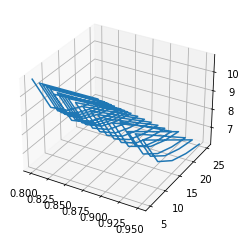

In [44]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(df['Porosity'] , df['PPI']  , df['DeltaT'])

In [45]:
PPI_g = df['PPI']
Porosity = df['Porosity']
hwallg = df['h_wall']
Nussletg = df['Nu_wall']



## cross validation 

In [257]:
accuracy_scores = []
loss_scores = []
k = 15

In [258]:
kfold = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

In [259]:

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [76]:
testing = scaler.fit_transform(testing)

array([[-1.41421356, -1.7751348 ],
       [-0.70710678, -1.7751348 ],
       [ 0.        , -1.7751348 ],
       [ 0.70710678, -1.7751348 ],
       [ 1.41421356, -1.7751348 ],
       [-1.41421356, -1.54559151],
       [-0.70710678, -1.54559151],
       [ 0.        , -1.54559151],
       [ 0.70710678, -1.54559151],
       [ 1.41421356, -1.54559151],
       [-1.41421356, -1.43081986],
       [-0.70710678, -1.43081986],
       [ 0.        , -1.43081986],
       [ 0.70710678, -1.43081986],
       [ 1.41421356, -1.43081986],
       [-1.41421356, -1.31604822],
       [-0.70710678, -1.31604822],
       [ 0.        , -1.31604822],
       [ 0.70710678, -1.31604822],
       [ 1.41421356, -1.31604822],
       [-1.41421356, -1.20127657],
       [-0.70710678, -1.20127657],
       [ 0.        , -1.20127657],
       [ 0.70710678, -1.20127657],
       [ 1.41421356, -1.20127657],
       [-1.41421356, -1.08650492],
       [-0.70710678, -1.08650492],
       [ 0.        , -1.08650492],
       [ 0.70710678,

In [260]:
kfold = KFold(n_splits=k, shuffle=True, random_state=42)
for train_index, test_index in kfold.split(X_scaled):
    # Split data into training and testing sets
    X_train, X_test = X_scaled[train_index], X_scaled[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Create a new ANN model
    model = Sequential()
    # Add layers to the model
    model.add(Dense(16, input_dim=X.shape[1], activation='relu'))
    
    model.add(Dense(31, activation='relu'))
    model.add(Dense(1))
    optimizer=tf.keras.optimizers.RMSprop(0.001)
    # Compile the model
    model.compile(loss='mean_squared_error', optimizer=optimizer)
    
    # Train the model
    model.fit(X_train, y_train, epochs=1000, batch_size=32, verbose=0)
    
    # Evaluate the model on the test set
    scores = model.evaluate(X_test, y_test, verbose=0)
    ypred= model.predict(X_test)
    r = r2_score(y_test , ypred)
    accuracy_scores.append(r)
    # Store the evaluation metric
    loss_scores.append(scores)

# Print the average evaluation metric
print('Average Loss:', np.mean(loss_scores))

1/1 [==============================] - 0s 34ms/step
Average Loss: 0.006948375383702418


In [283]:
accuracy_scores

[0.9973522443091238,
 0.9931688029414855,
 0.9977383414711862,
 0.9972431539117199,
 0.9963878344605445,
 0.9941842567860442,
 0.9906377025416628,
 0.9865373632466382,
 0.9972846337173806,
 0.9926335117769705,
 0.9904871183084505,
 0.9950791991457503,
 0.9909127559419251,
 0.9542404417031518,
 0.9986046375492541]

In [311]:
res1 = np.array(accuracy_scores)
res2 = np.array(loss_scores)
res3 = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]

In [306]:
res2.shape

(15,)

In [316]:
res = np.concatenate((np.array(res3).reshape(-1,1) ,np.array(res1).reshape(-1,1) , res2.reshape(-1,1)) , axis = 1 )

In [319]:
res

array([[1.00000000e+00, 9.97352244e-01, 5.49482508e-03],
       [2.00000000e+00, 9.93168803e-01, 2.05052793e-02],
       [3.00000000e+00, 9.97738341e-01, 2.82076909e-03],
       [4.00000000e+00, 9.97243154e-01, 6.83047296e-03],
       [5.00000000e+00, 9.96387834e-01, 3.52651975e-03],
       [6.00000000e+00, 9.94184257e-01, 1.36244046e-02],
       [7.00000000e+00, 9.90637703e-01, 1.23421084e-02],
       [8.00000000e+00, 9.86537363e-01, 1.22557429e-03],
       [9.00000000e+00, 9.97284634e-01, 2.62121647e-03],
       [1.00000000e+01, 9.92633512e-01, 9.82567761e-03],
       [1.10000000e+01, 9.90487118e-01, 4.15957067e-03],
       [1.20000000e+01, 9.95079199e-01, 6.95184106e-03],
       [1.30000000e+01, 9.90912756e-01, 3.76818608e-03],
       [1.40000000e+01, 9.54240442e-01, 7.71960057e-03],
       [1.50000000e+01, 9.98604638e-01, 2.80958484e-03]])

In [320]:
ans2 = pd.DataFrame(res)

In [321]:
ans2.columns = ['k' , 'R2' , 'loss_scores']

In [322]:
ans2

,k,R2,loss_scores
0,1.0,0.997352,0.005495
1,2.0,0.993169,0.020505
2,3.0,0.997738,0.002821
3,4.0,0.997243,0.006830
4,5.0,0.996388,0.003527
5,6.0,0.994184,0.013624
6,7.0,0.990638,0.012342
7,8.0,0.986537,0.001226
8,9.0,0.997285,0.002621
9,10.0,0.992634,0.009826


In [323]:
ans2.to_excel('cross_validation.xlsx', index=False)

In [46]:
import matplotlib.pyplot as plt


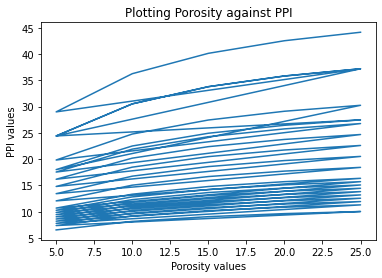

In [47]:
plt.plot(PPI_g,Nussletg)
plt.xlabel('Porosity values')
plt.ylabel('PPI values')
plt.title('Plotting Porosity against PPI')
plt.show()



##  other way for ann model 




In [48]:
X_train

array([[-0.58843894,  1.53398003],
       [ 0.82381452, -0.01474981],
       [ 0.11768779,  1.09148579],
       [-1.29456567, -0.89973829],
       [ 0.82381452,  1.31273291],
       [-0.58843894, -0.34662049],
       [-1.29456567, -0.23599693],
       [-0.58843894,  1.75522715],
       [-0.58843894, -0.67849117],
       [ 0.82381452,  1.97647428],
       [ 0.82381452, -0.34662049],
       [-1.29456567,  0.20649731],
       [ 1.52994125, -0.78911473],
       [ 1.52994125, -1.34223253],
       [ 0.82381452,  0.20649731],
       [ 1.52994125, -0.23599693],
       [-0.58843894, -0.78911473],
       [ 0.11768779,  1.53398003],
       [ 0.82381452, -1.34223253],
       [ 1.52994125,  0.87023867],
       [-1.29456567, -0.56786761],
       [-0.58843894,  0.64899155],
       [-1.29456567,  0.87023867],
       [ 0.11768779, -0.34662049],
       [ 0.11768779, -0.23599693],
       [ 1.52994125,  1.53398003],
       [ 0.82381452, -1.12098541],
       [-1.29456567,  0.42774443],
       [-1.29456567,

In [108]:
X_train = X_train.astype('float32')
y_train = y_train.astype('float32')
X_test =  X_test.astype('float32')
y_test = y_test.astype('float32')

In [109]:
X_train.shape

(64, 3)

In [110]:
from  keras.models import Sequential 
from  keras.layers import Dense 


model = Sequential()

### deefining thr input layer
model.add(Dense(units=256 , input_dim =3 , kernel_initializer='normal' , activation='sigmoid'))
## Defining the seond layer of the model 
model.add(Dense(128 , kernel_initializer='normal' , activation='sigmoid'))
#model.add(Dense(256 , kernel_initializer='normal' , activation='sigmoid'))
model.add(Dense(256 , kernel_initializer='normal' , activation='sigmoid'))
model.add(Dense(1 , kernel_initializer='normal') )

model.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))



In [135]:
testing = scaler.fit_transform(testing)

In [113]:
model.fit(np.array(X_train) , np.array(y_train) , batch_size =64 , epochs=5000 , verbose =2)

Epoch 1/5000
1/1 - 0s - loss: 39.5321 - 3ms/epoch - 3ms/step
Epoch 2/5000
1/1 - 0s - loss: 38.1670 - 2ms/epoch - 2ms/step
Epoch 3/5000
1/1 - 0s - loss: 36.4318 - 2ms/epoch - 2ms/step
Epoch 4/5000
1/1 - 0s - loss: 35.5890 - 1ms/epoch - 1ms/step
Epoch 5/5000
1/1 - 0s - loss: 36.0388 - 2ms/epoch - 2ms/step
Epoch 6/5000
1/1 - 0s - loss: 36.9387 - 2ms/epoch - 2ms/step
Epoch 7/5000
1/1 - 0s - loss: 37.1371 - 2ms/epoch - 2ms/step
Epoch 8/5000
1/1 - 0s - loss: 36.3540 - 2ms/epoch - 2ms/step
Epoch 9/5000
1/1 - 0s - loss: 35.4224 - 2ms/epoch - 2ms/step
Epoch 10/5000
1/1 - 0s - loss: 35.2625 - 1ms/epoch - 1ms/step
Epoch 11/5000
1/1 - 0s - loss: 35.7549 - 1ms/epoch - 1ms/step
Epoch 12/5000
1/1 - 0s - loss: 36.0456 - 1ms/epoch - 1ms/step
Epoch 13/5000
1/1 - 0s - loss: 35.6734 - 2ms/epoch - 2ms/step
Epoch 14/5000
1/1 - 0s - loss: 35.0647 - 2ms/epoch - 2ms/step
Epoch 15/5000
1/1 - 0s - loss: 34.8861 - 2ms/epoch - 2ms/step
Epoch 16/5000
1/1 - 0s - loss: 35.1472 - 2ms/epoch - 2ms/step
Epoch 17/5000
1/1

Epoch 133/5000
1/1 - 0s - loss: 27.7100 - 2ms/epoch - 2ms/step
Epoch 134/5000
1/1 - 0s - loss: 27.6545 - 2ms/epoch - 2ms/step
Epoch 135/5000
1/1 - 0s - loss: 27.5993 - 2ms/epoch - 2ms/step
Epoch 136/5000
1/1 - 0s - loss: 27.5440 - 1ms/epoch - 1ms/step
Epoch 137/5000
1/1 - 0s - loss: 27.4886 - 2ms/epoch - 2ms/step
Epoch 138/5000
1/1 - 0s - loss: 27.4338 - 2ms/epoch - 2ms/step
Epoch 139/5000
1/1 - 0s - loss: 27.3790 - 1ms/epoch - 1ms/step
Epoch 140/5000
1/1 - 0s - loss: 27.3239 - 2ms/epoch - 2ms/step
Epoch 141/5000
1/1 - 0s - loss: 27.2691 - 2ms/epoch - 2ms/step
Epoch 142/5000
1/1 - 0s - loss: 27.2143 - 1ms/epoch - 1ms/step
Epoch 143/5000
1/1 - 0s - loss: 27.1594 - 2ms/epoch - 2ms/step
Epoch 144/5000
1/1 - 0s - loss: 27.1052 - 2ms/epoch - 2ms/step
Epoch 145/5000
1/1 - 0s - loss: 27.0505 - 1ms/epoch - 1ms/step
Epoch 146/5000
1/1 - 0s - loss: 26.9961 - 2ms/epoch - 2ms/step
Epoch 147/5000
1/1 - 0s - loss: 26.9417 - 2ms/epoch - 2ms/step
Epoch 148/5000
1/1 - 0s - loss: 26.8875 - 1ms/epoch - 1

1/1 - 0s - loss: 21.1895 - 1ms/epoch - 1ms/step
Epoch 264/5000
1/1 - 0s - loss: 21.1500 - 1ms/epoch - 1ms/step
Epoch 265/5000
1/1 - 0s - loss: 21.1142 - 2ms/epoch - 2ms/step
Epoch 266/5000
1/1 - 0s - loss: 21.0847 - 2ms/epoch - 2ms/step
Epoch 267/5000
1/1 - 0s - loss: 21.0660 - 2ms/epoch - 2ms/step
Epoch 268/5000
1/1 - 0s - loss: 21.0657 - 2ms/epoch - 2ms/step
Epoch 269/5000
1/1 - 0s - loss: 21.0961 - 2ms/epoch - 2ms/step
Epoch 270/5000
1/1 - 0s - loss: 21.1786 - 2ms/epoch - 2ms/step
Epoch 271/5000
1/1 - 0s - loss: 21.3450 - 2ms/epoch - 2ms/step
Epoch 272/5000
1/1 - 0s - loss: 21.6429 - 2ms/epoch - 2ms/step
Epoch 273/5000
1/1 - 0s - loss: 22.1191 - 1ms/epoch - 1ms/step
Epoch 274/5000
1/1 - 0s - loss: 22.8016 - 2ms/epoch - 2ms/step
Epoch 275/5000
1/1 - 0s - loss: 23.5685 - 2ms/epoch - 2ms/step
Epoch 276/5000
1/1 - 0s - loss: 24.1131 - 2ms/epoch - 2ms/step
Epoch 277/5000
1/1 - 0s - loss: 23.8842 - 1ms/epoch - 1ms/step
Epoch 278/5000
1/1 - 0s - loss: 22.7311 - 2ms/epoch - 2ms/step
Epoch 2

Epoch 394/5000
1/1 - 0s - loss: 15.8727 - 2ms/epoch - 2ms/step
Epoch 395/5000
1/1 - 0s - loss: 15.8367 - 1ms/epoch - 1ms/step
Epoch 396/5000
1/1 - 0s - loss: 15.8007 - 2ms/epoch - 2ms/step
Epoch 397/5000
1/1 - 0s - loss: 15.7647 - 2ms/epoch - 2ms/step
Epoch 398/5000
1/1 - 0s - loss: 15.7290 - 2ms/epoch - 2ms/step
Epoch 399/5000
1/1 - 0s - loss: 15.6931 - 2ms/epoch - 2ms/step
Epoch 400/5000
1/1 - 0s - loss: 15.6573 - 1ms/epoch - 1ms/step
Epoch 401/5000
1/1 - 0s - loss: 15.6216 - 2ms/epoch - 2ms/step
Epoch 402/5000
1/1 - 0s - loss: 15.5859 - 2ms/epoch - 2ms/step
Epoch 403/5000
1/1 - 0s - loss: 15.5504 - 2ms/epoch - 2ms/step
Epoch 404/5000
1/1 - 0s - loss: 15.5148 - 2ms/epoch - 2ms/step
Epoch 405/5000
1/1 - 0s - loss: 15.4795 - 2ms/epoch - 2ms/step
Epoch 406/5000
1/1 - 0s - loss: 15.4441 - 2ms/epoch - 2ms/step
Epoch 407/5000
1/1 - 0s - loss: 15.4088 - 2ms/epoch - 2ms/step
Epoch 408/5000
1/1 - 0s - loss: 15.3735 - 2ms/epoch - 2ms/step
Epoch 409/5000
1/1 - 0s - loss: 15.3383 - 2ms/epoch - 2

1/1 - 0s - loss: 11.7218 - 2ms/epoch - 2ms/step
Epoch 525/5000
1/1 - 0s - loss: 11.7110 - 2ms/epoch - 2ms/step
Epoch 526/5000
1/1 - 0s - loss: 11.7122 - 2ms/epoch - 2ms/step
Epoch 527/5000
1/1 - 0s - loss: 11.7332 - 2ms/epoch - 2ms/step
Epoch 528/5000
1/1 - 0s - loss: 11.7871 - 1ms/epoch - 1ms/step
Epoch 529/5000
1/1 - 0s - loss: 11.8964 - 2ms/epoch - 2ms/step
Epoch 530/5000
1/1 - 0s - loss: 12.0919 - 1ms/epoch - 1ms/step
Epoch 531/5000
1/1 - 0s - loss: 12.4205 - 2ms/epoch - 2ms/step
Epoch 532/5000
1/1 - 0s - loss: 12.9201 - 2ms/epoch - 2ms/step
Epoch 533/5000
1/1 - 0s - loss: 13.6045 - 1ms/epoch - 1ms/step
Epoch 534/5000
1/1 - 0s - loss: 14.3257 - 2ms/epoch - 2ms/step
Epoch 535/5000
1/1 - 0s - loss: 14.7750 - 2ms/epoch - 2ms/step
Epoch 536/5000
1/1 - 0s - loss: 14.4507 - 1ms/epoch - 1ms/step
Epoch 537/5000
1/1 - 0s - loss: 13.3028 - 2ms/epoch - 2ms/step
Epoch 538/5000
1/1 - 0s - loss: 11.9348 - 2ms/epoch - 2ms/step
Epoch 539/5000
1/1 - 0s - loss: 11.2805 - 2ms/epoch - 2ms/step
Epoch 5

Epoch 656/5000
1/1 - 0s - loss: 8.4014 - 2ms/epoch - 2ms/step
Epoch 657/5000
1/1 - 0s - loss: 8.3797 - 2ms/epoch - 2ms/step
Epoch 658/5000
1/1 - 0s - loss: 8.3580 - 2ms/epoch - 2ms/step
Epoch 659/5000
1/1 - 0s - loss: 8.3363 - 2ms/epoch - 2ms/step
Epoch 660/5000
1/1 - 0s - loss: 8.3147 - 2ms/epoch - 2ms/step
Epoch 661/5000
1/1 - 0s - loss: 8.2931 - 2ms/epoch - 2ms/step
Epoch 662/5000
1/1 - 0s - loss: 8.2717 - 1ms/epoch - 1ms/step
Epoch 663/5000
1/1 - 0s - loss: 8.2502 - 2ms/epoch - 2ms/step
Epoch 664/5000
1/1 - 0s - loss: 8.2288 - 2ms/epoch - 2ms/step
Epoch 665/5000
1/1 - 0s - loss: 8.2073 - 1ms/epoch - 1ms/step
Epoch 666/5000
1/1 - 0s - loss: 8.1861 - 2ms/epoch - 2ms/step
Epoch 667/5000
1/1 - 0s - loss: 8.1648 - 2ms/epoch - 2ms/step
Epoch 668/5000
1/1 - 0s - loss: 8.1435 - 2ms/epoch - 2ms/step
Epoch 669/5000
1/1 - 0s - loss: 8.1223 - 2ms/epoch - 2ms/step
Epoch 670/5000
1/1 - 0s - loss: 8.1012 - 2ms/epoch - 2ms/step
Epoch 671/5000
1/1 - 0s - loss: 8.0801 - 2ms/epoch - 2ms/step
Epoch 67

1/1 - 0s - loss: 5.9207 - 3ms/epoch - 3ms/step
Epoch 789/5000
1/1 - 0s - loss: 5.9203 - 1ms/epoch - 1ms/step
Epoch 790/5000
1/1 - 0s - loss: 5.9323 - 2ms/epoch - 2ms/step
Epoch 791/5000
1/1 - 0s - loss: 5.9670 - 1ms/epoch - 1ms/step
Epoch 792/5000
1/1 - 0s - loss: 6.0422 - 1ms/epoch - 1ms/step
Epoch 793/5000
1/1 - 0s - loss: 6.1899 - 2ms/epoch - 2ms/step
Epoch 794/5000
1/1 - 0s - loss: 6.4607 - 2ms/epoch - 2ms/step
Epoch 795/5000
1/1 - 0s - loss: 6.9359 - 1ms/epoch - 1ms/step
Epoch 796/5000
1/1 - 0s - loss: 7.6947 - 2ms/epoch - 2ms/step
Epoch 797/5000
1/1 - 0s - loss: 8.7739 - 1ms/epoch - 1ms/step
Epoch 798/5000
1/1 - 0s - loss: 9.8926 - 2ms/epoch - 2ms/step
Epoch 799/5000
1/1 - 0s - loss: 10.4213 - 2ms/epoch - 2ms/step
Epoch 800/5000
1/1 - 0s - loss: 9.4900 - 2ms/epoch - 2ms/step
Epoch 801/5000
1/1 - 0s - loss: 7.4420 - 2ms/epoch - 2ms/step
Epoch 802/5000
1/1 - 0s - loss: 5.8445 - 2ms/epoch - 2ms/step
Epoch 803/5000
1/1 - 0s - loss: 5.9382 - 2ms/epoch - 2ms/step
Epoch 804/5000
1/1 - 0

Epoch 921/5000
1/1 - 0s - loss: 4.0352 - 1ms/epoch - 1ms/step
Epoch 922/5000
1/1 - 0s - loss: 4.0233 - 2ms/epoch - 2ms/step
Epoch 923/5000
1/1 - 0s - loss: 4.0114 - 2ms/epoch - 2ms/step
Epoch 924/5000
1/1 - 0s - loss: 3.9995 - 2ms/epoch - 2ms/step
Epoch 925/5000
1/1 - 0s - loss: 3.9878 - 2ms/epoch - 2ms/step
Epoch 926/5000
1/1 - 0s - loss: 3.9759 - 2ms/epoch - 2ms/step
Epoch 927/5000
1/1 - 0s - loss: 3.9642 - 2ms/epoch - 2ms/step
Epoch 928/5000
1/1 - 0s - loss: 3.9524 - 2ms/epoch - 2ms/step
Epoch 929/5000
1/1 - 0s - loss: 3.9408 - 2ms/epoch - 2ms/step
Epoch 930/5000
1/1 - 0s - loss: 3.9291 - 2ms/epoch - 2ms/step
Epoch 931/5000
1/1 - 0s - loss: 3.9174 - 2ms/epoch - 2ms/step
Epoch 932/5000
1/1 - 0s - loss: 3.9057 - 2ms/epoch - 2ms/step
Epoch 933/5000
1/1 - 0s - loss: 3.8942 - 2ms/epoch - 2ms/step
Epoch 934/5000
1/1 - 0s - loss: 3.8827 - 2ms/epoch - 2ms/step
Epoch 935/5000
1/1 - 0s - loss: 3.8711 - 2ms/epoch - 2ms/step
Epoch 936/5000
1/1 - 0s - loss: 3.8596 - 2ms/epoch - 2ms/step
Epoch 93

Epoch 1053/5000
1/1 - 0s - loss: 2.6959 - 1ms/epoch - 1ms/step
Epoch 1054/5000
1/1 - 0s - loss: 2.6874 - 1ms/epoch - 1ms/step
Epoch 1055/5000
1/1 - 0s - loss: 2.6789 - 2ms/epoch - 2ms/step
Epoch 1056/5000
1/1 - 0s - loss: 2.6704 - 2ms/epoch - 2ms/step
Epoch 1057/5000
1/1 - 0s - loss: 2.6621 - 2ms/epoch - 2ms/step
Epoch 1058/5000
1/1 - 0s - loss: 2.6536 - 2ms/epoch - 2ms/step
Epoch 1059/5000
1/1 - 0s - loss: 2.6452 - 2ms/epoch - 2ms/step
Epoch 1060/5000
1/1 - 0s - loss: 2.6368 - 2ms/epoch - 2ms/step
Epoch 1061/5000
1/1 - 0s - loss: 2.6285 - 2ms/epoch - 2ms/step
Epoch 1062/5000
1/1 - 0s - loss: 2.6202 - 2ms/epoch - 2ms/step
Epoch 1063/5000
1/1 - 0s - loss: 2.6119 - 1ms/epoch - 1ms/step
Epoch 1064/5000
1/1 - 0s - loss: 2.6036 - 2ms/epoch - 2ms/step
Epoch 1065/5000
1/1 - 0s - loss: 2.5953 - 1ms/epoch - 1ms/step
Epoch 1066/5000
1/1 - 0s - loss: 2.5871 - 2ms/epoch - 2ms/step
Epoch 1067/5000
1/1 - 0s - loss: 2.5789 - 2ms/epoch - 2ms/step
Epoch 1068/5000
1/1 - 0s - loss: 2.5707 - 2ms/epoch - 2

1/1 - 0s - loss: 1.7653 - 2ms/epoch - 2ms/step
Epoch 1184/5000
1/1 - 0s - loss: 1.7626 - 2ms/epoch - 2ms/step
Epoch 1185/5000
1/1 - 0s - loss: 1.7593 - 2ms/epoch - 2ms/step
Epoch 1186/5000
1/1 - 0s - loss: 1.7515 - 1ms/epoch - 1ms/step
Epoch 1187/5000
1/1 - 0s - loss: 1.7422 - 2ms/epoch - 2ms/step
Epoch 1188/5000
1/1 - 0s - loss: 1.7358 - 2ms/epoch - 2ms/step
Epoch 1189/5000
1/1 - 0s - loss: 1.7321 - 1ms/epoch - 1ms/step
Epoch 1190/5000
1/1 - 0s - loss: 1.7275 - 2ms/epoch - 2ms/step
Epoch 1191/5000
1/1 - 0s - loss: 1.7203 - 2ms/epoch - 2ms/step
Epoch 1192/5000
1/1 - 0s - loss: 1.7126 - 2ms/epoch - 2ms/step
Epoch 1193/5000
1/1 - 0s - loss: 1.7066 - 2ms/epoch - 2ms/step
Epoch 1194/5000
1/1 - 0s - loss: 1.7022 - 2ms/epoch - 2ms/step
Epoch 1195/5000
1/1 - 0s - loss: 1.6971 - 2ms/epoch - 2ms/step
Epoch 1196/5000
1/1 - 0s - loss: 1.6905 - 2ms/epoch - 2ms/step
Epoch 1197/5000
1/1 - 0s - loss: 1.6837 - 2ms/epoch - 2ms/step
Epoch 1198/5000
1/1 - 0s - loss: 1.6779 - 3ms/epoch - 3ms/step
Epoch 11

Epoch 1314/5000
1/1 - 0s - loss: 1.1184 - 2ms/epoch - 2ms/step
Epoch 1315/5000
1/1 - 0s - loss: 1.1144 - 1ms/epoch - 1ms/step
Epoch 1316/5000
1/1 - 0s - loss: 1.1104 - 2ms/epoch - 2ms/step
Epoch 1317/5000
1/1 - 0s - loss: 1.1064 - 2ms/epoch - 2ms/step
Epoch 1318/5000
1/1 - 0s - loss: 1.1024 - 2ms/epoch - 2ms/step
Epoch 1319/5000
1/1 - 0s - loss: 1.0984 - 2ms/epoch - 2ms/step
Epoch 1320/5000
1/1 - 0s - loss: 1.0945 - 1ms/epoch - 1ms/step
Epoch 1321/5000
1/1 - 0s - loss: 1.0905 - 2ms/epoch - 2ms/step
Epoch 1322/5000
1/1 - 0s - loss: 1.0866 - 2ms/epoch - 2ms/step
Epoch 1323/5000
1/1 - 0s - loss: 1.0827 - 2ms/epoch - 2ms/step
Epoch 1324/5000
1/1 - 0s - loss: 1.0788 - 2ms/epoch - 2ms/step
Epoch 1325/5000
1/1 - 0s - loss: 1.0749 - 2ms/epoch - 2ms/step
Epoch 1326/5000
1/1 - 0s - loss: 1.0710 - 1ms/epoch - 1ms/step
Epoch 1327/5000
1/1 - 0s - loss: 1.0671 - 2ms/epoch - 2ms/step
Epoch 1328/5000
1/1 - 0s - loss: 1.0632 - 2ms/epoch - 2ms/step
Epoch 1329/5000
1/1 - 0s - loss: 1.0594 - 2ms/epoch - 2

1/1 - 0s - loss: 0.8535 - 2ms/epoch - 2ms/step
Epoch 1445/5000
1/1 - 0s - loss: 1.4187 - 2ms/epoch - 2ms/step
Epoch 1446/5000
1/1 - 0s - loss: 1.8452 - 2ms/epoch - 2ms/step
Epoch 1447/5000
1/1 - 0s - loss: 1.7543 - 2ms/epoch - 2ms/step
Epoch 1448/5000
1/1 - 0s - loss: 1.2326 - 3ms/epoch - 3ms/step
Epoch 1449/5000
1/1 - 0s - loss: 0.7630 - 2ms/epoch - 2ms/step
Epoch 1450/5000
1/1 - 0s - loss: 0.7098 - 2ms/epoch - 2ms/step
Epoch 1451/5000
1/1 - 0s - loss: 0.9999 - 2ms/epoch - 2ms/step
Epoch 1452/5000
1/1 - 0s - loss: 1.2630 - 3ms/epoch - 3ms/step
Epoch 1453/5000
1/1 - 0s - loss: 1.2169 - 2ms/epoch - 2ms/step
Epoch 1454/5000
1/1 - 0s - loss: 0.9286 - 2ms/epoch - 2ms/step
Epoch 1455/5000
1/1 - 0s - loss: 0.6890 - 2ms/epoch - 2ms/step
Epoch 1456/5000
1/1 - 0s - loss: 0.6965 - 1ms/epoch - 1ms/step
Epoch 1457/5000
1/1 - 0s - loss: 0.8718 - 2ms/epoch - 2ms/step
Epoch 1458/5000
1/1 - 0s - loss: 0.9873 - 2ms/epoch - 2ms/step
Epoch 1459/5000
1/1 - 0s - loss: 0.9193 - 2ms/epoch - 2ms/step
Epoch 14

Epoch 1575/5000
1/1 - 0s - loss: 0.4101 - 2ms/epoch - 2ms/step
Epoch 1576/5000
1/1 - 0s - loss: 0.4085 - 3ms/epoch - 3ms/step
Epoch 1577/5000
1/1 - 0s - loss: 0.4068 - 3ms/epoch - 3ms/step
Epoch 1578/5000
1/1 - 0s - loss: 0.4051 - 3ms/epoch - 3ms/step
Epoch 1579/5000
1/1 - 0s - loss: 0.4034 - 3ms/epoch - 3ms/step
Epoch 1580/5000
1/1 - 0s - loss: 0.4018 - 3ms/epoch - 3ms/step
Epoch 1581/5000
1/1 - 0s - loss: 0.4001 - 2ms/epoch - 2ms/step
Epoch 1582/5000
1/1 - 0s - loss: 0.3985 - 2ms/epoch - 2ms/step
Epoch 1583/5000
1/1 - 0s - loss: 0.3969 - 2ms/epoch - 2ms/step
Epoch 1584/5000
1/1 - 0s - loss: 0.3952 - 3ms/epoch - 3ms/step
Epoch 1585/5000
1/1 - 0s - loss: 0.3936 - 2ms/epoch - 2ms/step
Epoch 1586/5000
1/1 - 0s - loss: 0.3920 - 2ms/epoch - 2ms/step
Epoch 1587/5000
1/1 - 0s - loss: 0.3904 - 2ms/epoch - 2ms/step
Epoch 1588/5000
1/1 - 0s - loss: 0.3888 - 2ms/epoch - 2ms/step
Epoch 1589/5000
1/1 - 0s - loss: 0.3872 - 2ms/epoch - 2ms/step
Epoch 1590/5000
1/1 - 0s - loss: 0.3855 - 2ms/epoch - 2

1/1 - 0s - loss: 0.2869 - 2ms/epoch - 2ms/step
Epoch 1706/5000
1/1 - 0s - loss: 0.2410 - 2ms/epoch - 2ms/step
Epoch 1707/5000
1/1 - 0s - loss: 0.2418 - 1ms/epoch - 1ms/step
Epoch 1708/5000
1/1 - 0s - loss: 0.2744 - 2ms/epoch - 2ms/step
Epoch 1709/5000
1/1 - 0s - loss: 0.2950 - 2ms/epoch - 2ms/step
Epoch 1710/5000
1/1 - 0s - loss: 0.2805 - 2ms/epoch - 2ms/step
Epoch 1711/5000
1/1 - 0s - loss: 0.2481 - 2ms/epoch - 2ms/step
Epoch 1712/5000
1/1 - 0s - loss: 0.2298 - 2ms/epoch - 2ms/step
Epoch 1713/5000
1/1 - 0s - loss: 0.2375 - 2ms/epoch - 2ms/step
Epoch 1714/5000
1/1 - 0s - loss: 0.2555 - 2ms/epoch - 2ms/step
Epoch 1715/5000
1/1 - 0s - loss: 0.2611 - 1ms/epoch - 1ms/step
Epoch 1716/5000
1/1 - 0s - loss: 0.2483 - 2ms/epoch - 2ms/step
Epoch 1717/5000
1/1 - 0s - loss: 0.2306 - 2ms/epoch - 2ms/step
Epoch 1718/5000
1/1 - 0s - loss: 0.2237 - 2ms/epoch - 2ms/step
Epoch 1719/5000
1/1 - 0s - loss: 0.2299 - 2ms/epoch - 2ms/step
Epoch 1720/5000
1/1 - 0s - loss: 0.2387 - 1ms/epoch - 1ms/step
Epoch 17

Epoch 1836/5000
1/1 - 0s - loss: 0.1308 - 2ms/epoch - 2ms/step
Epoch 1837/5000
1/1 - 0s - loss: 0.1302 - 1ms/epoch - 1ms/step
Epoch 1838/5000
1/1 - 0s - loss: 0.1296 - 2ms/epoch - 2ms/step
Epoch 1839/5000
1/1 - 0s - loss: 0.1290 - 2ms/epoch - 2ms/step
Epoch 1840/5000
1/1 - 0s - loss: 0.1284 - 2ms/epoch - 2ms/step
Epoch 1841/5000
1/1 - 0s - loss: 0.1278 - 2ms/epoch - 2ms/step
Epoch 1842/5000
1/1 - 0s - loss: 0.1272 - 1ms/epoch - 1ms/step
Epoch 1843/5000
1/1 - 0s - loss: 0.1266 - 2ms/epoch - 2ms/step
Epoch 1844/5000
1/1 - 0s - loss: 0.1260 - 3ms/epoch - 3ms/step
Epoch 1845/5000
1/1 - 0s - loss: 0.1254 - 2ms/epoch - 2ms/step
Epoch 1846/5000
1/1 - 0s - loss: 0.1248 - 1ms/epoch - 1ms/step
Epoch 1847/5000
1/1 - 0s - loss: 0.1242 - 2ms/epoch - 2ms/step
Epoch 1848/5000
1/1 - 0s - loss: 0.1237 - 2ms/epoch - 2ms/step
Epoch 1849/5000
1/1 - 0s - loss: 0.1231 - 2ms/epoch - 2ms/step
Epoch 1850/5000
1/1 - 0s - loss: 0.1225 - 2ms/epoch - 2ms/step
Epoch 1851/5000
1/1 - 0s - loss: 0.1219 - 2ms/epoch - 2

1/1 - 0s - loss: 0.0702 - 2ms/epoch - 2ms/step
Epoch 1967/5000
1/1 - 0s - loss: 0.0718 - 2ms/epoch - 2ms/step
Epoch 1968/5000
1/1 - 0s - loss: 0.0765 - 2ms/epoch - 2ms/step
Epoch 1969/5000
1/1 - 0s - loss: 0.0786 - 3ms/epoch - 3ms/step
Epoch 1970/5000
1/1 - 0s - loss: 0.0760 - 1ms/epoch - 1ms/step
Epoch 1971/5000
1/1 - 0s - loss: 0.0712 - 2ms/epoch - 2ms/step
Epoch 1972/5000
1/1 - 0s - loss: 0.0681 - 2ms/epoch - 2ms/step
Epoch 1973/5000
1/1 - 0s - loss: 0.0685 - 2ms/epoch - 2ms/step
Epoch 1974/5000
1/1 - 0s - loss: 0.0708 - 2ms/epoch - 2ms/step
Epoch 1975/5000
1/1 - 0s - loss: 0.0721 - 2ms/epoch - 2ms/step
Epoch 1976/5000
1/1 - 0s - loss: 0.0709 - 2ms/epoch - 2ms/step
Epoch 1977/5000
1/1 - 0s - loss: 0.0683 - 2ms/epoch - 2ms/step
Epoch 1978/5000
1/1 - 0s - loss: 0.0662 - 2ms/epoch - 2ms/step
Epoch 1979/5000
1/1 - 0s - loss: 0.0659 - 1ms/epoch - 1ms/step
Epoch 1980/5000
1/1 - 0s - loss: 0.0668 - 3ms/epoch - 3ms/step
Epoch 1981/5000
1/1 - 0s - loss: 0.0676 - 2ms/epoch - 2ms/step
Epoch 19

Epoch 2097/5000
1/1 - 0s - loss: 0.0357 - 2ms/epoch - 2ms/step
Epoch 2098/5000
1/1 - 0s - loss: 0.0355 - 2ms/epoch - 2ms/step
Epoch 2099/5000
1/1 - 0s - loss: 0.0353 - 2ms/epoch - 2ms/step
Epoch 2100/5000
1/1 - 0s - loss: 0.0351 - 2ms/epoch - 2ms/step
Epoch 2101/5000
1/1 - 0s - loss: 0.0350 - 2ms/epoch - 2ms/step
Epoch 2102/5000
1/1 - 0s - loss: 0.0348 - 2ms/epoch - 2ms/step
Epoch 2103/5000
1/1 - 0s - loss: 0.0346 - 2ms/epoch - 2ms/step
Epoch 2104/5000
1/1 - 0s - loss: 0.0344 - 1ms/epoch - 1ms/step
Epoch 2105/5000
1/1 - 0s - loss: 0.0342 - 2ms/epoch - 2ms/step
Epoch 2106/5000
1/1 - 0s - loss: 0.0340 - 2ms/epoch - 2ms/step
Epoch 2107/5000
1/1 - 0s - loss: 0.0339 - 2ms/epoch - 2ms/step
Epoch 2108/5000
1/1 - 0s - loss: 0.0337 - 2ms/epoch - 2ms/step
Epoch 2109/5000
1/1 - 0s - loss: 0.0335 - 2ms/epoch - 2ms/step
Epoch 2110/5000
1/1 - 0s - loss: 0.0333 - 1ms/epoch - 1ms/step
Epoch 2111/5000
1/1 - 0s - loss: 0.0331 - 2ms/epoch - 2ms/step
Epoch 2112/5000
1/1 - 0s - loss: 0.0330 - 2ms/epoch - 2

1/1 - 0s - loss: 0.0203 - 2ms/epoch - 2ms/step
Epoch 2228/5000
1/1 - 0s - loss: 0.0187 - 2ms/epoch - 2ms/step
Epoch 2229/5000
1/1 - 0s - loss: 0.0176 - 1ms/epoch - 1ms/step
Epoch 2230/5000
1/1 - 0s - loss: 0.0177 - 1ms/epoch - 1ms/step
Epoch 2231/5000
1/1 - 0s - loss: 0.0186 - 2ms/epoch - 2ms/step
Epoch 2232/5000
1/1 - 0s - loss: 0.0190 - 2ms/epoch - 2ms/step
Epoch 2233/5000
1/1 - 0s - loss: 0.0184 - 2ms/epoch - 2ms/step
Epoch 2234/5000
1/1 - 0s - loss: 0.0175 - 2ms/epoch - 2ms/step
Epoch 2235/5000
1/1 - 0s - loss: 0.0169 - 2ms/epoch - 2ms/step
Epoch 2236/5000
1/1 - 0s - loss: 0.0171 - 3ms/epoch - 3ms/step
Epoch 2237/5000
1/1 - 0s - loss: 0.0175 - 2ms/epoch - 2ms/step
Epoch 2238/5000
1/1 - 0s - loss: 0.0176 - 1ms/epoch - 1ms/step
Epoch 2239/5000
1/1 - 0s - loss: 0.0172 - 2ms/epoch - 2ms/step
Epoch 2240/5000
1/1 - 0s - loss: 0.0167 - 2ms/epoch - 2ms/step
Epoch 2241/5000
1/1 - 0s - loss: 0.0164 - 2ms/epoch - 2ms/step
Epoch 2242/5000
1/1 - 0s - loss: 0.0164 - 1ms/epoch - 1ms/step
Epoch 22

Epoch 2358/5000
1/1 - 0s - loss: 0.0083 - 2ms/epoch - 2ms/step
Epoch 2359/5000
1/1 - 0s - loss: 0.0083 - 2ms/epoch - 2ms/step
Epoch 2360/5000
1/1 - 0s - loss: 0.0082 - 2ms/epoch - 2ms/step
Epoch 2361/5000
1/1 - 0s - loss: 0.0082 - 2ms/epoch - 2ms/step
Epoch 2362/5000
1/1 - 0s - loss: 0.0081 - 1ms/epoch - 1ms/step
Epoch 2363/5000
1/1 - 0s - loss: 0.0081 - 2ms/epoch - 2ms/step
Epoch 2364/5000
1/1 - 0s - loss: 0.0080 - 2ms/epoch - 2ms/step
Epoch 2365/5000
1/1 - 0s - loss: 0.0080 - 2ms/epoch - 2ms/step
Epoch 2366/5000
1/1 - 0s - loss: 0.0079 - 1ms/epoch - 1ms/step
Epoch 2367/5000
1/1 - 0s - loss: 0.0079 - 2ms/epoch - 2ms/step
Epoch 2368/5000
1/1 - 0s - loss: 0.0078 - 2ms/epoch - 2ms/step
Epoch 2369/5000
1/1 - 0s - loss: 0.0078 - 2ms/epoch - 2ms/step
Epoch 2370/5000
1/1 - 0s - loss: 0.0077 - 2ms/epoch - 2ms/step
Epoch 2371/5000
1/1 - 0s - loss: 0.0077 - 2ms/epoch - 2ms/step
Epoch 2372/5000
1/1 - 0s - loss: 0.0077 - 2ms/epoch - 2ms/step
Epoch 2373/5000
1/1 - 0s - loss: 0.0076 - 2ms/epoch - 2

1/1 - 0s - loss: 0.0348 - 2ms/epoch - 2ms/step
Epoch 2489/5000
1/1 - 0s - loss: 0.0261 - 2ms/epoch - 2ms/step
Epoch 2490/5000
1/1 - 0s - loss: 0.0086 - 2ms/epoch - 2ms/step
Epoch 2491/5000
1/1 - 0s - loss: 0.0048 - 2ms/epoch - 2ms/step
Epoch 2492/5000
1/1 - 0s - loss: 0.0152 - 1ms/epoch - 1ms/step
Epoch 2493/5000
1/1 - 0s - loss: 0.0225 - 1ms/epoch - 1ms/step
Epoch 2494/5000
1/1 - 0s - loss: 0.0165 - 2ms/epoch - 2ms/step
Epoch 2495/5000
1/1 - 0s - loss: 0.0062 - 2ms/epoch - 2ms/step
Epoch 2496/5000
1/1 - 0s - loss: 0.0044 - 2ms/epoch - 2ms/step
Epoch 2497/5000
1/1 - 0s - loss: 0.0108 - 2ms/epoch - 2ms/step
Epoch 2498/5000
1/1 - 0s - loss: 0.0149 - 2ms/epoch - 2ms/step
Epoch 2499/5000
1/1 - 0s - loss: 0.0112 - 2ms/epoch - 2ms/step
Epoch 2500/5000
1/1 - 0s - loss: 0.0051 - 2ms/epoch - 2ms/step
Epoch 2501/5000
1/1 - 0s - loss: 0.0040 - 1ms/epoch - 1ms/step
Epoch 2502/5000
1/1 - 0s - loss: 0.0077 - 1ms/epoch - 1ms/step
Epoch 2503/5000
1/1 - 0s - loss: 0.0102 - 1ms/epoch - 1ms/step
Epoch 25

Epoch 2619/5000
1/1 - 0s - loss: 0.0018 - 2ms/epoch - 2ms/step
Epoch 2620/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2621/5000
1/1 - 0s - loss: 0.0017 - 1ms/epoch - 1ms/step
Epoch 2622/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2623/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2624/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2625/5000
1/1 - 0s - loss: 0.0017 - 1ms/epoch - 1ms/step
Epoch 2626/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2627/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2628/5000
1/1 - 0s - loss: 0.0017 - 2ms/epoch - 2ms/step
Epoch 2629/5000
1/1 - 0s - loss: 0.0017 - 1ms/epoch - 1ms/step
Epoch 2630/5000
1/1 - 0s - loss: 0.0016 - 2ms/epoch - 2ms/step
Epoch 2631/5000
1/1 - 0s - loss: 0.0016 - 1ms/epoch - 1ms/step
Epoch 2632/5000
1/1 - 0s - loss: 0.0016 - 2ms/epoch - 2ms/step
Epoch 2633/5000
1/1 - 0s - loss: 0.0016 - 2ms/epoch - 2ms/step
Epoch 2634/5000
1/1 - 0s - loss: 0.0016 - 2ms/epoch - 2

Epoch 2749/5000
1/1 - 0s - loss: 1.4534 - 2ms/epoch - 2ms/step
Epoch 2750/5000
1/1 - 0s - loss: 2.1020 - 2ms/epoch - 2ms/step
Epoch 2751/5000
1/1 - 0s - loss: 2.7407 - 1ms/epoch - 1ms/step
Epoch 2752/5000
1/1 - 0s - loss: 3.1012 - 1ms/epoch - 1ms/step
Epoch 2753/5000
1/1 - 0s - loss: 2.7706 - 2ms/epoch - 2ms/step
Epoch 2754/5000
1/1 - 0s - loss: 1.7621 - 3ms/epoch - 3ms/step
Epoch 2755/5000
1/1 - 0s - loss: 0.5874 - 2ms/epoch - 2ms/step
Epoch 2756/5000
1/1 - 0s - loss: 0.0113 - 2ms/epoch - 2ms/step
Epoch 2757/5000
1/1 - 0s - loss: 0.2712 - 2ms/epoch - 2ms/step
Epoch 2758/5000
1/1 - 0s - loss: 0.9304 - 2ms/epoch - 2ms/step
Epoch 2759/5000
1/1 - 0s - loss: 1.3157 - 2ms/epoch - 2ms/step
Epoch 2760/5000
1/1 - 0s - loss: 1.0575 - 1ms/epoch - 1ms/step
Epoch 2761/5000
1/1 - 0s - loss: 0.4304 - 2ms/epoch - 2ms/step
Epoch 2762/5000
1/1 - 0s - loss: 0.0211 - 1ms/epoch - 1ms/step
Epoch 2763/5000
1/1 - 0s - loss: 0.1310 - 2ms/epoch - 2ms/step
Epoch 2764/5000
1/1 - 0s - loss: 0.5095 - 2ms/epoch - 2

Epoch 2876/5000
1/1 - 0s - loss: 4.6806e-04 - 2ms/epoch - 2ms/step
Epoch 2877/5000
1/1 - 0s - loss: 4.6838e-04 - 2ms/epoch - 2ms/step
Epoch 2878/5000
1/1 - 0s - loss: 4.6690e-04 - 1ms/epoch - 1ms/step
Epoch 2879/5000
1/1 - 0s - loss: 4.6371e-04 - 1ms/epoch - 1ms/step
Epoch 2880/5000
1/1 - 0s - loss: 4.5921e-04 - 2ms/epoch - 2ms/step
Epoch 2881/5000
1/1 - 0s - loss: 4.5474e-04 - 2ms/epoch - 2ms/step
Epoch 2882/5000
1/1 - 0s - loss: 4.5142e-04 - 2ms/epoch - 2ms/step
Epoch 2883/5000
1/1 - 0s - loss: 4.5013e-04 - 1ms/epoch - 1ms/step
Epoch 2884/5000
1/1 - 0s - loss: 4.4900e-04 - 2ms/epoch - 2ms/step
Epoch 2885/5000
1/1 - 0s - loss: 4.4858e-04 - 1ms/epoch - 1ms/step
Epoch 2886/5000
1/1 - 0s - loss: 4.4734e-04 - 2ms/epoch - 2ms/step
Epoch 2887/5000
1/1 - 0s - loss: 4.4482e-04 - 2ms/epoch - 2ms/step
Epoch 2888/5000
1/1 - 0s - loss: 4.4240e-04 - 2ms/epoch - 2ms/step
Epoch 2889/5000
1/1 - 0s - loss: 4.3866e-04 - 3ms/epoch - 3ms/step
Epoch 2890/5000
1/1 - 0s - loss: 4.3625e-04 - 2ms/epoch - 2ms/

Epoch 2999/5000
1/1 - 0s - loss: 0.0219 - 2ms/epoch - 2ms/step
Epoch 3000/5000
1/1 - 0s - loss: 0.0360 - 2ms/epoch - 2ms/step
Epoch 3001/5000
1/1 - 0s - loss: 0.0595 - 2ms/epoch - 2ms/step
Epoch 3002/5000
1/1 - 0s - loss: 0.0990 - 1ms/epoch - 1ms/step
Epoch 3003/5000
1/1 - 0s - loss: 0.1649 - 2ms/epoch - 2ms/step
Epoch 3004/5000
1/1 - 0s - loss: 0.2754 - 2ms/epoch - 2ms/step
Epoch 3005/5000
1/1 - 0s - loss: 0.4567 - 2ms/epoch - 2ms/step
Epoch 3006/5000
1/1 - 0s - loss: 0.7504 - 2ms/epoch - 2ms/step
Epoch 3007/5000
1/1 - 0s - loss: 1.1984 - 2ms/epoch - 2ms/step
Epoch 3008/5000
1/1 - 0s - loss: 1.8392 - 2ms/epoch - 2ms/step
Epoch 3009/5000
1/1 - 0s - loss: 2.5981 - 2ms/epoch - 2ms/step
Epoch 3010/5000
1/1 - 0s - loss: 3.2682 - 2ms/epoch - 2ms/step
Epoch 3011/5000
1/1 - 0s - loss: 3.3589 - 2ms/epoch - 2ms/step
Epoch 3012/5000
1/1 - 0s - loss: 2.5962 - 2ms/epoch - 2ms/step
Epoch 3013/5000
1/1 - 0s - loss: 1.2216 - 3ms/epoch - 3ms/step
Epoch 3014/5000
1/1 - 0s - loss: 0.1705 - 2ms/epoch - 2

1/1 - 0s - loss: 2.4862e-04 - 2ms/epoch - 2ms/step
Epoch 3127/5000
1/1 - 0s - loss: 2.5403e-04 - 1ms/epoch - 1ms/step
Epoch 3128/5000
1/1 - 0s - loss: 2.5291e-04 - 2ms/epoch - 2ms/step
Epoch 3129/5000
1/1 - 0s - loss: 2.4588e-04 - 2ms/epoch - 2ms/step
Epoch 3130/5000
1/1 - 0s - loss: 2.3818e-04 - 1ms/epoch - 1ms/step
Epoch 3131/5000
1/1 - 0s - loss: 2.3412e-04 - 2ms/epoch - 2ms/step
Epoch 3132/5000
1/1 - 0s - loss: 2.3481e-04 - 3ms/epoch - 3ms/step
Epoch 3133/5000
1/1 - 0s - loss: 2.3806e-04 - 3ms/epoch - 3ms/step
Epoch 3134/5000
1/1 - 0s - loss: 2.4036e-04 - 2ms/epoch - 2ms/step
Epoch 3135/5000
1/1 - 0s - loss: 2.3991e-04 - 1ms/epoch - 1ms/step
Epoch 3136/5000
1/1 - 0s - loss: 2.3680e-04 - 2ms/epoch - 2ms/step
Epoch 3137/5000
1/1 - 0s - loss: 2.3307e-04 - 2ms/epoch - 2ms/step
Epoch 3138/5000
1/1 - 0s - loss: 2.3034e-04 - 2ms/epoch - 2ms/step
Epoch 3139/5000
1/1 - 0s - loss: 2.2984e-04 - 2ms/epoch - 2ms/step
Epoch 3140/5000
1/1 - 0s - loss: 2.3070e-04 - 2ms/epoch - 2ms/step
Epoch 3141/

Epoch 3249/5000
1/1 - 0s - loss: 1.8993e-04 - 1ms/epoch - 1ms/step
Epoch 3250/5000
1/1 - 0s - loss: 1.8975e-04 - 2ms/epoch - 2ms/step
Epoch 3251/5000
1/1 - 0s - loss: 1.8947e-04 - 2ms/epoch - 2ms/step
Epoch 3252/5000
1/1 - 0s - loss: 1.8917e-04 - 2ms/epoch - 2ms/step
Epoch 3253/5000
1/1 - 0s - loss: 1.8891e-04 - 2ms/epoch - 2ms/step
Epoch 3254/5000
1/1 - 0s - loss: 1.8861e-04 - 2ms/epoch - 2ms/step
Epoch 3255/5000
1/1 - 0s - loss: 1.8834e-04 - 1ms/epoch - 1ms/step
Epoch 3256/5000
1/1 - 0s - loss: 1.8797e-04 - 2ms/epoch - 2ms/step
Epoch 3257/5000
1/1 - 0s - loss: 1.8778e-04 - 1ms/epoch - 1ms/step
Epoch 3258/5000
1/1 - 0s - loss: 1.8749e-04 - 2ms/epoch - 2ms/step
Epoch 3259/5000
1/1 - 0s - loss: 1.8722e-04 - 2ms/epoch - 2ms/step
Epoch 3260/5000
1/1 - 0s - loss: 1.8684e-04 - 2ms/epoch - 2ms/step
Epoch 3261/5000
1/1 - 0s - loss: 1.8669e-04 - 2ms/epoch - 2ms/step
Epoch 3262/5000
1/1 - 0s - loss: 1.8637e-04 - 2ms/epoch - 2ms/step
Epoch 3263/5000
1/1 - 0s - loss: 1.8615e-04 - 2ms/epoch - 2ms/

Epoch 3375/5000
1/1 - 0s - loss: 0.0488 - 2ms/epoch - 2ms/step
Epoch 3376/5000
1/1 - 0s - loss: 0.0683 - 2ms/epoch - 2ms/step
Epoch 3377/5000
1/1 - 0s - loss: 0.0123 - 2ms/epoch - 2ms/step
Epoch 3378/5000
1/1 - 0s - loss: 0.0118 - 2ms/epoch - 2ms/step
Epoch 3379/5000
1/1 - 0s - loss: 0.0504 - 2ms/epoch - 2ms/step
Epoch 3380/5000
1/1 - 0s - loss: 0.0286 - 2ms/epoch - 2ms/step
Epoch 3381/5000
1/1 - 0s - loss: 4.1790e-04 - 1ms/epoch - 1ms/step
Epoch 3382/5000
1/1 - 0s - loss: 0.0242 - 2ms/epoch - 2ms/step
Epoch 3383/5000
1/1 - 0s - loss: 0.0330 - 2ms/epoch - 2ms/step
Epoch 3384/5000
1/1 - 0s - loss: 0.0060 - 2ms/epoch - 2ms/step
Epoch 3385/5000
1/1 - 0s - loss: 0.0057 - 2ms/epoch - 2ms/step
Epoch 3386/5000
1/1 - 0s - loss: 0.0243 - 2ms/epoch - 2ms/step
Epoch 3387/5000
1/1 - 0s - loss: 0.0144 - 1ms/epoch - 1ms/step
Epoch 3388/5000
1/1 - 0s - loss: 3.4240e-04 - 3ms/epoch - 3ms/step
Epoch 3389/5000
1/1 - 0s - loss: 0.0113 - 2ms/epoch - 2ms/step
Epoch 3390/5000
1/1 - 0s - loss: 0.0163 - 2ms/e

1/1 - 0s - loss: 1.9453e-04 - 3ms/epoch - 3ms/step
Epoch 3500/5000
1/1 - 0s - loss: 1.9433e-04 - 2ms/epoch - 2ms/step
Epoch 3501/5000
1/1 - 0s - loss: 1.9387e-04 - 2ms/epoch - 2ms/step
Epoch 3502/5000
1/1 - 0s - loss: 1.9362e-04 - 1ms/epoch - 1ms/step
Epoch 3503/5000
1/1 - 0s - loss: 1.9336e-04 - 2ms/epoch - 2ms/step
Epoch 3504/5000
1/1 - 0s - loss: 1.9318e-04 - 2ms/epoch - 2ms/step
Epoch 3505/5000
1/1 - 0s - loss: 1.9275e-04 - 2ms/epoch - 2ms/step
Epoch 3506/5000
1/1 - 0s - loss: 1.9250e-04 - 2ms/epoch - 2ms/step
Epoch 3507/5000
1/1 - 0s - loss: 1.9221e-04 - 2ms/epoch - 2ms/step
Epoch 3508/5000
1/1 - 0s - loss: 1.9204e-04 - 2ms/epoch - 2ms/step
Epoch 3509/5000
1/1 - 0s - loss: 1.9165e-04 - 2ms/epoch - 2ms/step
Epoch 3510/5000
1/1 - 0s - loss: 1.9139e-04 - 1ms/epoch - 1ms/step
Epoch 3511/5000
1/1 - 0s - loss: 1.9111e-04 - 2ms/epoch - 2ms/step
Epoch 3512/5000
1/1 - 0s - loss: 1.9093e-04 - 1ms/epoch - 1ms/step
Epoch 3513/5000
1/1 - 0s - loss: 1.9063e-04 - 2ms/epoch - 2ms/step
Epoch 3514/

Epoch 3622/5000
1/1 - 0s - loss: 1.6876e-04 - 2ms/epoch - 2ms/step
Epoch 3623/5000
1/1 - 0s - loss: 1.6857e-04 - 1ms/epoch - 1ms/step
Epoch 3624/5000
1/1 - 0s - loss: 1.6843e-04 - 2ms/epoch - 2ms/step
Epoch 3625/5000
1/1 - 0s - loss: 1.6824e-04 - 2ms/epoch - 2ms/step
Epoch 3626/5000
1/1 - 0s - loss: 1.6807e-04 - 2ms/epoch - 2ms/step
Epoch 3627/5000
1/1 - 0s - loss: 1.6790e-04 - 2ms/epoch - 2ms/step
Epoch 3628/5000
1/1 - 0s - loss: 1.6777e-04 - 2ms/epoch - 2ms/step
Epoch 3629/5000
1/1 - 0s - loss: 1.6760e-04 - 2ms/epoch - 2ms/step
Epoch 3630/5000
1/1 - 0s - loss: 1.6742e-04 - 2ms/epoch - 2ms/step
Epoch 3631/5000
1/1 - 0s - loss: 1.6727e-04 - 2ms/epoch - 2ms/step
Epoch 3632/5000
1/1 - 0s - loss: 1.6709e-04 - 2ms/epoch - 2ms/step
Epoch 3633/5000
1/1 - 0s - loss: 1.6692e-04 - 2ms/epoch - 2ms/step
Epoch 3634/5000
1/1 - 0s - loss: 1.6674e-04 - 2ms/epoch - 2ms/step
Epoch 3635/5000
1/1 - 0s - loss: 1.6654e-04 - 2ms/epoch - 2ms/step
Epoch 3636/5000
1/1 - 0s - loss: 1.6640e-04 - 2ms/epoch - 2ms/

Epoch 3745/5000
1/1 - 0s - loss: 1.4938e-04 - 2ms/epoch - 2ms/step
Epoch 3746/5000
1/1 - 0s - loss: 1.4924e-04 - 2ms/epoch - 2ms/step
Epoch 3747/5000
1/1 - 0s - loss: 1.4910e-04 - 2ms/epoch - 2ms/step
Epoch 3748/5000
1/1 - 0s - loss: 1.4896e-04 - 2ms/epoch - 2ms/step
Epoch 3749/5000
1/1 - 0s - loss: 1.4881e-04 - 1ms/epoch - 1ms/step
Epoch 3750/5000
1/1 - 0s - loss: 1.4869e-04 - 2ms/epoch - 2ms/step
Epoch 3751/5000
1/1 - 0s - loss: 1.4854e-04 - 2ms/epoch - 2ms/step
Epoch 3752/5000
1/1 - 0s - loss: 1.4836e-04 - 2ms/epoch - 2ms/step
Epoch 3753/5000
1/1 - 0s - loss: 1.4821e-04 - 2ms/epoch - 2ms/step
Epoch 3754/5000
1/1 - 0s - loss: 1.4810e-04 - 2ms/epoch - 2ms/step
Epoch 3755/5000
1/1 - 0s - loss: 1.4792e-04 - 2ms/epoch - 2ms/step
Epoch 3756/5000
1/1 - 0s - loss: 1.4775e-04 - 2ms/epoch - 2ms/step
Epoch 3757/5000
1/1 - 0s - loss: 1.4762e-04 - 2ms/epoch - 2ms/step
Epoch 3758/5000
1/1 - 0s - loss: 1.4745e-04 - 2ms/epoch - 2ms/step
Epoch 3759/5000
1/1 - 0s - loss: 1.4734e-04 - 2ms/epoch - 2ms/

Epoch 3869/5000
1/1 - 0s - loss: 1.8022 - 2ms/epoch - 2ms/step
Epoch 3870/5000
1/1 - 0s - loss: 1.0486 - 1ms/epoch - 1ms/step
Epoch 3871/5000
1/1 - 0s - loss: 0.1659 - 2ms/epoch - 2ms/step
Epoch 3872/5000
1/1 - 0s - loss: 0.0820 - 1ms/epoch - 1ms/step
Epoch 3873/5000
1/1 - 0s - loss: 0.6595 - 2ms/epoch - 2ms/step
Epoch 3874/5000
1/1 - 0s - loss: 1.0211 - 1ms/epoch - 1ms/step
Epoch 3875/5000
1/1 - 0s - loss: 0.6914 - 2ms/epoch - 2ms/step
Epoch 3876/5000
1/1 - 0s - loss: 0.1374 - 2ms/epoch - 2ms/step
Epoch 3877/5000
1/1 - 0s - loss: 0.0334 - 2ms/epoch - 2ms/step
Epoch 3878/5000
1/1 - 0s - loss: 0.3737 - 1ms/epoch - 1ms/step
Epoch 3879/5000
1/1 - 0s - loss: 0.5967 - 2ms/epoch - 2ms/step
Epoch 3880/5000
1/1 - 0s - loss: 0.3924 - 2ms/epoch - 2ms/step
Epoch 3881/5000
1/1 - 0s - loss: 0.0663 - 1ms/epoch - 1ms/step
Epoch 3882/5000
1/1 - 0s - loss: 0.0307 - 2ms/epoch - 2ms/step
Epoch 3883/5000
1/1 - 0s - loss: 0.2459 - 3ms/epoch - 3ms/step
Epoch 3884/5000
1/1 - 0s - loss: 0.3548 - 3ms/epoch - 3

Epoch 3995/5000
1/1 - 0s - loss: 1.4213e-04 - 1ms/epoch - 1ms/step
Epoch 3996/5000
1/1 - 0s - loss: 1.4234e-04 - 1ms/epoch - 1ms/step
Epoch 3997/5000
1/1 - 0s - loss: 1.4375e-04 - 2ms/epoch - 2ms/step
Epoch 3998/5000
1/1 - 0s - loss: 1.4488e-04 - 2ms/epoch - 2ms/step
Epoch 3999/5000
1/1 - 0s - loss: 1.4473e-04 - 2ms/epoch - 2ms/step
Epoch 4000/5000
1/1 - 0s - loss: 1.4331e-04 - 2ms/epoch - 2ms/step
Epoch 4001/5000
1/1 - 0s - loss: 1.4178e-04 - 2ms/epoch - 2ms/step
Epoch 4002/5000
1/1 - 0s - loss: 1.4091e-04 - 2ms/epoch - 2ms/step
Epoch 4003/5000
1/1 - 0s - loss: 1.4103e-04 - 1ms/epoch - 1ms/step
Epoch 4004/5000
1/1 - 0s - loss: 1.4161e-04 - 2ms/epoch - 2ms/step
Epoch 4005/5000
1/1 - 0s - loss: 1.4196e-04 - 2ms/epoch - 2ms/step
Epoch 4006/5000
1/1 - 0s - loss: 1.4178e-04 - 2ms/epoch - 2ms/step
Epoch 4007/5000
1/1 - 0s - loss: 1.4110e-04 - 2ms/epoch - 2ms/step
Epoch 4008/5000
1/1 - 0s - loss: 1.4030e-04 - 2ms/epoch - 2ms/step
Epoch 4009/5000
1/1 - 0s - loss: 1.3980e-04 - 1ms/epoch - 1ms/

Epoch 4118/5000
1/1 - 0s - loss: 1.2480e-04 - 1ms/epoch - 1ms/step
Epoch 4119/5000
1/1 - 0s - loss: 1.2465e-04 - 2ms/epoch - 2ms/step
Epoch 4120/5000
1/1 - 0s - loss: 1.2455e-04 - 2ms/epoch - 2ms/step
Epoch 4121/5000
1/1 - 0s - loss: 1.2441e-04 - 2ms/epoch - 2ms/step
Epoch 4122/5000
1/1 - 0s - loss: 1.2430e-04 - 2ms/epoch - 2ms/step
Epoch 4123/5000
1/1 - 0s - loss: 1.2416e-04 - 2ms/epoch - 2ms/step
Epoch 4124/5000
1/1 - 0s - loss: 1.2403e-04 - 2ms/epoch - 2ms/step
Epoch 4125/5000
1/1 - 0s - loss: 1.2392e-04 - 1ms/epoch - 1ms/step
Epoch 4126/5000
1/1 - 0s - loss: 1.2378e-04 - 2ms/epoch - 2ms/step
Epoch 4127/5000
1/1 - 0s - loss: 1.2368e-04 - 2ms/epoch - 2ms/step
Epoch 4128/5000
1/1 - 0s - loss: 1.2353e-04 - 2ms/epoch - 2ms/step
Epoch 4129/5000
1/1 - 0s - loss: 1.2343e-04 - 1ms/epoch - 1ms/step
Epoch 4130/5000
1/1 - 0s - loss: 1.2332e-04 - 2ms/epoch - 2ms/step
Epoch 4131/5000
1/1 - 0s - loss: 1.2318e-04 - 2ms/epoch - 2ms/step
Epoch 4132/5000
1/1 - 0s - loss: 1.2304e-04 - 2ms/epoch - 2ms/

Epoch 4245/5000
1/1 - 0s - loss: 0.0034 - 2ms/epoch - 2ms/step
Epoch 4246/5000
1/1 - 0s - loss: 7.8235e-04 - 2ms/epoch - 2ms/step
Epoch 4247/5000
1/1 - 0s - loss: 3.3075e-04 - 2ms/epoch - 2ms/step
Epoch 4248/5000
1/1 - 0s - loss: 0.0020 - 2ms/epoch - 2ms/step
Epoch 4249/5000
1/1 - 0s - loss: 0.0031 - 2ms/epoch - 2ms/step
Epoch 4250/5000
1/1 - 0s - loss: 0.0021 - 2ms/epoch - 2ms/step
Epoch 4251/5000
1/1 - 0s - loss: 5.3833e-04 - 2ms/epoch - 2ms/step
Epoch 4252/5000
1/1 - 0s - loss: 2.4101e-04 - 1ms/epoch - 1ms/step
Epoch 4253/5000
1/1 - 0s - loss: 0.0012 - 1ms/epoch - 1ms/step
Epoch 4254/5000
1/1 - 0s - loss: 0.0019 - 2ms/epoch - 2ms/step
Epoch 4255/5000
1/1 - 0s - loss: 0.0014 - 2ms/epoch - 2ms/step
Epoch 4256/5000
1/1 - 0s - loss: 4.2827e-04 - 2ms/epoch - 2ms/step
Epoch 4257/5000
1/1 - 0s - loss: 1.7613e-04 - 1ms/epoch - 1ms/step
Epoch 4258/5000
1/1 - 0s - loss: 7.0728e-04 - 2ms/epoch - 2ms/step
Epoch 4259/5000
1/1 - 0s - loss: 0.0012 - 2ms/epoch - 2ms/step
Epoch 4260/5000
1/1 - 0s - 

Epoch 4368/5000
1/1 - 0s - loss: 1.2123e-04 - 1ms/epoch - 1ms/step
Epoch 4369/5000
1/1 - 0s - loss: 1.2111e-04 - 2ms/epoch - 2ms/step
Epoch 4370/5000
1/1 - 0s - loss: 1.2099e-04 - 2ms/epoch - 2ms/step
Epoch 4371/5000
1/1 - 0s - loss: 1.2082e-04 - 2ms/epoch - 2ms/step
Epoch 4372/5000
1/1 - 0s - loss: 1.2069e-04 - 2ms/epoch - 2ms/step
Epoch 4373/5000
1/1 - 0s - loss: 1.2057e-04 - 1ms/epoch - 1ms/step
Epoch 4374/5000
1/1 - 0s - loss: 1.2044e-04 - 2ms/epoch - 2ms/step
Epoch 4375/5000
1/1 - 0s - loss: 1.2035e-04 - 2ms/epoch - 2ms/step
Epoch 4376/5000
1/1 - 0s - loss: 1.2020e-04 - 1ms/epoch - 1ms/step
Epoch 4377/5000
1/1 - 0s - loss: 1.2011e-04 - 2ms/epoch - 2ms/step
Epoch 4378/5000
1/1 - 0s - loss: 1.1996e-04 - 2ms/epoch - 2ms/step
Epoch 4379/5000
1/1 - 0s - loss: 1.1981e-04 - 2ms/epoch - 2ms/step
Epoch 4380/5000
1/1 - 0s - loss: 1.1968e-04 - 2ms/epoch - 2ms/step
Epoch 4381/5000
1/1 - 0s - loss: 1.1954e-04 - 2ms/epoch - 2ms/step
Epoch 4382/5000
1/1 - 0s - loss: 1.1942e-04 - 1ms/epoch - 1ms/

Epoch 4491/5000
1/1 - 0s - loss: 1.1238e-04 - 1ms/epoch - 1ms/step
Epoch 4492/5000
1/1 - 0s - loss: 1.1601e-04 - 2ms/epoch - 2ms/step
Epoch 4493/5000
1/1 - 0s - loss: 1.2209e-04 - 2ms/epoch - 2ms/step
Epoch 4494/5000
1/1 - 0s - loss: 1.3222e-04 - 1ms/epoch - 1ms/step
Epoch 4495/5000
1/1 - 0s - loss: 1.4912e-04 - 2ms/epoch - 2ms/step
Epoch 4496/5000
1/1 - 0s - loss: 1.7771e-04 - 2ms/epoch - 2ms/step
Epoch 4497/5000
1/1 - 0s - loss: 2.2610e-04 - 1ms/epoch - 1ms/step
Epoch 4498/5000
1/1 - 0s - loss: 3.0799e-04 - 2ms/epoch - 2ms/step
Epoch 4499/5000
1/1 - 0s - loss: 4.4777e-04 - 2ms/epoch - 2ms/step
Epoch 4500/5000
1/1 - 0s - loss: 6.8792e-04 - 1ms/epoch - 1ms/step
Epoch 4501/5000
1/1 - 0s - loss: 0.0011 - 2ms/epoch - 2ms/step
Epoch 4502/5000
1/1 - 0s - loss: 0.0018 - 2ms/epoch - 2ms/step
Epoch 4503/5000
1/1 - 0s - loss: 0.0031 - 2ms/epoch - 2ms/step
Epoch 4504/5000
1/1 - 0s - loss: 0.0053 - 2ms/epoch - 2ms/step
Epoch 4505/5000
1/1 - 0s - loss: 0.0092 - 2ms/epoch - 2ms/step
Epoch 4506/5000

Epoch 4619/5000
1/1 - 0s - loss: 1.7678e-04 - 2ms/epoch - 2ms/step
Epoch 4620/5000
1/1 - 0s - loss: 2.1215e-04 - 2ms/epoch - 2ms/step
Epoch 4621/5000
1/1 - 0s - loss: 1.9261e-04 - 2ms/epoch - 2ms/step
Epoch 4622/5000
1/1 - 0s - loss: 1.4520e-04 - 1ms/epoch - 1ms/step
Epoch 4623/5000
1/1 - 0s - loss: 1.2268e-04 - 2ms/epoch - 2ms/step
Epoch 4624/5000
1/1 - 0s - loss: 1.4119e-04 - 2ms/epoch - 2ms/step
Epoch 4625/5000
1/1 - 0s - loss: 1.6937e-04 - 1ms/epoch - 1ms/step
Epoch 4626/5000
1/1 - 0s - loss: 1.7091e-04 - 2ms/epoch - 2ms/step
Epoch 4627/5000
1/1 - 0s - loss: 1.4591e-04 - 2ms/epoch - 2ms/step
Epoch 4628/5000
1/1 - 0s - loss: 1.2383e-04 - 3ms/epoch - 3ms/step
Epoch 4629/5000
1/1 - 0s - loss: 1.2550e-04 - 2ms/epoch - 2ms/step
Epoch 4630/5000
1/1 - 0s - loss: 1.4244e-04 - 2ms/epoch - 2ms/step
Epoch 4631/5000
1/1 - 0s - loss: 1.5172e-04 - 2ms/epoch - 2ms/step
Epoch 4632/5000
1/1 - 0s - loss: 1.4306e-04 - 2ms/epoch - 2ms/step
Epoch 4633/5000
1/1 - 0s - loss: 1.2721e-04 - 2ms/epoch - 2ms/

Epoch 4742/5000
1/1 - 0s - loss: 1.0546e-04 - 2ms/epoch - 2ms/step
Epoch 4743/5000
1/1 - 0s - loss: 1.0531e-04 - 2ms/epoch - 2ms/step
Epoch 4744/5000
1/1 - 0s - loss: 1.0518e-04 - 2ms/epoch - 2ms/step
Epoch 4745/5000
1/1 - 0s - loss: 1.0508e-04 - 1ms/epoch - 1ms/step
Epoch 4746/5000
1/1 - 0s - loss: 1.0498e-04 - 2ms/epoch - 2ms/step
Epoch 4747/5000
1/1 - 0s - loss: 1.0490e-04 - 2ms/epoch - 2ms/step
Epoch 4748/5000
1/1 - 0s - loss: 1.0474e-04 - 2ms/epoch - 2ms/step
Epoch 4749/5000
1/1 - 0s - loss: 1.0461e-04 - 2ms/epoch - 2ms/step
Epoch 4750/5000
1/1 - 0s - loss: 1.0451e-04 - 2ms/epoch - 2ms/step
Epoch 4751/5000
1/1 - 0s - loss: 1.0441e-04 - 2ms/epoch - 2ms/step
Epoch 4752/5000
1/1 - 0s - loss: 1.0431e-04 - 2ms/epoch - 2ms/step
Epoch 4753/5000
1/1 - 0s - loss: 1.0416e-04 - 2ms/epoch - 2ms/step
Epoch 4754/5000
1/1 - 0s - loss: 1.0407e-04 - 2ms/epoch - 2ms/step
Epoch 4755/5000
1/1 - 0s - loss: 1.0397e-04 - 2ms/epoch - 2ms/step
Epoch 4756/5000
1/1 - 0s - loss: 1.0388e-04 - 2ms/epoch - 2ms/

1/1 - 0s - loss: 2.5539 - 2ms/epoch - 2ms/step
Epoch 4866/5000
1/1 - 0s - loss: 3.8373 - 3ms/epoch - 3ms/step
Epoch 4867/5000
1/1 - 0s - loss: 4.8224 - 2ms/epoch - 2ms/step
Epoch 4868/5000
1/1 - 0s - loss: 4.6318 - 2ms/epoch - 2ms/step
Epoch 4869/5000
1/1 - 0s - loss: 2.7835 - 2ms/epoch - 2ms/step
Epoch 4870/5000
1/1 - 0s - loss: 0.6445 - 2ms/epoch - 2ms/step
Epoch 4871/5000
1/1 - 0s - loss: 0.0449 - 2ms/epoch - 2ms/step
Epoch 4872/5000
1/1 - 0s - loss: 1.1225 - 1ms/epoch - 1ms/step
Epoch 4873/5000
1/1 - 0s - loss: 2.2454 - 2ms/epoch - 2ms/step
Epoch 4874/5000
1/1 - 0s - loss: 1.9318 - 2ms/epoch - 2ms/step
Epoch 4875/5000
1/1 - 0s - loss: 0.6296 - 2ms/epoch - 2ms/step
Epoch 4876/5000
1/1 - 0s - loss: 0.0030 - 2ms/epoch - 2ms/step
Epoch 4877/5000
1/1 - 0s - loss: 0.6153 - 2ms/epoch - 2ms/step
Epoch 4878/5000
1/1 - 0s - loss: 1.3072 - 2ms/epoch - 2ms/step
Epoch 4879/5000
1/1 - 0s - loss: 1.0080 - 2ms/epoch - 2ms/step
Epoch 4880/5000
1/1 - 0s - loss: 0.2141 - 2ms/epoch - 2ms/step
Epoch 48

Epoch 4992/5000
1/1 - 0s - loss: 1.1523e-04 - 2ms/epoch - 2ms/step
Epoch 4993/5000
1/1 - 0s - loss: 1.1775e-04 - 2ms/epoch - 2ms/step
Epoch 4994/5000
1/1 - 0s - loss: 1.1509e-04 - 2ms/epoch - 2ms/step
Epoch 4995/5000
1/1 - 0s - loss: 1.1049e-04 - 2ms/epoch - 2ms/step
Epoch 4996/5000
1/1 - 0s - loss: 1.0859e-04 - 2ms/epoch - 2ms/step
Epoch 4997/5000
1/1 - 0s - loss: 1.1027e-04 - 1ms/epoch - 1ms/step
Epoch 4998/5000
1/1 - 0s - loss: 1.1255e-04 - 2ms/epoch - 2ms/step
Epoch 4999/5000
1/1 - 0s - loss: 1.1250e-04 - 2ms/epoch - 2ms/step
Epoch 5000/5000
1/1 - 0s - loss: 1.1016e-04 - 2ms/epoch - 2ms/step


In [114]:
pred = model.predict(X_test)

1/1 [==============================] - 0s 35ms/step


In [115]:
rt = r2_score(y_test , pred)

In [116]:
rt

0.954908889251611

In [123]:
np.exp(y_test)

30     121.225365
0      457.891296
22     955.391418
31     351.126465
18    1648.028198
28    1313.986572
10     210.314545
70      40.833828
4     6738.153809
12    1183.942627
49    1292.609985
33    1114.630615
67     268.977661
35     103.488205
68     438.513367
45      95.589211
Name: P/L, dtype: float32

In [574]:
pred = np.exp(pred)

In [576]:
pred

array([[ 8.623321 ],
       [ 7.3875165],
       [ 6.8839955],
       [ 6.664453 ],
       [ 6.531009 ],
       [ 8.628219 ],
       [ 7.361657 ],
       [ 6.8484874],
       [ 6.6210704],
       [ 6.489311 ],
       [ 8.627125 ],
       [ 7.3471193],
       [ 6.829304 ],
       [ 6.5981846],
       [ 6.467751 ],
       [ 8.622946 ],
       [ 7.3313046],
       [ 6.809098 ],
       [ 6.574559 ],
       [ 6.4455795],
       [ 8.615025 ],
       [ 7.3140135],
       [ 6.7878165],
       [ 6.550247 ],
       [ 6.422632 ],
       [ 8.602638 ],
       [ 7.295014 ],
       [ 6.7654076],
       [ 6.5253134],
       [ 6.398721 ],
       [ 8.58502  ],
       [ 7.274008 ],
       [ 6.741809 ],
       [ 6.4998317],
       [ 6.373637 ],
       [ 8.56145  ],
       [ 7.250644 ],
       [ 6.7169566],
       [ 6.4738755],
       [ 6.3472066],
       [ 8.531309 ],
       [ 7.224516 ],
       [ 6.6907697],
       [ 6.4475164],
       [ 6.3193045],
       [ 8.494285 ],
       [ 7.195169 ],
       [ 6.66

In [577]:
max(pred)

array([14.124857], dtype=float32)

In [583]:
import xgboost as xgb


In [584]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

In [585]:
params = {
    'objective': 'reg:squarederror',  # Objective for regression
    'eval_metric': 'rmse'  # Evaluation metric for regression
}

In [586]:
num_rounds = 100  # Number of boosting rounds
model = xgb.train(params, dtrain, num_rounds)

In [587]:
y_pred = model.predict(dtest)

In [588]:
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)


R2 score: 0.7684008607422053


In [589]:
from sklearn.ensemble import RandomForestRegressor

In [594]:

# Create the Random Forest regressor
model = RandomForestRegressor(n_estimators=1000, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)


R2 score: 0.7685827493464679


In [16]:
import numpy as np
from sklearn.metrics import r2_score
from keras.layers import Input, Dense
from keras.models import Model

In [45]:
X_train


array([[5., 3., 2.],
       [2., 1., 4.],
       [2., 4., 4.],
       [5., 6., 5.],
       [1., 2., 2.],
       [4., 1., 2.],
       [2., 6., 1.],
       [5., 4., 4.],
       [1., 2., 5.],
       [5., 4., 1.],
       [5., 3., 5.],
       [4., 4., 5.],
       [5., 4., 2.],
       [1., 1., 2.],
       [5., 2., 2.],
       [4., 2., 5.],
       [1., 3., 4.],
       [2., 4., 5.],
       [2., 2., 2.],
       [1., 4., 5.],
       [5., 1., 5.],
       [4., 3., 2.],
       [2., 2., 1.],
       [4., 2., 2.],
       [2., 4., 2.],
       [4., 6., 1.],
       [2., 4., 1.],
       [1., 3., 5.],
       [2., 3., 5.],
       [5., 2., 4.],
       [4., 3., 4.],
       [1., 1., 5.],
       [2., 6., 5.],
       [1., 4., 1.],
       [1., 6., 2.],
       [4., 3., 5.],
       [4., 6., 2.],
       [5., 2., 1.],
       [2., 3., 4.],
       [4., 2., 1.],
       [5., 3., 1.],
       [4., 4., 1.],
       [1., 6., 4.],
       [4., 1., 1.],
       [1., 1., 1.],
       [1., 2., 4.],
       [5., 6., 4.],
       [2., 2

In [86]:
input_dim = 3  # Number of input features (X)
output_dim = 1  

In [87]:
input_layer = Input(shape=(input_dim,))
hidden_1 = Dense(16, activation='relu')(input_layer)
hidden_2 = Dense(8, activation='relu')(hidden_1)
encoded = Dense(32, activation='relu')(hidden_2)  # Encoding layer
hidden_3 = Dense(8, activation='relu')(encoded)
hidden_4 = Dense(16, activation='relu')(hidden_3)
decoded = Dense(output_dim, activation='relu')(hidden_4)  # Decoding layer

In [88]:
autoencoder = Model(input_layer, decoded)

In [89]:
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), loss='mean_squared_error')

In [102]:
autoencoder.fit(X_train, y_train, epochs=1000, batch_size=32, shuffle=True)


Epoch 1/1000
2/2 [==============================] - 0s 1ms/step - loss: 9.3528e-04
Epoch 2/1000
2/2 [==============================] - 0s 2ms/step - loss: 6.4325e-04
Epoch 3/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 4/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0017
Epoch 5/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0027
Epoch 6/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0021
Epoch 7/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 8/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 9/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0014
Epoch 10/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0016
Epoch 11/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0019
Epoch 12/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0023
Epoch 13/1000
2/2 [======================

2/2 [==============================] - 0s 2ms/step - loss: 0.0152
Epoch 203/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0163
Epoch 204/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0188
Epoch 205/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0235
Epoch 206/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0206
Epoch 207/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0164
Epoch 208/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0266
Epoch 209/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0293
Epoch 210/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0183
Epoch 211/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0076
Epoch 212/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0057
Epoch 213/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0063
Epoch 214/1000
2/2 [=======================

2/2 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 401/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 402/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0020
Epoch 403/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0014
Epoch 404/1000
2/2 [==============================] - 0s 1ms/step - loss: 7.0758e-04
Epoch 405/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0011
Epoch 406/1000
2/2 [==============================] - 0s 1ms/step - loss: 9.5971e-04
Epoch 407/1000
2/2 [==============================] - 0s 1ms/step - loss: 6.7308e-04
Epoch 408/1000
2/2 [==============================] - 0s 1ms/step - loss: 6.5410e-04
Epoch 409/1000
2/2 [==============================] - 0s 2ms/step - loss: 7.3054e-04
Epoch 410/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 411/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 412/1000
2/2 [===

2/2 [==============================] - 0s 2ms/step - loss: 7.5818e-04
Epoch 499/1000
2/2 [==============================] - 0s 1ms/step - loss: 8.0588e-04
Epoch 500/1000
2/2 [==============================] - 0s 1ms/step - loss: 5.1272e-04
Epoch 501/1000
2/2 [==============================] - 0s 1ms/step - loss: 5.5581e-04
Epoch 502/1000
2/2 [==============================] - 0s 2ms/step - loss: 5.9155e-04
Epoch 503/1000
2/2 [==============================] - 0s 2ms/step - loss: 5.7820e-04
Epoch 504/1000
2/2 [==============================] - 0s 1ms/step - loss: 8.0424e-04
Epoch 505/1000
2/2 [==============================] - 0s 1ms/step - loss: 9.0163e-04
Epoch 506/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0011
Epoch 507/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0014
Epoch 508/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0023
Epoch 509/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0026
Epoch 510/1

2/2 [==============================] - 0s 2ms/step - loss: 0.0012
Epoch 697/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0013
Epoch 698/1000
2/2 [==============================] - 0s 2ms/step - loss: 8.4244e-04
Epoch 699/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0012
Epoch 700/1000
2/2 [==============================] - 0s 2ms/step - loss: 7.3922e-04
Epoch 701/1000
2/2 [==============================] - 0s 2ms/step - loss: 4.9130e-04
Epoch 702/1000
2/2 [==============================] - 0s 2ms/step - loss: 5.4485e-04
Epoch 703/1000
2/2 [==============================] - 0s 2ms/step - loss: 7.1567e-04
Epoch 704/1000
2/2 [==============================] - 0s 2ms/step - loss: 4.7313e-04
Epoch 705/1000
2/2 [==============================] - 0s 1ms/step - loss: 4.2408e-04
Epoch 706/1000
2/2 [==============================] - 0s 2ms/step - loss: 4.1108e-04
Epoch 707/1000
2/2 [==============================] - 0s 1ms/step - loss: 4.7039e-04
Epoch 7

Epoch 894/1000
2/2 [==============================] - 0s 1ms/step - loss: 6.1573e-04
Epoch 895/1000
2/2 [==============================] - 0s 1ms/step - loss: 0.0010
Epoch 896/1000
2/2 [==============================] - 0s 1ms/step - loss: 8.9688e-04
Epoch 897/1000
2/2 [==============================] - 0s 1ms/step - loss: 8.7572e-04
Epoch 898/1000
2/2 [==============================] - 0s 1ms/step - loss: 9.8928e-04
Epoch 899/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0010
Epoch 900/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0015
Epoch 901/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 902/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0020
Epoch 903/1000
2/2 [==============================] - 0s 2ms/step - loss: 8.8889e-04
Epoch 904/1000
2/2 [==============================] - 0s 2ms/step - loss: 0.0010
Epoch 905/1000
2/2 [==============================] - 0s 2ms/step - loss: 5.2501e-04
Epoc

In [108]:
reconstructed_output = autoencoder.predict(testing)


19/19 [==============================] - 0s 501us/step


In [110]:
np.exp(reconstructed_output)

array([[174.82266 ],
       [212.3423  ],
       [277.59744 ],
       [437.8723  ],
       [698.4975  ],
       [164.75473 ],
       [167.90404 ],
       [219.12936 ],
       [381.4416  ],
       [577.7627  ],
       [146.43279 ],
       [156.08954 ],
       [194.85548 ],
       [355.1904  ],
       [525.8443  ],
       [128.99402 ],
       [146.24557 ],
       [173.66933 ],
       [322.28476 ],
       [478.59125 ],
       [113.68271 ],
       [137.05653 ],
       [162.18468 ],
       [287.88098 ],
       [435.5843  ],
       [100.06211 ],
       [137.16428 ],
       [157.98528 ],
       [250.60754 ],
       [396.44254 ],
       [ 87.81373 ],
       [132.24004 ],
       [152.46333 ],
       [218.158   ],
       [363.7212  ],
       [ 77.064674],
       [116.58579 ],
       [143.93959 ],
       [195.29828 ],
       [334.72702 ],
       [ 75.95055 ],
       [102.80343 ],
       [135.85461 ],
       [178.53564 ],
       [305.8677  ],
       [ 75.530334],
       [ 90.65036 ],
       [127.2

In [105]:
y_test

30    4.797652
0     6.126632
22    6.862121
31    5.861147
18    7.407335
28    7.180821
10    5.348604
70    3.709511
4     8.815541
12    7.076605
49    7.164419
33    7.016278
67    5.594628
35    4.639458
68    6.083390
45    4.560060
73    5.919050
61    5.101876
55    4.238428
40    4.730799
9     8.119660
64    6.641474
5     5.512925
47    6.286549
34    7.405366
62    5.765123
42    6.457226
54    7.000236
16    6.252354
39    7.246518
56    5.298303
79    6.149010
Name: P/L, dtype: float64

In [106]:
r2 = r2_score(y_test, reconstructed_output)


In [107]:
r2

0.9550677883895686

In [41]:
testing

,filling,PPI,Porosity
0,1.00,5,0.80
1,1.00,10,0.80
2,1.00,15,0.80
3,1.00,20,0.80
4,1.00,25,0.80
...,...,...,...
595,0.25,5,0.95
596,0.25,10,0.95
597,0.25,15,0.95
598,0.25,20,0.95


In [209]:
pred = autoencoder.predict(testing)

19/19 [==============================] - 0s 1ms/step


In [210]:
pred

array([[102.68994 ],
       [155.97754 ],
       [205.1273  ],
       [246.75645 ],
       [272.39975 ],
       [ 78.91392 ],
       [124.792786],
       [167.2882  ],
       [232.58984 ],
       [307.66458 ],
       [ 69.45982 ],
       [106.232635],
       [148.72804 ],
       [226.84824 ],
       [291.063   ],
       [ 70.01103 ],
       [ 90.636566],
       [130.16783 ],
       [214.82216 ],
       [278.06253 ],
       [ 70.07416 ],
       [ 78.05774 ],
       [112.420715],
       [194.64342 ],
       [265.9895  ],
       [ 69.905396],
       [ 71.45909 ],
       [100.06407 ],
       [174.4647  ],
       [254.51755 ],
       [ 69.204315],
       [ 71.45909 ],
       [ 89.341484],
       [159.56154 ],
       [245.0133  ],
       [ 69.8011  ],
       [ 71.45909 ],
       [ 78.61885 ],
       [147.22035 ],
       [240.20378 ],
       [ 70.43496 ],
       [ 71.45909 ],
       [ 71.45909 ],
       [134.87918 ],
       [236.70949 ],
       [ 71.06703 ],
       [ 71.45909 ],
       [ 71.4

In [126]:
y_test

63    185.393326
27    281.629730
31    124.676781
69    213.576782
46    101.888268
47    188.094193
53    241.746170
74    174.059204
39    433.814514
73    121.184875
34    520.685059
62    117.544907
36    104.250183
40     47.588596
58    201.607880
10     81.950943
38    301.900543
2     608.814758
35     39.544945
33    362.100128
45     38.505684
15     68.825745
66     51.225105
56     69.807091
19    752.051392
61     63.612995
77     64.426888
67     94.352486
26    152.348450
78    101.108910
65     19.482712
44    533.141235
Name: P/L, dtype: float32

In [125]:
pred


array([[184.57568 ],
       [288.36835 ],
       [133.56613 ],
       [204.1521  ],
       [101.18329 ],
       [188.43918 ],
       [234.4572  ],
       [167.30417 ],
       [469.57068 ],
       [120.58119 ],
       [565.0937  ],
       [128.53323 ],
       [112.813324],
       [ 44.83865 ],
       [193.55737 ],
       [ 86.95609 ],
       [313.33514 ],
       [598.62286 ],
       [ 41.768444],
       [373.90936 ],
       [ 35.672924],
       [ 80.25492 ],
       [ 51.60412 ],
       [ 68.42386 ],
       [726.39886 ],
       [ 67.45118 ],
       [ 65.44147 ],
       [ 97.1205  ],
       [155.68872 ],
       [101.631775],
       [ 18.67115 ],
       [501.79944 ]], dtype=float32)

In [67]:
r2

0.99637752124919

In [578]:
pred =  pd.DataFrame(pred)

In [581]:
pred.to_excel("temp_1_inline-a.xlsx", index=False, header=False)


0.99637752124919

In [120]:
X13 = np.array(X_test)
y13 = np.array(y_test)

In [121]:
y13.shape

(40,)

In [126]:
tdp1 = model.predict(X13)


2/2 [==============================] - 0s 1ms/step


In [127]:
tdp1.shape

(40, 1)

In [128]:
r3 = r2_score(y13, tdp1)

In [129]:
r3

0.9958438839851078

In [57]:
#def  hypertuning(X_tr , y_tr , X_te , y_te):
#    batch =[5,10,15,20 , 25 , 30 , 35]
#    ep = [5,10,50,100 ,200 , 500 , 1000]
#    SearchResultsData=pd.DataFrame(columns=['TrialNumber', 'Parameters', 'Accuracy'])
#    trial = 0 
#    for  b in  batch :
#        for e in  ep : 
#            trial+=1
#            model = Sequential()
#            model.add(Dense(units=5 , input_dim=X_tr.shape[1] , kernel_initializer='normal' , activation='relu'))
#            model.add(Dense(units=5 , kernel_initializer='normal' , activation='relu'))
#            model.add(Dense(1, kernel_initializer='normal'))
#            model.compile(loss='mean_squared_error' , optimizer=tf.keras.optimizers.RMSprop(0.001))
#            model.fit(X_tr , y_tr , batch_size= b , epochs = e , verbose = 0)
#            y_test = np.array(y_te)
#            X_test = np.array(X_te)
#            MAPE =np.mean(100 * (np.abs(y_te-model.predict(X_te))/y_te))
#            print(trial, 'Parameters:','batch_size:', b,'-', 'epochs:',e, 'Accuracy:', 100-MAPE)
#            SearchResultsData=SearchResultsData.append(pd.DataFrame(data=[[trial, str(b)+'-'+str(e), 100-MAPE]],columns=['TrialNumber', 'Parameters', 'Accuracy'] ))
#    return SearchResultsData

In [58]:
#results = hypertuning(X_train , y_train , X_test , y_test)

In [59]:
print(y_test.shape)

(40,)


In [60]:
%matplotlib inline 

#results.plot(x='Parameters' , y='Accuracy' , figsize=(10,4) , kind='line')

In [61]:
#results

In [62]:
model.fit(X_train , y_train , batch_size = 25 , epochs = 1000 , verbose = 0)

In [63]:
Pred = model.predict(X_te)

2/2 [==============================] - 0s 999us/step


In [64]:
X_te

array([[-1.29456567,  1.31273291],
       [ 1.52994125,  1.31273291],
       [ 0.82381452, -0.56786761],
       [-0.58843894,  1.31273291],
       [ 0.82381452,  1.75522715],
       [ 0.11768779, -0.89973829],
       [-0.58843894, -0.45724405],
       [ 0.11768779,  1.31273291],
       [ 1.52994125,  0.64899155],
       [-1.29456567,  0.64899155],
       [ 0.11768779,  1.75522715],
       [ 1.52994125, -0.45724405],
       [-0.58843894,  0.20649731],
       [ 0.11768779, -0.01474981],
       [-0.58843894, -0.01474981],
       [ 0.11768779, -0.56786761],
       [-0.58843894, -0.56786761],
       [ 1.52994125, -0.34662049],
       [ 0.82381452,  1.09148579],
       [-1.29456567, -1.01036185],
       [ 0.11768779, -1.34223253],
       [ 0.82381452,  0.87023867],
       [ 0.11768779,  1.97647428],
       [ 0.11768779,  0.42774443],
       [ 1.52994125, -0.89973829],
       [-1.29456567, -0.45724405],
       [ 1.52994125,  1.75522715],
       [ 0.11768779, -0.67849117],
       [-0.58843894,

In [65]:
Pred

array([[ 9.918861 ],
       [ 6.3921175],
       [ 7.1707315],
       [ 7.675173 ],
       [ 6.504658 ],
       [ 7.6233974],
       [ 8.409271 ],
       [ 7.012352 ],
       [ 6.4424596],
       [10.082568 ],
       [ 6.88628  ],
       [ 6.76416  ],
       [ 8.143364 ],
       [ 7.383209 ],
       [ 8.23331  ],
       [ 7.5340447],
       [ 8.452425 ],
       [ 6.732232 ],
       [ 6.6977305],
       [10.440893 ],
       [ 7.741125 ],
       [ 6.7616534],
       [ 6.8228397],
       [ 7.260912 ],
       [ 6.8912535],
       [10.329222 ],
       [ 6.3921175],
       [ 7.563927 ],
       [ 8.321954 ],
       [ 7.1397033],
       [ 7.19925  ],
       [ 6.3921175],
       [ 6.6361055],
       [ 9.742823 ],
       [ 6.569219 ],
       [10.305977 ],
       [ 7.0774117],
       [ 6.5717516],
       [ 7.232545 ],
       [ 6.7960277]], dtype=float32)

## Comparision with other models 

## 1 Linear Regression 

In [42]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn import preprocessing
from sklearn import utils

In [282]:
y = df['P/L']
X = df.drop(labels = ['DeltaT' , 'h_wall','P/L' ,'Nu_wall'] , axis = 1)

In [283]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [284]:
scaler=StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [285]:
from sklearn.linear_model import LinearRegression
lr_clf = LinearRegression()
lr_clf.fit(X_train,y_train)
lr_clf.score(X_test,y_test)

0.7931896435262877

In [329]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

cross_val_score(LinearRegression(), X, y, cv=cv)

array([ 0.66198538,  0.52709167, -0.22703334,  0.5273235 ,  0.51177606])

In [330]:
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeRegressor

def find_best_model_using_gridsearchcv(X,y):
    algos = {
        'linear_regression' : {
            'model': LinearRegression(),
            'params': {
                'normalize': [True, False]
            }
        },
        'lasso': {
            'model': Lasso(),
            'params': {
                'alpha': [1,2],
                'selection': ['random', 'cyclic']
            }
        },
        'decision_tree': {
            'model': DecisionTreeRegressor(),
            'params': {
                'criterion' : ['mse','friedman_mse'],
                'splitter': ['best','random']
            }
        }
    }
    scores = []
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    for algo_name, config in algos.items():
        gs =  GridSearchCV(config['model'], config['params'], cv=cv, return_train_score=False)
        gs.fit(X,y)
        scores.append({
            'model': algo_name,
            'best_score': gs.best_score_,
            'best_params': gs.best_params_
        })

    return pd.DataFrame(scores,columns=['model','best_score','best_params'])

find_best_model_using_gridsearchcv(X,y)

,model,best_score,best_params
0,linear_regression,0.400229,{'normalize': True}
1,lasso,0.423747,"{'alpha': 2, 'selection': 'random'}"
2,decision_tree,0.818735,"{'criterion': 'mse', 'splitter': 'random'}"


In [331]:
pred= lr_clf.predict(X_test)


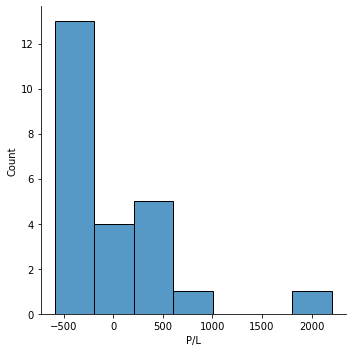

In [332]:
import seaborn as sns
sns.displot(y_test-pred)

## Polynomial Regression

In [275]:
from sklearn.tree import DecisionTreeRegressor 
from sklearn.preprocessing import PolynomialFeatures

In [286]:
max_degree = 1000

poly = PolynomialFeatures(degree=2 , include_bias=False)
x_poly = poly.fit_transform(X_train)
xt = poly.fit_transform(X_test)

In [287]:
model = LinearRegression()
model.fit(x_poly, y_train)
y_pred = model.predict(xt)

In [288]:
y_train

55      26.632139
17     332.824593
60      24.037297
62     117.544907
6      264.242033
56      69.807093
73     121.184873
4     1385.303867
33     362.100133
53     241.746173
28     444.119720
11     216.294647
57     128.277433
23     554.672200
10      81.950940
31     124.676780
43     370.137607
61      63.612994
1      328.563047
32     229.942753
75      13.523349
14     902.617067
54     347.476693
19     752.051400
29     639.216187
49     426.501633
24     799.170000
35      39.544943
18     523.420707
0      123.196607
78     101.108913
15      68.825747
5       99.624040
59     289.558700
16     180.904140
51      83.432387
20      70.940700
74     174.059207
8      769.911000
13     627.755400
25      75.101100
37     191.924033
46     101.888267
39     433.814500
65      19.482712
58     201.607880
12     398.710240
70      16.064561
36     104.250180
21     189.466700
9     1108.060800
76      35.163144
67      94.352487
64     266.901147
47     188.094200
44     533

In [289]:
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)

R2 score: 0.9775846331724232


In [280]:
y_test

30    10.486114
0     10.816222
22     8.027379
31     8.240966
18     6.382000
28     7.187765
10     9.879654
70    15.643892
4      7.046579
12     7.143033
49     8.617024
33     6.860035
67    12.264212
35     9.951711
68    11.544225
45    13.029163
Name: DeltaT, dtype: float64

In [281]:
y_pred


array([10.4715031 , 10.62839894,  8.13498078,  8.63671801,  6.03064402,
        7.14368007,  9.75414641, 15.49104413,  7.23412784,  6.9245741 ,
        8.53637991,  6.7964836 , 12.27592773, 10.04428243, 11.40870044,
       12.76440768])

In [290]:
testing = pd.read_csv("features.csv")
print(testing)
testing = np.array(testing)
testing = scaler.fit_transform(testing)
testing  = poly.fit_transform(testing)
yp = model.predict(testing)

     filling  PPI  Porosity
0       1.00    5      0.80
1       1.00   10      0.80
2       1.00   15      0.80
3       1.00   20      0.80
4       1.00   25      0.80
..       ...  ...       ...
595     0.25    5      0.95
596     0.25   10      0.95
597     0.25   15      0.95
598     0.25   20      0.95
599     0.25   25      0.95

[600 rows x 3 columns]


In [291]:
yp

array([ 1.93019822e+02,  4.43678872e+02,  7.24269542e+02,  1.03479183e+03,
        1.37524574e+03,  1.74857293e+02,  4.18233533e+02,  6.91541392e+02,
        9.94780869e+02,  1.32795197e+03,  1.66157812e+02,  4.05892646e+02,
        6.75559100e+02,  9.75157173e+02,  1.30468686e+03,  1.57712853e+02,
        3.93806283e+02,  6.59831331e+02,  9.55787998e+02,  1.28167628e+03,
        1.49522417e+02,  3.81974441e+02,  6.44358084e+02,  9.36673346e+02,
        1.25892023e+03,  1.41586503e+02,  3.70397122e+02,  6.29139360e+02,
        9.17813217e+02,  1.23641869e+03,  1.33905112e+02,  3.59074326e+02,
        6.14175158e+02,  8.99207609e+02,  1.21417168e+03,  1.26478243e+02,
        3.48006051e+02,  5.99465479e+02,  8.80856525e+02,  1.19217919e+03,
        1.19305896e+02,  3.37192299e+02,  5.85010321e+02,  8.62759962e+02,
        1.17044122e+03,  1.12388072e+02,  3.26633070e+02,  5.70809687e+02,
        8.44917922e+02,  1.14895778e+03,  1.05724770e+02,  3.16328363e+02,
        5.56863574e+02,  

In [193]:
yp =  pd.DataFrame(yp)

In [194]:
yp.to_excel('temp_1_inline-a.xlsx', index=False)

In [188]:
np.exp(yp)


array([inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf, inf,
       inf, inf, inf, inf, inf, inf, inf,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0

In [269]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from statsmodels.api import OLS



# Fit polynomial regression models and calculate BIC
bic_values = []
for degree in range(1, max_degree + 1):
    X_poly_subset = x_poly[:, :degree]  # Select polynomial features up to the current degree

    # Fit the model using scikit-learn
    model_sklearn = LinearRegression()
    model_sklearn.fit(X_poly_subset, y_train)

    # Calculate the residual sum of squares (RSS)
    rss = np.sum((model_sklearn.predict(X_poly_subset) - y_train) ** 2)

    # Calculate the number of parameters (including the intercept term)
    num_params = degree + 1  # degree + 1 for the intercept term

    # Calculate the BIC
    bic = len(X) * np.log(rss / len(X)) + num_params * np.log(len(X))
    bic_values.append(bic)

# Find the degree with the lowest BIC
best_degree = np.argmin(bic_values) + 1
best_bic = bic_values[best_degree - 1]

print("Best degree:", best_degree)
print("BIC:", best_bic)

Best degree: 198
BIC: -3413.949035014941


In [65]:
np.array(y_test).reshape(-1,1).shape

(16, 1)

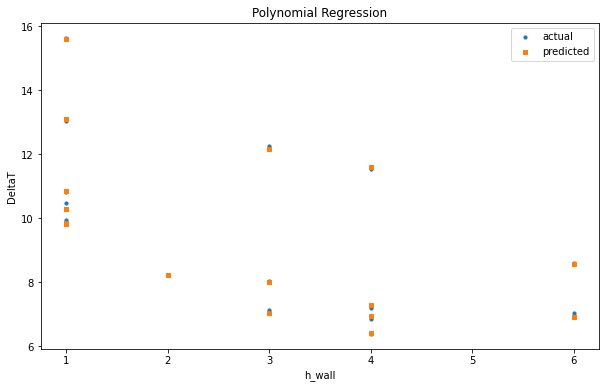

In [66]:

# Create a new plot
plt.figure(figsize=(10
                    , 6))

# Plot the data points
plt.scatter(np.array(X_test)[:,1], np.array(y_test).reshape(-1,1), s=10 , marker='o' , label='actual' )
plt.scatter(np.array(X_test)[:,1], np.array(y_pred).reshape(-1,1), s=10 ,marker='s' ,  label='predicted')
# Plot the regression line
#plt.plot((sorted_X_test), (sorted_y_pred), color='r')
plt.legend()
# Set the plot title and axis labels
plt.title('Polynomial Regression')
plt.xlabel('h_wall')
plt.ylabel('DeltaT')

# Show the plot
plt.show()

In [85]:
model = LinearRegression()
model.fit(X_test, y_test)
y_pred = model.predict(X_test)

In [86]:
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)

R2 score: 0.8612348142970546


In [87]:
X_scale =[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30]

In [88]:
y_test.shape

(30,)

In [89]:
y_pred

array([8.82615226, 8.26709085, 8.14707022, 9.44932816, 9.22570359,
       6.51758378, 8.8820584 , 6.74120835, 6.11803245, 9.00207903,
       6.96483291, 7.36438424, 6.6853022 , 7.21641055, 8.09116408,
       9.64499965, 8.00730487, 6.31370394, 7.10459827, 7.24436362,
       7.04869212, 7.69982109, 7.30026976, 8.43480927, 9.56114044,
       7.02073905, 8.93796454, 5.61487718, 7.47619653, 8.37890313])

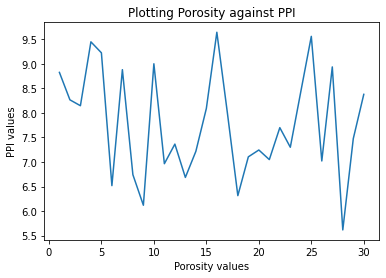

In [90]:
plt.plot(X_scale , y_pred)
plt.xlabel('Porosity values')
plt.ylabel('PPI values')
plt.title('Plotting Porosity against PPI')
plt.show()

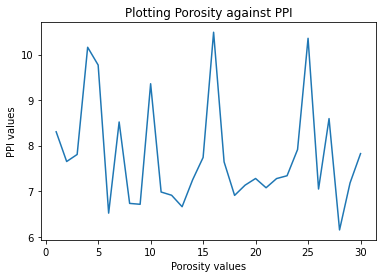

In [97]:
plt.plot(X_scale , y_test)
plt.xlabel('Porosity values')
plt.ylabel('PPI values')
plt.title('Plotting Porosity against PPI')
plt.show()

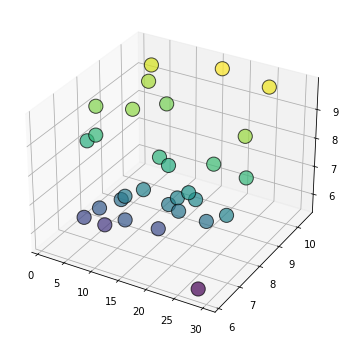

In [113]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_scale, y_test, y_pred,
           linewidths=1, alpha=.7,
           edgecolor='k',
           s = 200,
           c=y_pred)
plt.show()

In [114]:
np.array(y_pred[-10]).reshape(-1,1).shape

(1, 1)

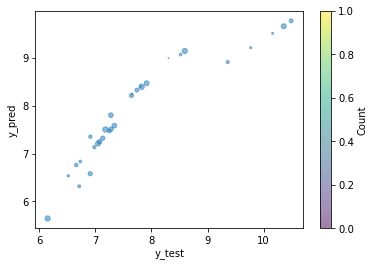

In [119]:
import matplotlib.pyplot as plt
import numpy as np

# Generate some random data


# Create a scatter plot
plt.scatter(np.array(y_test).reshape(-1,1), np.array(y_pred).reshape(-1,1), s=np.array(X_scale).reshape(-1,1), alpha=0.5)

# Add labels and a colorbar
plt.xlabel('y_test')
plt.ylabel('y_pred')
plt.colorbar(label='Count')

# Show the plot
plt.show()

Text(10.049999999999997, 0.5, 'Count')

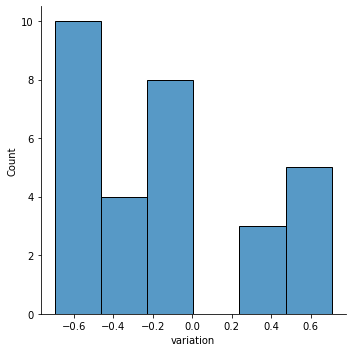

In [120]:
import seaborn as sns
sns.displot(y_test-y_pred)
plt.xlabel('variation')
plt.ylabel('Count')

## Ridge Regression

In [50]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

In [57]:
rd = Ridge(alpha=0.01)

In [58]:
rd.fit(X_train, y_train)

Ridge(alpha=0.01)

In [59]:
y_pred = rd.predict(X_test)

In [60]:
mse = mean_squared_error(y_test, y_pred)

In [61]:
print('accuracy is' ,100-mse)

accuracy is -8233.734375


In [62]:
r2 = r2_score(y_test, y_pred)
print("R2 score:", r2)

R2 score: 0.7489097486841676


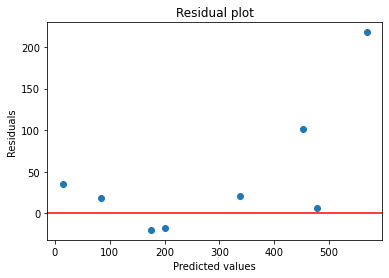

In [257]:
residuals = y_test - y_pred

# plot residuals against predicted values
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='-')
plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.title('Residual plot')
plt.show()

## curve fitting practise 

In [129]:
import numpy as np
from scipy.optimize import curve_fit

# Define the function to fit
def func(x, y , z ,a, b, c, d):
    return a * (b**x) * (c**y) * (d**z)

# Define the data points
xdata = np.array([1, 2, 3, 4, 5,6,7,8])
ydata = np.array([1.2, 2.4, 4.8, 9.6, 19.2,38.4,76.8,153.6])

# Perform the curve fit
popt, pcov = curve_fit(func, xdata, ydata)

# Print the optimized parameters
print('a =', popt[0])
print('b =', popt[1])
print('c =', popt[2])
print('d =', popt[3])

a = 1.0043568694166436
b = 1.034511260382111
c = 0.65206477482931
d = 2.0


In [130]:
import numpy as np
from scipy.optimize import curve_fit

def ln_func(x, a, x1, x2, x3):
    Re, Rib, wc, eps = x[:,0], x[:,1], x[:,2], x[:,3]
    return np.log(a * (Re ** x1) * ((Rib * wc) ** x2) * (eps ** x3))



data = np.array([[1000, 100, 0.5, 0.75, 3.2],
                 [2000, 100, 0.5, 0.75, 6.4],
                 [4000, 100, 0.5, 0.75, 12.8],
                 [8000, 100, 0.5, 0.75, 25.6],
                 [16000, 100, 0.5, 0.75, 51.2],
                 [32000, 100, 0.5, 0.75, 102.4],
                 [64000, 100, 0.5, 0.75, 204.8],
                 [128000, 100, 0.5, 0.75, 409.6]])

# Separate the inputs and outputs
xdata, ydata = data[:,:-1], data[:,-1]
print(ydata)

# Perform the curve fit
popt, pcov = curve_fit(ln_func, xdata, np.log(ydata))

# Extract the optimized values of the parameters
a_opt, x1_opt, x2_opt, x3_opt = np.exp(popt)

# Print the optimized values
print('a =', a_opt)
print('x =', x1_opt)
print('y =', x2_opt)
print('z =', x3_opt)

[  3.2   6.4  12.8  25.6  51.2 102.4 204.8 409.6]
a = 85.89099624375832
x = 2.718281828459045
y = 2.9059781978217907
z = 1.6868459529373136e+17


In [131]:
x  = X_train
y = y_train

In [132]:
y = np.array(y).reshape(-1,1)

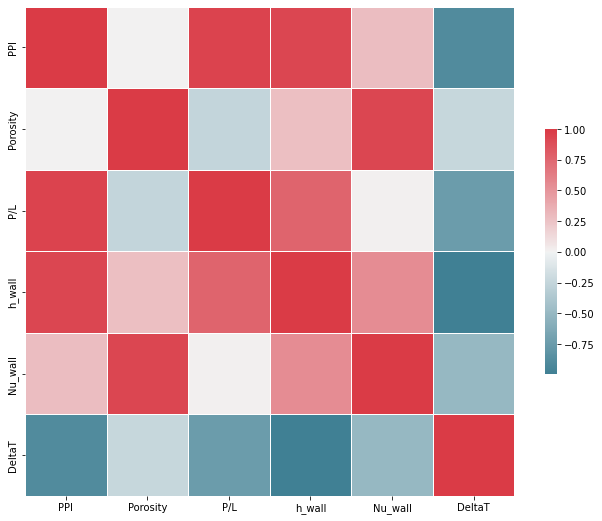

In [133]:
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_boston
from sklearn.linear_model import LinearRegression

# Load the Boston Housing dataset


# Convert to a pandas dataframe


# Compute the correlation matrix
corr_matrix = df.corr()

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, cmap=cmap, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
plt.show()